## TOC:
* [Reading CVS files](#first-bullet)
* [Luminosity section](#second-bullet)
* [Trigger rate section](#third-bullet)
* [Model inference section](#fourth-bullet)

In [1]:
import math
import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable

from scipy import ndimage, misc
import datetime
from datetime import timedelta

import keras
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Reshape, Conv1D, \
MaxPooling1D, AveragePooling1D, UpSampling1D, InputLayer

from scipy import ndimage, misc

from sklearn import svm
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import cross_val_score, train_test_split,\
StratifiedKFold, GridSearchCV
from sklearn.preprocessing import MaxAbsScaler
from sklearn.neighbors import LocalOutlierFactor

Using TensorFlow backend.


In [2]:
# Change presentation settings
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (15.0, 8.0)
matplotlib.rcParams["xtick.labelsize"] = 16
matplotlib.rcParams["ytick.labelsize"] = 16
matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.titlesize"] = 16
matplotlib.rcParams["figure.titlesize"] = 16
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["legend.fontsize"] = 14

In [3]:
runs = [306125, 319579 321312]
lumi_directory = data_directory = "./lumi"
rates_directory = "./rates"

# Reading cvs files <a class="anchor" id="first-bullet"></a>

Reading instantaneous luminosities from the cvs file produced with brilcalc and saving into a pandas dataframe:

In [4]:
df_rates = pd.DataFrame()
int_lumi2 = pd.DataFrame()
for run in runs:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered",\
               "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4",\
               "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 306125
Loading 321312
Done.


# Luminosity section <a class="anchor" id="second-bullet"></a>

Dropping useless rows inherited from the lumi CVS file:

In [5]:
int_lumi2["source"] = int_lumi2["source"].astype('str')
int_lumi2 = int_lumi2[int_lumi2["source"] != "nan"]
int_lumi2 = int_lumi2[int_lumi2["source"] != "source"]

Splitting run:fill field and the start and end lumi sections:

In [6]:
int_lumi2['run'], int_lumi2['fill'] = int_lumi2['runfill'].str.split(':', 1).str
int_lumi2['ls_start'], int_lumi2['ls_end'] = int_lumi2['ls'].str.split(':', 1).str

Converting run to integer and luminosities to float:

In [7]:
int_lumi2["run"] = int_lumi2["run"].astype('int')
int_lumi2["ls_start"] = int_lumi2["ls_start"].astype('int')
int_lumi2["ls_end"] = int_lumi2["ls_end"].astype('int')
int_lumi2["delivered"] = int_lumi2["delivered"].astype('float64')
int_lumi2["recorded"] = int_lumi2["recorded"].astype('float64') 

Converting time stamp to datetime:

In [8]:
def transform_time(data):
    from datetime import datetime
    time_str = data.time
    #print time_str
    datetime_object = datetime.strptime(time_str, "%m/%d/%y %H:%M:%S")
    #print datetime_object
    return datetime_object
int_lumi2["time"] = int_lumi2.apply(transform_time, axis=1);

Creating end time column from the start time:

In [9]:
int_lumi2["time_end"] = int_lumi2["time"]

Finding the runs and their start and end times:

In [10]:
boundaries = pd.DataFrame(columns=["run", "start", "end", "ls_start", "ls_end", "nLS"])
for i in runs:
    start = int_lumi2[int_lumi2["run"] == i]["time"]
    end = int_lumi2[int_lumi2["run"] == i]["time_end"]
    start_ls = int_lumi2[int_lumi2["run"] == i]["ls_start"]
    end_ls = int_lumi2[int_lumi2["run"] == i]["ls_end"]
    start =  start.reset_index(drop=True)
    end =  end.reset_index(drop=True)
    start_ls =  start_ls.reset_index(drop=True)
    end_ls =  end_ls.reset_index(drop=True)
    nLS = int(start_ls.iloc[-1]) - int(start_ls.iloc[0]) + 1
    print i, start.iloc[0], start.iloc[-1], start_ls.iloc[0], start_ls.iloc[-1], nLS
    boundaries = boundaries.append({"run": i, "start": start.iloc[0], "end": start.iloc[-1], 
                                   "ls_start": start_ls.iloc[0], "ls_end": start_ls.iloc[-1], "nLS": nLS}, 
                                   ignore_index = True)

306125 2017-11-03 14:46:12 2017-11-04 10:14:06 1 3007 3007
321312 2018-08-15 20:55:17 2018-08-16 01:55:14 1 773 773


Reindexing the dataframe after removing some lines:

In [11]:
int_lumi2.index = pd.RangeIndex(len(int_lumi2.index))

In [12]:
print len(int_lumi2.index)

3780


Filling end time column:

In [13]:
def addTimeOffSet(startdate):
    enddate = pd.to_datetime(startdate) + pd.DateOffset(seconds=23)
    return enddate

def shiftElement(df, boundaries):
    run0 = boundaries["run"].iloc[0]
    for index, rows in df.iterrows():
        run = rows["run"]
        nls = int(boundaries[boundaries["run"] == run]["nLS"])
        if(run > run0):
            nls = nls + index
        #print run, nls
        if((index < nls) & (index < len(int_lumi2.index)-1)):
            #print index, run, rows["time"], df["time"][index+1]
            df.loc[index, "time_end"] = df["time"][index+1]
        elif (index == len(int_lumi2.index)-1):
            #print index, run, rows["time"], addTimeOffSet(rows["time"])
            df.loc[index, "time_end"] = addTimeOffSet(rows["time"])
                    
shiftElement(int_lumi2, boundaries)

In [14]:
#print int_lumi2["beamstatus"]
int_lumi2 = int_lumi2[int_lumi2["beamstatus"] == "STABLE BEAMS"]

Plotting the instantaneous luminosities:

In [15]:
def plot_inst_lumi(x_val, y_val, z_val, title):
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel(r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]")
    xfmt = mdates.DateFormatter('%y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(x_val, y_val, 'ro-')
    plt.plot(x_val, z_val, 'bo-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

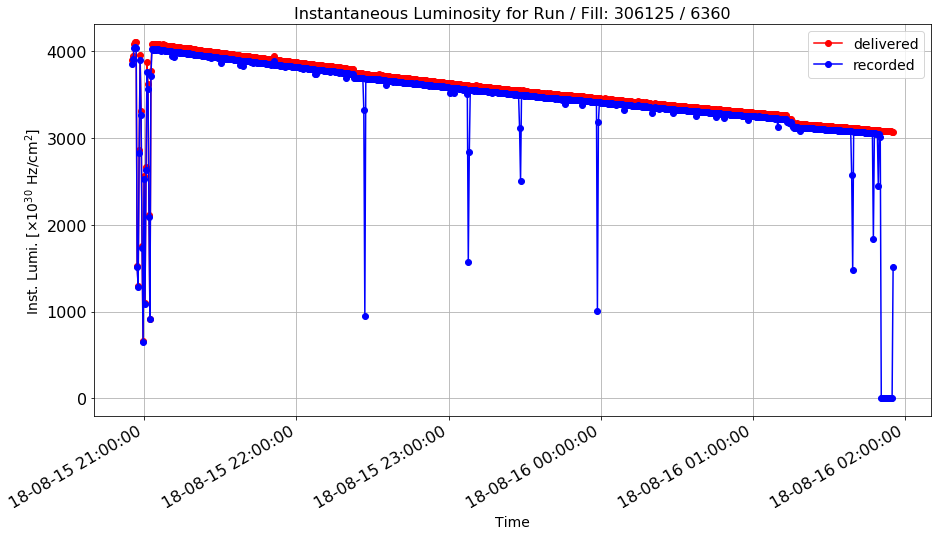

In [19]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 321312]["time"], 
               int_lumi2[int_lumi2["run"] == 321312]["delivered"], 
               int_lumi2[int_lumi2["run"] == 321312]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[0], int_lumi2["fill"].iloc[0])))

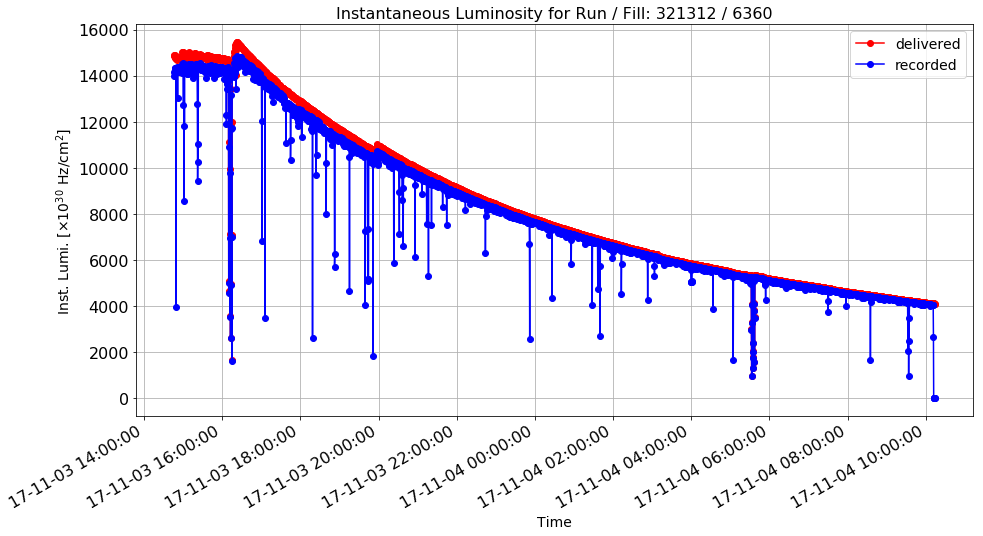

In [17]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 306125]["time"], 
               int_lumi2[int_lumi2["run"] == 306125]["delivered"], 
               int_lumi2[int_lumi2["run"] == 306125]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[1], int_lumi2["fill"].iloc[0])))

In [20]:
#int_lumi2.to_csv("int_lumi_issues.csv", sep='\t')

# Trigger rate section <a class="anchor" id="third-bullet"></a>

Converting columns to proper data types:

In [21]:
df_rates["time"] = pd.to_datetime(df_rates["time"])
df_rates["run"] = df_rates["run"].astype('int')
#print df_rates["time"]

Splitting, converting and adding new columns:

In [51]:
df_rates["board"].replace(regex=True,inplace=True,to_replace=r'm',value=r'-')
df_rates["board"].replace(regex=True,inplace=True,to_replace=r'p',value=r'+')
df_rates['wheel'], df_rates['sector'] = df_rates['board'].str.split('_', 1).str
df_rates["wheel"] = df_rates["wheel"].astype(str)
df_rates["sector"] = df_rates["sector"].astype(str)

In [53]:
df_rates["wheel"].replace(regex=True,inplace=True,to_replace=r'YB',value=r'')
df_rates["sector"].replace(regex=True,inplace=True,to_replace=r'S',value=r'')
df_rates["wheel"] = df_rates["wheel"].astype('int')
df_rates["sector"] = df_rates["sector"].astype('int')
df_rates["ls"] = -1
df_rates["lumi"] = -1.0
df_rates["score"] = -1
#df_rates.to_csv("df_rates.csv", sep='\t')

Plotting the rate coming from one of the stations:

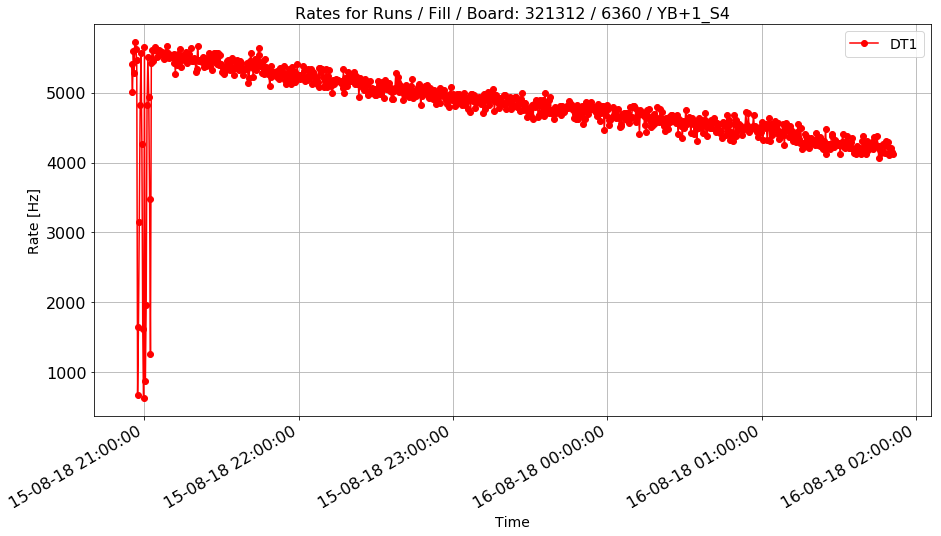

In [57]:
def plot_rate_vs_time(df, x_val, y_val, z_val, title):
    df_temp = df.copy()
    crit = df_temp["board"] == z_val
    df_temp = df_temp[crit]
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel("Rate [Hz]")
    ax.xaxis_date()
    xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(df_temp[x_val], df_temp[y_val], 'ro-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

plot_rate_vs_time(df_rates[df_rates.run == 321312], "time", "DT1",\
                  "YB+1_S4", "Rates for Runs / Fill / Board: %s / %s / %s" % \
                  ("321312", int_lumi2["fill"].iloc[2], "YB+1_S4"))

Associating a LS and an instantaneous luminosity to each rate:

In [58]:
#Just a backup copy
df_rates_backup = df_rates.copy()

In [59]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Removing the measurements taken before and after the start and end time reported by the brilcalc output. All the 60 boards are measured at the same time. In order to speed-up the association, we take just one board, the first one. This reduces the dataframe and the time needed to go though it by a factor of 60.

In [60]:
time0 = boundaries["start"].iloc[0]
timeF = boundaries["end"].iloc[-1]
print time0, timeF
#print df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
df_rates = df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
rule = df_rates.duplicated(subset=["time"])
count = (rule == False).sum()
print "Duplicates:", rule.sum()
df_rates_noduplicates = df_rates[rule == False]
#print df_rates_noduplicates

2017-11-03 14:46:12 2018-08-16 01:55:14
Duplicates: 1332751


In [61]:
print len(df_rates_noduplicates)

22589


Assigning the LS and the inst. lumi. to the measurements for the selected board:

In [62]:
def assignLS(df1, df2, boundaries):
    temp = df1.copy()
    j = 1
    for index1, row1 in df1.iterrows():
        run1 = row1["run"]
        time1 = row1["time"]
        #print index1, run1, time1
        ti = time1 - 2*pd.DateOffset(seconds=23)
        tf = time1 + 2*pd.DateOffset(seconds=23)
        indexes2 = df2[(df2.run == run1) & (df2.time > ti) & (df2.time < tf)].index
        #print indexes2
        for i in indexes2:
            if((time1 >= df2["time"].loc[i]) & (time1 < df2["time_end"].loc[i])):
                #print time1, df2["time"].loc[i], df2["time_end"].loc[i]
                if(j%1000 == 0): 
                    print j
                j = j + 1
                ls = df2["ls_start"].loc[i]
                lumi = df2["delivered"].loc[i]
                #print index1, run1, time1, ls, lumi
                temp.loc[index1, "ls"] = ls
                temp.loc[index1, "lumi"] = lumi
                break
    return temp

temp = assignLS(df_rates_noduplicates, int_lumi2, boundaries)
df_rates_noduplicates = temp

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000


Removing the few cases not assigned and that are still at -1:

In [63]:
df_rates_noduplicates = df_rates_noduplicates[df_rates_noduplicates["ls"] > 0]
print len(df_rates_noduplicates)

22588


Save in a csv file:

In [64]:
#df_rates.to_csv("df_rates_issues.csv", sep='\t')
#df_rates_noduplicates.to_csv("df_rates_nodup_issues.csv", sep='\t')

In [65]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Assign the LS and the inst. lumi. to all the 60 boards for each time:

In [66]:
def assignLS_ext(df1, df2):
    temp = df1.copy()
    indexes = []
    for index in df2.index:
        if index%10000 == 0:
            print index
        time = df2["time"].loc[index]
        ls = df2["ls"].loc[index]
        lumi = df2["lumi"].loc[index]
        des = (temp["time"] == time)
        indexes = temp[des].index
        #print time, ls, indexes
        temp.loc[des, "ls"] = ls
        temp.loc[des, "lumi"] = lumi
    return temp
    
temp = assignLS_ext(df_rates, df_rates_noduplicates)

30000
60000
90000
120000
150000
180000
210000
240000
270000
300000
330000
360000
390000
420000
450000
480000
510000
540000
570000
600000
630000
660000
690000
720000
750000
780000
810000
840000
870000
900000
930000
960000
990000
1020000
1050000
1080000
1110000
1140000
1170000
1200000
1230000
1260000
1290000
1320000
1350000


Save another backup copy:

In [67]:
df_rates = temp.copy()
#print df_rates[df_rates.ls <= 0]

Removing measurements without LS assignment:

In [68]:
df_rates_backup = df_rates.copy()
df_rates = df_rates[df_rates.ls > 0]
#print df_rates["ls"]

In [69]:
#print df_rates[df_rates.ls <= 0]
#df_rates.to_csv("df_rates_issues.csv", sep='\t')

Averaging the rates associated to the same LS:

In [70]:
df_boards = df_rates.copy()
df_boards = df_boards.groupby(['board']).size().reset_index(name='counts')
print len(df_boards)
#print df_boards

60


Too slow to use all the measurements. Averaging over 10 LS:

In [71]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

In [72]:
bunch = 10
def assignGroup(data, div = bunch):
    res = int(data/div)
    #print data, res
    return res

df_rates["group"] = df_rates["ls"]
df_rates["group"] = df_rates["group"].apply(assignGroup)

In [73]:
temp1 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["ls", "lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].mean().reset_index()

temp2 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].std().reset_index()

temp3 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]]\
.size().reset_index(name='counts')

temp2 = temp2.rename(index=str, columns={"lumi": "errLumi", "RPC1": "errRPC1", "RPC2": "errRPC2",\
                                         "RPC3": "errRPC3", "RPC4": "errRPC4", "DT1": "errDT1",\
                                         "DT2": "errDT2", "DT3": "errDT3",\
                                         "DT4": "errDT4", "DT5": "errDT5"})

cols_to_use2 = temp2.columns.difference(temp1.columns)
cols_to_use3 = temp3.columns.difference(temp1.columns)

temp2 = temp2[cols_to_use2]
temp3 = temp3[cols_to_use3]

#print temp1.iloc[100]
#print temp2.iloc[100]
#print temp3.iloc[100]

temp1.reset_index(drop=True, inplace=True)
temp2.reset_index(drop=True, inplace=True)
temp3.reset_index(drop=True, inplace=True)

df_rates = pd.concat([temp1, temp2, temp3], axis = 1)

Calculating the errors on the mean values calculated in the previous step:

In [74]:
import math
def applySqrt(data):
    return math.sqrt(data)

df_rates["counts"] = df_rates["counts"].apply(applySqrt)

for i in list(df_rates):
    if "err" in i:
        #print i
        df_rates[i] = df_rates[i]/df_rates["counts"]

Check for null or NaN values:

In [75]:
print df_rates.isnull().values.any()
null_columns=df_rates.columns[df_rates.isnull().any()]
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())
df_rates = df_rates.fillna(0)
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())

False
Empty DataFrame
Columns: []
Index: []
Empty DataFrame
Columns: []
Index: []


In [76]:
#Another backup
#df_rates_backup = df_rates.copy()
#df_rates.to_csv("df_rates_issues.csv", sep='\t')

In [77]:
#Restore backup
#df_rates = df_rates_backup.copy()

In [78]:
print len(df_rates)

22680


Uncomment to check just one case:

In [79]:
#for index, row in df_rates.iterrows():
    #if row["board"] == "YB0_S1":
        #print "Index:", index,", Run:", row["run"],", Board: ",row["board"],",\
        #LS: ",row["ls"],", Rate: ",row["DT1"],", Error: ",row["errDT1"]

Plotting the result:

In [207]:
def plot_ratio_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    inter = []
    errors = []
    df_temp["ratio"] = df_temp[y_val]/df_temp[x_val]
    df_temp["errRatio"] = (1/df_temp[x_val])*\
    np.sqrt(df_temp[y_err]**2 + df_temp["errLumi"]**2*df_temp["ratio"]**2)
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        if (run[i] == 306125):
            rule = rule & (df_temp.lumi > 6000)
        val1 = df_temp[rule][x_val]
        val2 = df_temp[rule]["ratio"]
        inter.append(np.polyfit(val1, val2, 0)) #append anomalous fit,\
                                                #then normal fit, and ratio of the two
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        errors.append(df_temp[rule]["errRatio"])
        #plt.plot(df_temp[rule][x_val], df_temp[rule]["ratio"], opt[i], label=str(run[i]))
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["ratio"], xerr=x_err,\
        yerr=df_temp[rule]["errRatio"], fmt=opt[i], ecolor=newstr, label=str(run[i]))
    a, b, c = inter[0], inter[1], 1-inter[0]/inter[1]
    plt.legend(loc="best")
    plt.title(title)
    plt.show()
    return float(a), float(b), float(c)

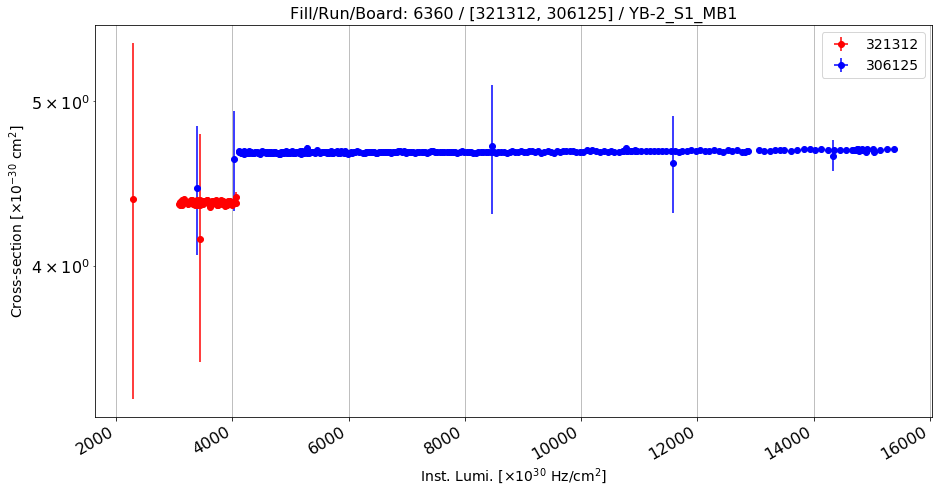

Anomalous CS: 4.35723263091 , Normal CS: 4.67288101215 , Ratio: 0.0675489875331


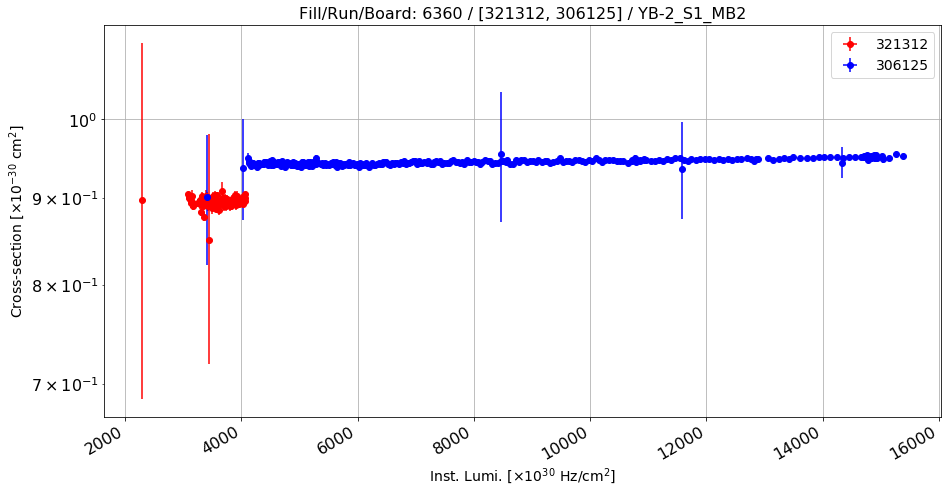

Anomalous CS: 0.894757729293 , Normal CS: 0.946096324341 , Ratio: 0.0542636026881


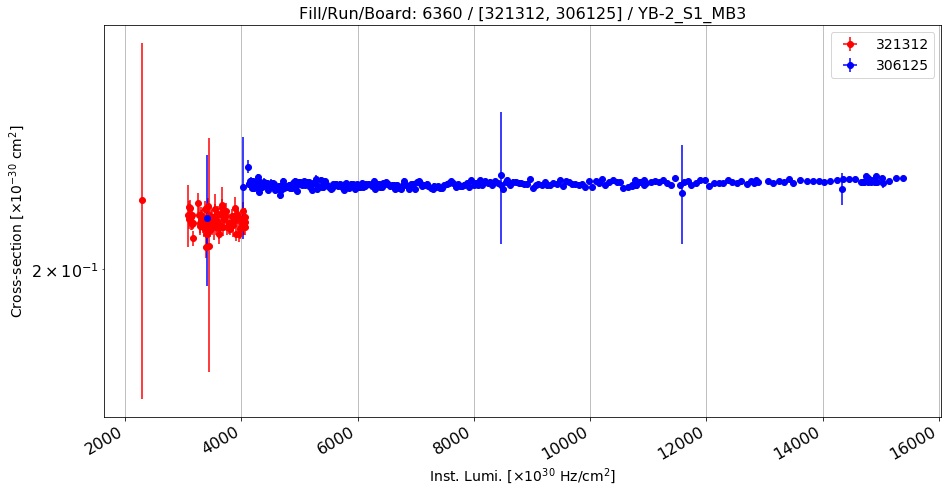

Anomalous CS: 0.21329279857 , Normal CS: 0.224153891914 , Ratio: 0.0484537352962


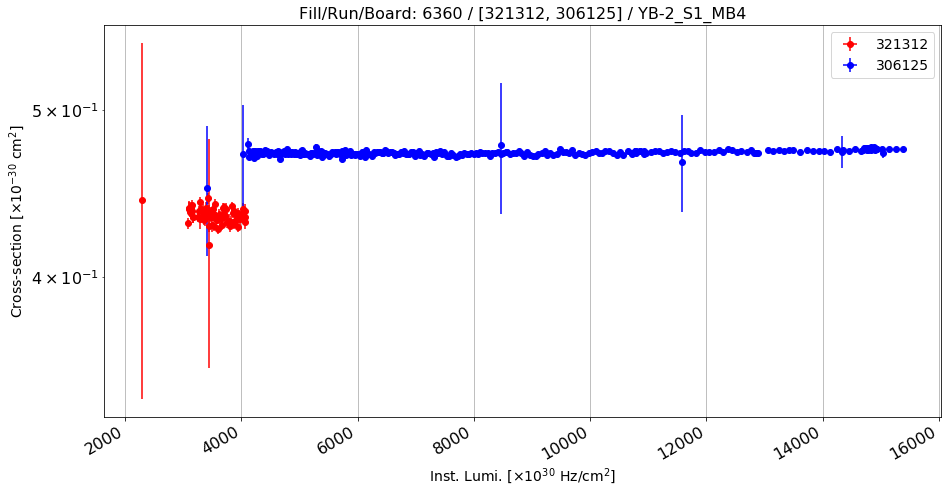

Anomalous CS: 0.434138584567 , Normal CS: 0.472515792172 , Ratio: 0.0812188888512


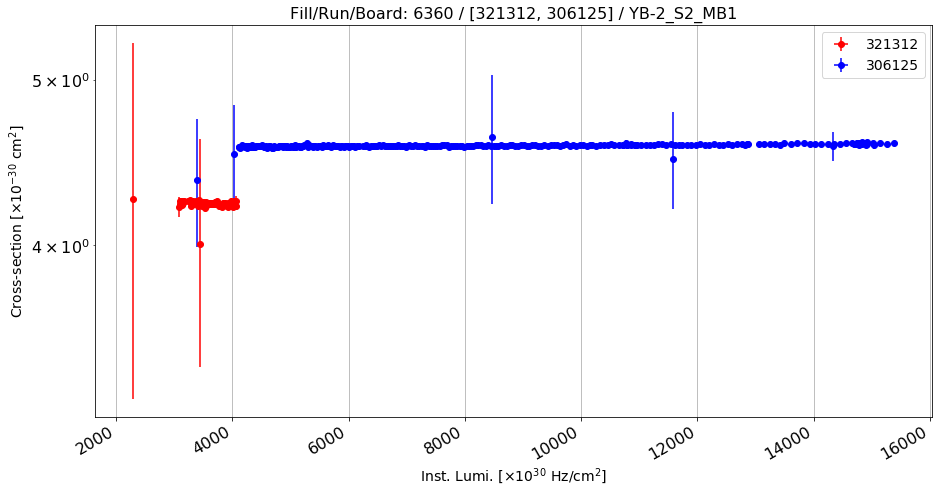

Anomalous CS: 4.23073401913 , Normal CS: 4.58097948331 , Ratio: 0.0764564577204


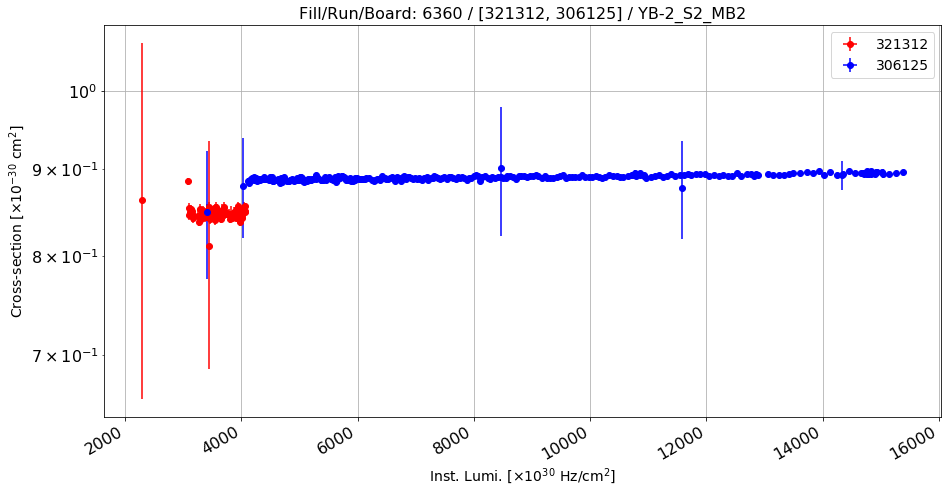

Anomalous CS: 0.847368513667 , Normal CS: 0.890911268504 , Ratio: 0.0488744012742


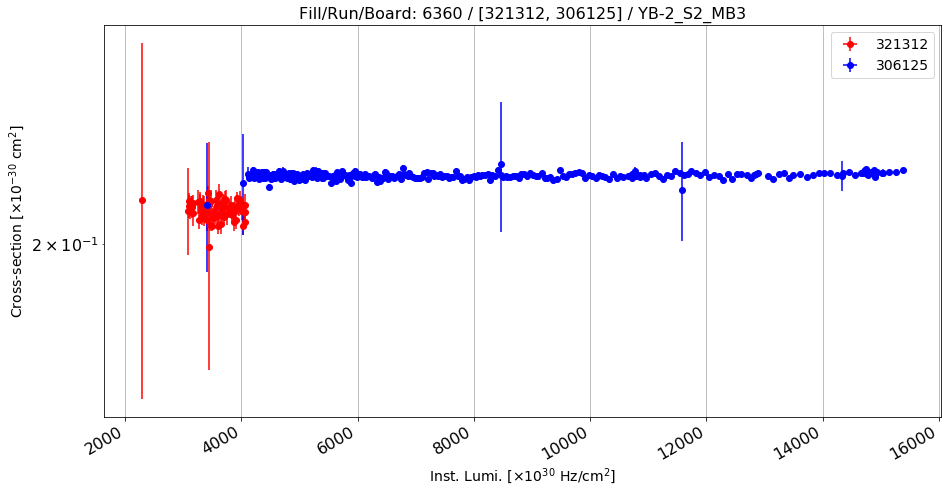

Anomalous CS: 0.2093581777 , Normal CS: 0.219330596571 , Ratio: 0.0454675226643


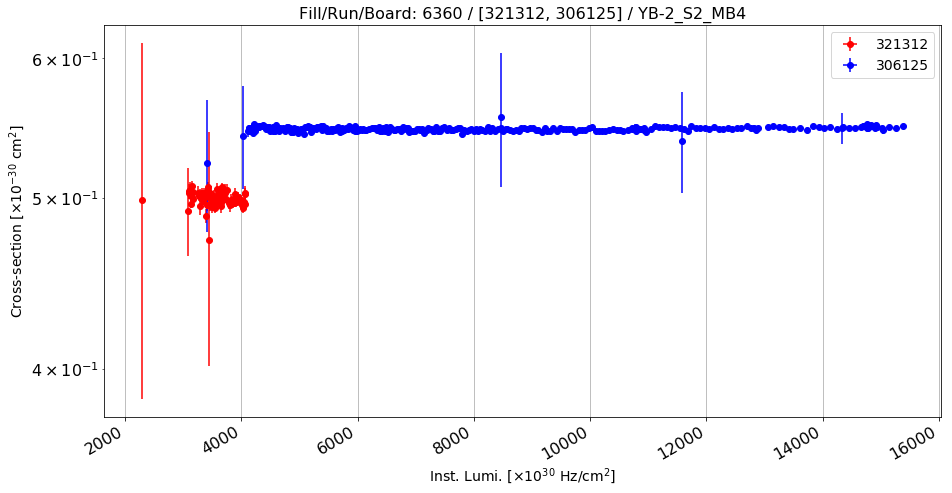

Anomalous CS: 0.499663680212 , Normal CS: 0.547290440268 , Ratio: 0.0870228247218


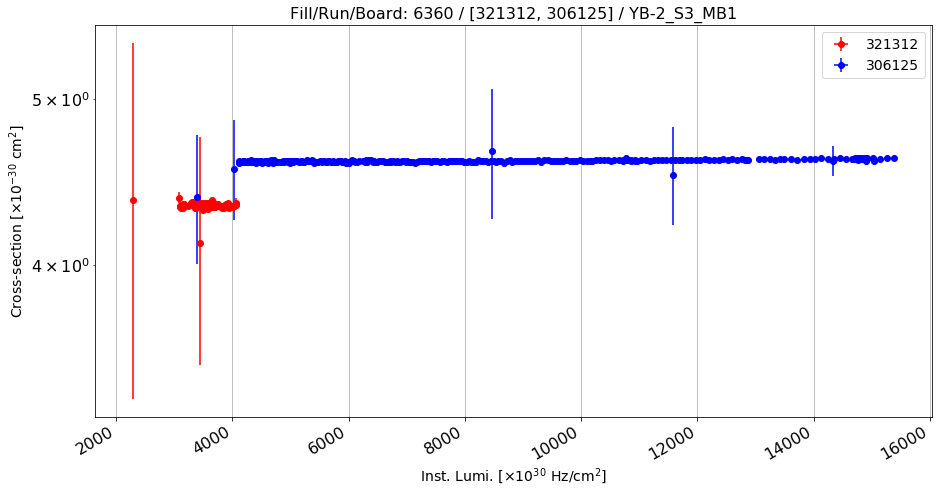

Anomalous CS: 4.33167821179 , Normal CS: 4.60367821508 , Ratio: 0.0590831918689


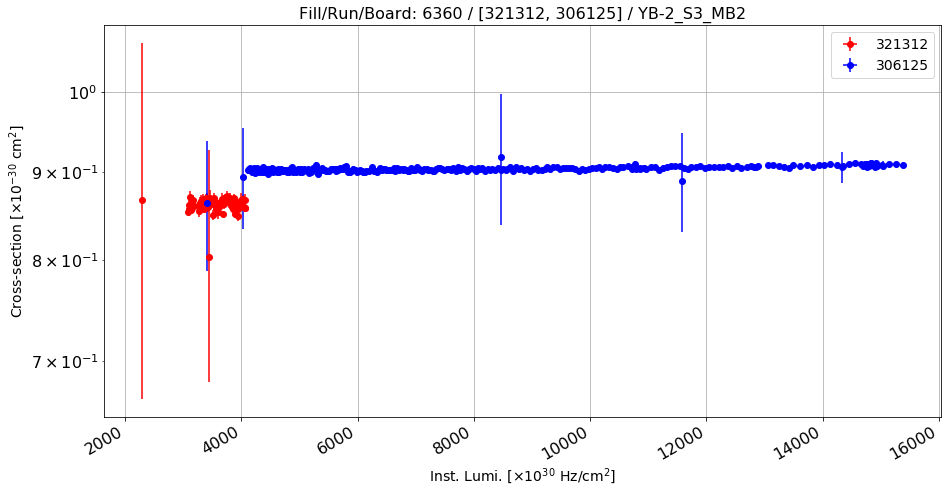

Anomalous CS: 0.861123727894 , Normal CS: 0.904406392301 , Ratio: 0.0478575392389


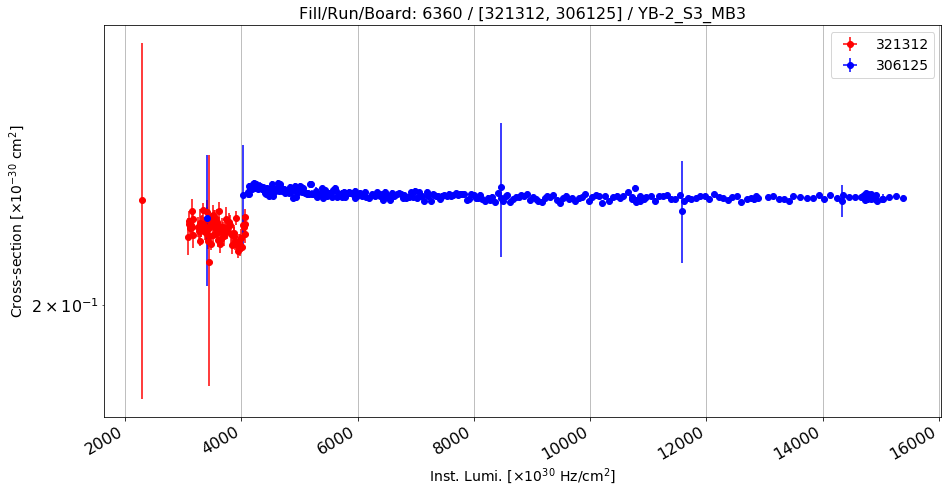

Anomalous CS: 0.220447315653 , Normal CS: 0.229879839999 , Ratio: 0.0410324121786


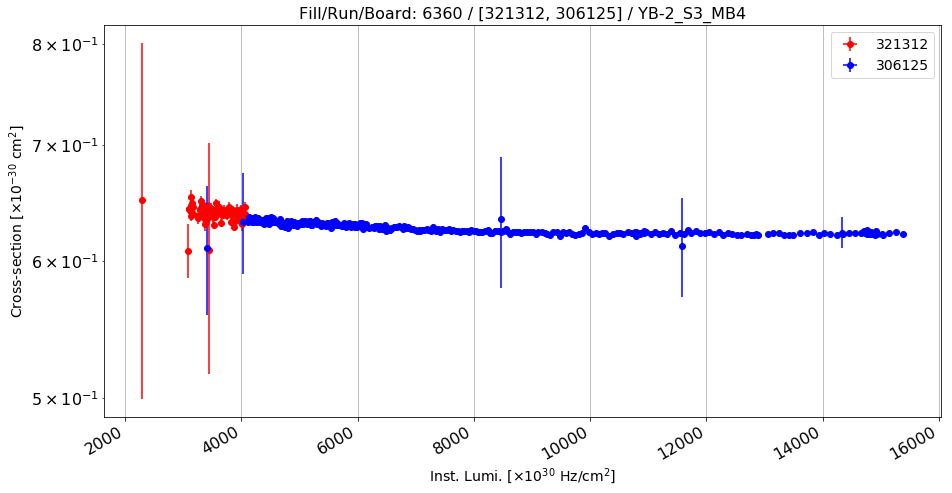

Anomalous CS: 0.638954367192 , Normal CS: 0.623741031998 , Ratio: -0.0243904672181


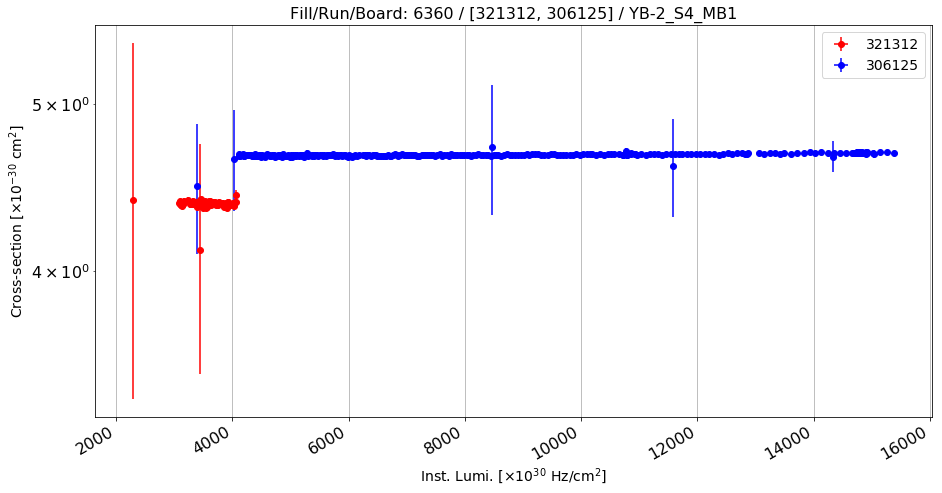

Anomalous CS: 4.37533051546 , Normal CS: 4.67566411273 , Ratio: 0.0642333559532


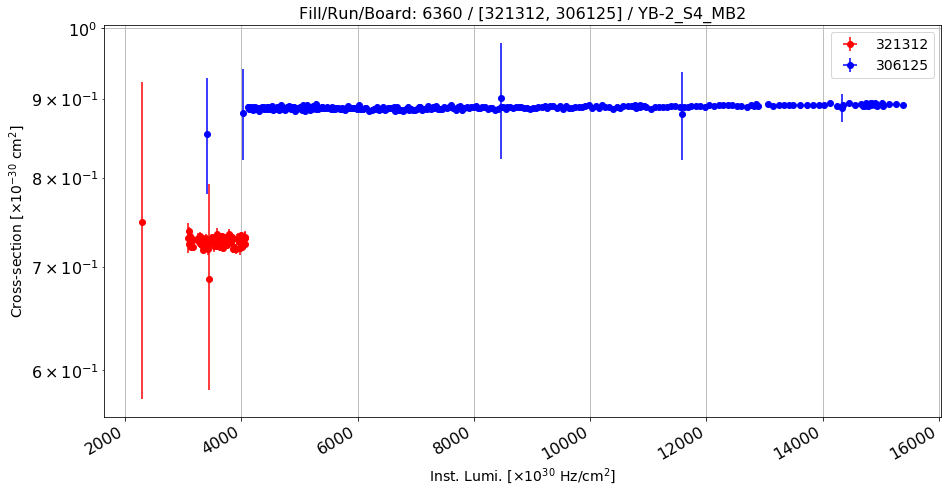

Anomalous CS: 0.726801894773 , Normal CS: 0.889533033675 , Ratio: 0.182939961465


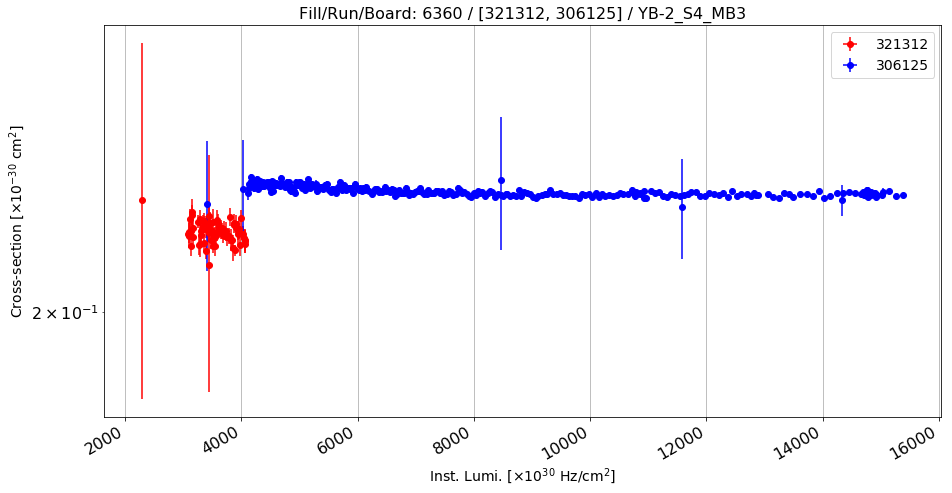

Anomalous CS: 0.221916407971 , Normal CS: 0.233172985407 , Ratio: 0.0482756500155


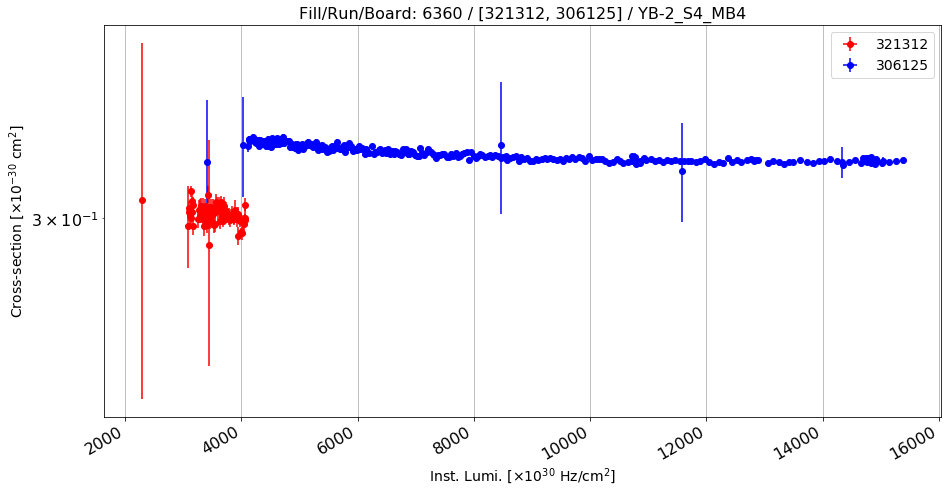

Anomalous CS: 0.301506999649 , Normal CS: 0.325054190532 , Ratio: 0.0724408162365


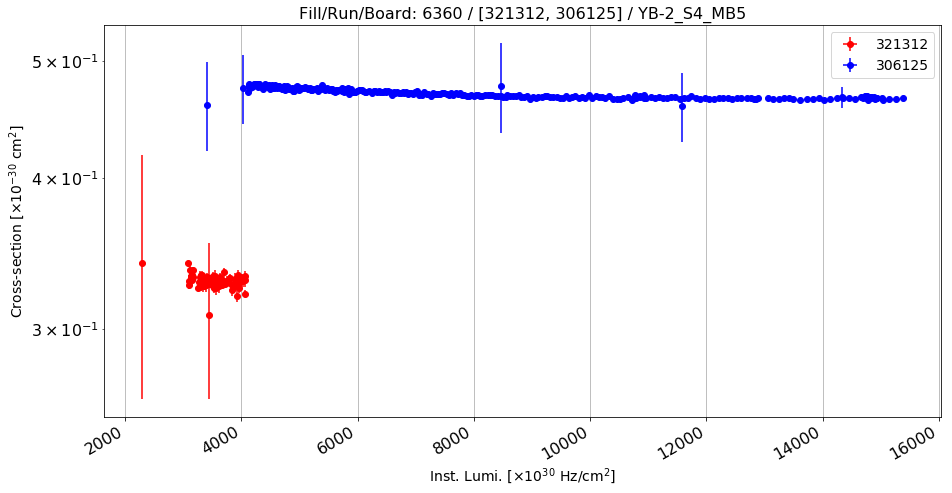

Anomalous CS: 0.32861151174 , Normal CS: 0.46754293734 , Ratio: 0.297152228179


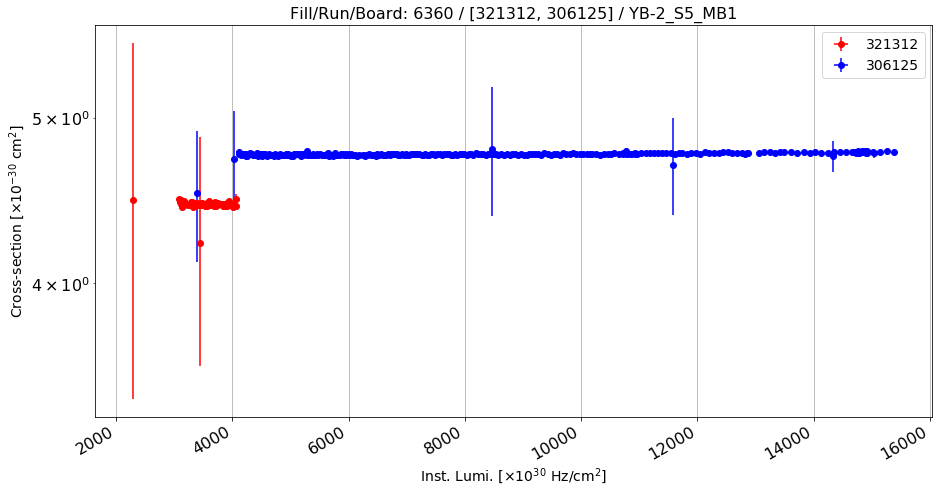

Anomalous CS: 4.44788926305 , Normal CS: 4.76299118019 , Ratio: 0.0661563091808


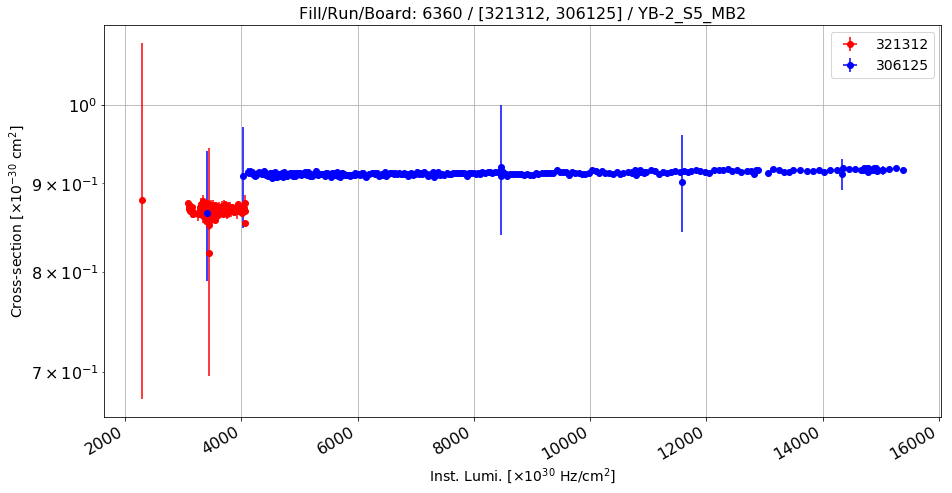

Anomalous CS: 0.868190339299 , Normal CS: 0.913571751314 , Ratio: 0.0496747102238


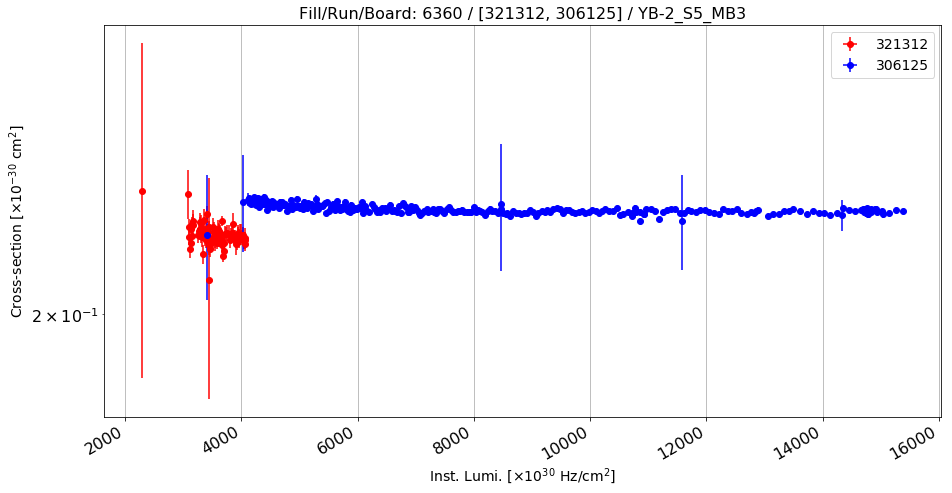

Anomalous CS: 0.222923979416 , Normal CS: 0.230239933228 , Ratio: 0.0317753471757


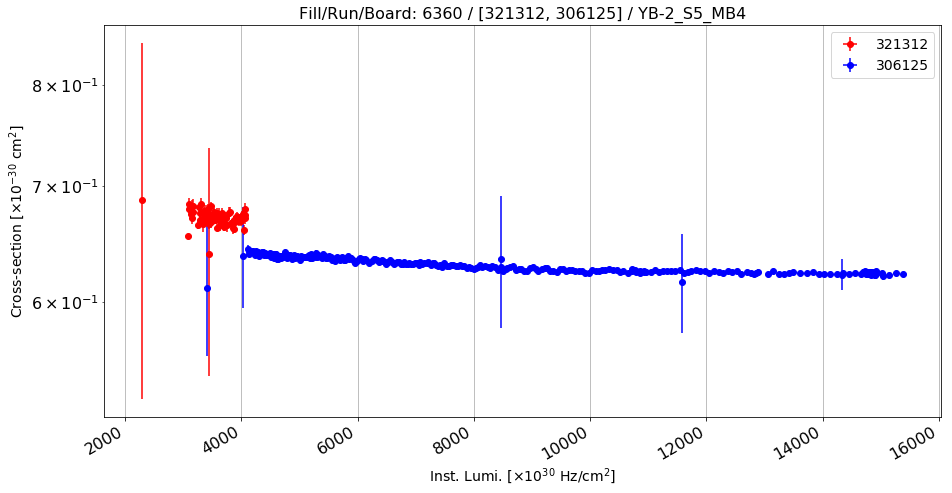

Anomalous CS: 0.671285994025 , Normal CS: 0.627044150887 , Ratio: -0.0705561850386


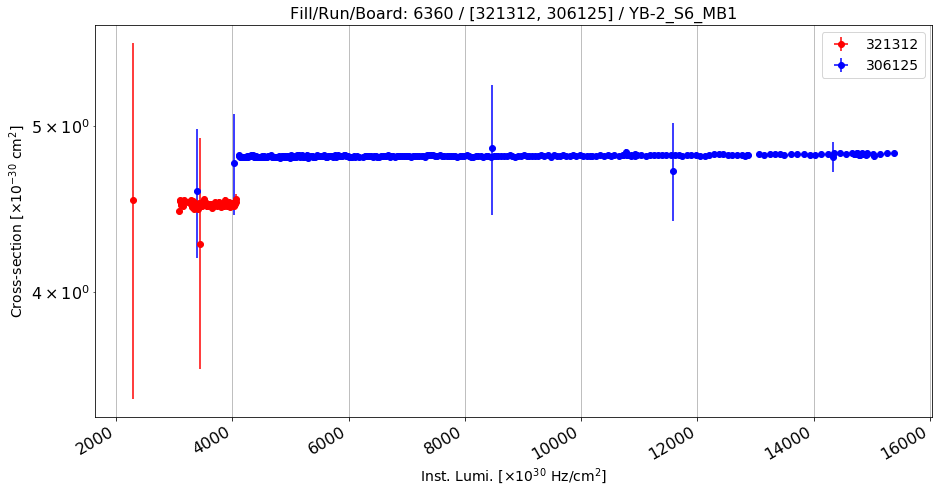

Anomalous CS: 4.49946511748 , Normal CS: 4.80689256765 , Ratio: 0.0639555483817


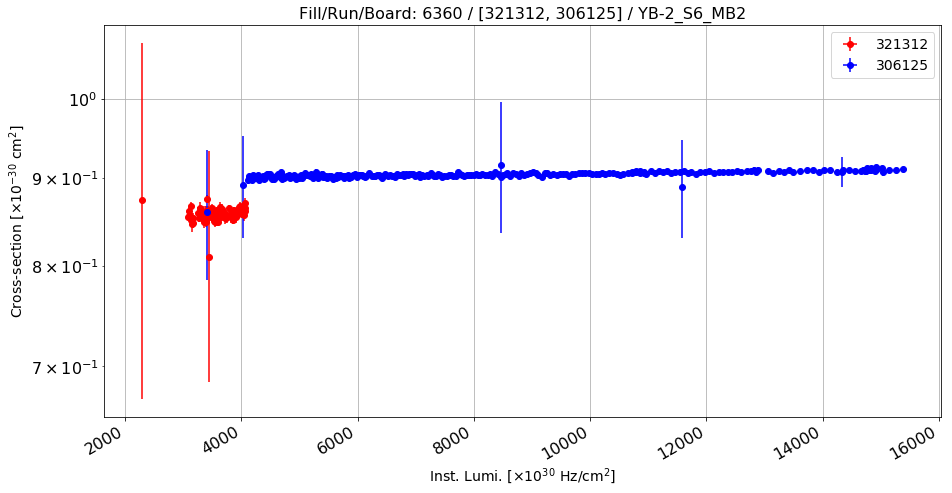

Anomalous CS: 0.857118431303 , Normal CS: 0.905745923434 , Ratio: 0.0536877847008


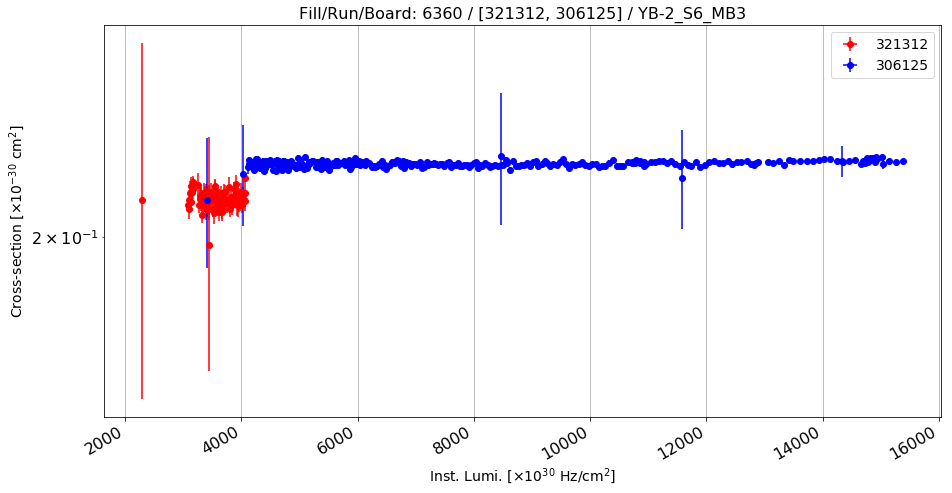

Anomalous CS: 0.210341455671 , Normal CS: 0.220512352445 , Ratio: 0.0461239321101


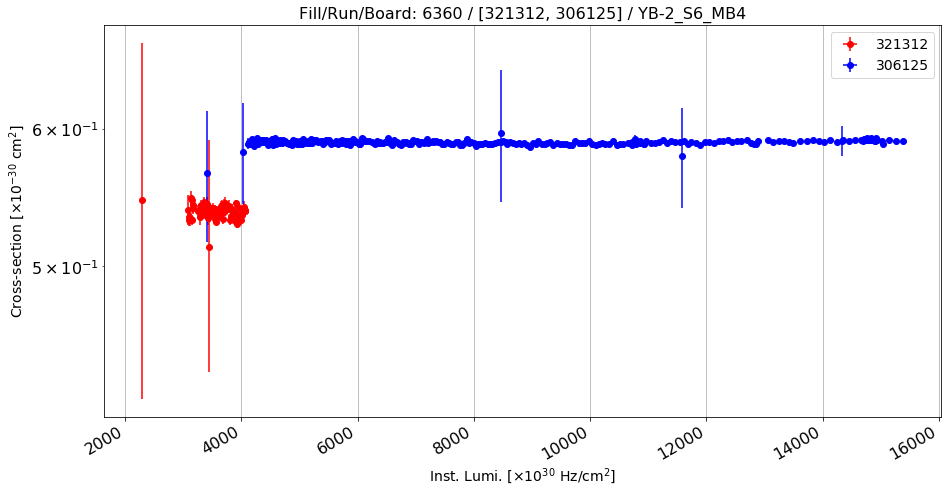

Anomalous CS: 0.53746011155 , Normal CS: 0.589434169642 , Ratio: 0.088176187891


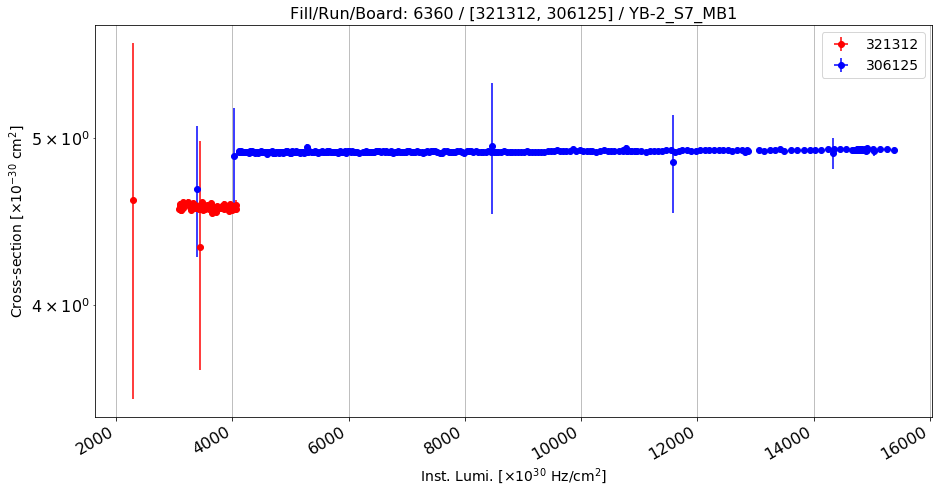

Anomalous CS: 4.55499636047 , Normal CS: 4.91392360933 , Ratio: 0.0730429036743


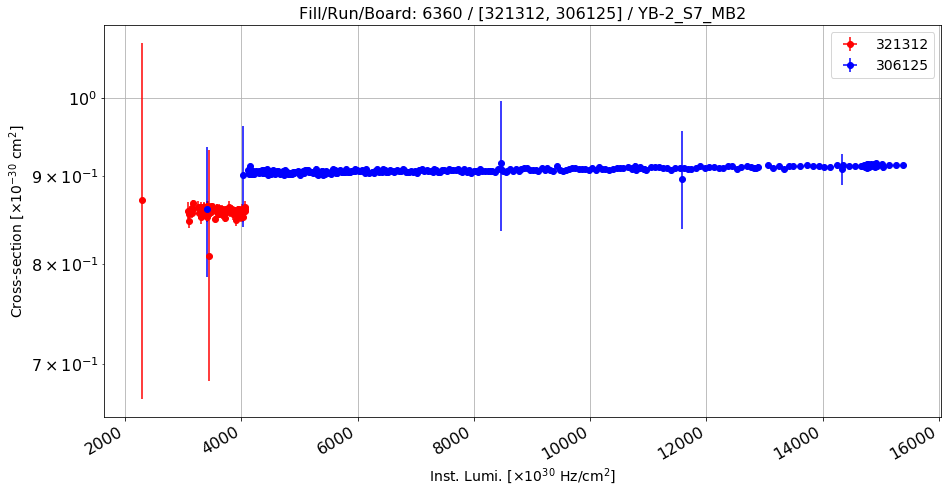

Anomalous CS: 0.858152822534 , Normal CS: 0.9090082869 , Ratio: 0.0559460954307


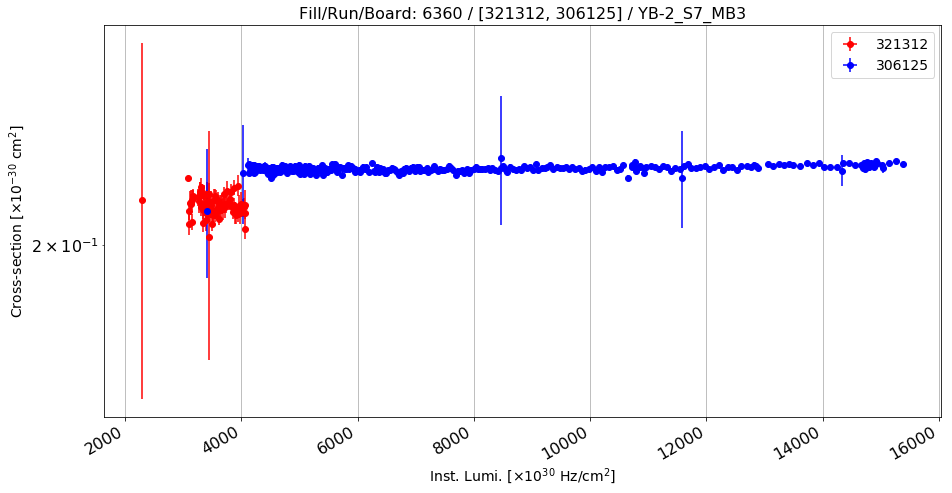

Anomalous CS: 0.211015521977 , Normal CS: 0.221943303401 , Ratio: 0.0492368152413


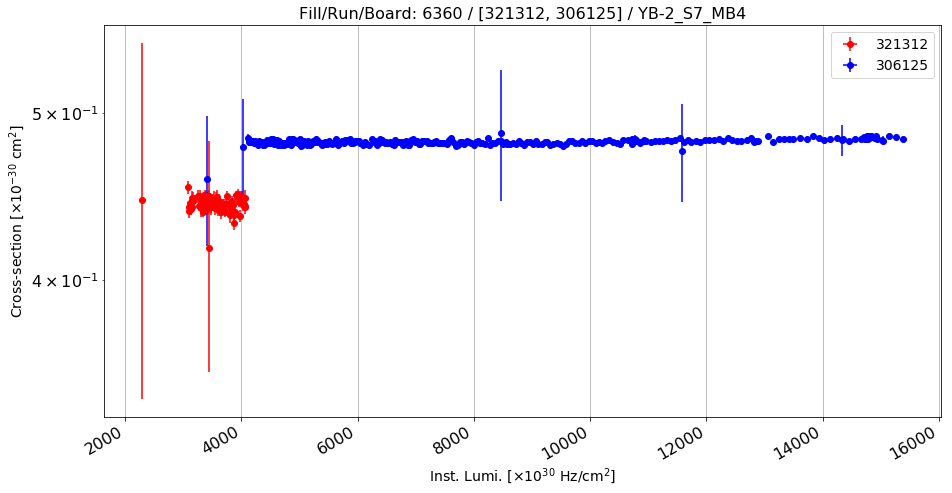

Anomalous CS: 0.44274325285 , Normal CS: 0.481588998927 , Ratio: 0.0806616142878


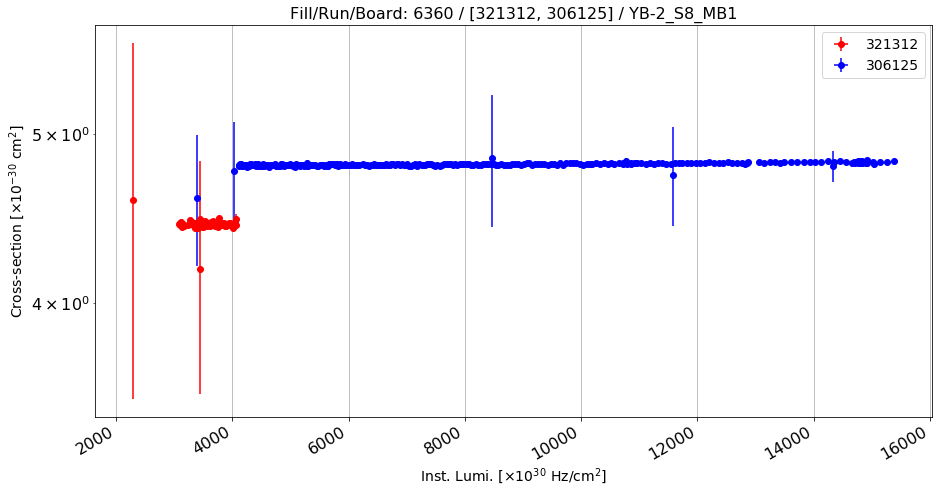

Anomalous CS: 4.43657419931 , Normal CS: 4.80820818064 , Ratio: 0.0772915746088


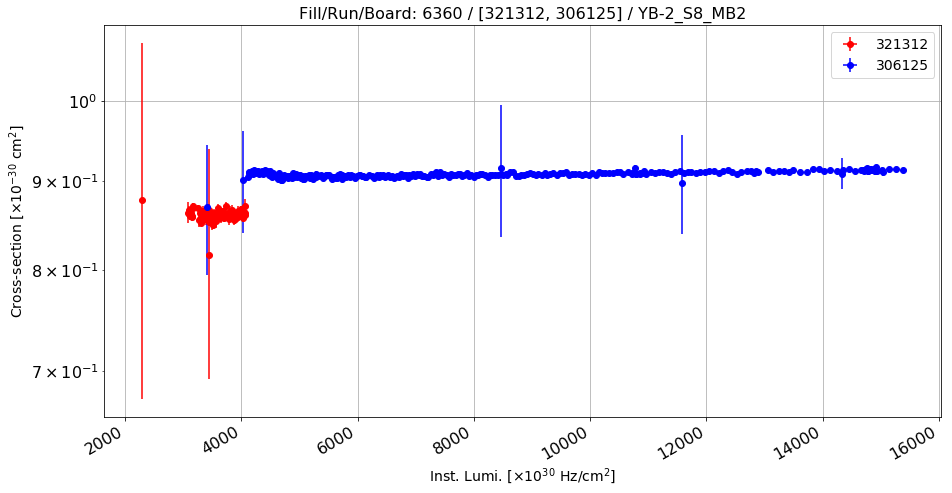

Anomalous CS: 0.860126073064 , Normal CS: 0.909005626841 , Ratio: 0.0537725535837


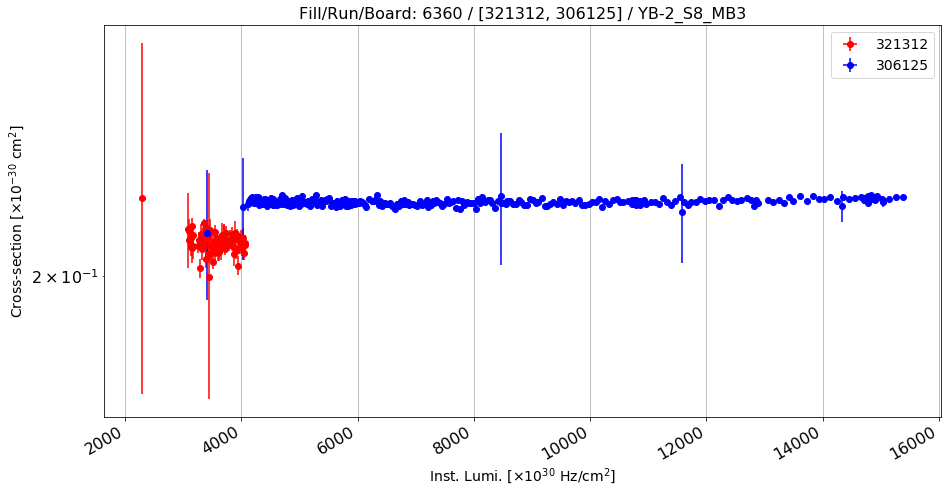

Anomalous CS: 0.20908937408 , Normal CS: 0.220579630246 , Ratio: 0.0520911933425


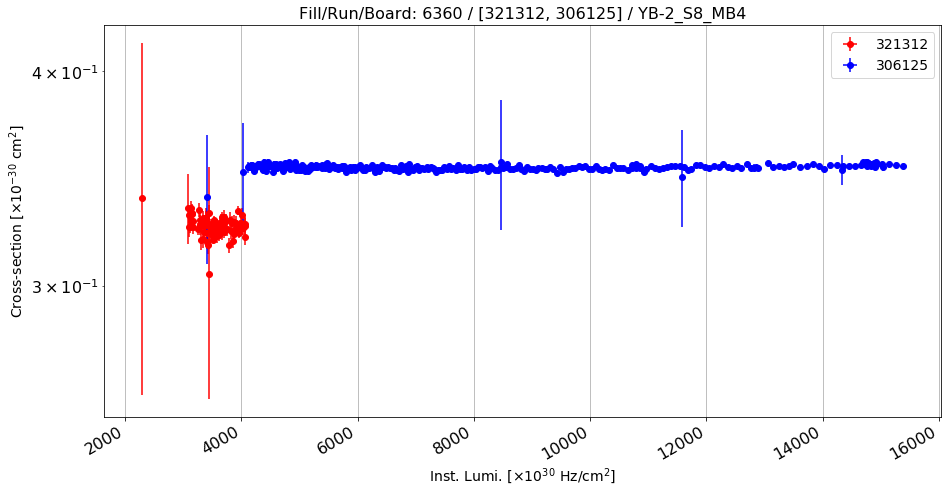

Anomalous CS: 0.325092255571 , Normal CS: 0.351791207142 , Ratio: 0.0758943118201


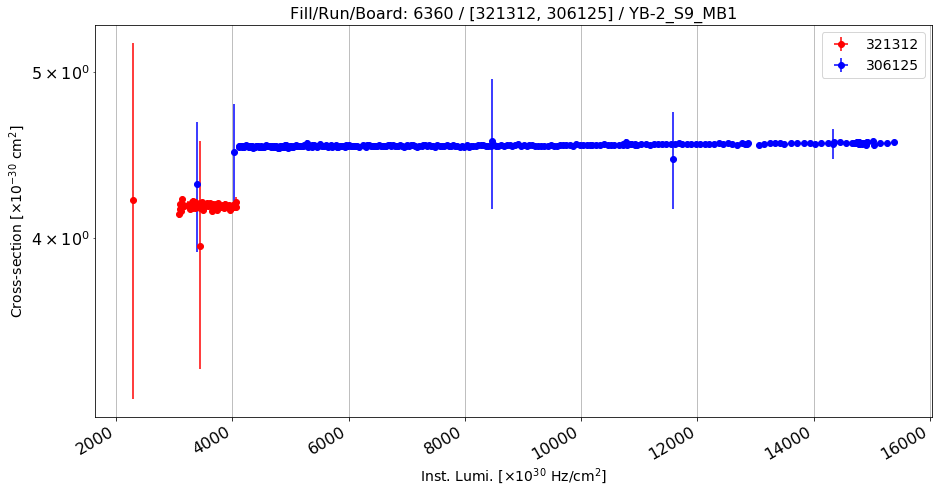

Anomalous CS: 4.17416495283 , Normal CS: 4.53371417396 , Ratio: 0.0793056658055


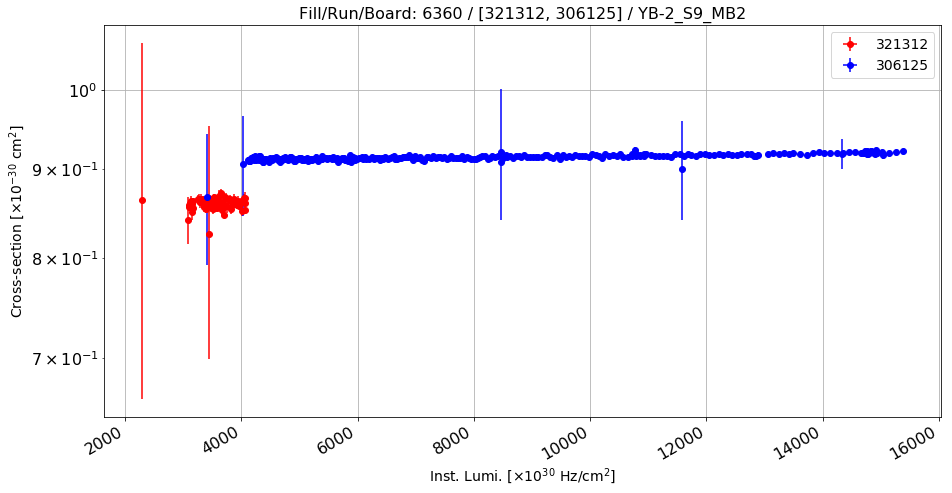

Anomalous CS: 0.859520978411 , Normal CS: 0.916204950646 , Ratio: 0.0618682230383


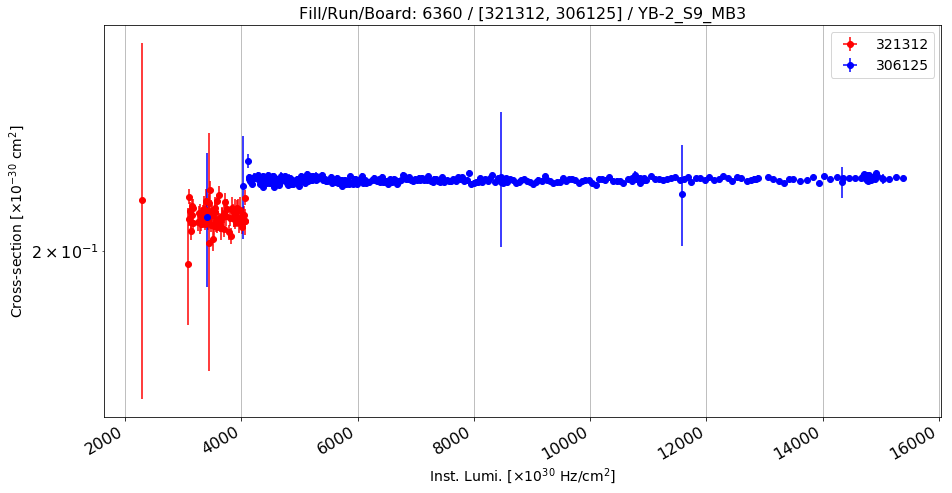

Anomalous CS: 0.209155371435 , Normal CS: 0.219514028344 , Ratio: 0.0471890429381


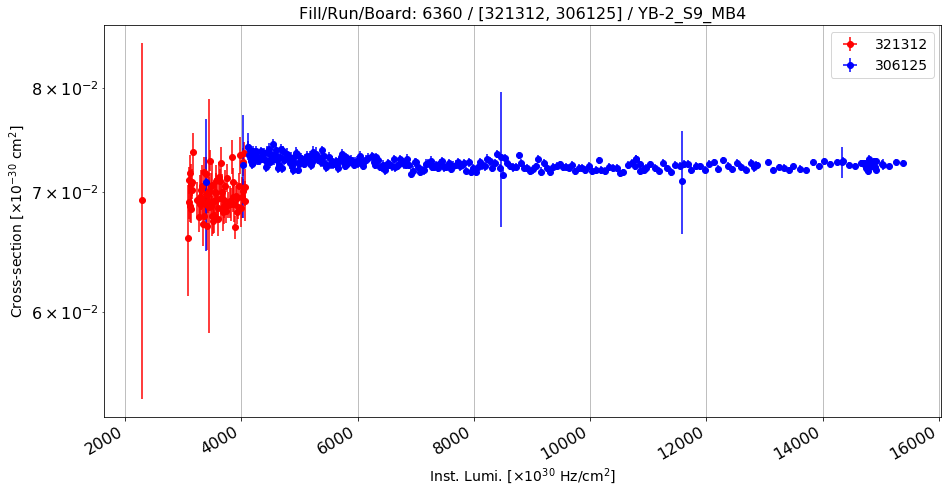

Anomalous CS: 0.0697346171831 , Normal CS: 0.0724206601701 , Ratio: 0.0370894573552


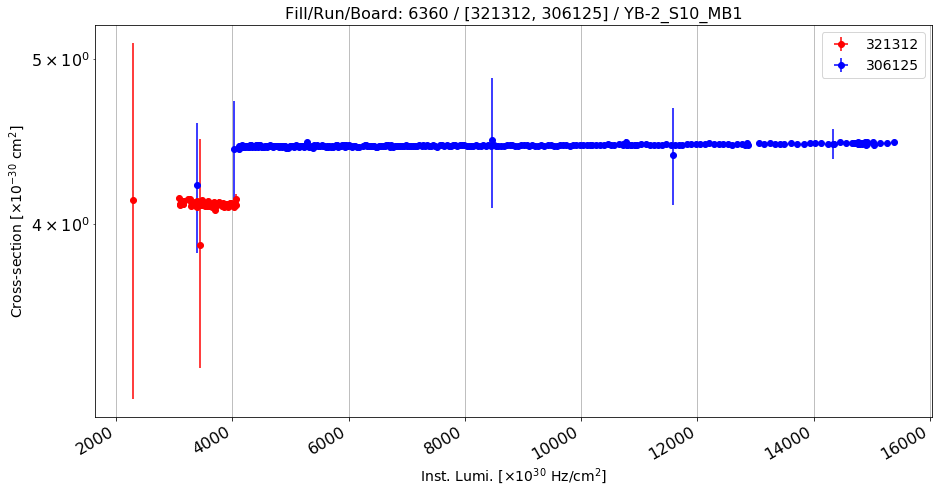

Anomalous CS: 4.10908096858 , Normal CS: 4.45125197358 , Ratio: 0.0768707336793


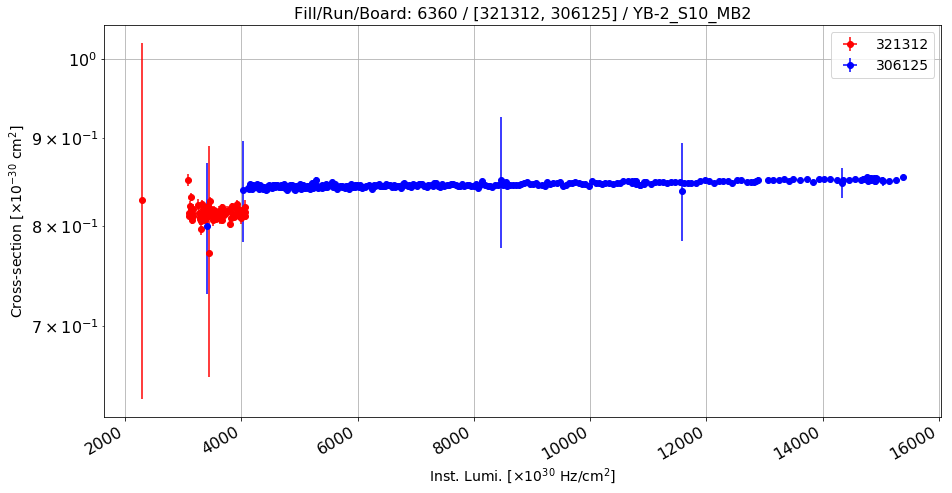

Anomalous CS: 0.814045881355 , Normal CS: 0.847281921659 , Ratio: 0.0392266605177


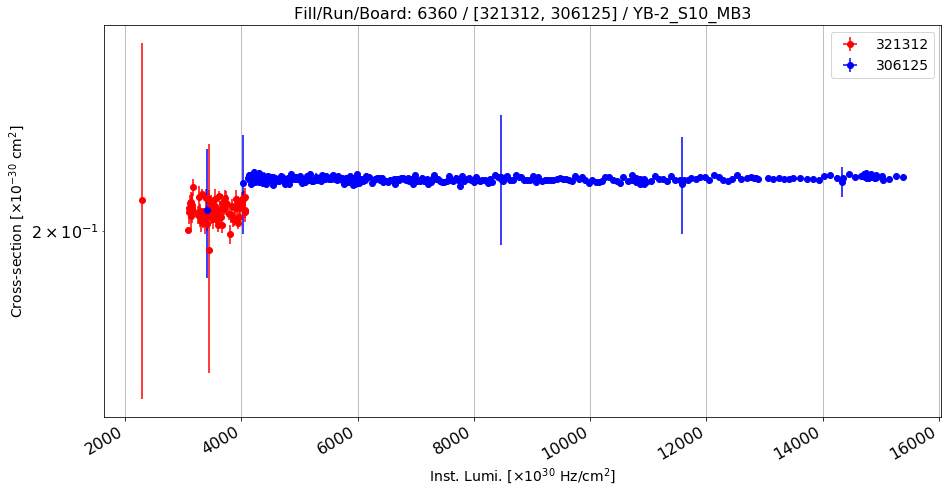

Anomalous CS: 0.205518594825 , Normal CS: 0.21449293285 , Ratio: 0.0418397842092


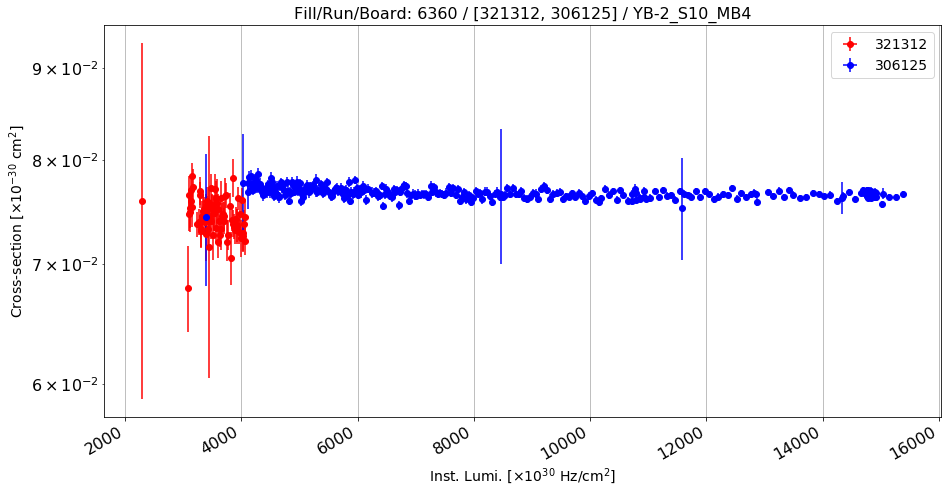

Anomalous CS: 0.0744459201549 , Normal CS: 0.0765232573559 , Ratio: 0.0271464816418


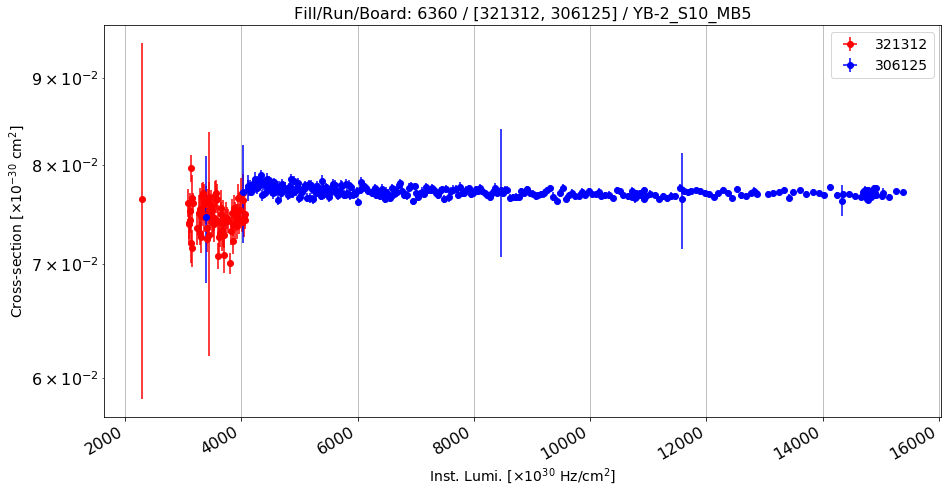

Anomalous CS: 0.0746234745058 , Normal CS: 0.0770422099025 , Ratio: 0.0313949379149


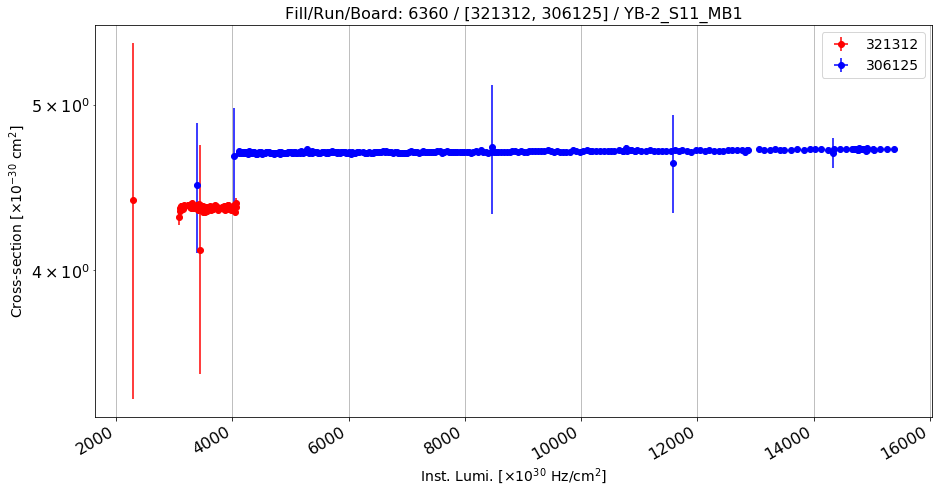

Anomalous CS: 4.35059892133 , Normal CS: 4.69743405659 , Ratio: 0.0738350195187


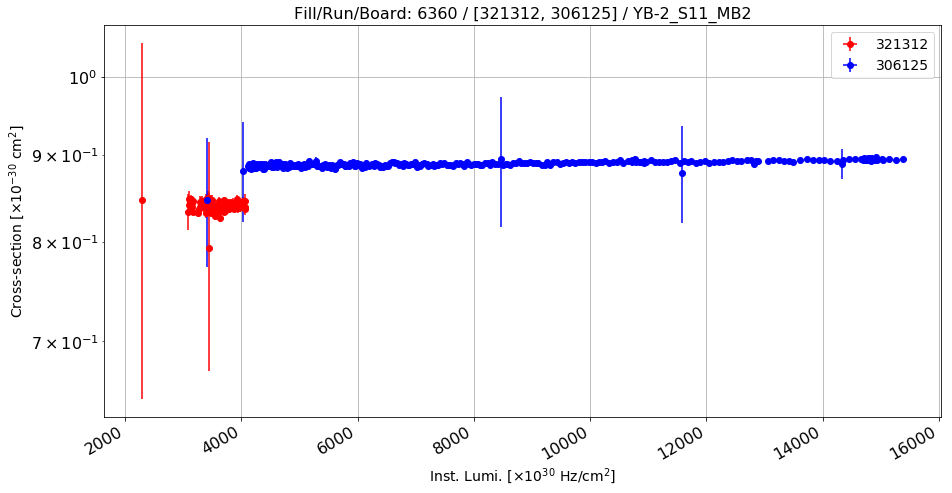

Anomalous CS: 0.839960344393 , Normal CS: 0.890757083125 , Ratio: 0.0570264774693


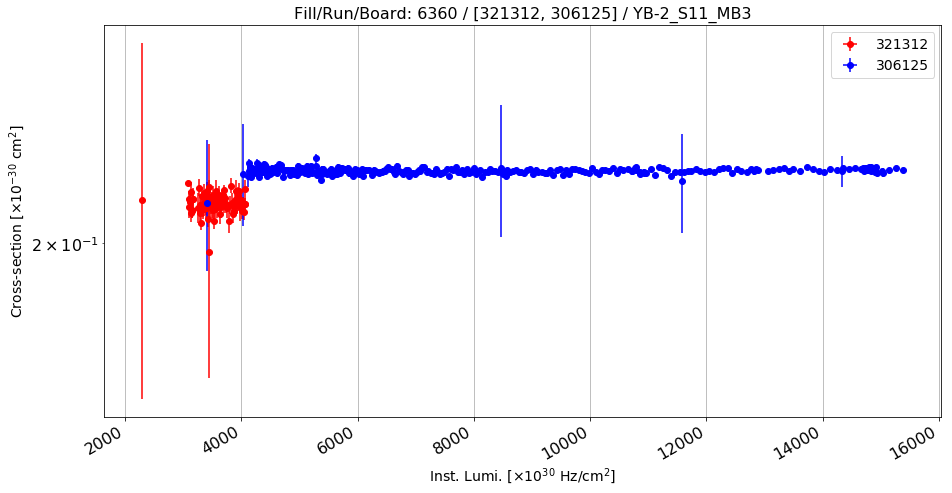

Anomalous CS: 0.210863883316 , Normal CS: 0.220071739728 , Ratio: 0.0418402491096


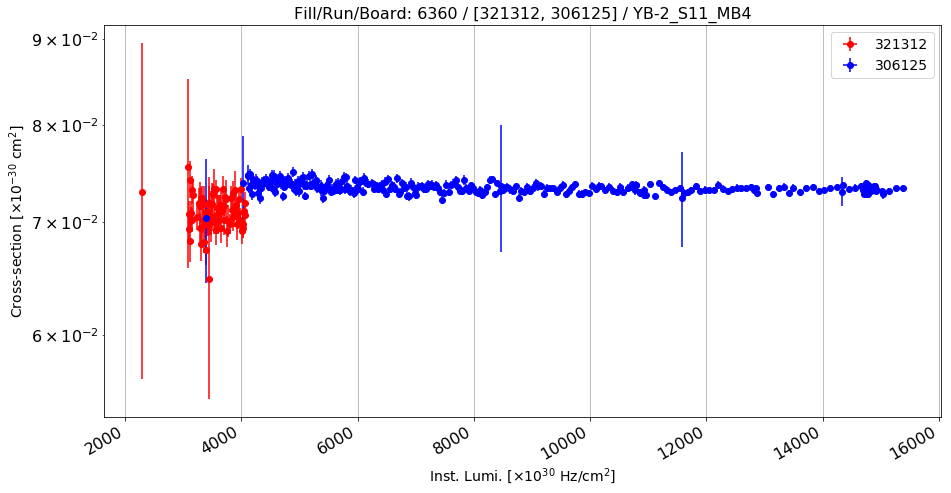

Anomalous CS: 0.0709018223685 , Normal CS: 0.0733119062098 , Ratio: 0.0328743851556


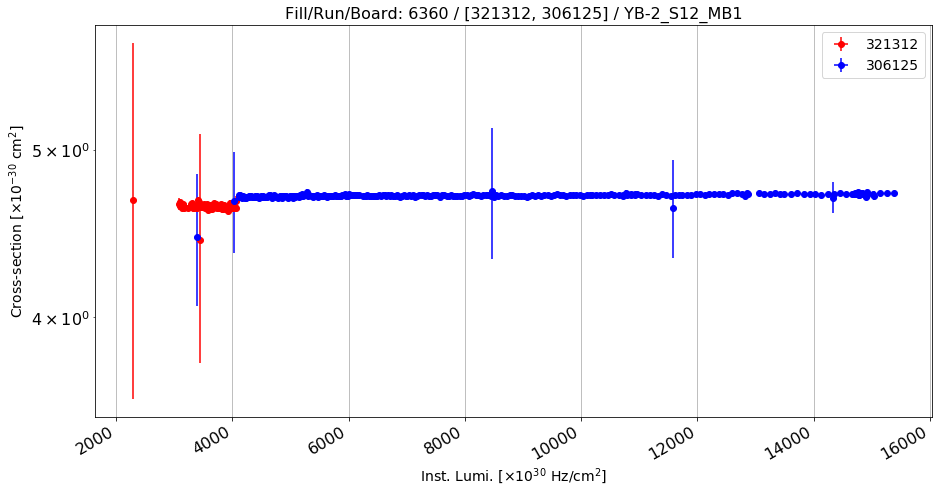

Anomalous CS: 4.63795563955 , Normal CS: 4.70967829354 , Ratio: 0.0152287798703


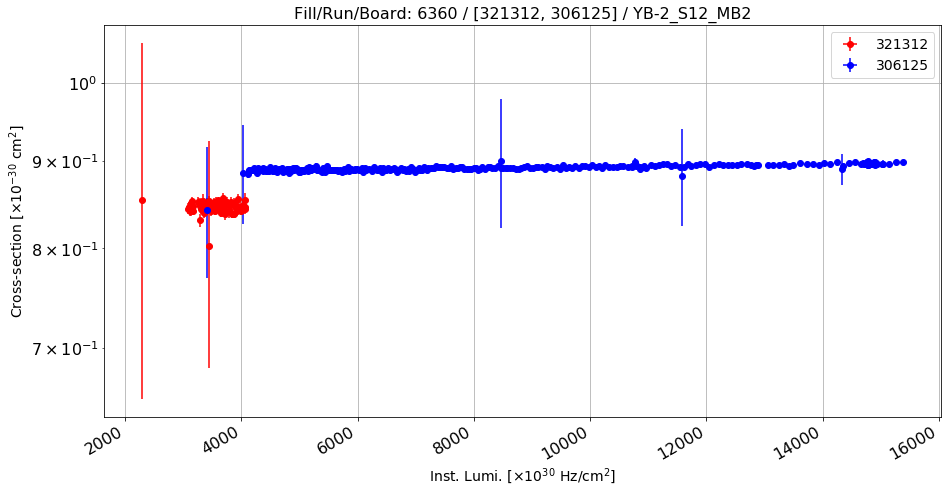

Anomalous CS: 0.845410047911 , Normal CS: 0.893095203788 , Ratio: 0.0533931384642


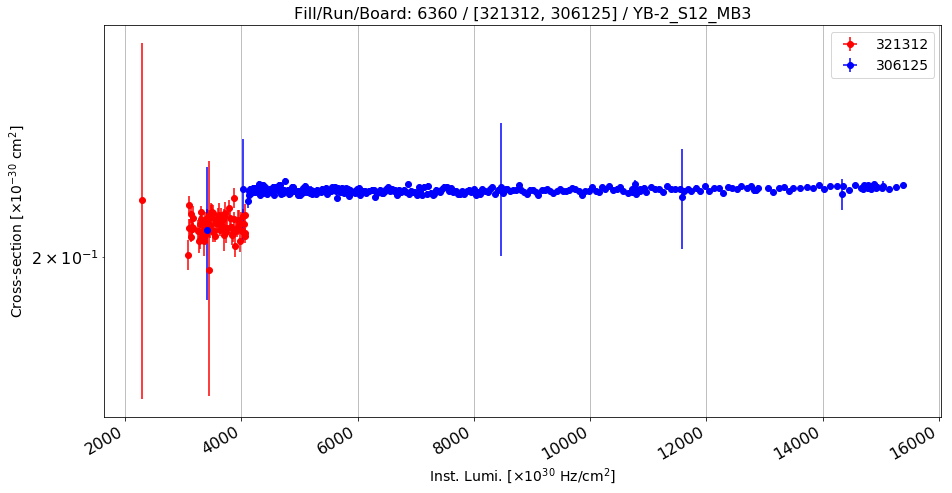

Anomalous CS: 0.208513333169 , Normal CS: 0.218527278303 , Ratio: 0.0458246915963


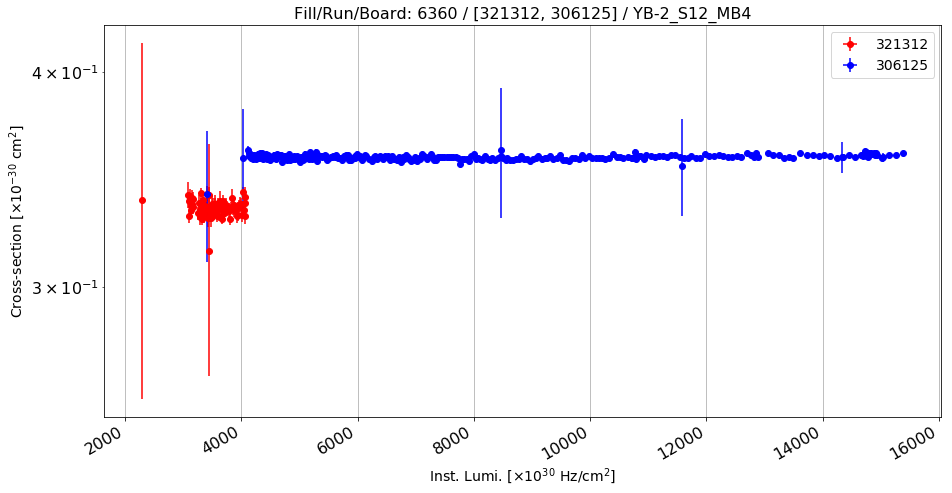

Anomalous CS: 0.333488148455 , Normal CS: 0.356974044916 , Ratio: 0.0657916080889


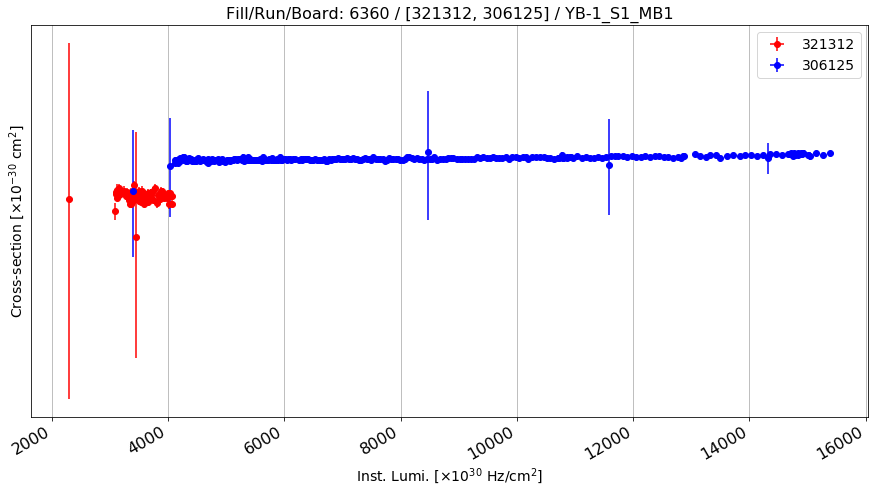

Anomalous CS: 1.52415828724 , Normal CS: 1.60740519823 , Ratio: 0.0517896240944


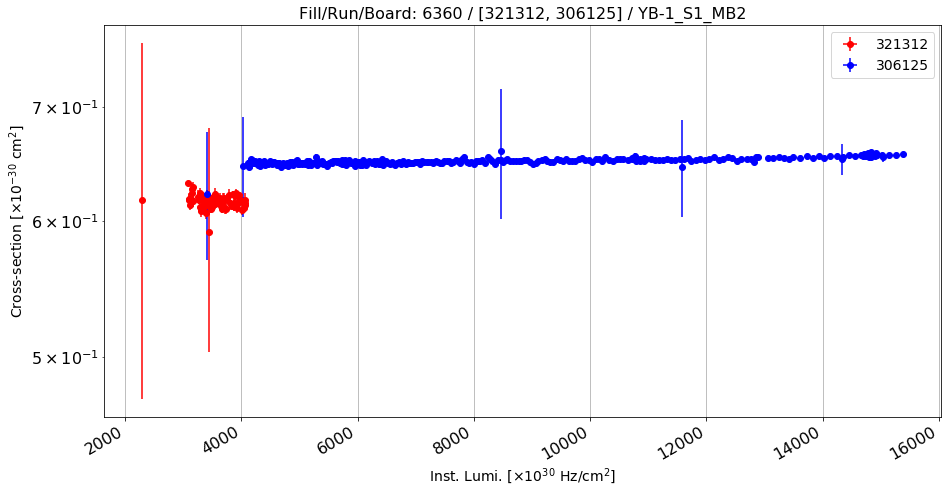

Anomalous CS: 0.616126232279 , Normal CS: 0.651820769414 , Ratio: 0.0547612761204


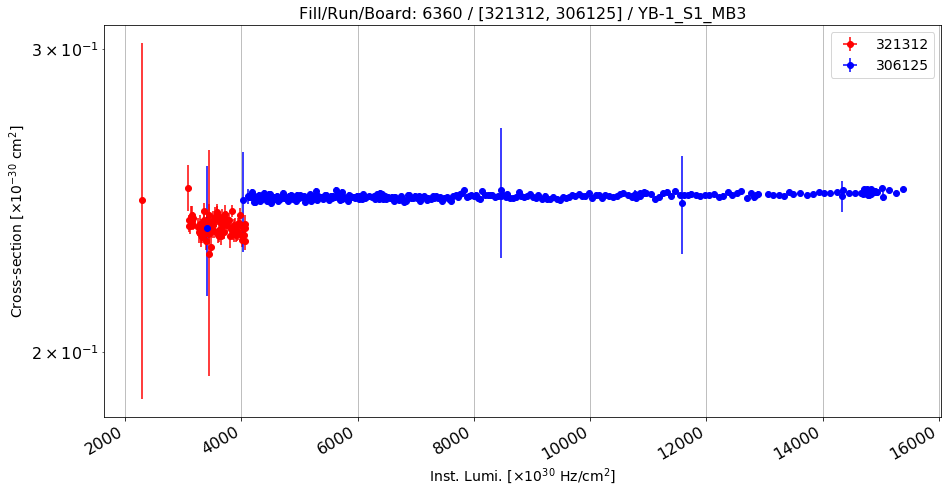

Anomalous CS: 0.236796691366 , Normal CS: 0.24661438737 , Ratio: 0.0398099077244


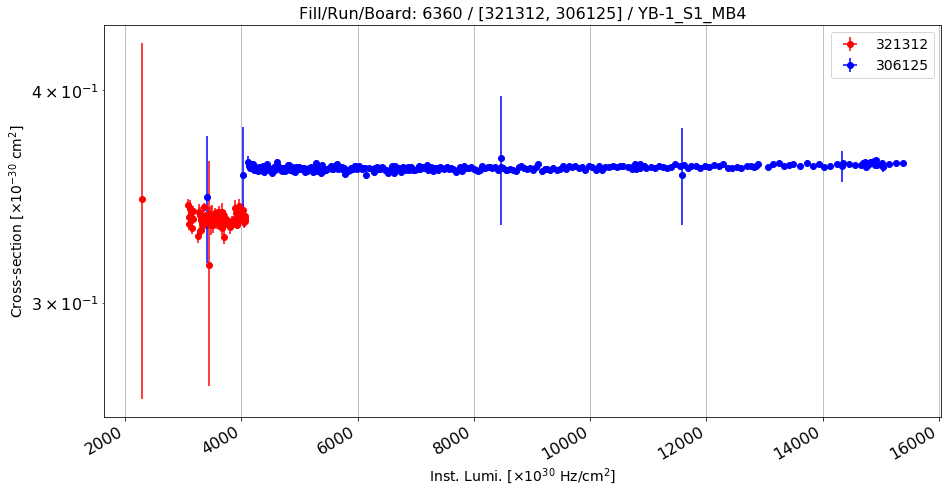

Anomalous CS: 0.335928298014 , Normal CS: 0.360593952572 , Ratio: 0.0684028514119


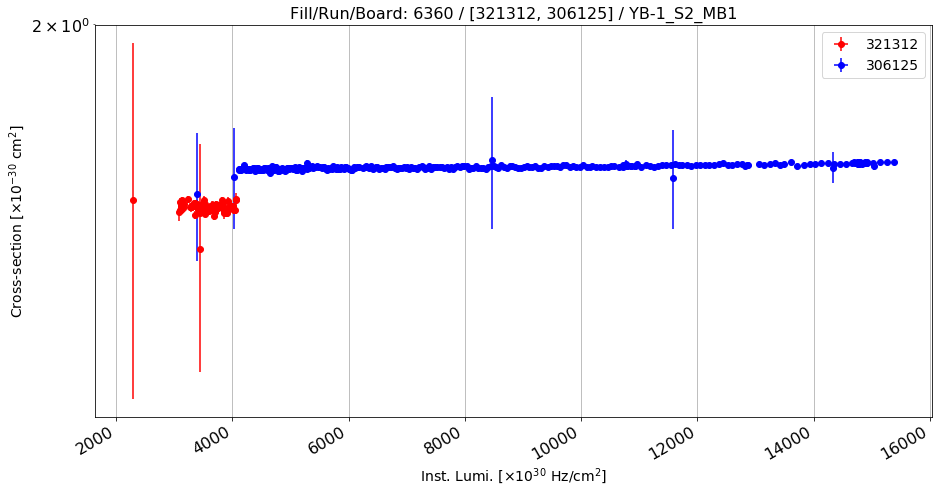

Anomalous CS: 1.56659406349 , Normal CS: 1.65570242565 , Ratio: 0.053819068436


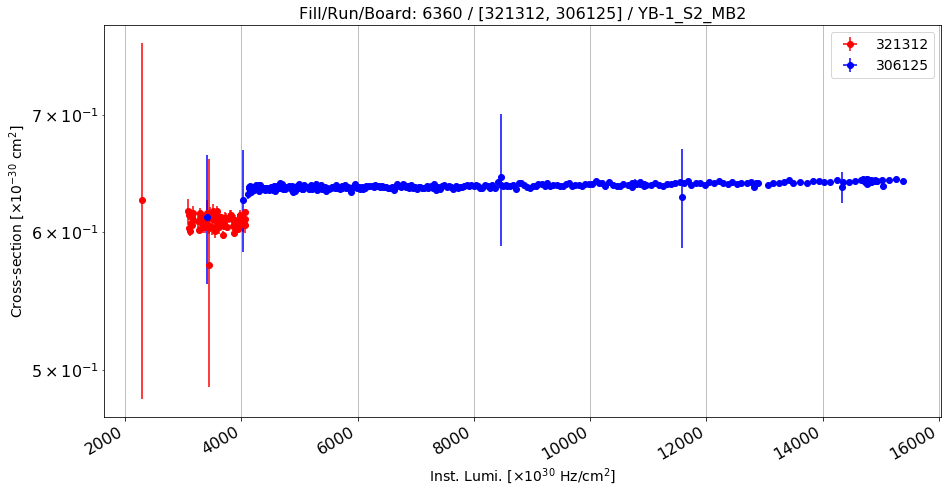

Anomalous CS: 0.608120269003 , Normal CS: 0.638481257089 , Ratio: 0.0475518862133


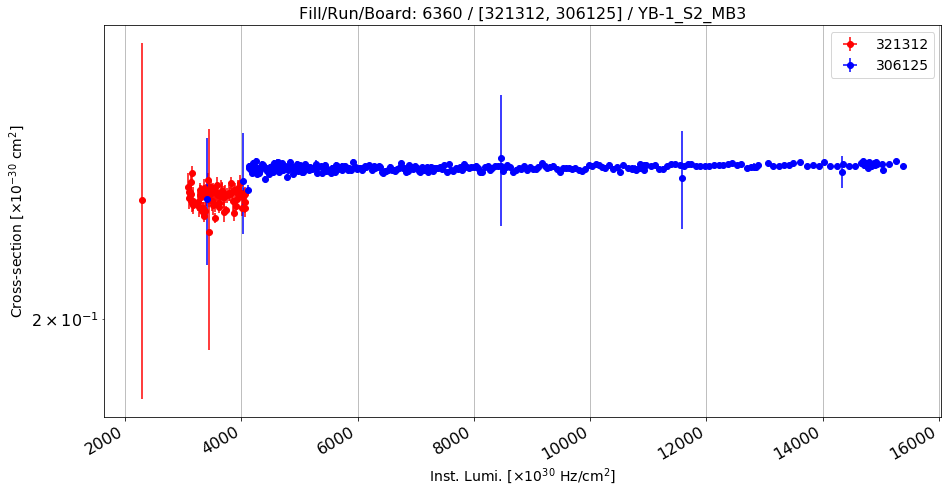

Anomalous CS: 0.235422344454 , Normal CS: 0.245117685514 , Ratio: 0.0395538210136


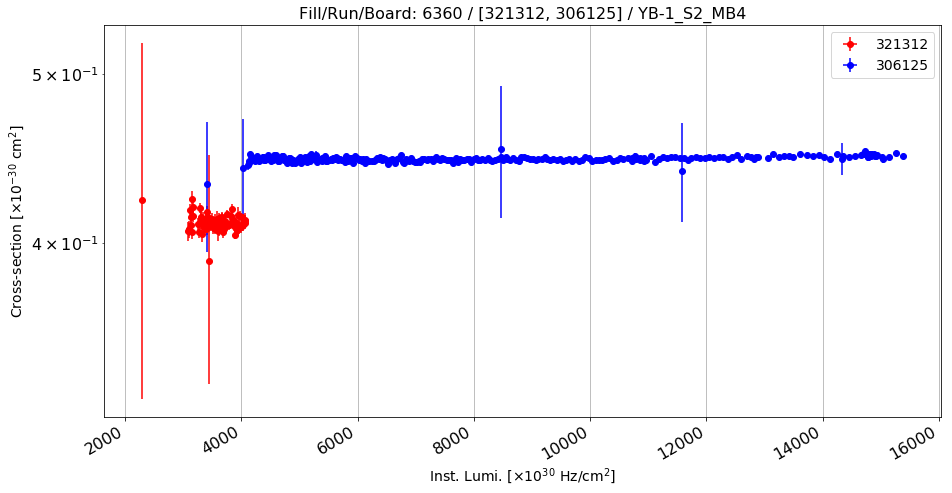

Anomalous CS: 0.410815819617 , Normal CS: 0.447179223523 , Ratio: 0.081317292918


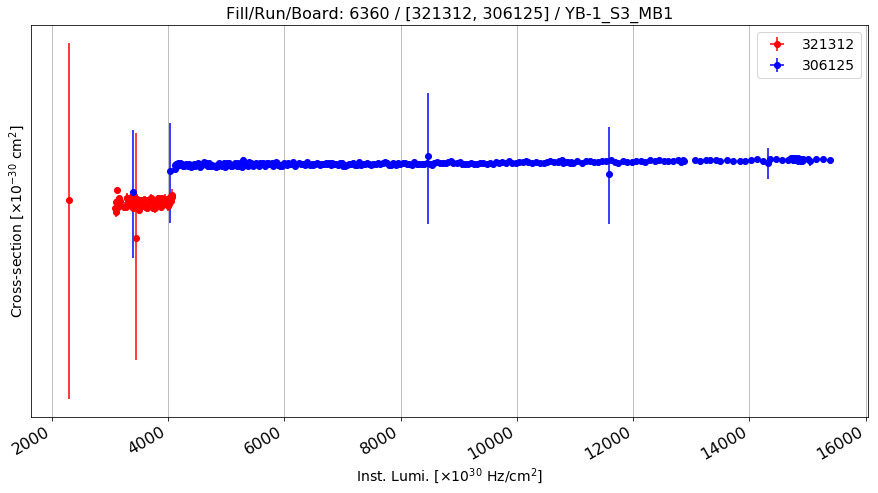

Anomalous CS: 1.36989374413 , Normal CS: 1.4458109403 , Ratio: 0.0525083840885


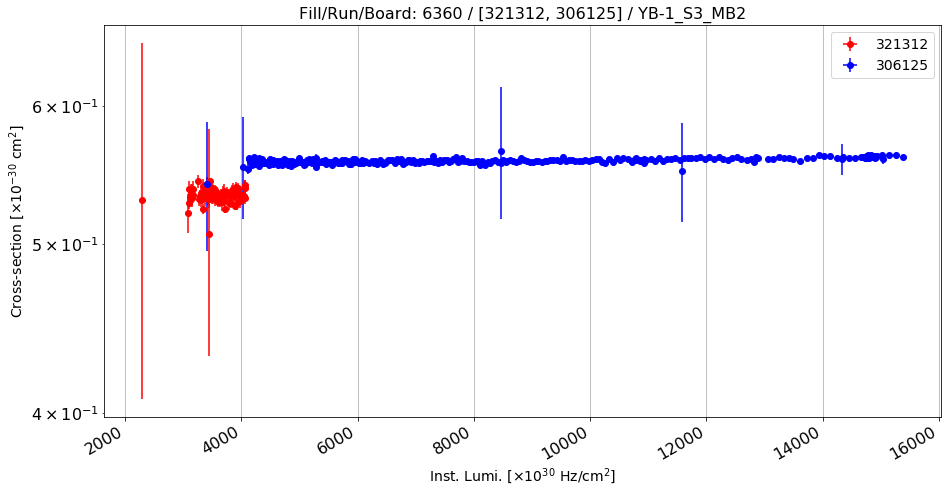

Anomalous CS: 0.532822125256 , Normal CS: 0.558669474391 , Ratio: 0.0462659055481


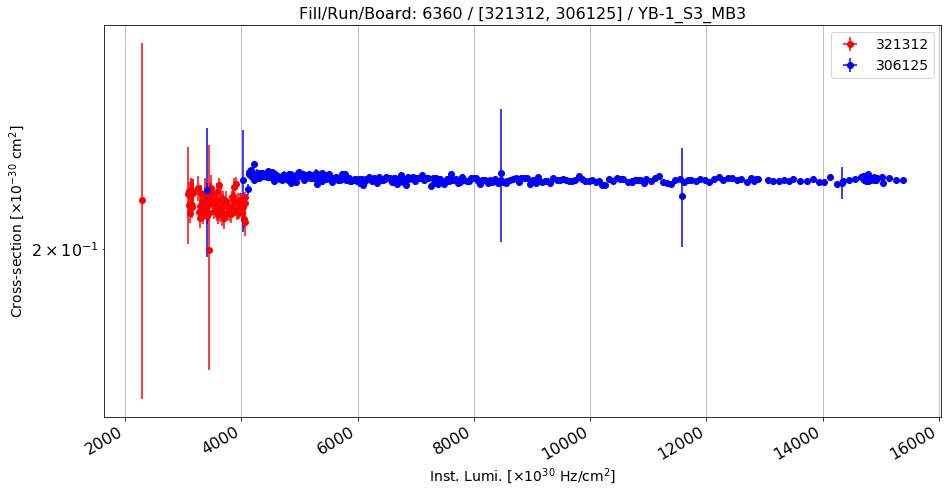

Anomalous CS: 0.211970995046 , Normal CS: 0.218804335021 , Ratio: 0.0312303683292


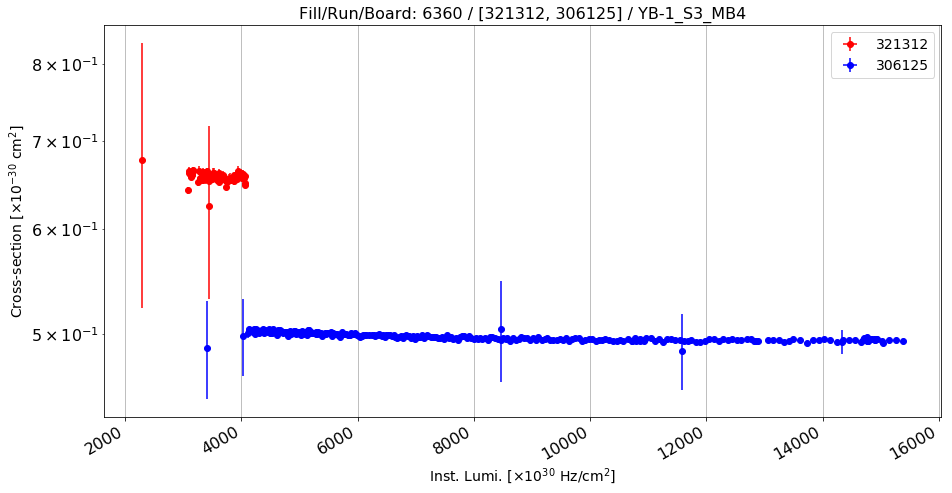

Anomalous CS: 0.656886468941 , Normal CS: 0.496024263997 , Ratio: -0.324303096883


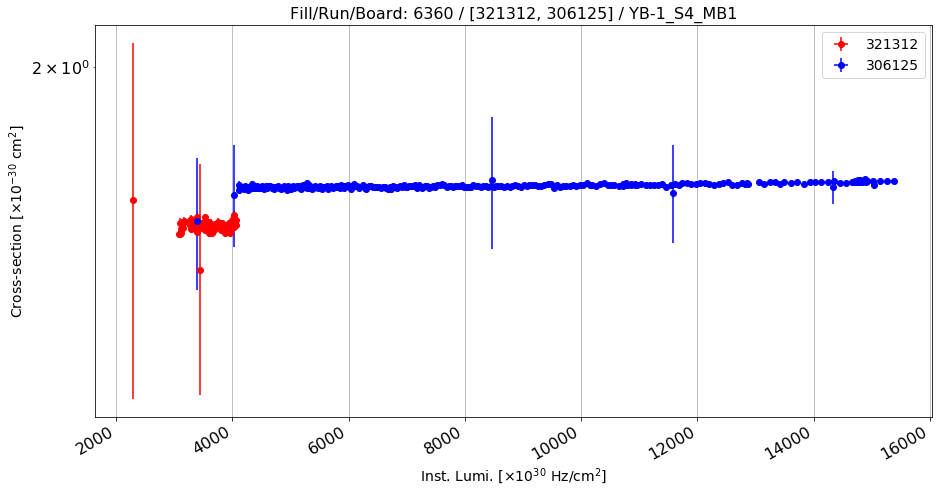

Anomalous CS: 1.61848657559 , Normal CS: 1.70960361462 , Ratio: 0.0532971726622


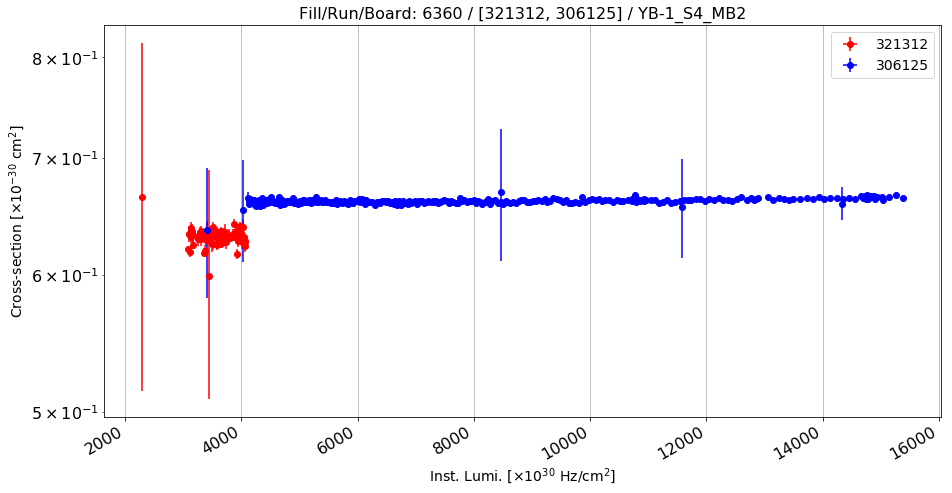

Anomalous CS: 0.63060625767 , Normal CS: 0.662049041114 , Ratio: 0.0474931334255


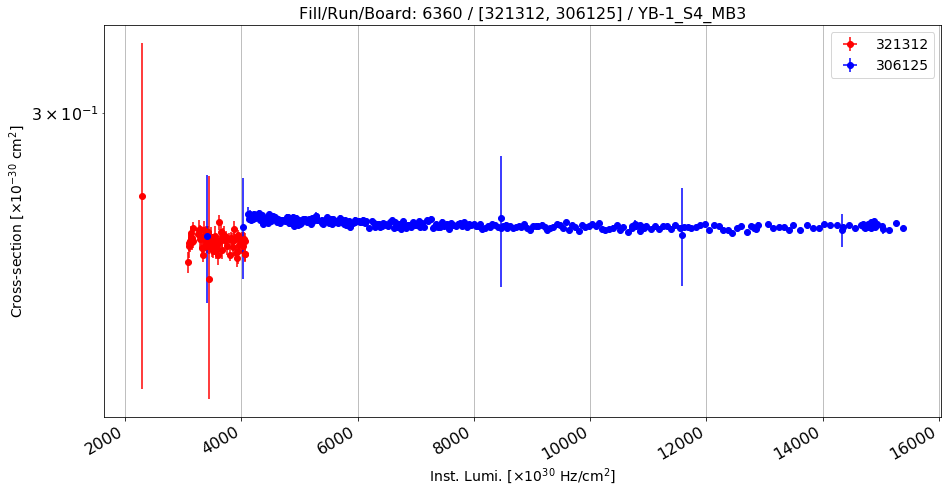

Anomalous CS: 0.252902424763 , Normal CS: 0.258133814374 , Ratio: 0.0202661926473


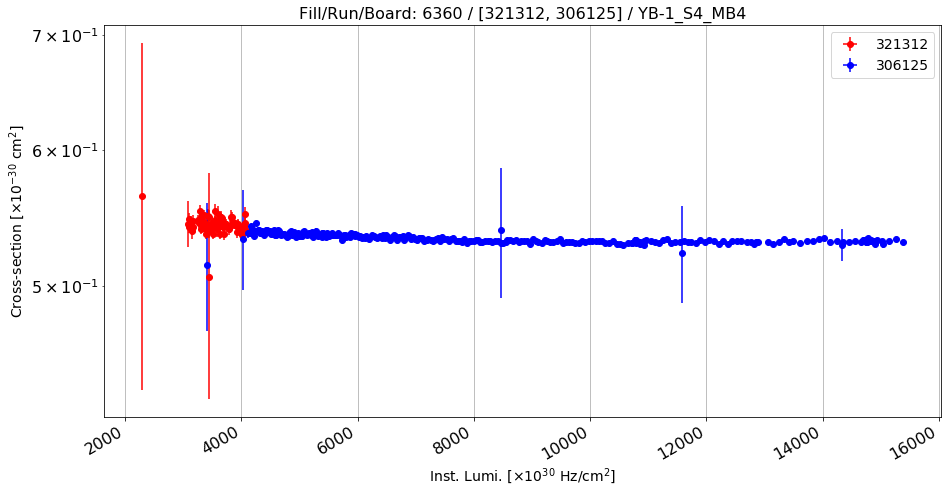

Anomalous CS: 0.542943900842 , Normal CS: 0.531587659383 , Ratio: -0.0213628763916


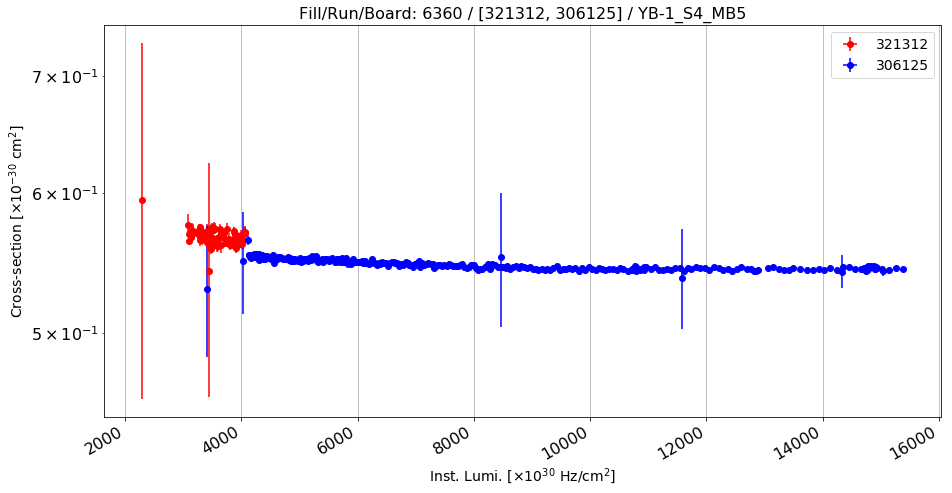

Anomalous CS: 0.567023412661 , Normal CS: 0.544683262233 , Ratio: -0.0410149383647


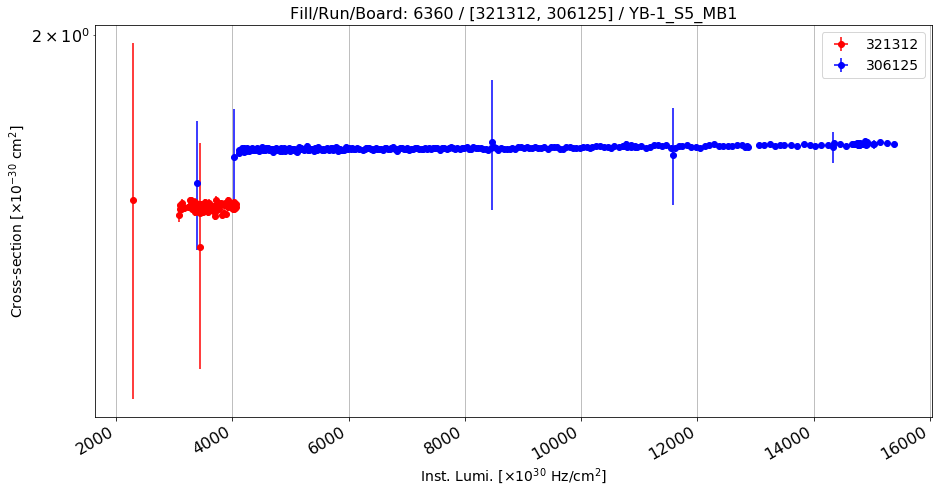

Anomalous CS: 1.58418691344 , Normal CS: 1.71919869974 , Ratio: 0.0785318103833


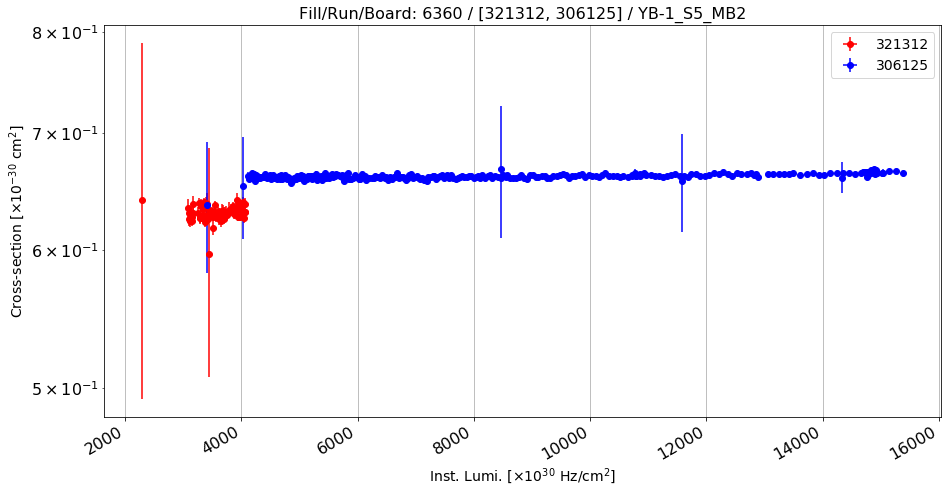

Anomalous CS: 0.629814147606 , Normal CS: 0.661715740854 , Ratio: 0.048210419185


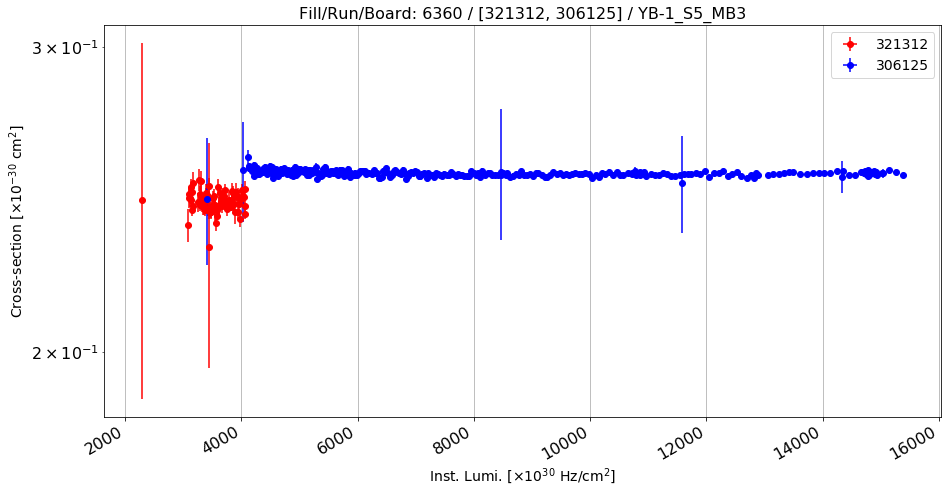

Anomalous CS: 0.244295130747 , Normal CS: 0.253493749155 , Ratio: 0.036287357927


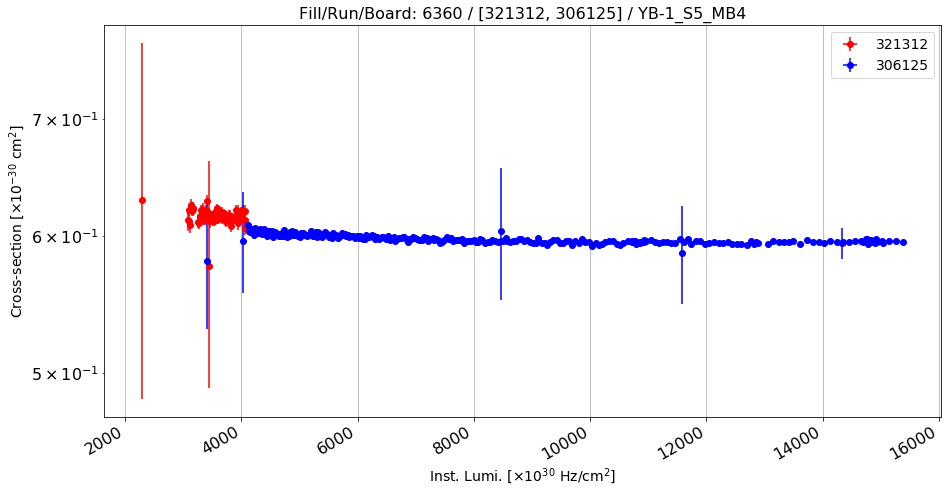

Anomalous CS: 0.615732608561 , Normal CS: 0.595821600509 , Ratio: -0.0334177344952


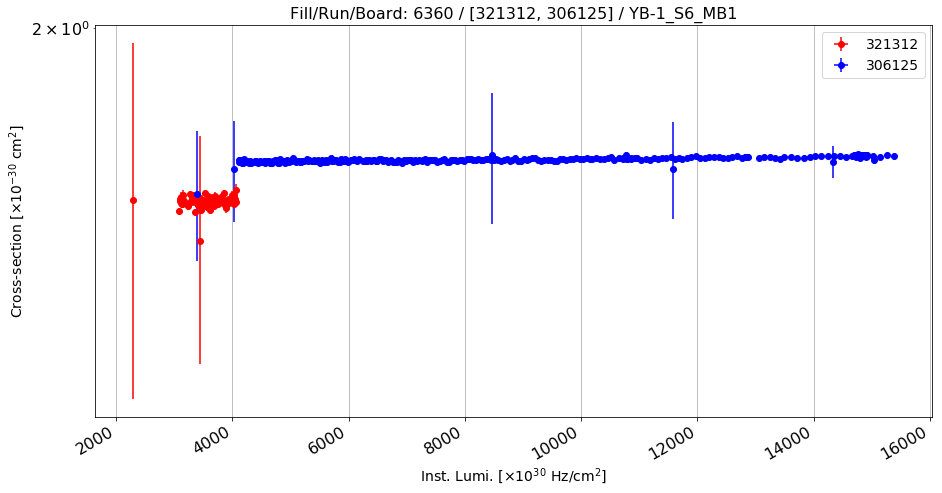

Anomalous CS: 1.58513731195 , Normal CS: 1.67871179702 , Ratio: 0.0557418404002


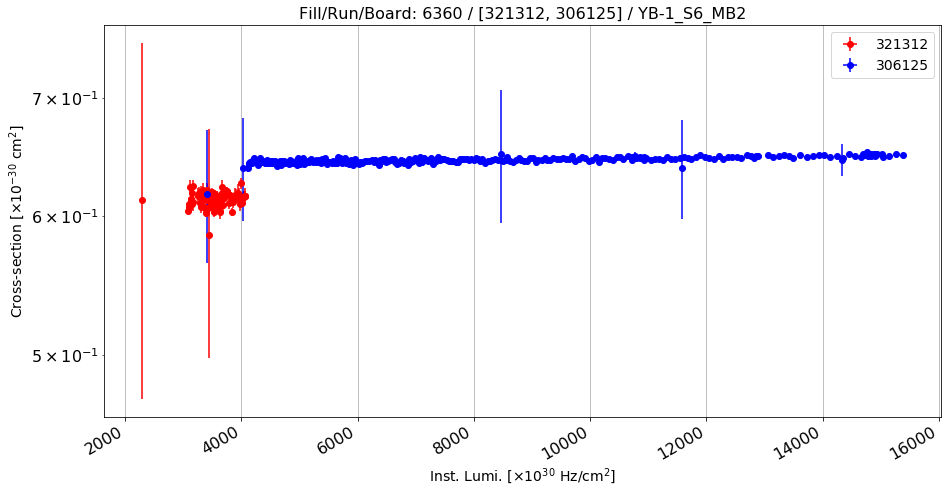

Anomalous CS: 0.613192470859 , Normal CS: 0.646438335692 , Ratio: 0.0514292903083


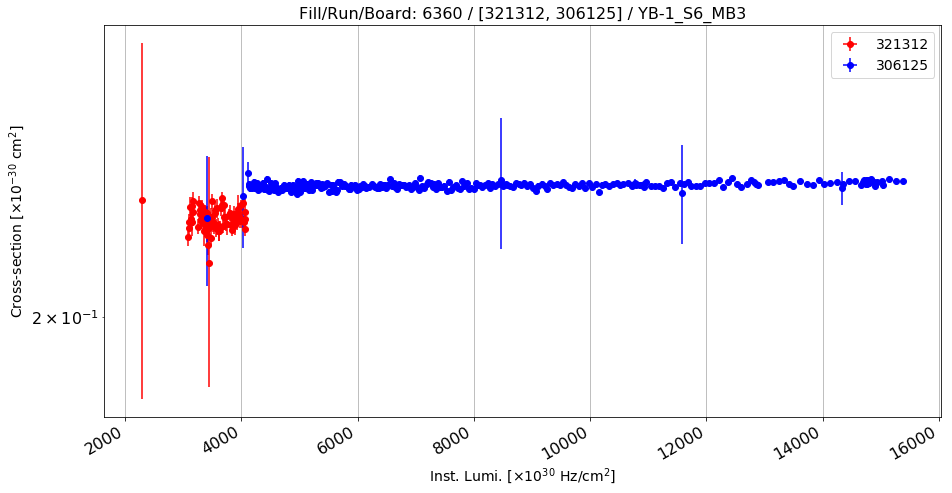

Anomalous CS: 0.227671273931 , Normal CS: 0.238342306458 , Ratio: 0.0447718774128


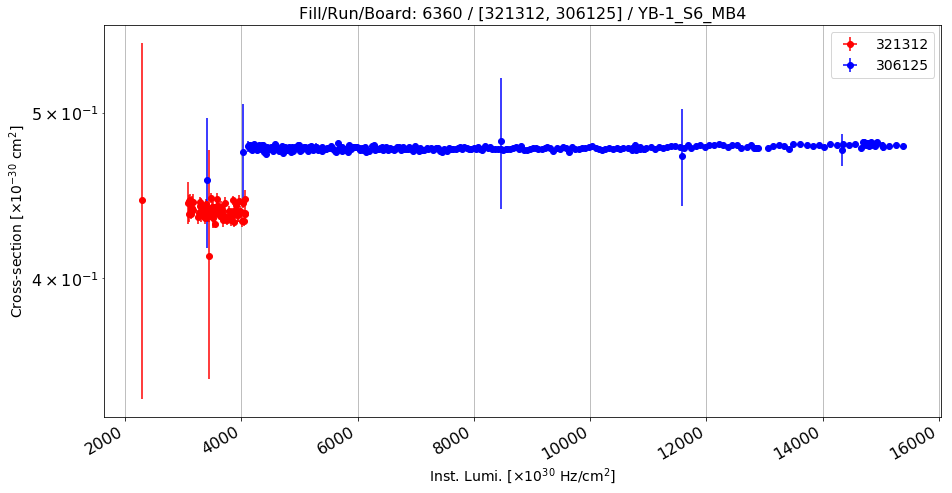

Anomalous CS: 0.437813407934 , Normal CS: 0.477084828005 , Ratio: 0.0823153824348


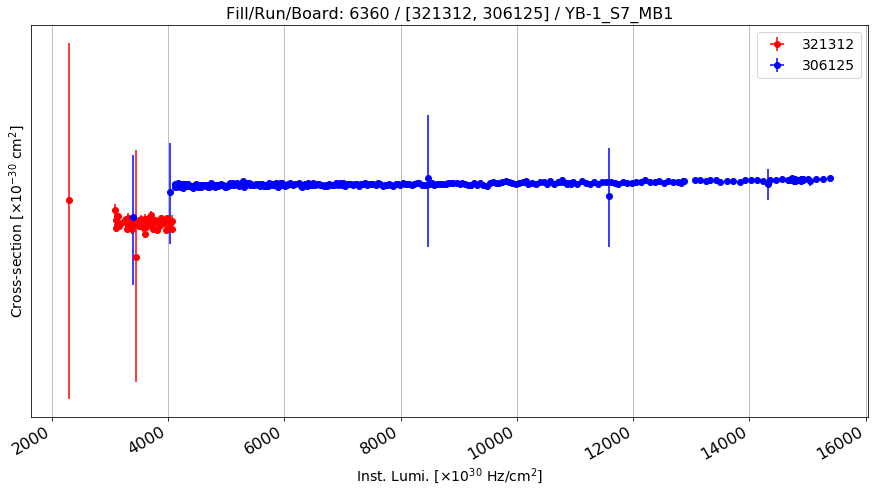

Anomalous CS: 1.53534986446 , Normal CS: 1.61983122063 , Ratio: 0.0521544189887


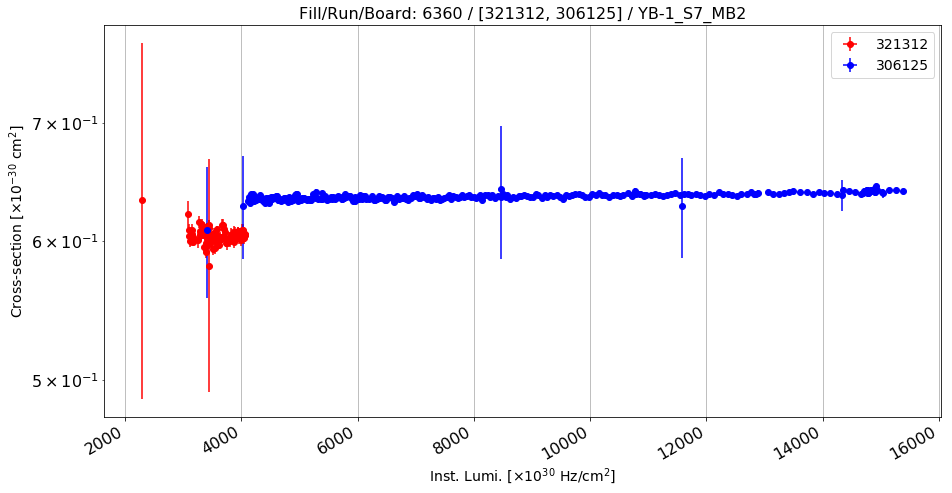

Anomalous CS: 0.604145308866 , Normal CS: 0.636988625633 , Ratio: 0.0515602876488


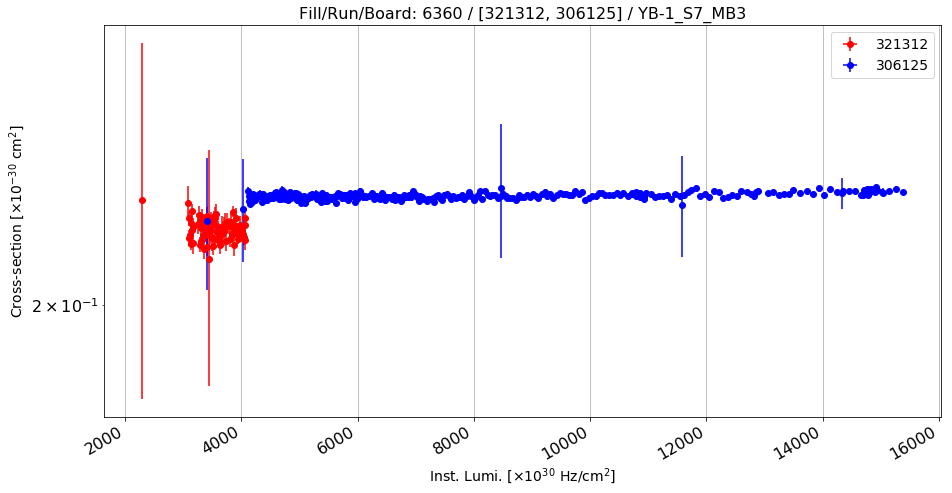

Anomalous CS: 0.220529197167 , Normal CS: 0.230812515546 , Ratio: 0.0445526896803


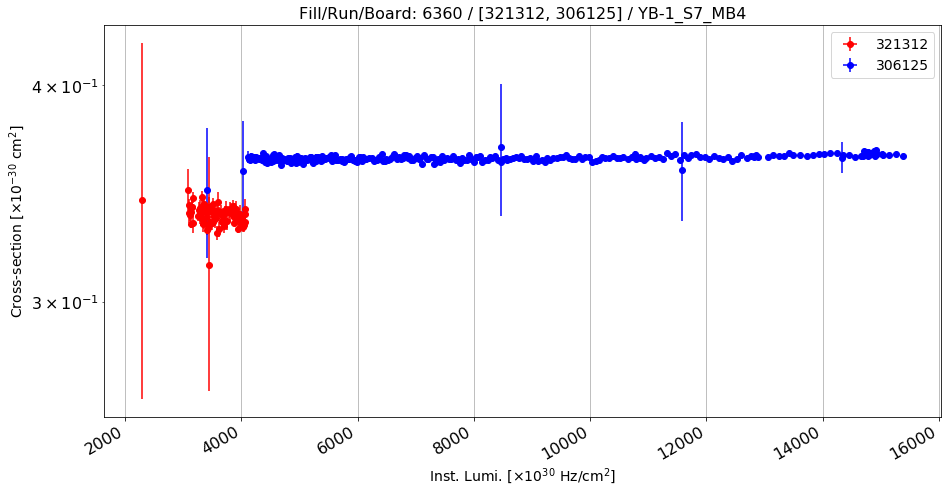

Anomalous CS: 0.33654894038 , Normal CS: 0.363590081011 , Ratio: 0.074372602673


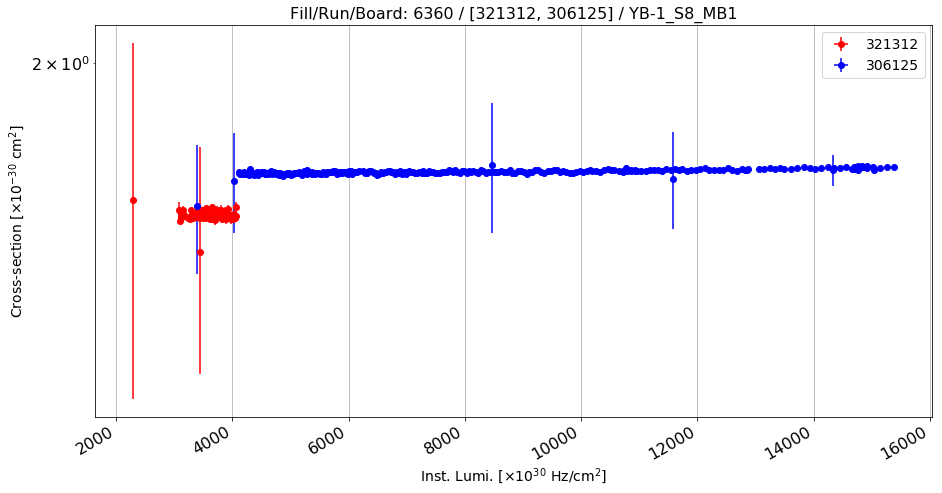

Anomalous CS: 1.6294043093 , Normal CS: 1.72990267946 , Ratio: 0.0580948115468


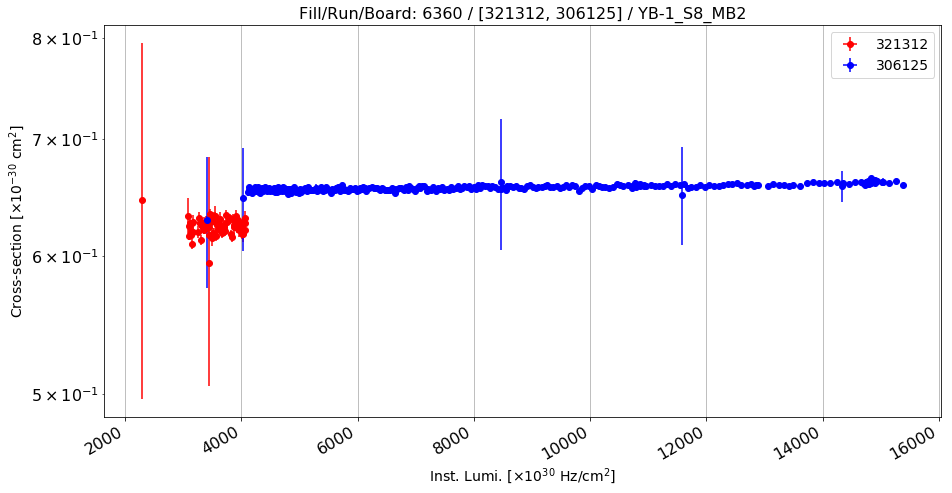

Anomalous CS: 0.623686001719 , Normal CS: 0.657600398932 , Ratio: 0.0515729571755


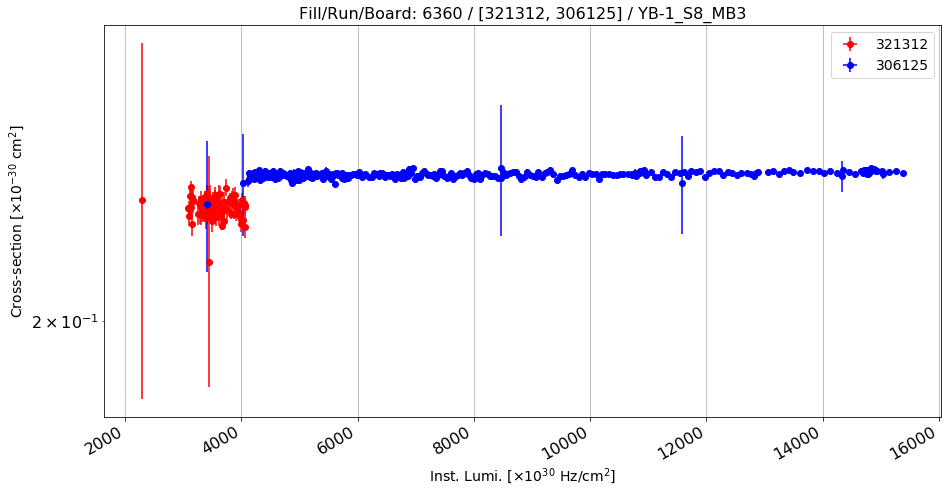

Anomalous CS: 0.232142717205 , Normal CS: 0.242790804302 , Ratio: 0.0438570444527


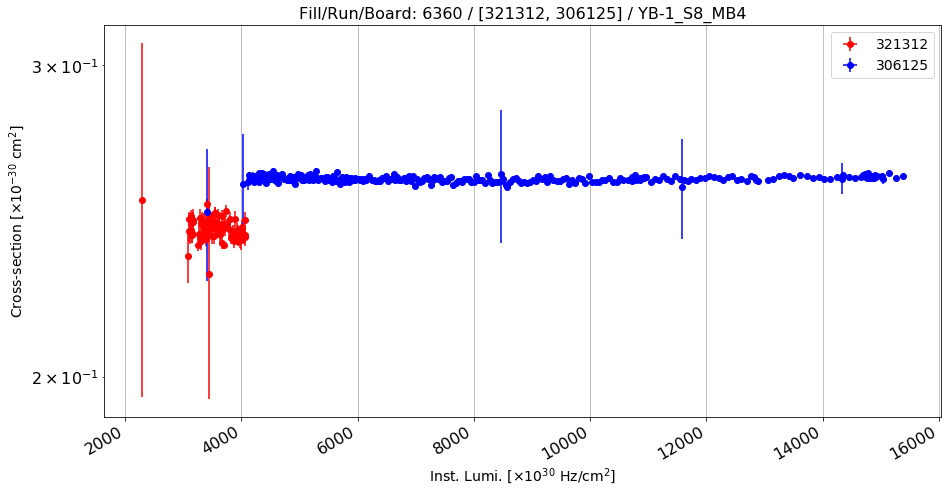

Anomalous CS: 0.242435220102 , Normal CS: 0.258774803909 , Ratio: 0.0631420971451


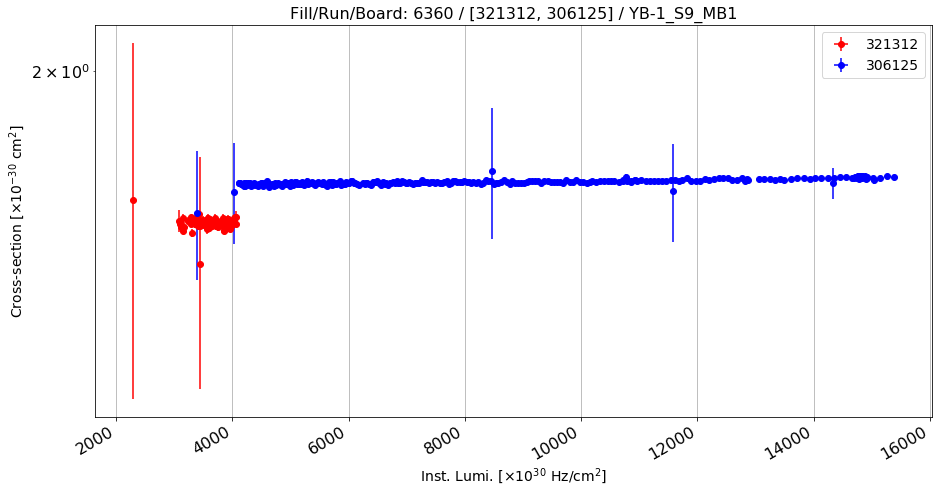

Anomalous CS: 1.63342332294 , Normal CS: 1.7283793888 , Ratio: 0.0549393648613


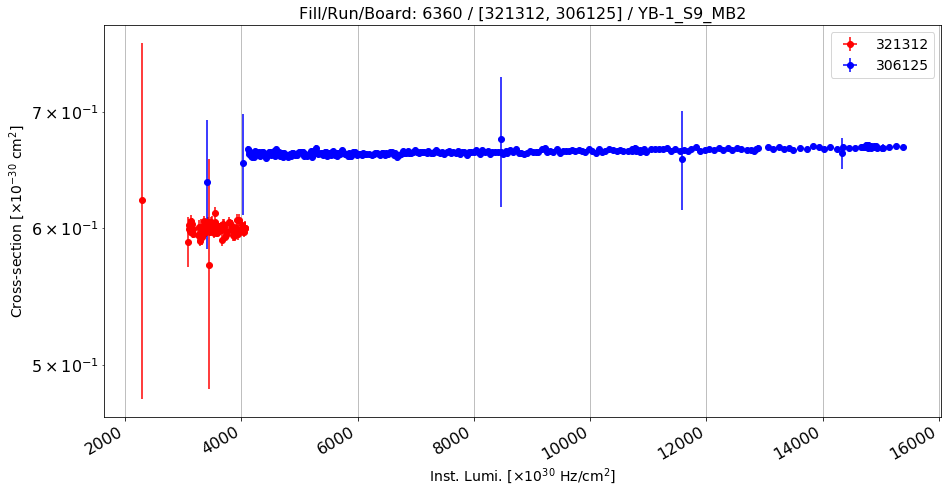

Anomalous CS: 0.599212318037 , Normal CS: 0.665034188429 , Ratio: 0.0989751677987


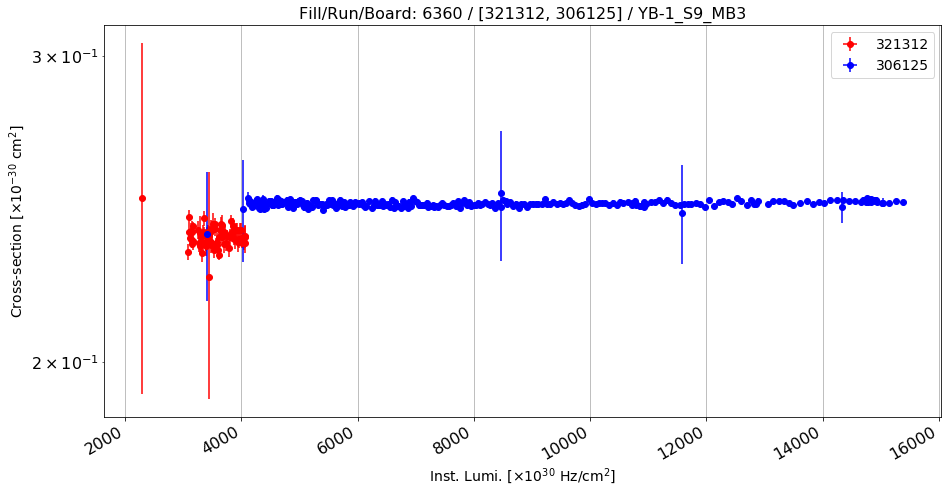

Anomalous CS: 0.236054903765 , Normal CS: 0.246720987775 , Ratio: 0.0432313606791


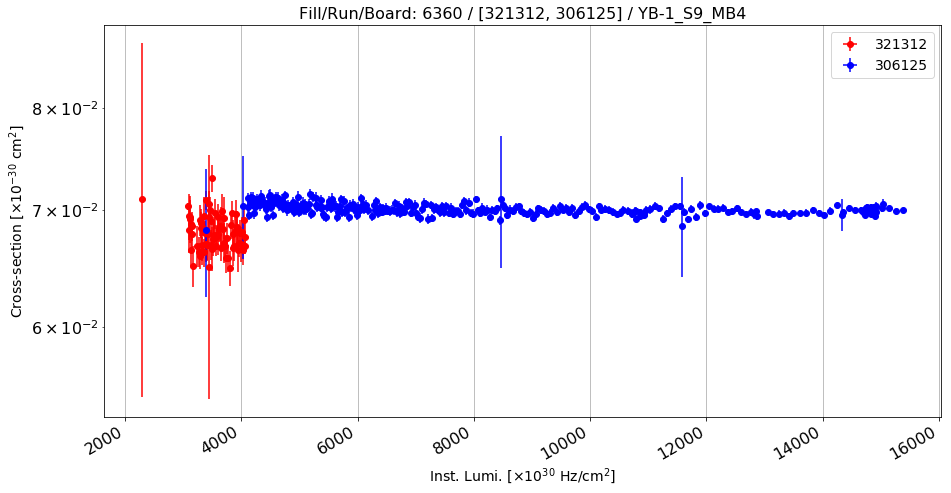

Anomalous CS: 0.067873661101 , Normal CS: 0.0699227794669 , Ratio: 0.0293054478309


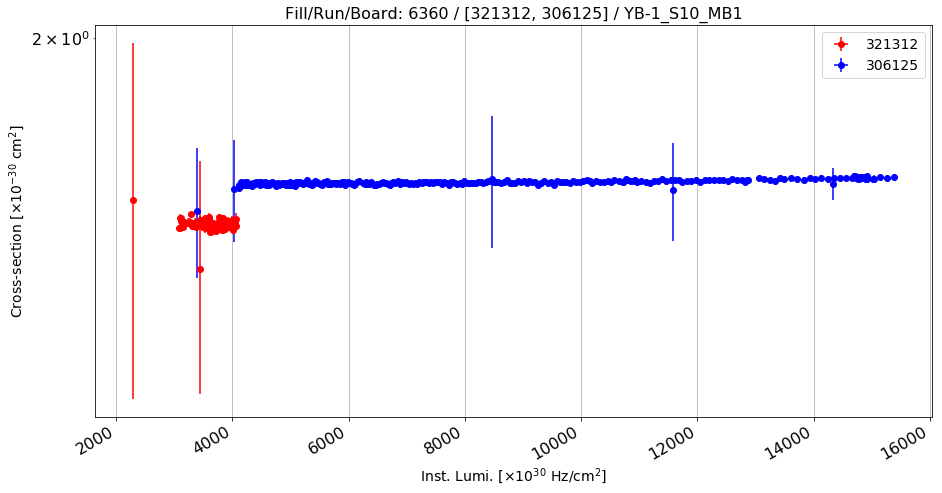

Anomalous CS: 1.56070287504 , Normal CS: 1.65239017161 , Ratio: 0.0554876796928


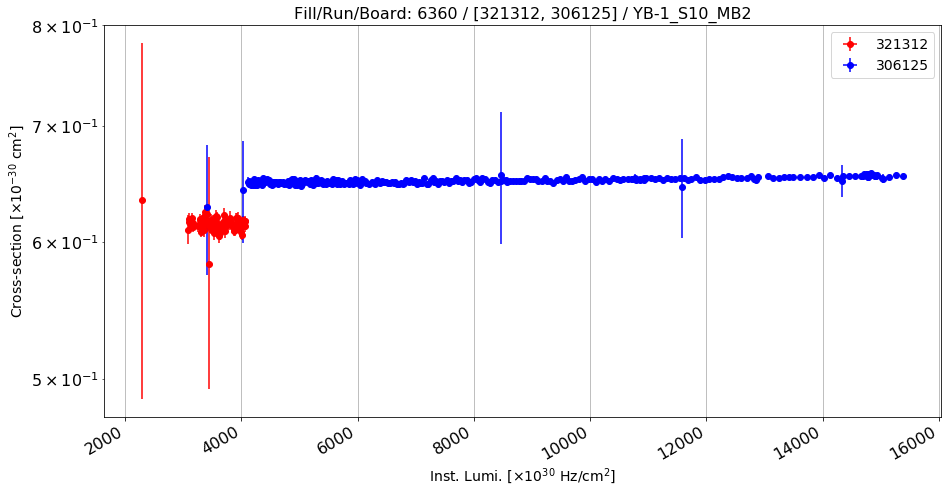

Anomalous CS: 0.614171572278 , Normal CS: 0.651881438779 , Ratio: 0.05784773773


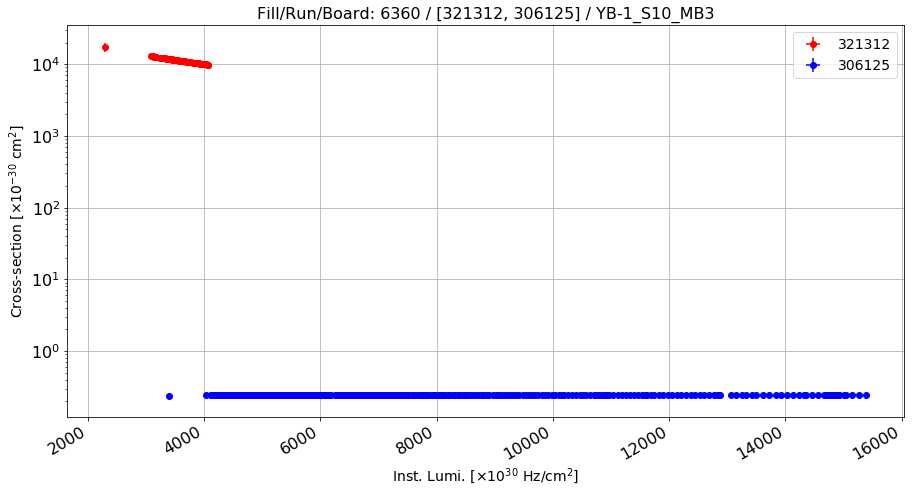

Anomalous CS: 11369.09221 , Normal CS: 0.24440533301 , Ratio: -46516.3655175


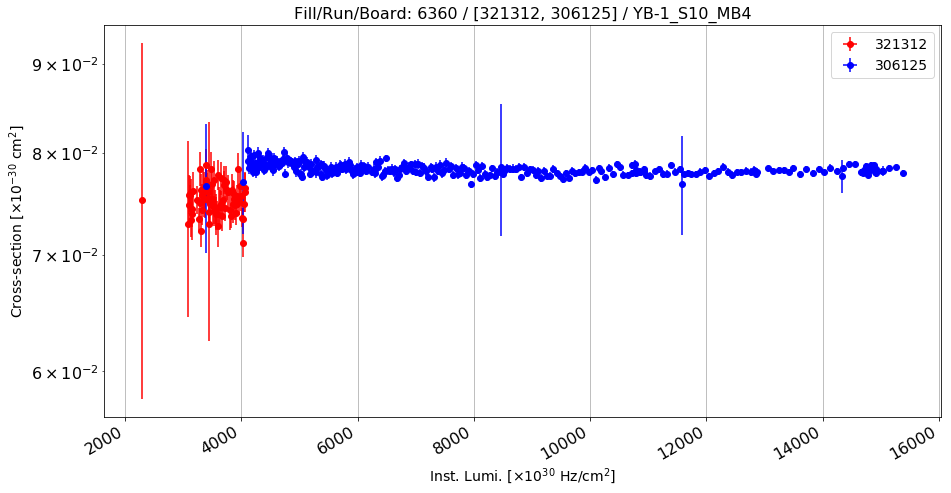

Anomalous CS: 0.0752565272858 , Normal CS: 0.0781751590833 , Ratio: 0.0373345168941


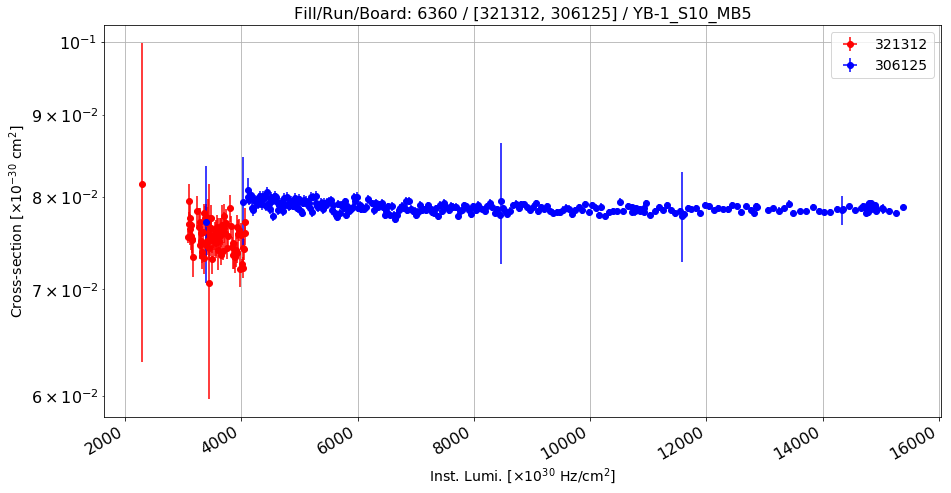

Anomalous CS: 0.0755372270427 , Normal CS: 0.0786344736675 , Ratio: 0.0393878979574


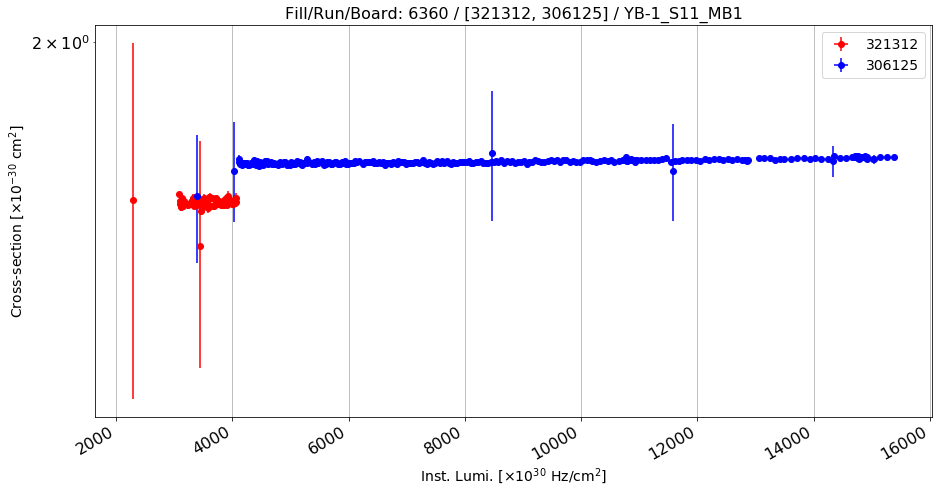

Anomalous CS: 1.61090863448 , Normal CS: 1.70460681244 , Ratio: 0.0549676190841


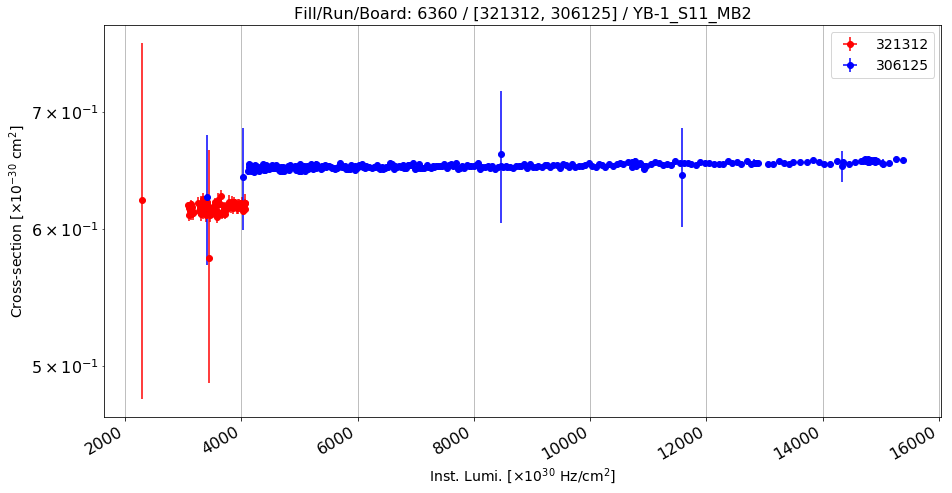

Anomalous CS: 0.616452659684 , Normal CS: 0.653106733595 , Ratio: 0.056122639723


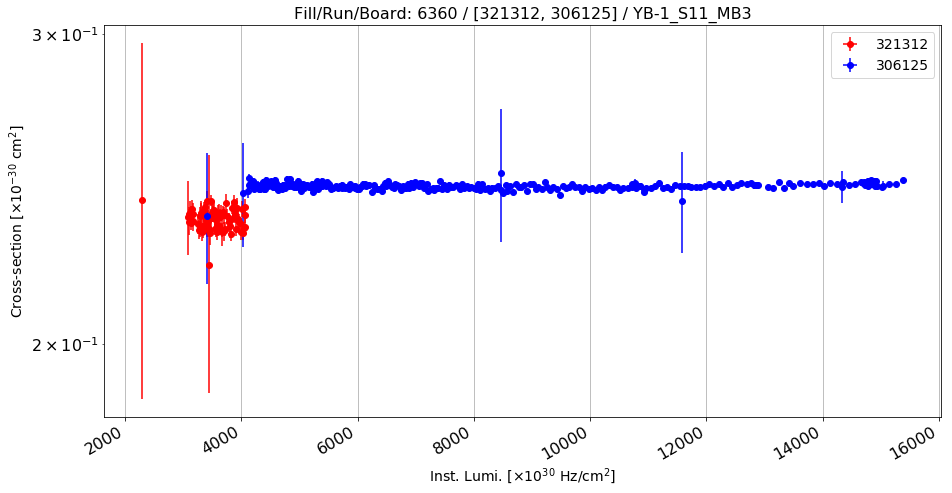

Anomalous CS: 0.235447568756 , Normal CS: 0.24597500217 , Ratio: 0.0427987938668


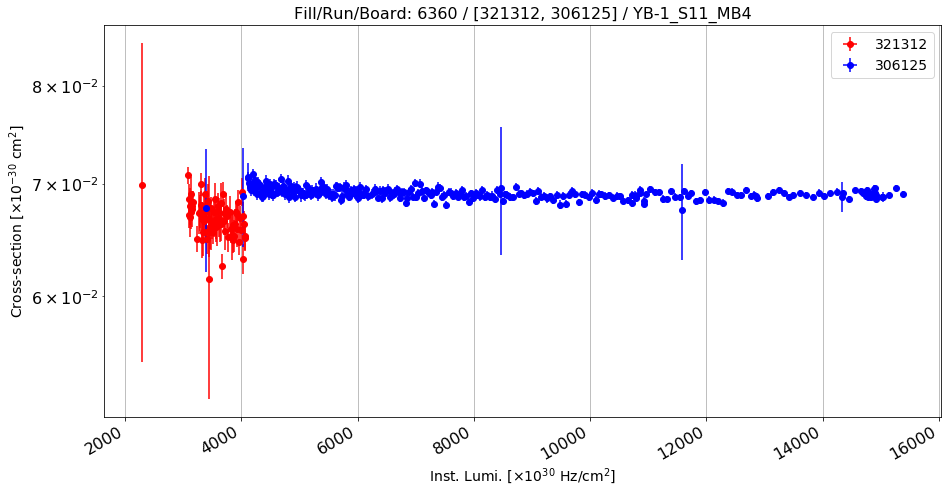

Anomalous CS: 0.0667067597695 , Normal CS: 0.0689400235009 , Ratio: 0.0323942989562


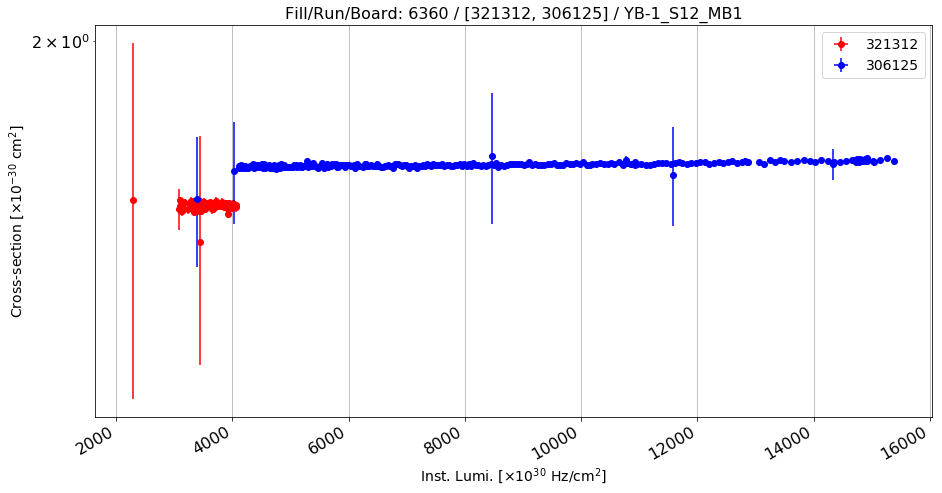

Anomalous CS: 1.60446580486 , Normal CS: 1.69785184331 , Ratio: 0.0550024660965


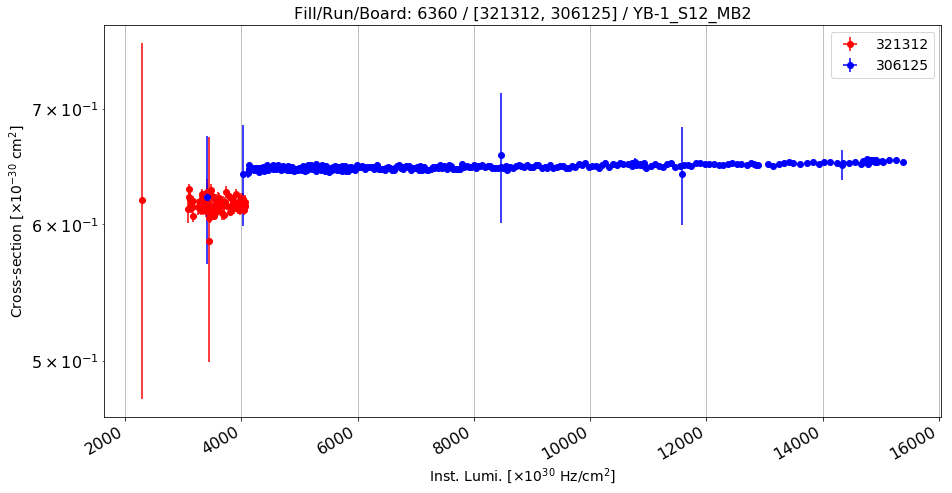

Anomalous CS: 0.616361476857 , Normal CS: 0.649342257301 , Ratio: 0.0507910582953


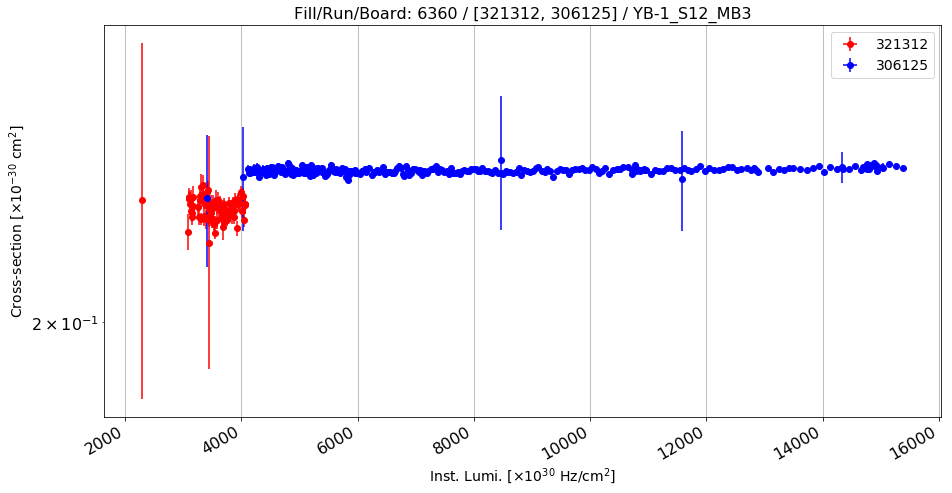

Anomalous CS: 0.232102267671 , Normal CS: 0.244048187868 , Ratio: 0.0489490223269


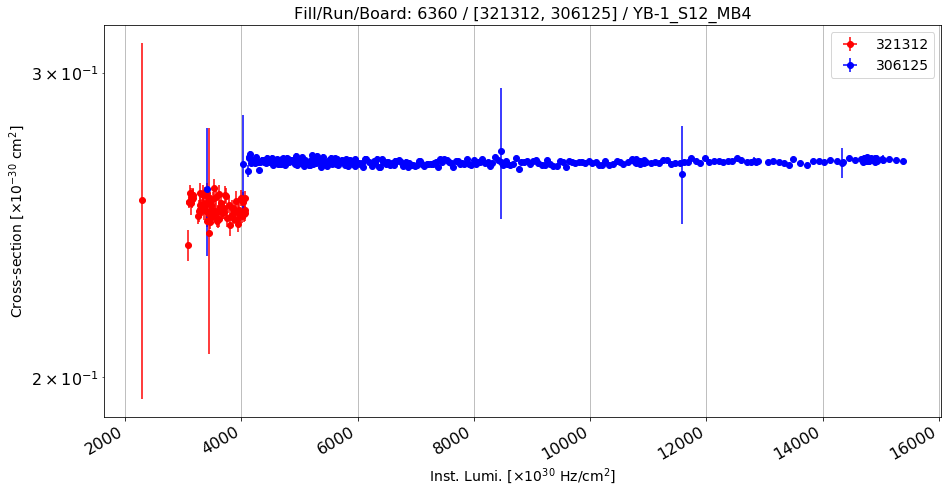

Anomalous CS: 0.250671341422 , Normal CS: 0.266414714995 , Ratio: 0.0590934835309


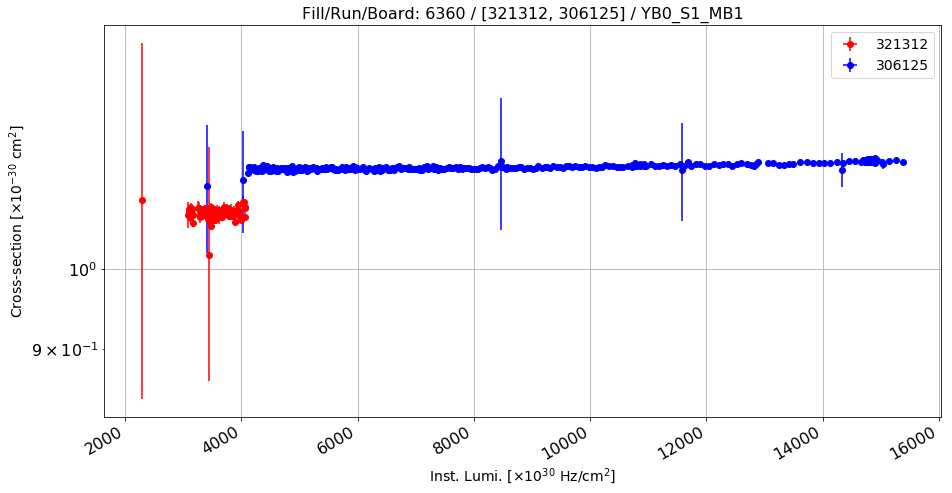

Anomalous CS: 1.07705036214 , Normal CS: 1.14712546589 , Ratio: 0.0610875669941


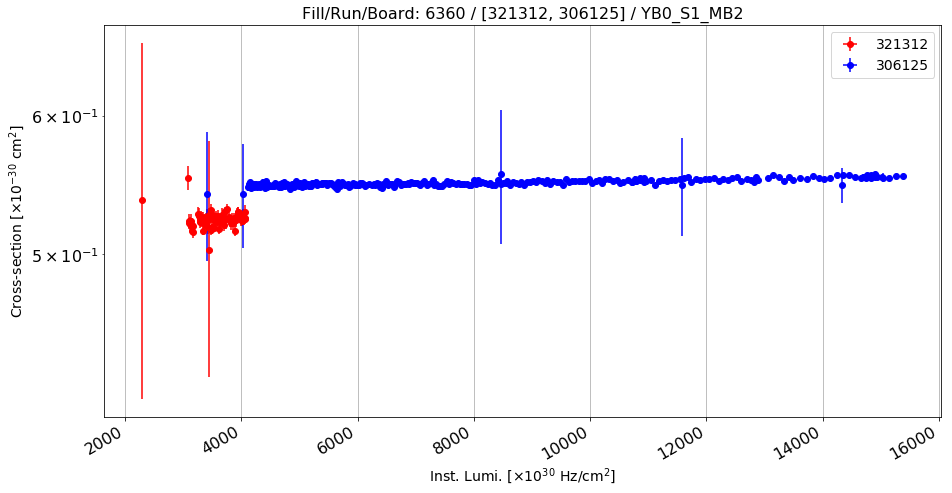

Anomalous CS: 0.523363369512 , Normal CS: 0.550633433863 , Ratio: 0.049524897462


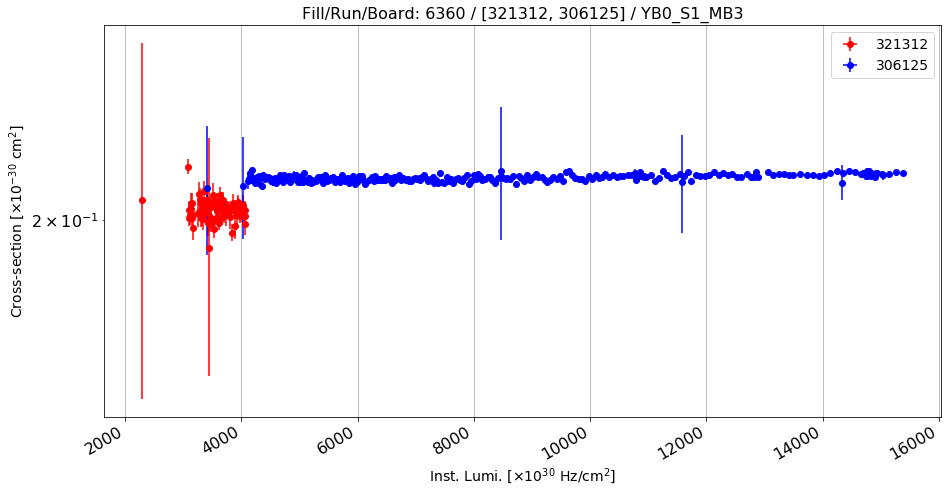

Anomalous CS: 0.202502660603 , Normal CS: 0.211791157176 , Ratio: 0.0438568668123


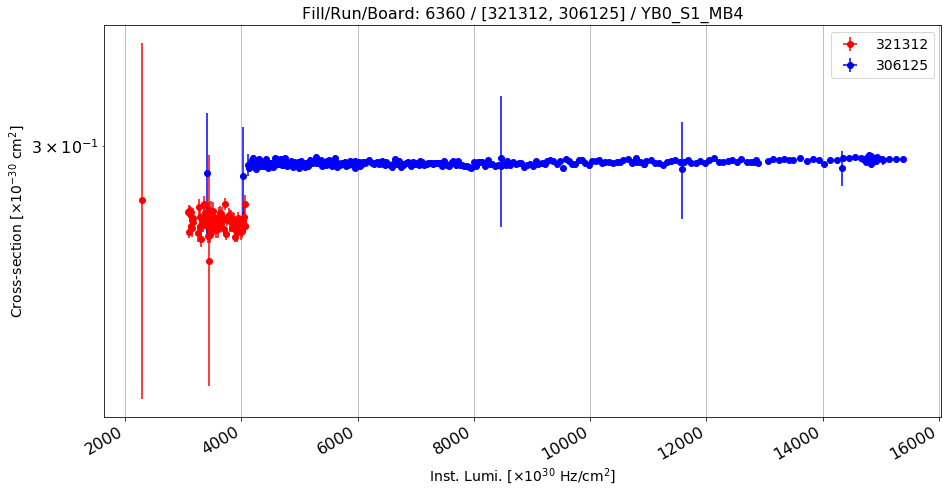

Anomalous CS: 0.270848657173 , Normal CS: 0.293464506649 , Ratio: 0.0770650247776


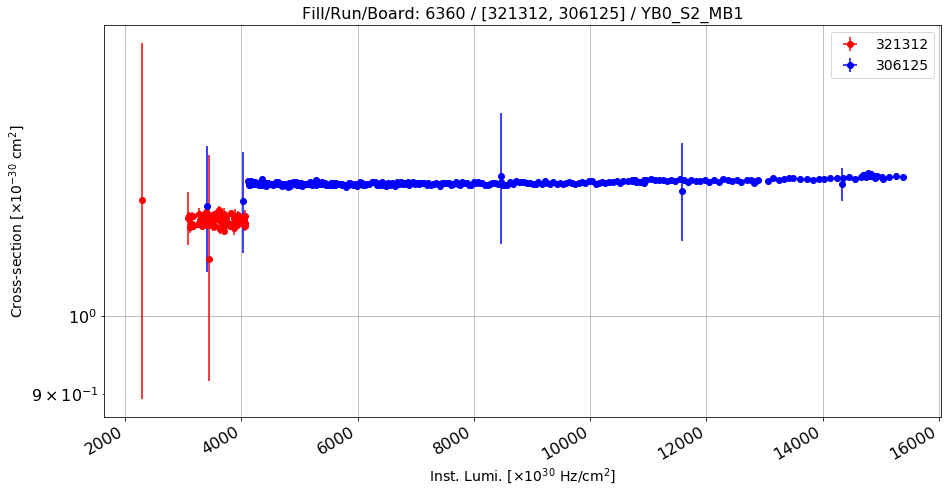

Anomalous CS: 1.13779750504 , Normal CS: 1.19989606877 , Ratio: 0.0517532854223


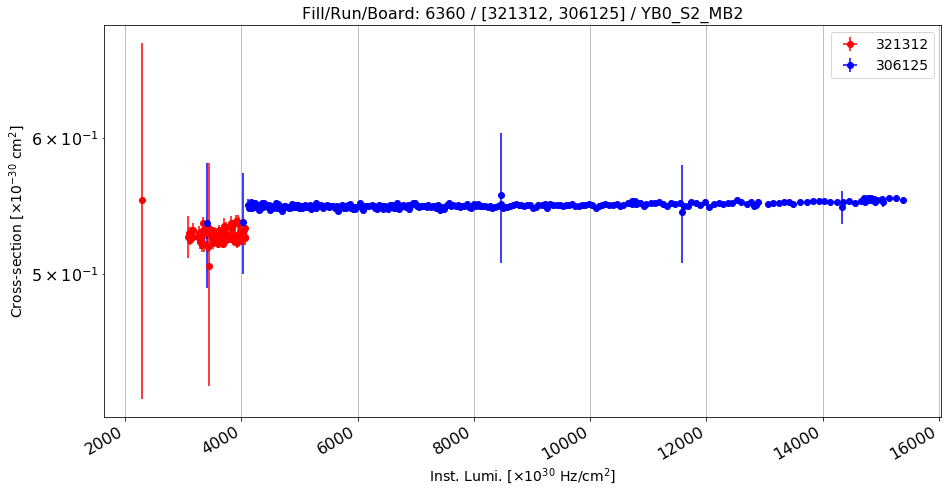

Anomalous CS: 0.527352831143 , Normal CS: 0.549173648488 , Ratio: 0.0397339118595


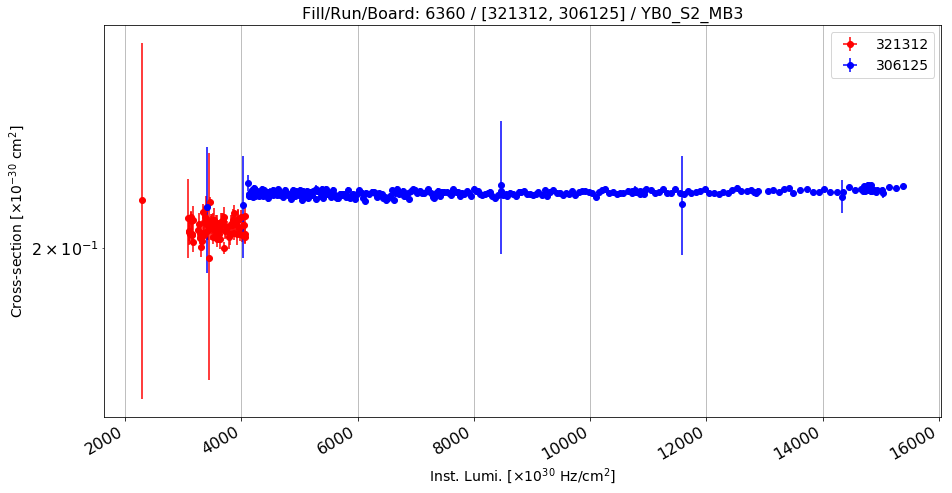

Anomalous CS: 0.205493538818 , Normal CS: 0.21536530948 , Ratio: 0.0458373295405


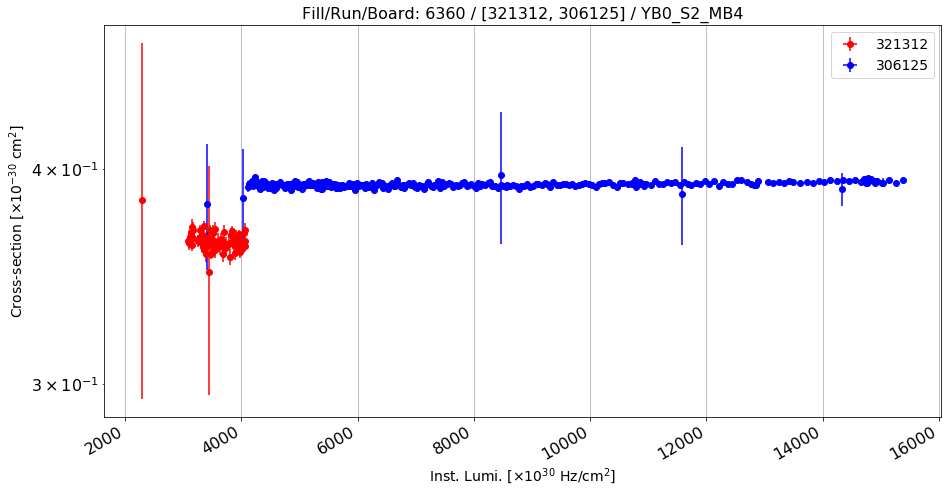

Anomalous CS: 0.363222451366 , Normal CS: 0.392214151493 , Ratio: 0.0739180369102


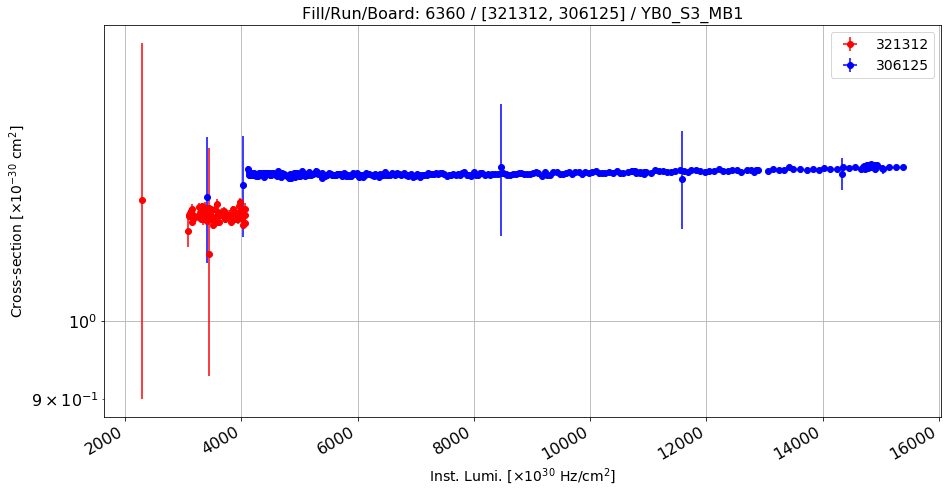

Anomalous CS: 1.15290565366 , Normal CS: 1.22193138828 , Ratio: 0.0564890429095


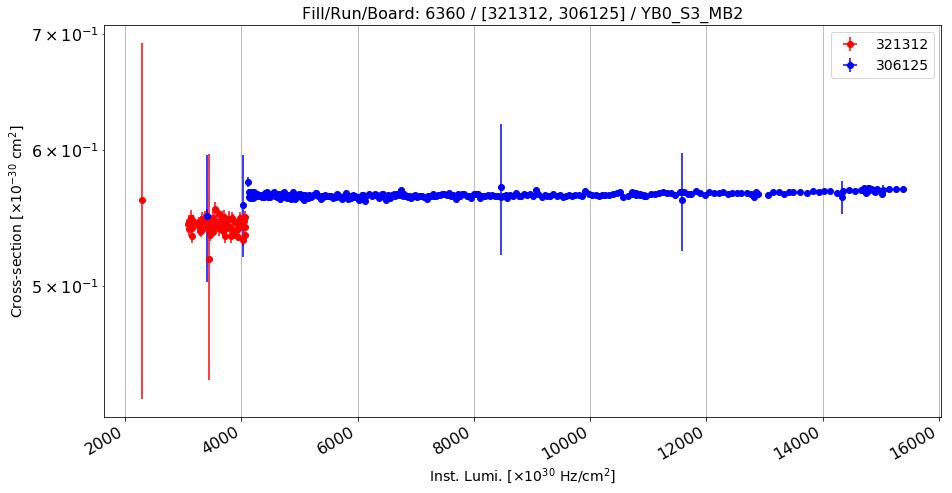

Anomalous CS: 0.542544550754 , Normal CS: 0.565428551774 , Ratio: 0.0404719587429


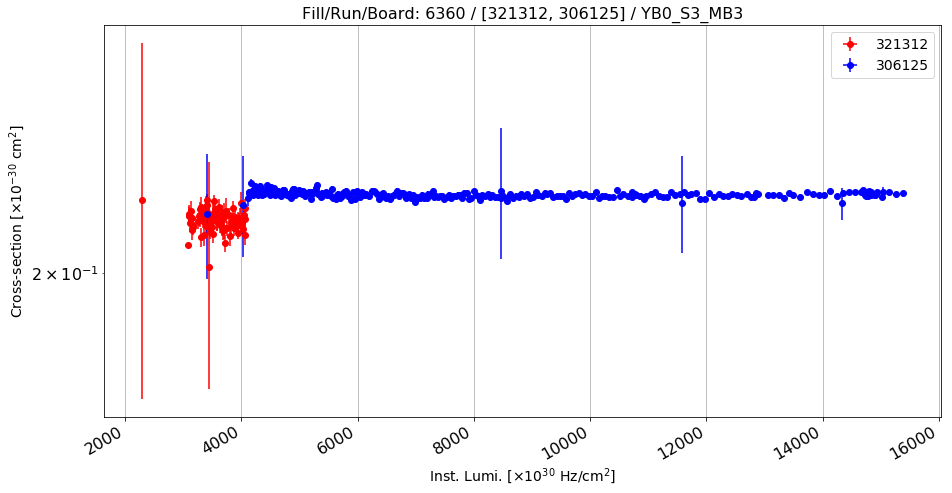

Anomalous CS: 0.214635421354 , Normal CS: 0.22197349729 , Ratio: 0.0330583426633


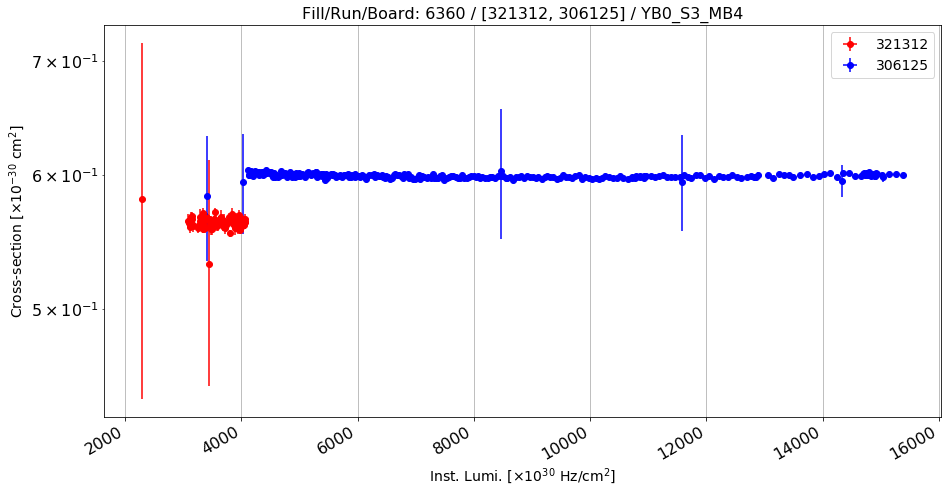

Anomalous CS: 0.56259085078 , Normal CS: 0.598688055814 , Ratio: 0.0602938453224


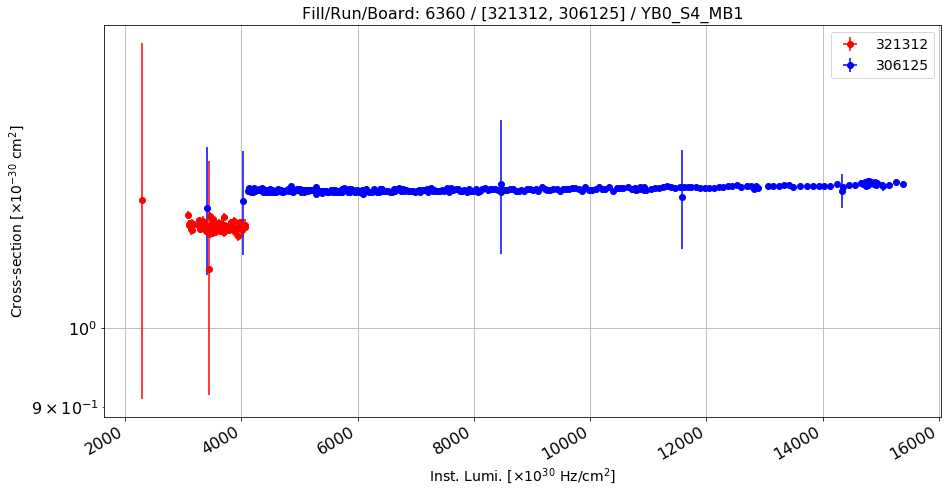

Anomalous CS: 1.14342989129 , Normal CS: 1.20305938382 , Ratio: 0.0495648787865


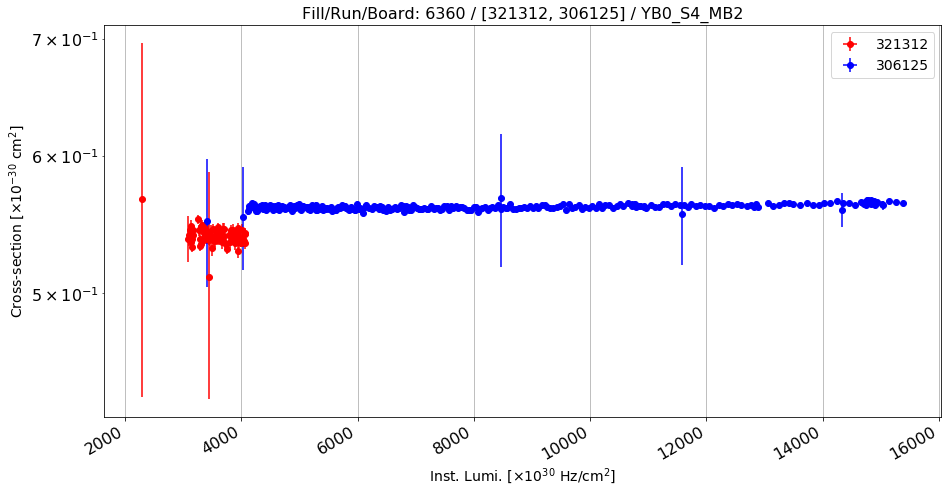

Anomalous CS: 0.539357715369 , Normal CS: 0.561257973148 , Ratio: 0.0390199495186


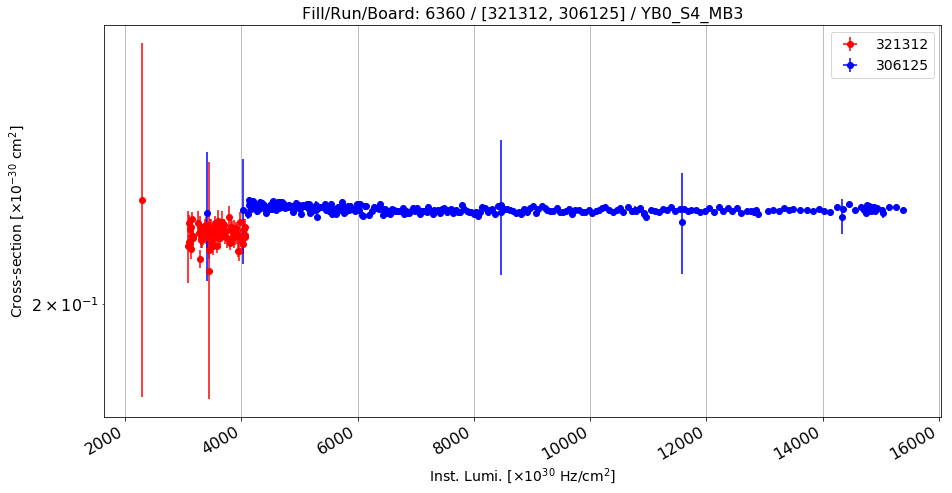

Anomalous CS: 0.218984730292 , Normal CS: 0.225847752605 , Ratio: 0.0303878264593


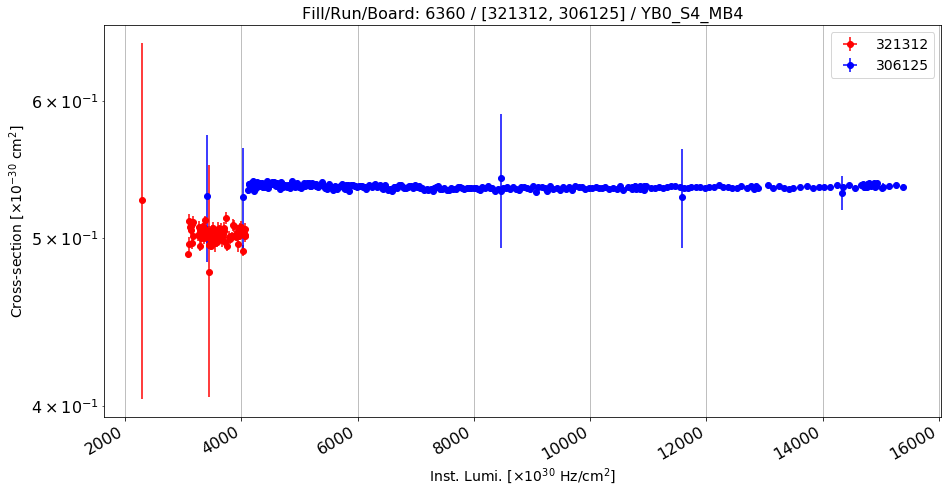

Anomalous CS: 0.502735250555 , Normal CS: 0.534881169842 , Ratio: 0.0600991792184


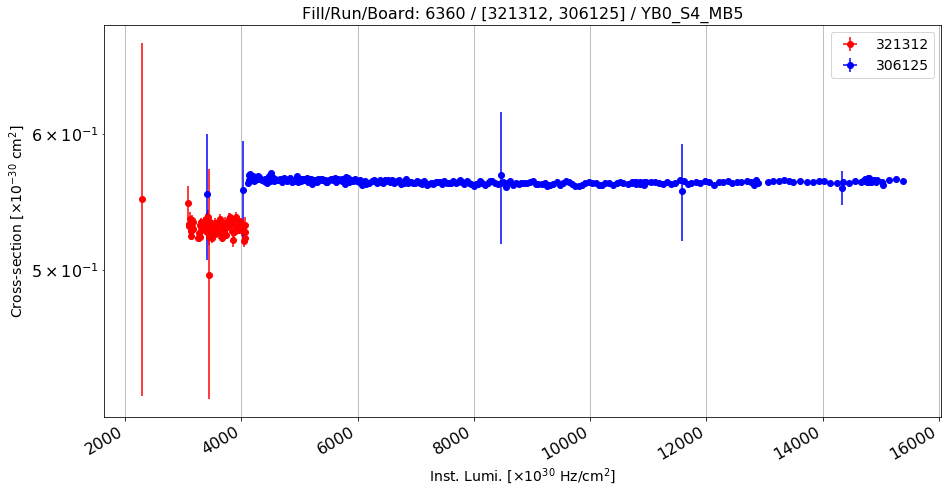

Anomalous CS: 0.529137785911 , Normal CS: 0.562301054541 , Ratio: 0.0589777813192


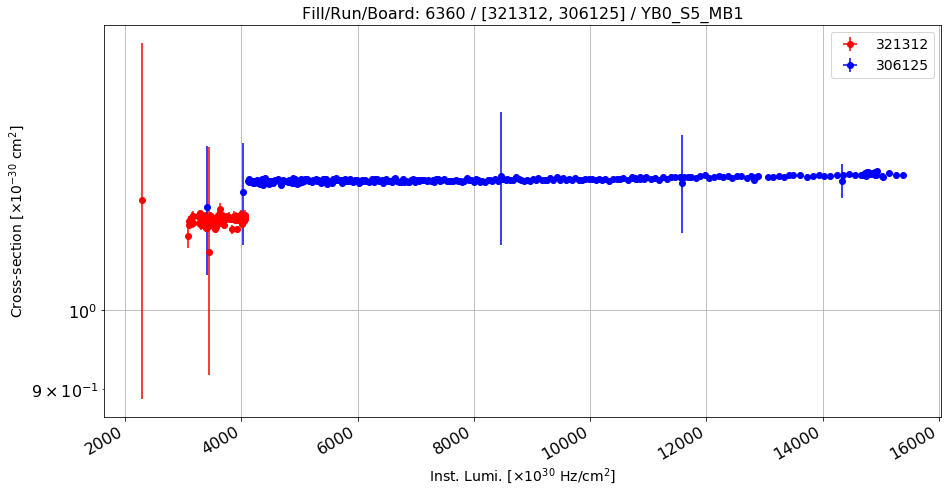

Anomalous CS: 1.12778906836 , Normal CS: 1.19261353824 , Ratio: 0.0543549673025


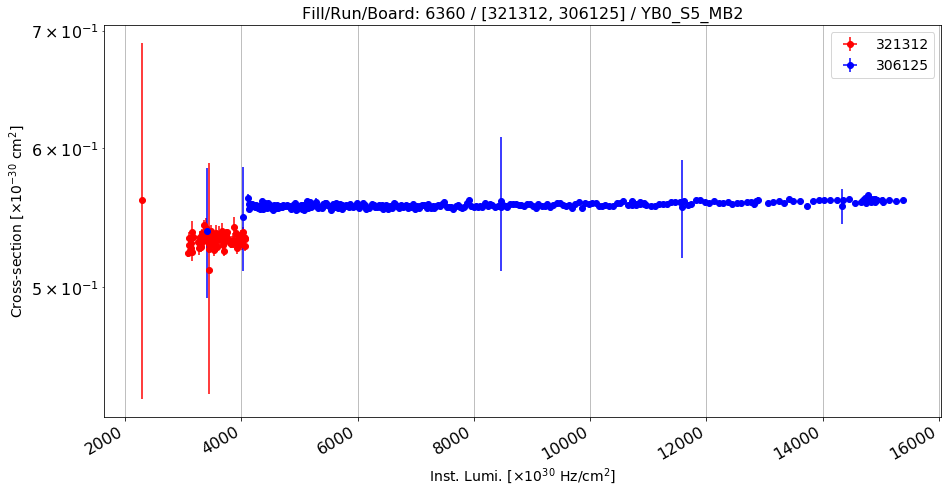

Anomalous CS: 0.532201996165 , Normal CS: 0.557877624456 , Ratio: 0.0460237642912


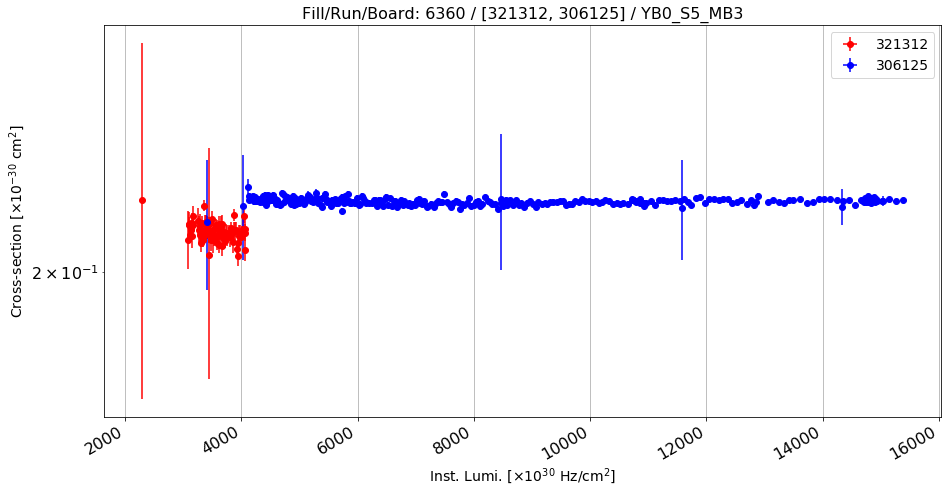

Anomalous CS: 0.210860933857 , Normal CS: 0.219161099297 , Ratio: 0.0378724393416


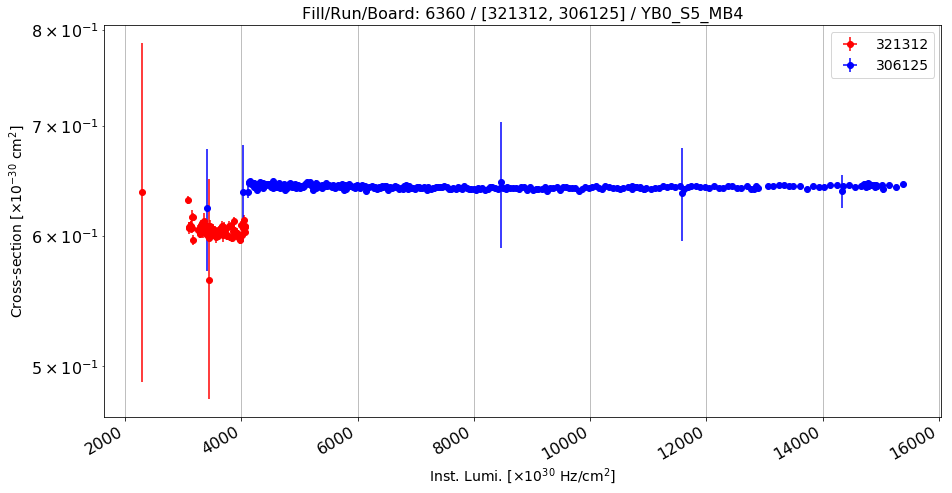

Anomalous CS: 0.605177712307 , Normal CS: 0.642198610515 , Ratio: 0.0576471166419


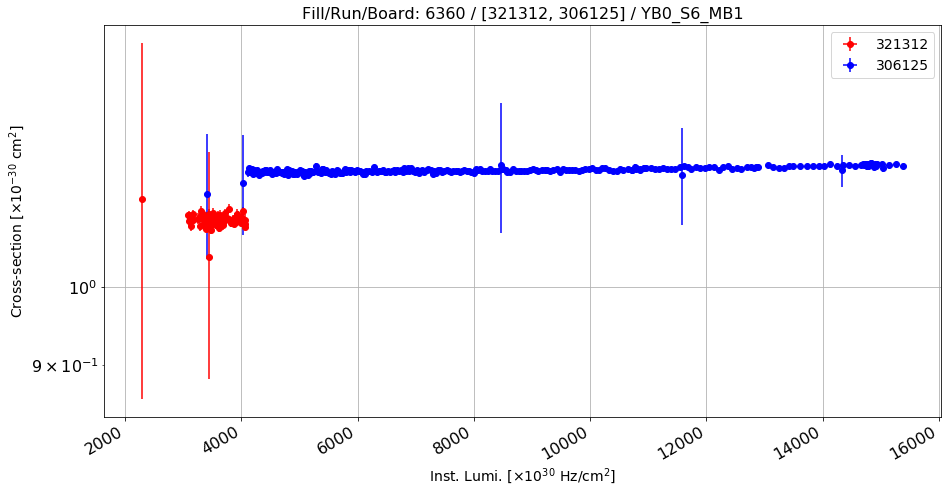

Anomalous CS: 1.09584387639 , Normal CS: 1.17459920733 , Ratio: 0.06704868388


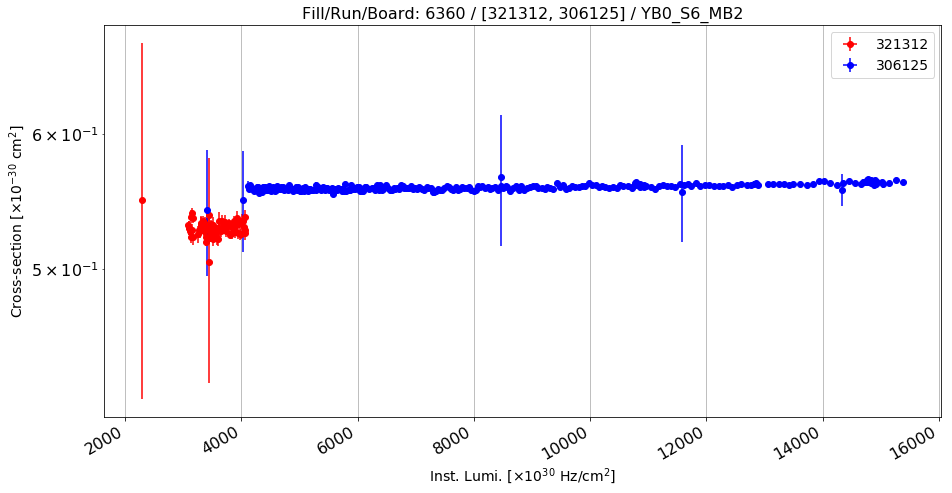

Anomalous CS: 0.5283610866 , Normal CS: 0.559068692835 , Ratio: 0.0549263563293


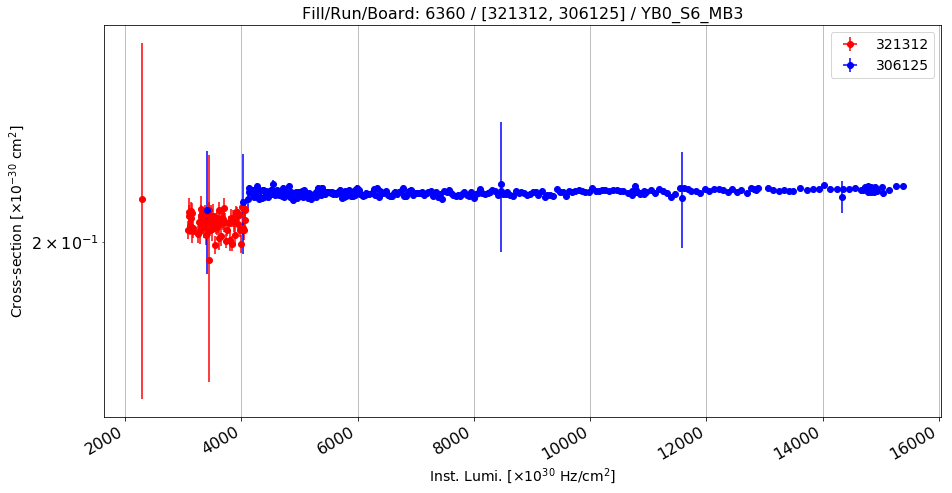

Anomalous CS: 0.205270754076 , Normal CS: 0.214213856216 , Ratio: 0.0417484764911


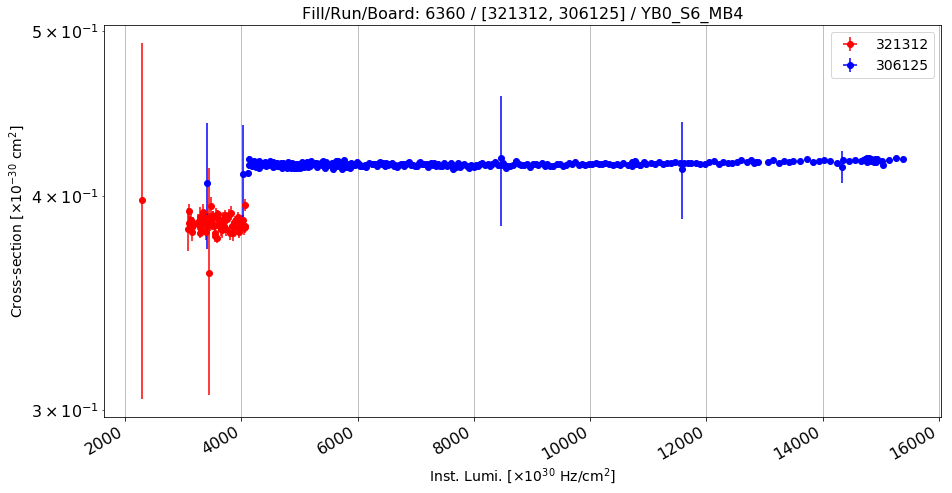

Anomalous CS: 0.385667964859 , Normal CS: 0.418139573461 , Ratio: 0.0776573437754


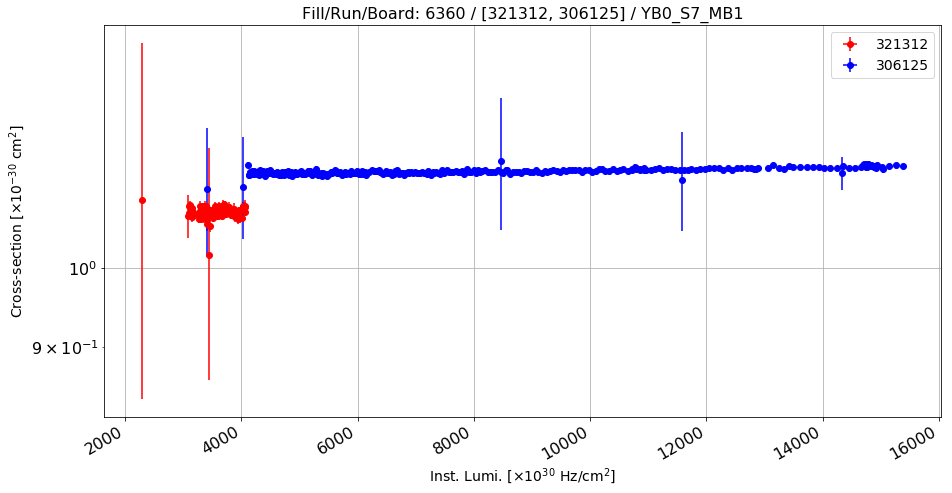

Anomalous CS: 1.07746677502 , Normal CS: 1.14055461575 , Ratio: 0.0553133009609


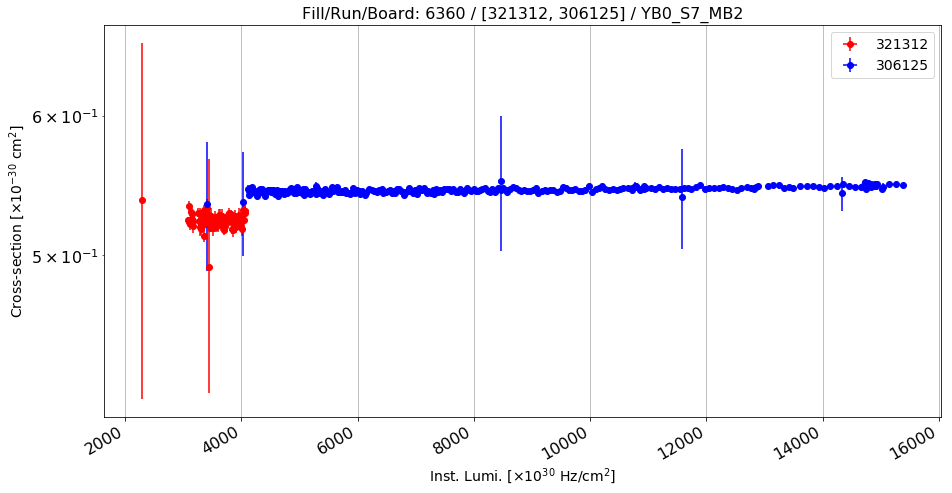

Anomalous CS: 0.523343769978 , Normal CS: 0.545325734492 , Ratio: 0.040309787571


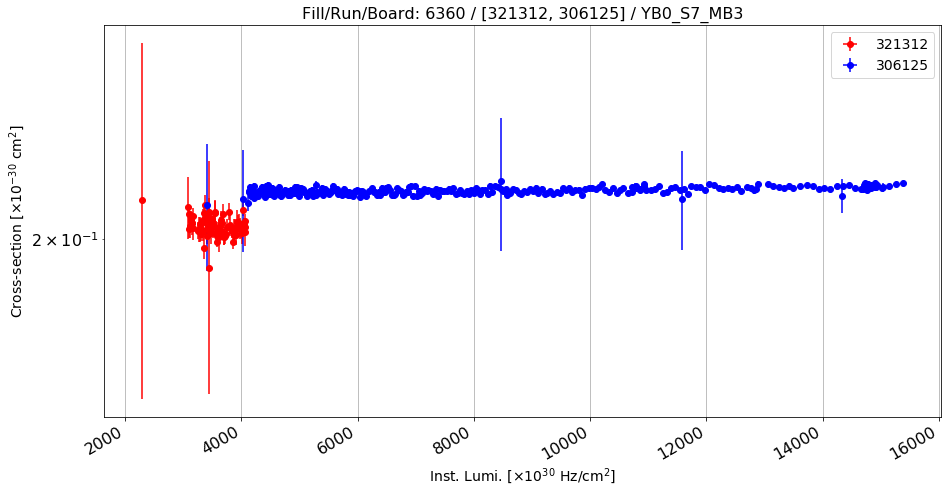

Anomalous CS: 0.203348558663 , Normal CS: 0.21346631506 , Ratio: 0.0473974378294


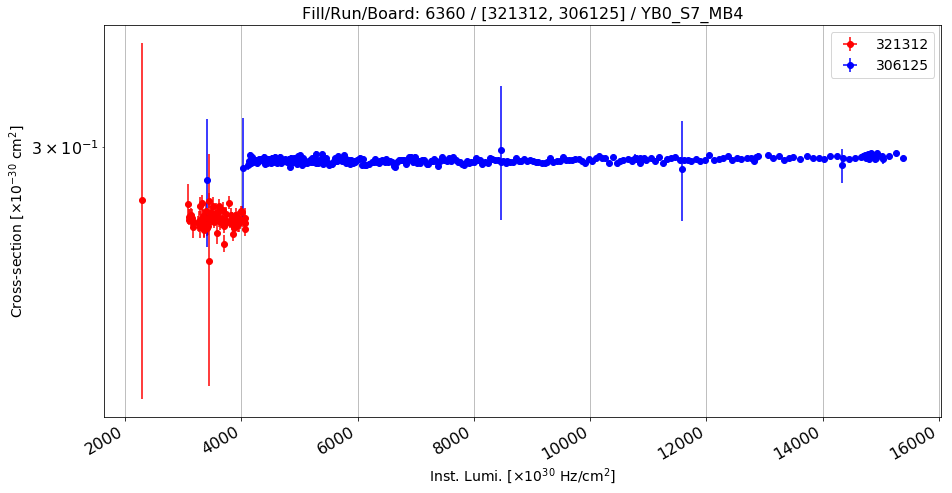

Anomalous CS: 0.27311480607 , Normal CS: 0.295220330368 , Ratio: 0.0748780555564


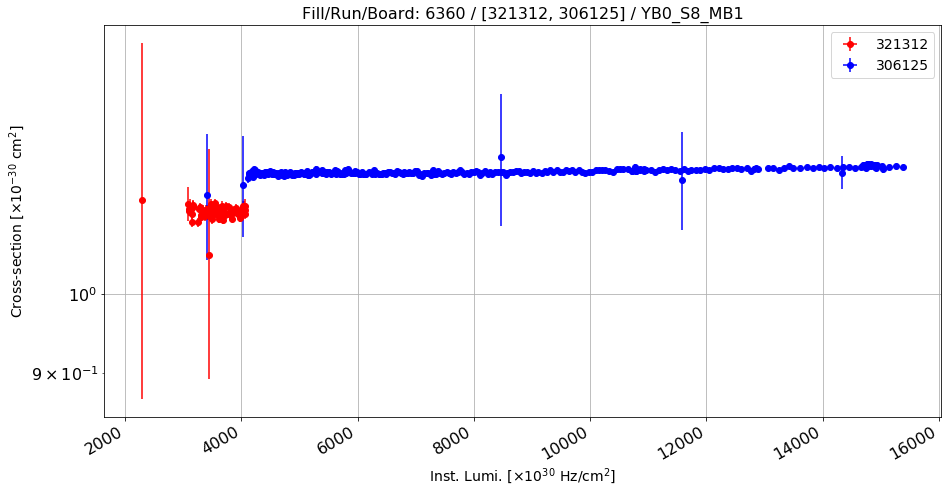

Anomalous CS: 1.11671555735 , Normal CS: 1.18071560271 , Ratio: 0.0542044546624


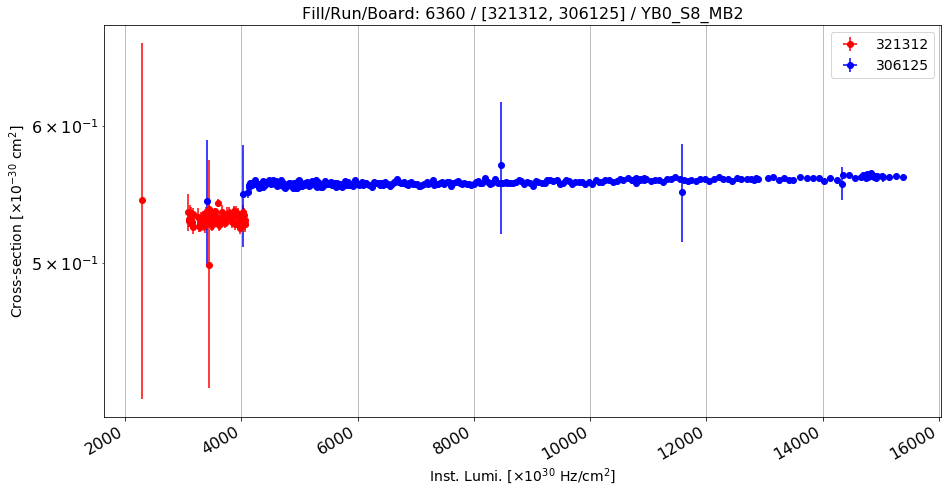

Anomalous CS: 0.530300446606 , Normal CS: 0.557993355803 , Ratio: 0.0496294604754


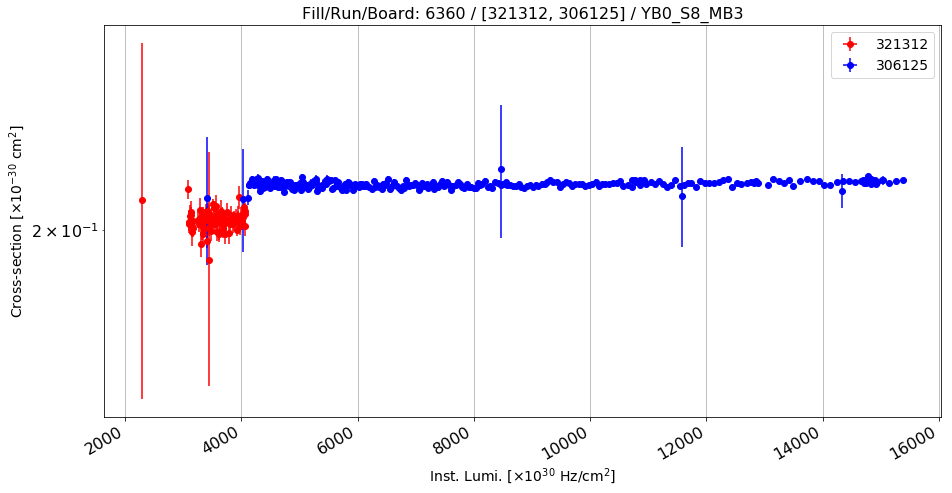

Anomalous CS: 0.202527715375 , Normal CS: 0.212539785661 , Ratio: 0.0471068052283


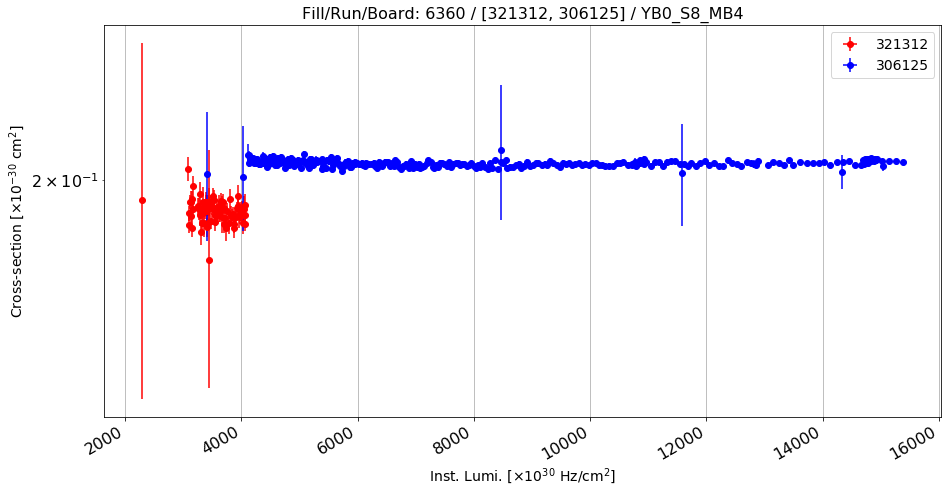

Anomalous CS: 0.191990065333 , Normal CS: 0.204202617074 , Ratio: 0.0598060490934


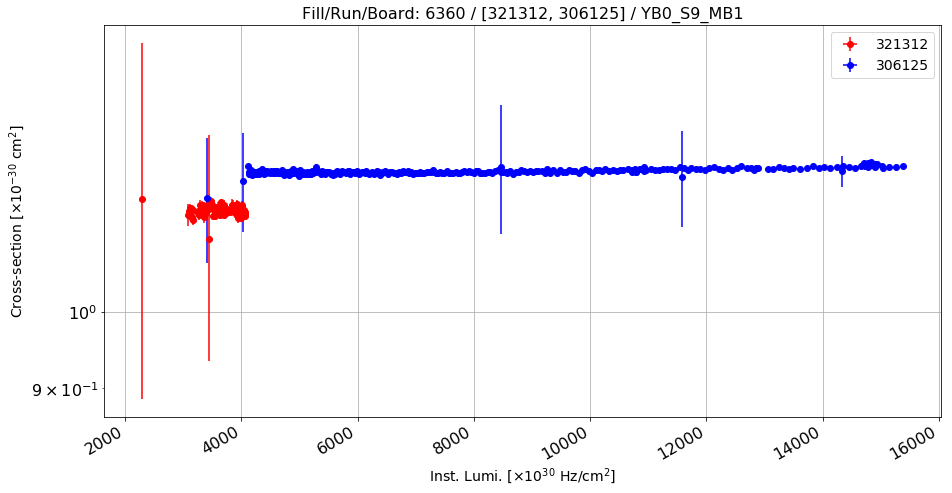

Anomalous CS: 1.14878517791 , Normal CS: 1.21401551699 , Ratio: 0.0537310587588


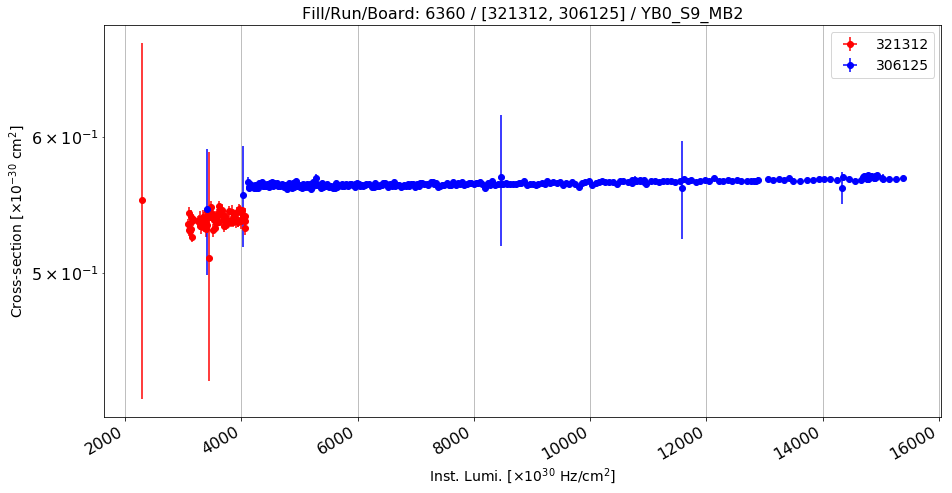

Anomalous CS: 0.537556743782 , Normal CS: 0.56506744653 , Ratio: 0.0486856974637


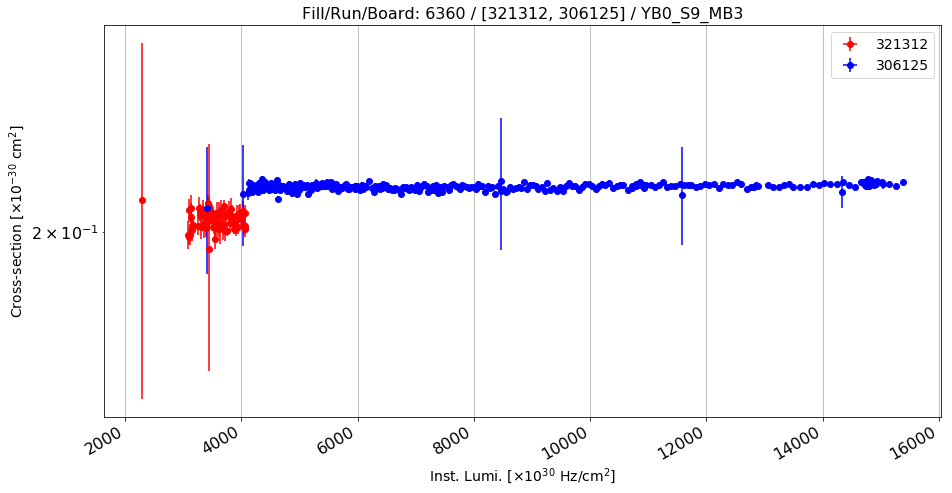

Anomalous CS: 0.20313371489 , Normal CS: 0.212494376124 , Ratio: 0.0440513363437


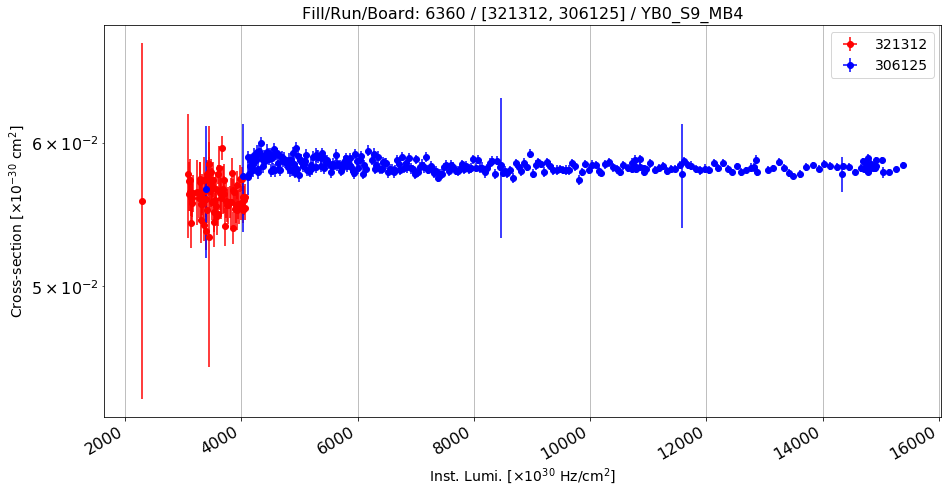

Anomalous CS: 0.0560716625445 , Normal CS: 0.0581602888854 , Ratio: 0.0359115537584


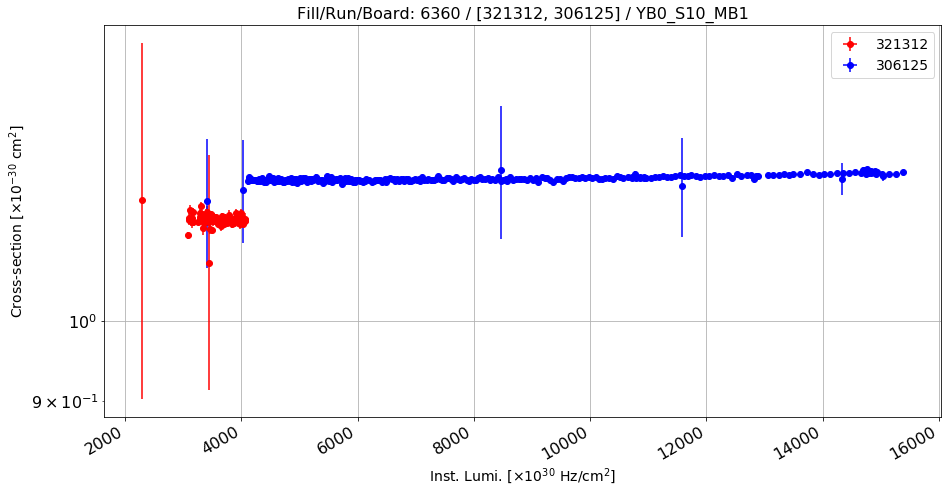

Anomalous CS: 1.14350730799 , Normal CS: 1.2097328694 , Ratio: 0.0547439547032


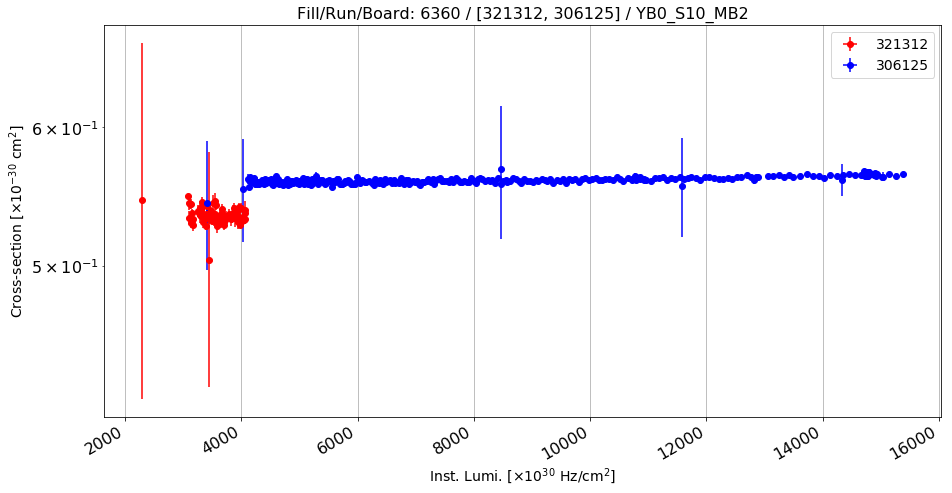

Anomalous CS: 0.534347058711 , Normal CS: 0.560634163375 , Ratio: 0.0468881605542


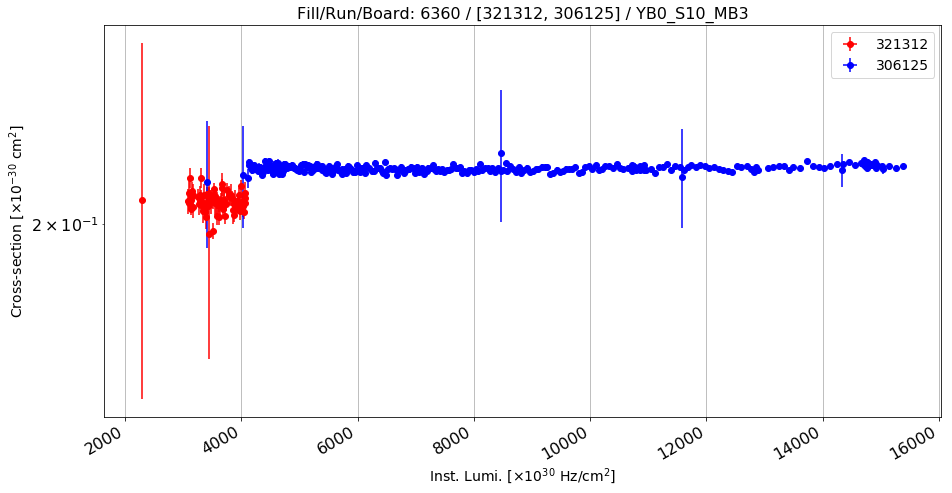

Anomalous CS: 0.205875631287 , Normal CS: 0.215239209677 , Ratio: 0.0435031256806


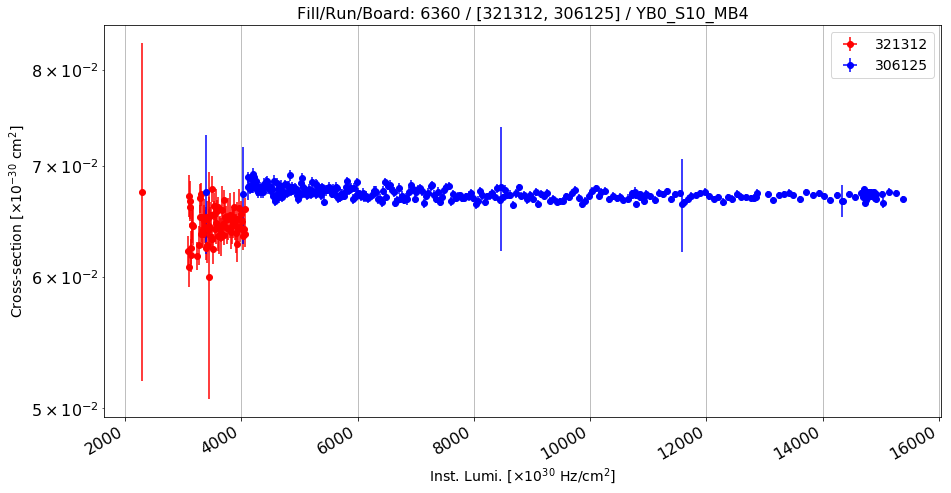

Anomalous CS: 0.0645244346775 , Normal CS: 0.067191895338 , Ratio: 0.0396991429859


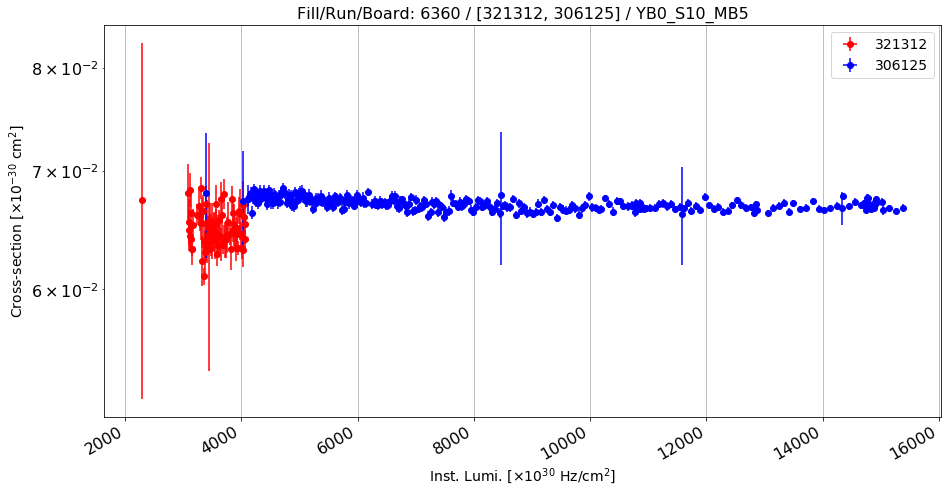

Anomalous CS: 0.0649487473246 , Normal CS: 0.0668932721037 , Ratio: 0.029069063569


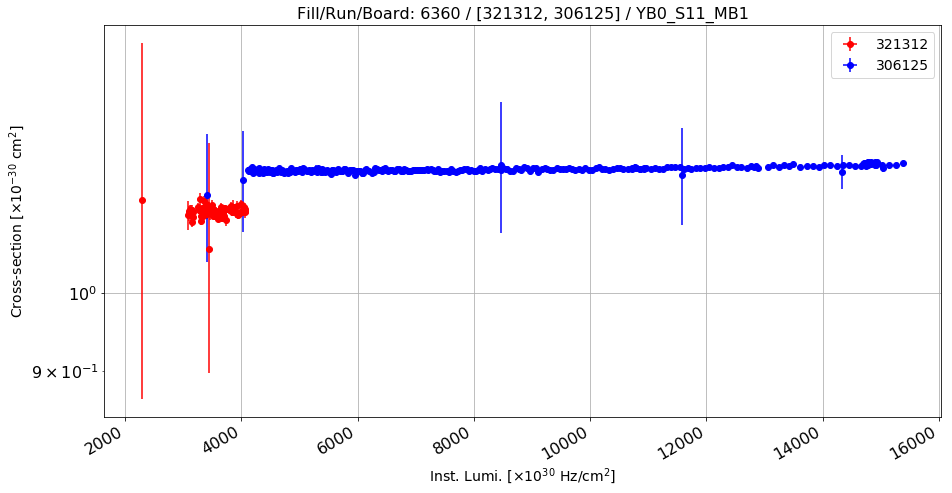

Anomalous CS: 1.11483051561 , Normal CS: 1.18164723507 , Ratio: 0.0565454032931


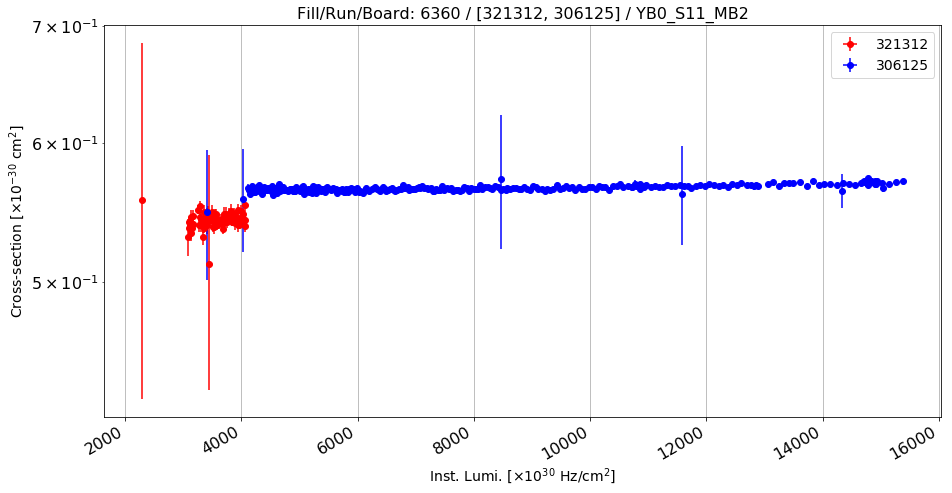

Anomalous CS: 0.541938014054 , Normal CS: 0.566548603882 , Ratio: 0.0434395030891


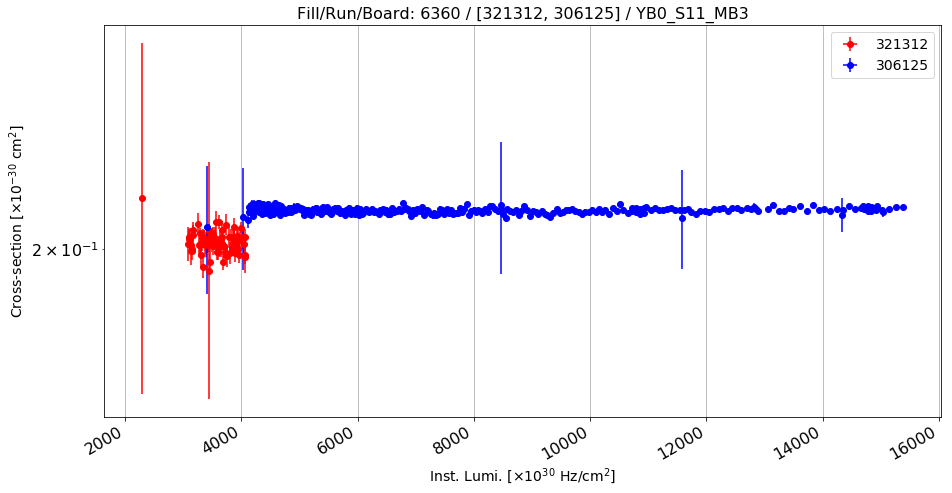

Anomalous CS: 0.201781496017 , Normal CS: 0.210514051444 , Ratio: 0.0414820548403


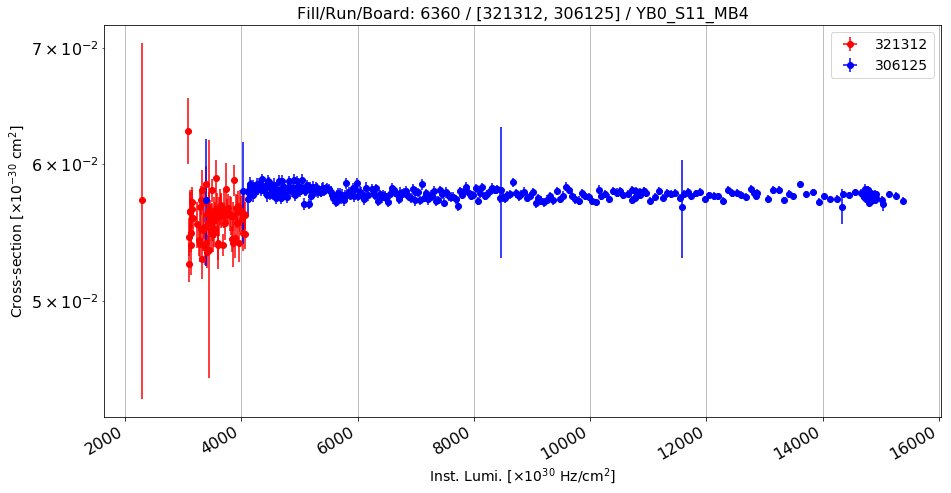

Anomalous CS: 0.0557753823513 , Normal CS: 0.057570486363 , Ratio: 0.0311809770097


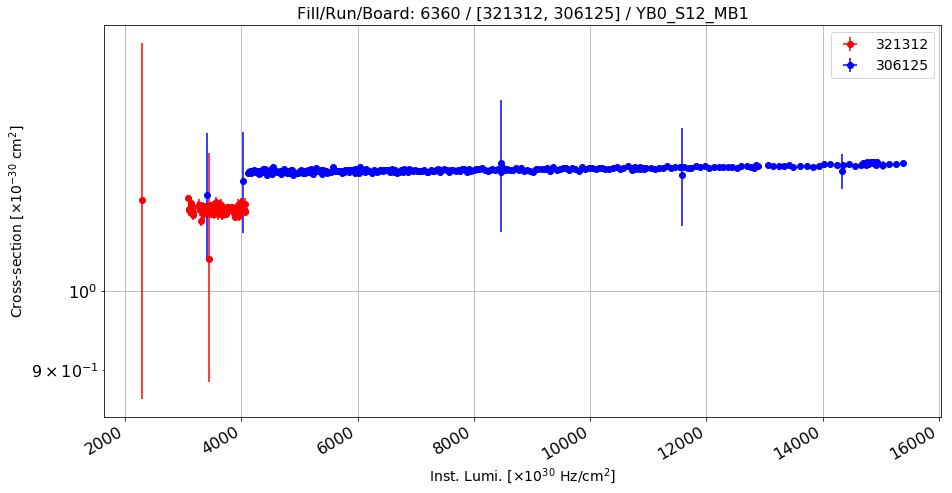

Anomalous CS: 1.11579389903 , Normal CS: 1.17938859876 , Ratio: 0.0539217521618


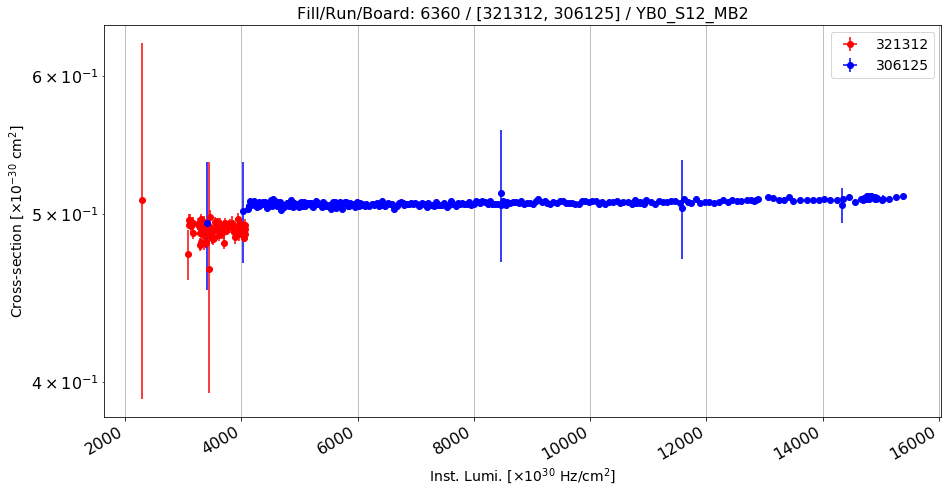

Anomalous CS: 0.489388550017 , Normal CS: 0.507879132056 , Ratio: 0.0364074459289


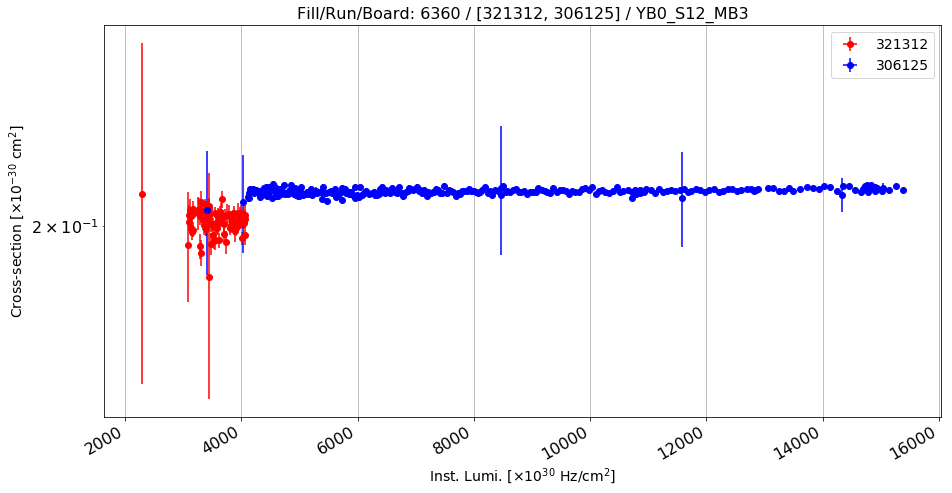

Anomalous CS: 0.20098986102 , Normal CS: 0.209853563675 , Ratio: 0.0422375608029


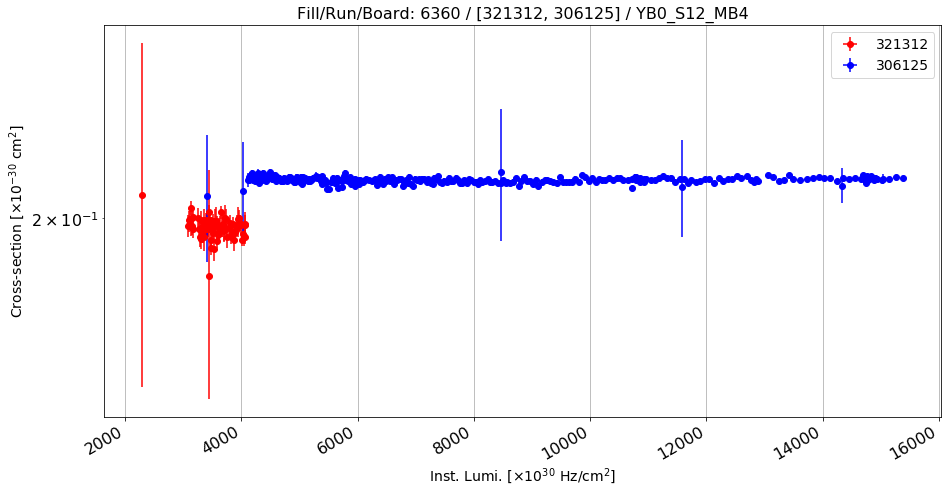

Anomalous CS: 0.197628292951 , Normal CS: 0.210549665495 , Ratio: 0.0613697129991


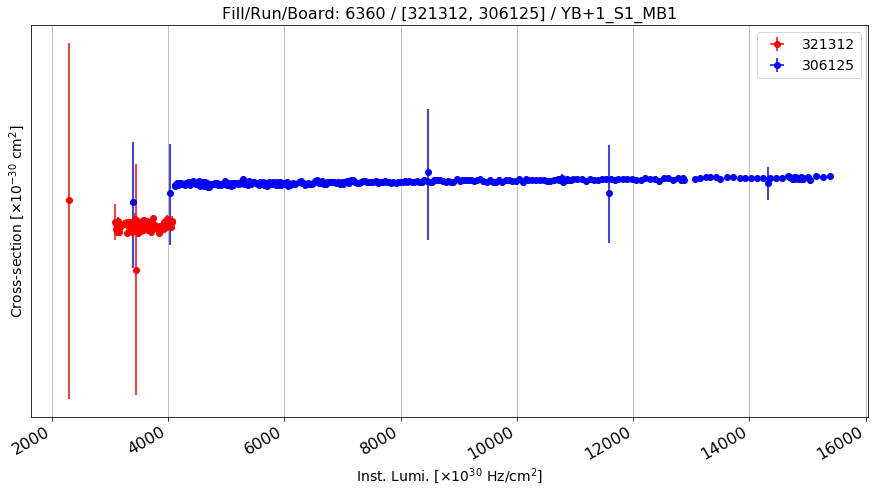

Anomalous CS: 1.50352006887 , Normal CS: 1.59832813267 , Ratio: 0.0593170212433


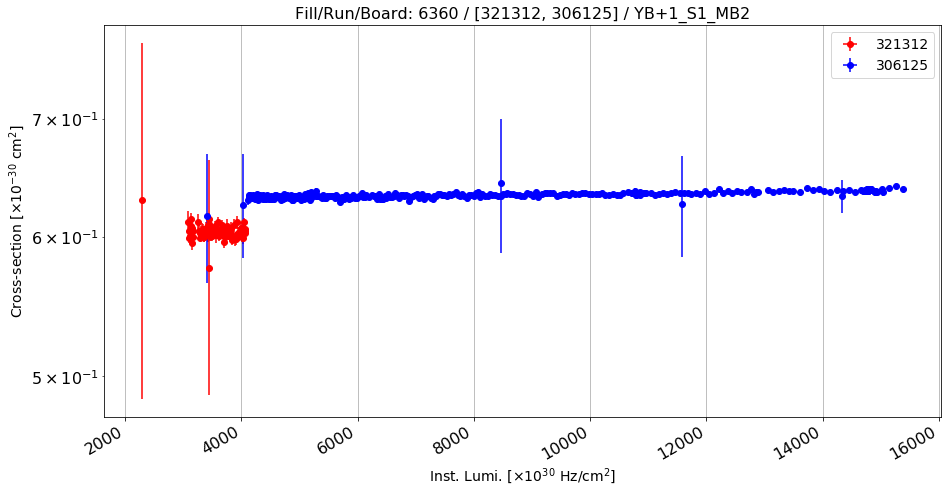

Anomalous CS: 0.603979348599 , Normal CS: 0.634848142154 , Ratio: 0.0486239015368


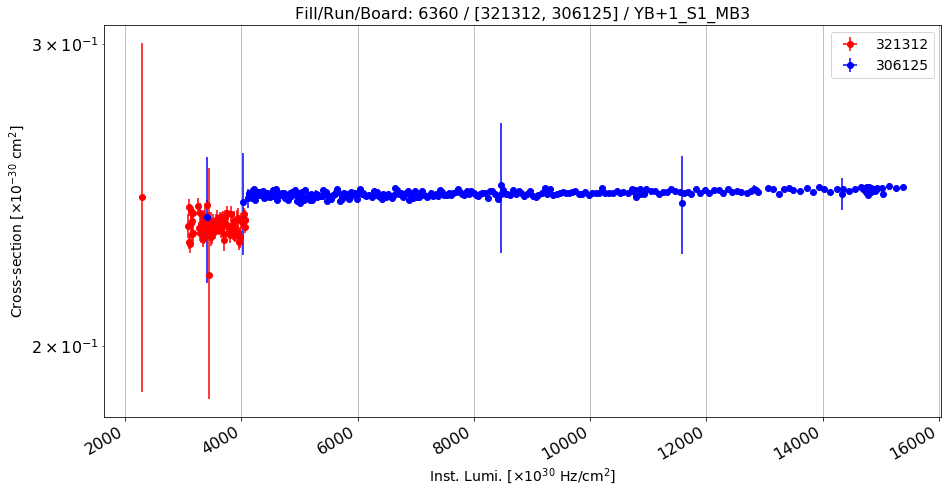

Anomalous CS: 0.23505879255 , Normal CS: 0.245791037076 , Ratio: 0.0436641004236


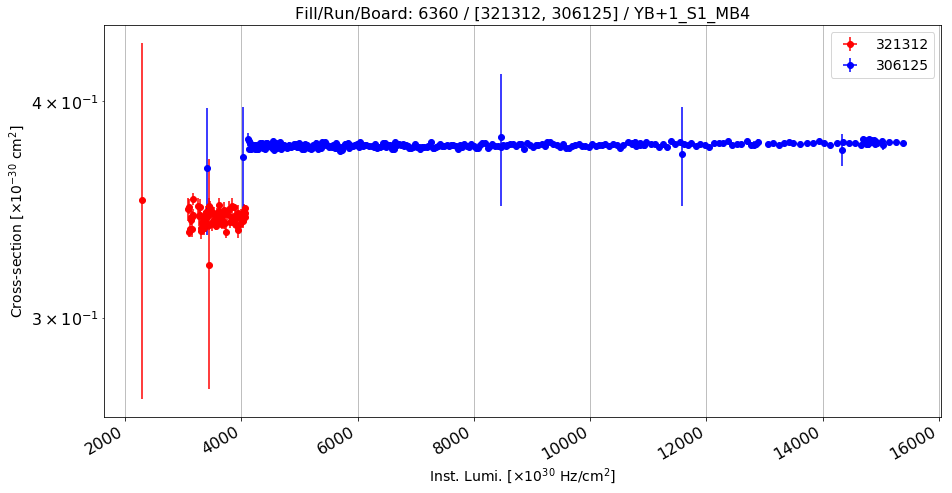

Anomalous CS: 0.342570464387 , Normal CS: 0.37770029455 , Ratio: 0.0930098034594


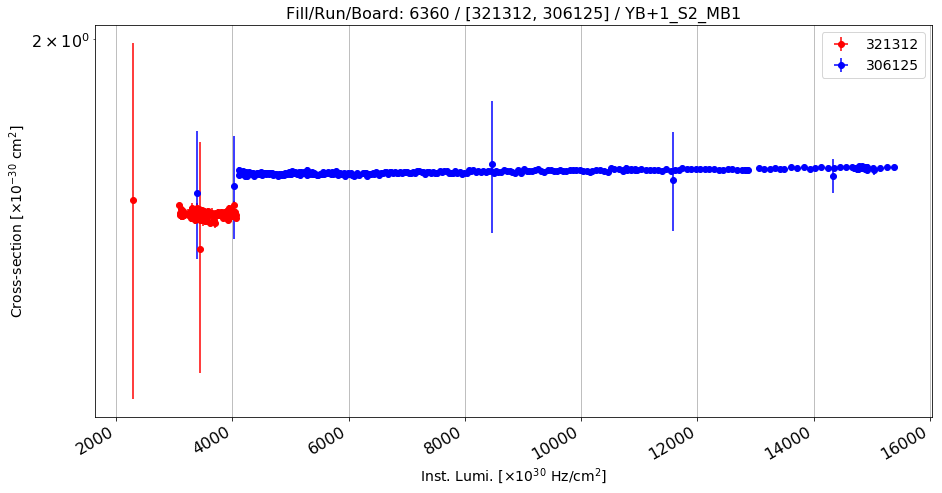

Anomalous CS: 1.58332591923 , Normal CS: 1.67945501433 , Ratio: 0.0572382673438


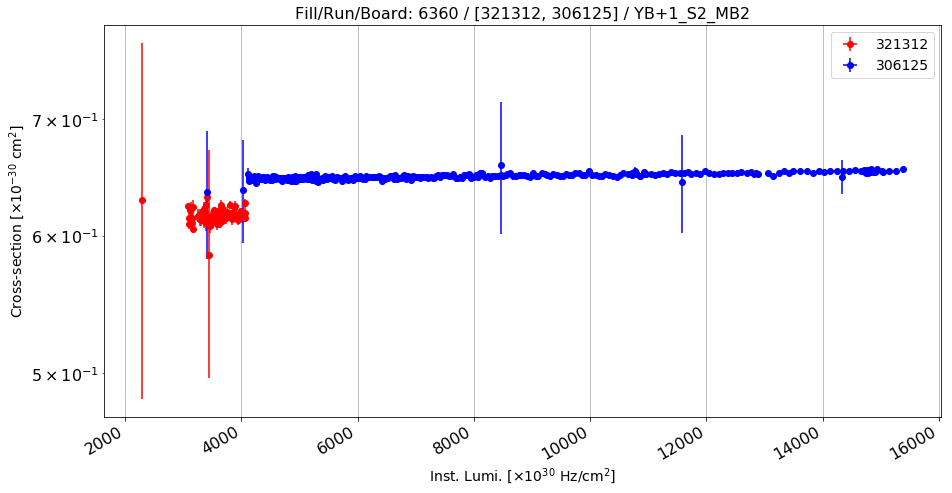

Anomalous CS: 0.61608678388 , Normal CS: 0.650740019374 , Ratio: 0.0532520430001


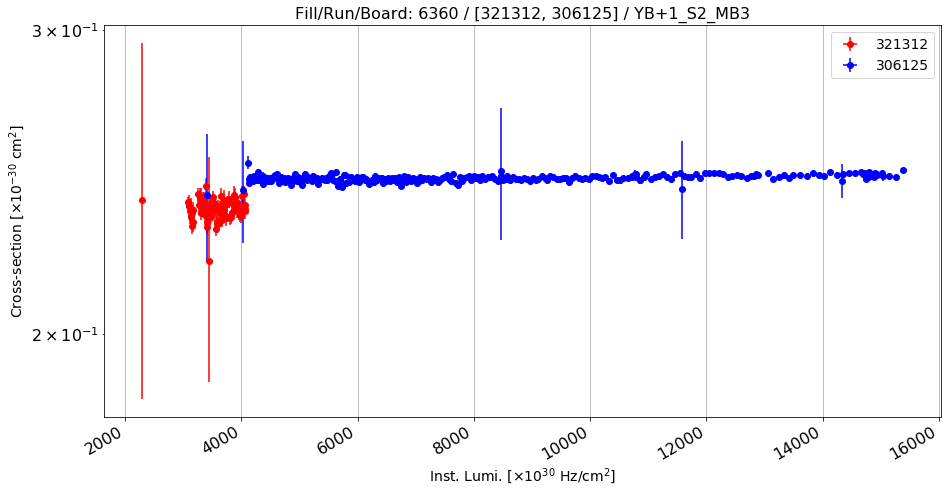

Anomalous CS: 0.236058629968 , Normal CS: 0.246359390243 , Ratio: 0.0418119247009


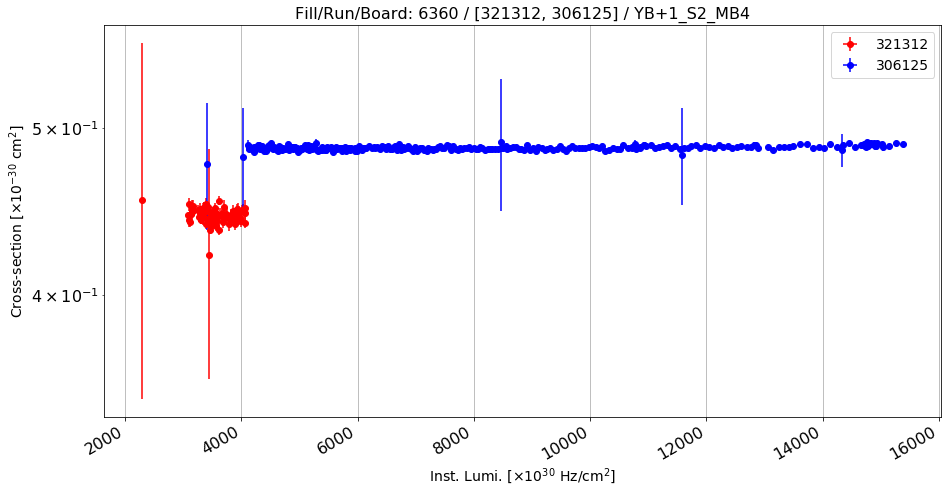

Anomalous CS: 0.444781529739 , Normal CS: 0.487127133519 , Ratio: 0.0869292652076


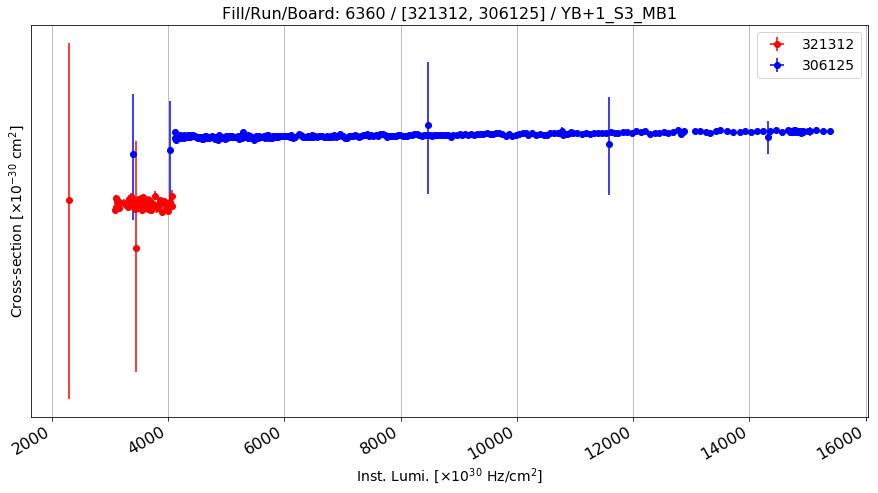

Anomalous CS: 1.56509766665 , Normal CS: 1.7195486583 , Ratio: 0.0898206578269


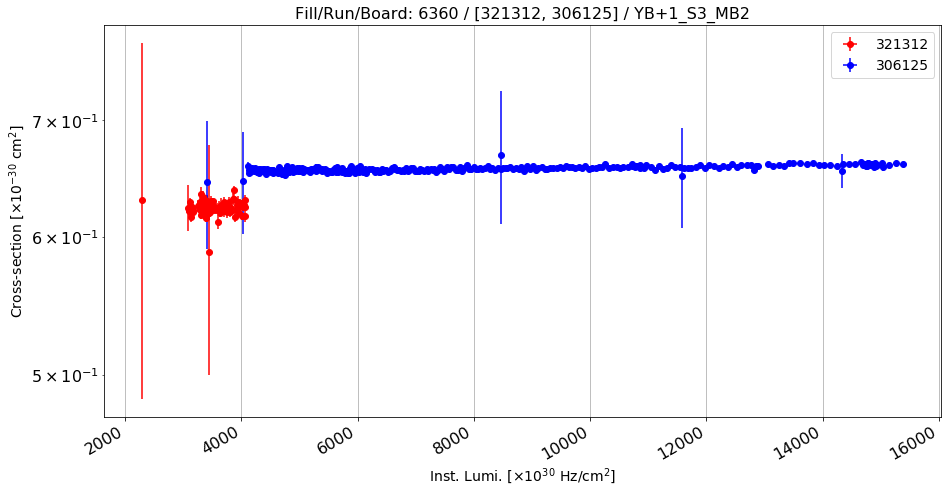

Anomalous CS: 0.623467780701 , Normal CS: 0.657814185327 , Ratio: 0.0522129278931


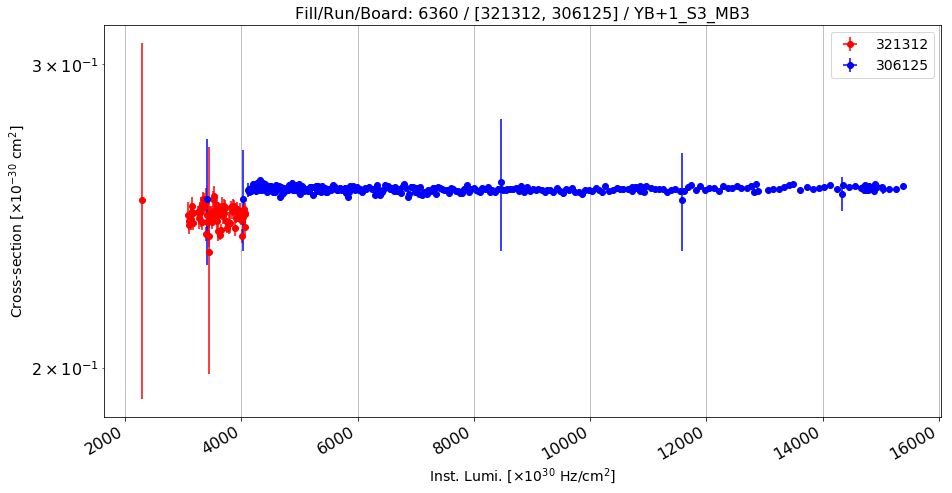

Anomalous CS: 0.245279826802 , Normal CS: 0.253992969396 , Ratio: 0.0343046605378


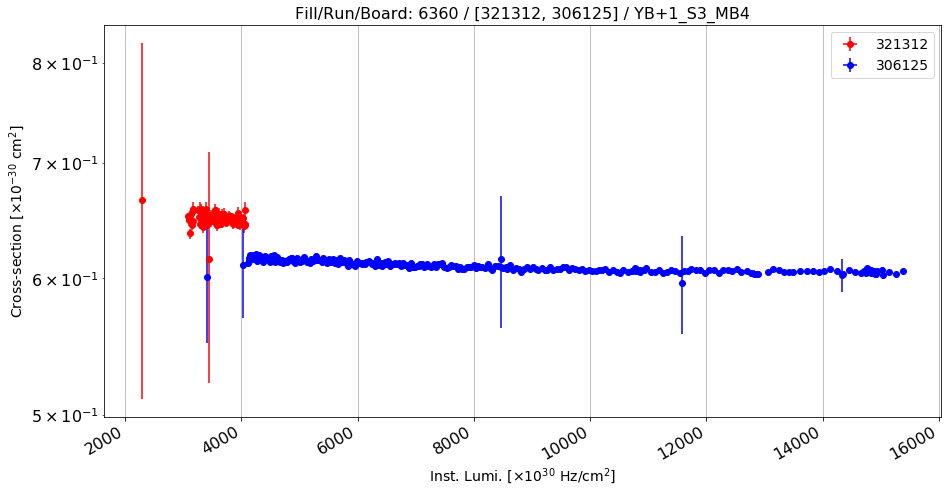

Anomalous CS: 0.649833676978 , Normal CS: 0.607864365281 , Ratio: -0.069043875731


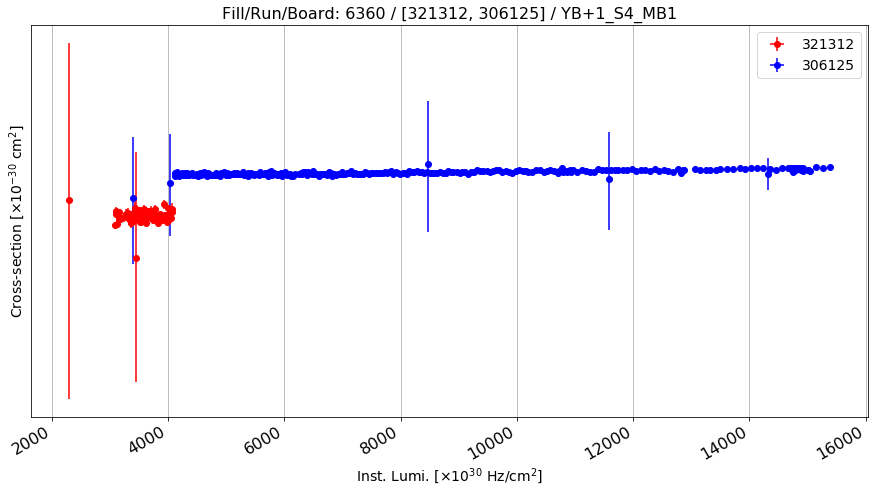

Anomalous CS: 1.35721055395 , Normal CS: 1.44042671769 , Ratio: 0.0577718829592


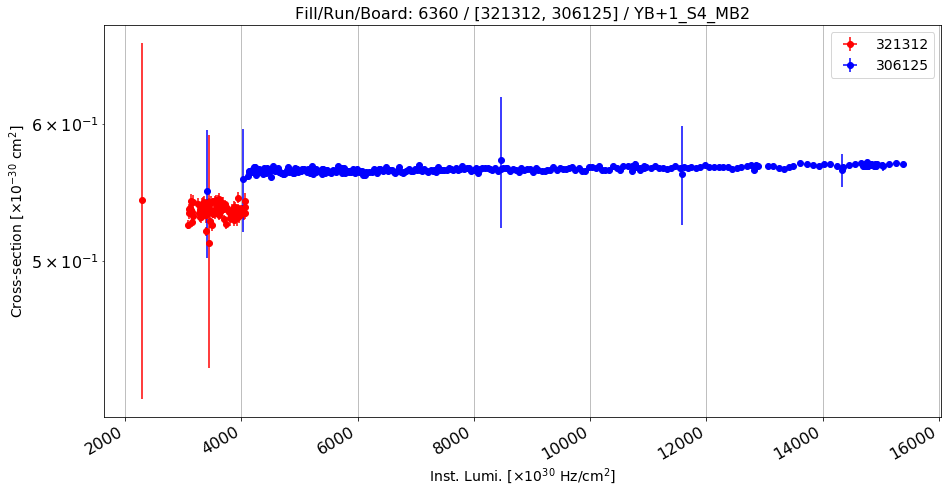

Anomalous CS: 0.53454558354 , Normal CS: 0.565521862974 , Ratio: 0.0547746806304


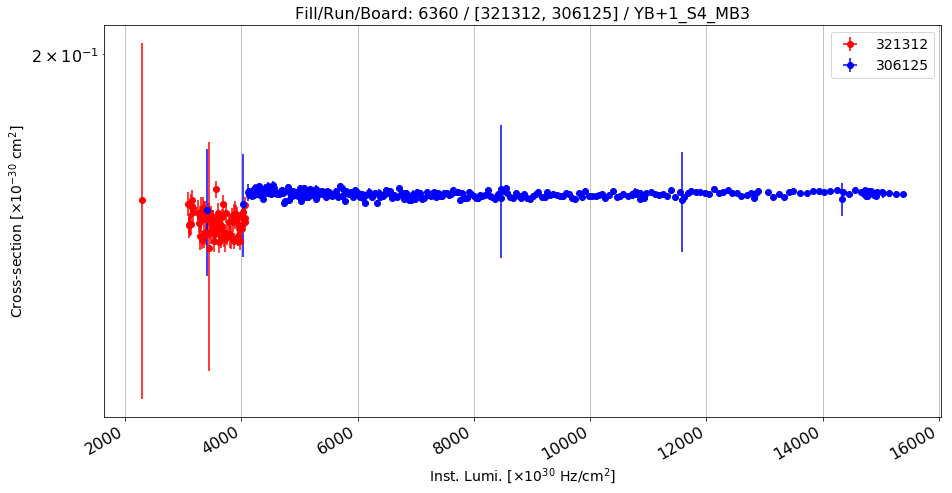

Anomalous CS: 0.160430530116 , Normal CS: 0.166404796289 , Ratio: 0.0359020070747


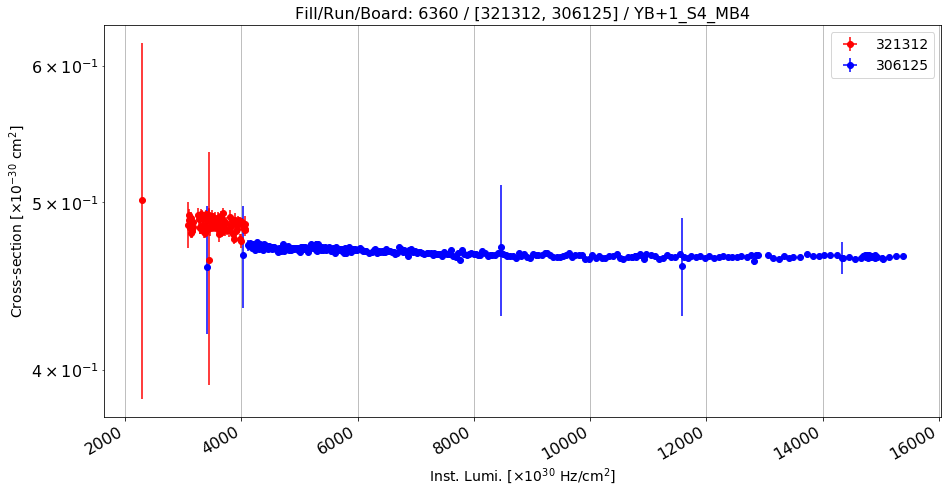

Anomalous CS: 0.485456807083 , Normal CS: 0.466109352709 , Ratio: -0.0415084019706


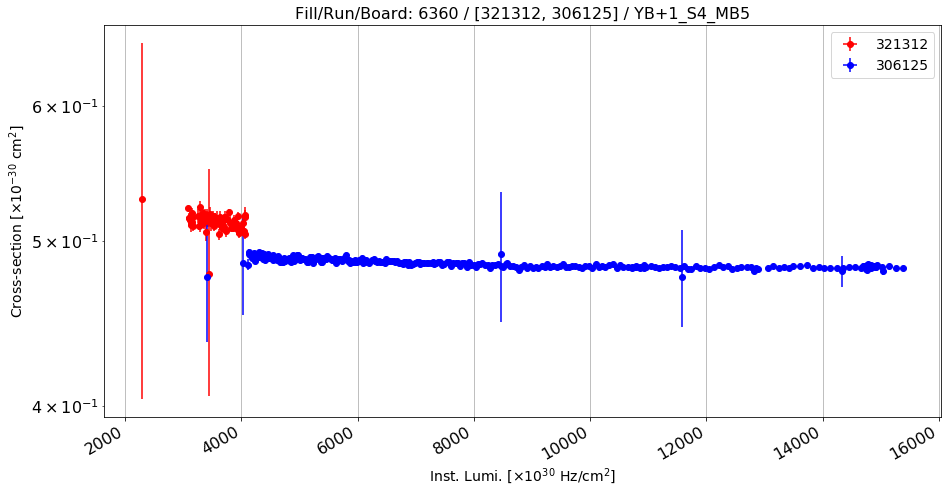

Anomalous CS: 0.512873017889 , Normal CS: 0.483508190929 , Ratio: -0.060732842816


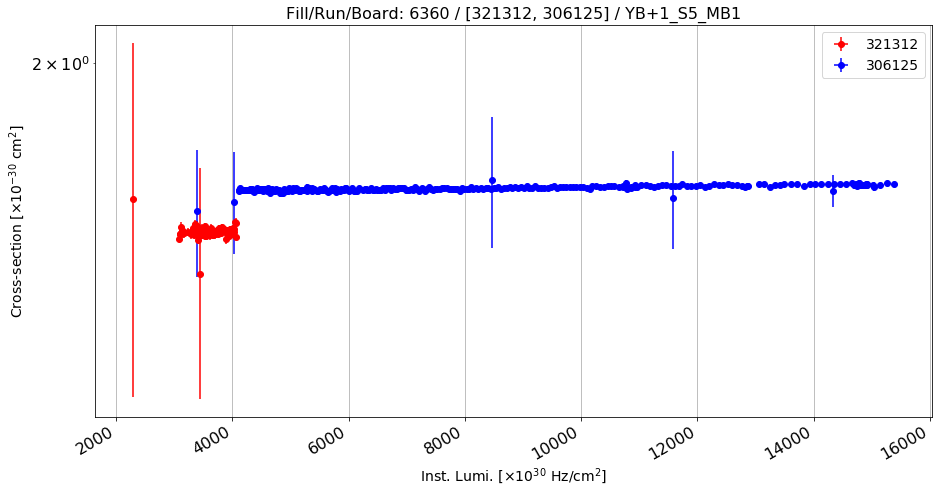

Anomalous CS: 1.59456321699 , Normal CS: 1.69342406548 , Ratio: 0.0583792627689


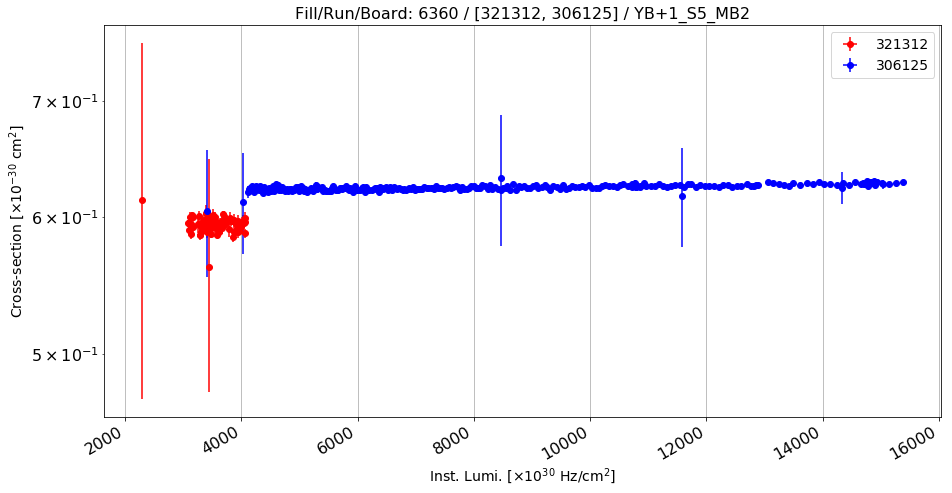

Anomalous CS: 0.593568934707 , Normal CS: 0.624837679248 , Ratio: 0.0500429880908


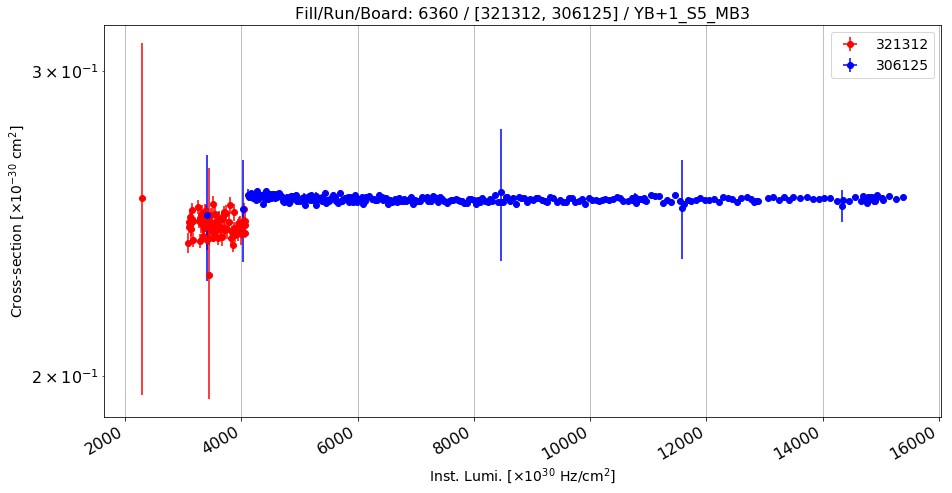

Anomalous CS: 0.244589768912 , Normal CS: 0.252961511206 , Ratio: 0.0330949252096


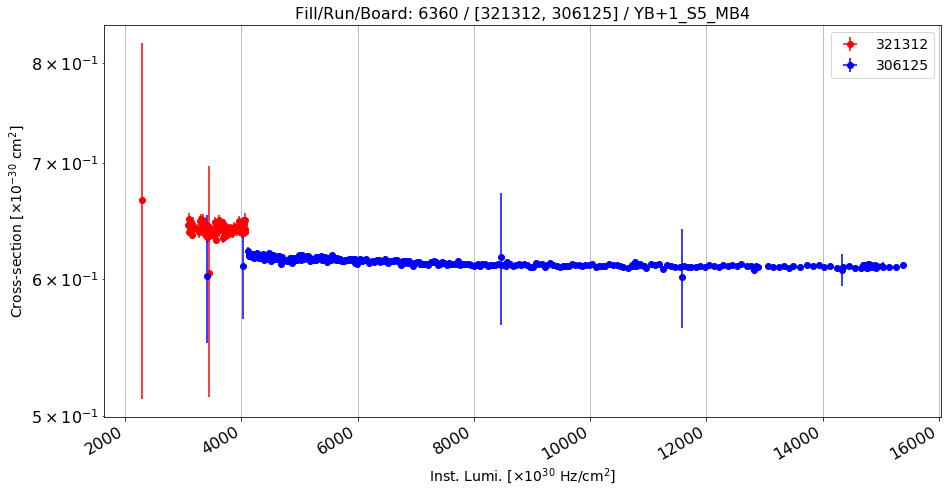

Anomalous CS: 0.641426939463 , Normal CS: 0.611506718258 , Ratio: -0.0489286876363


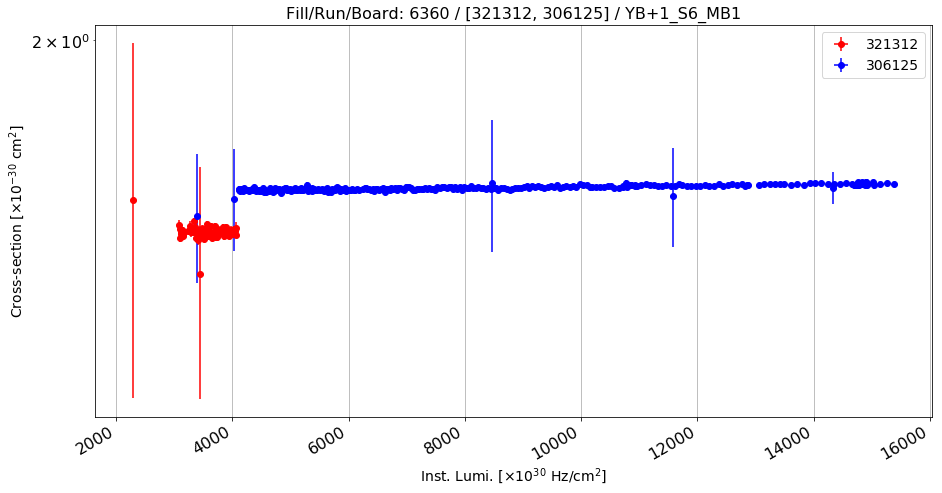

Anomalous CS: 1.54976364298 , Normal CS: 1.64611826051 , Ratio: 0.0585344442375


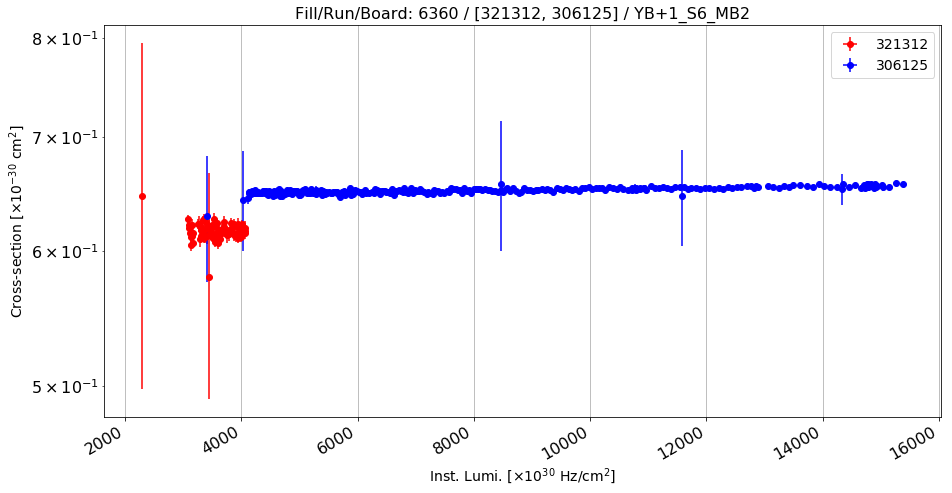

Anomalous CS: 0.616400594938 , Normal CS: 0.652325824748 , Ratio: 0.0550725242622


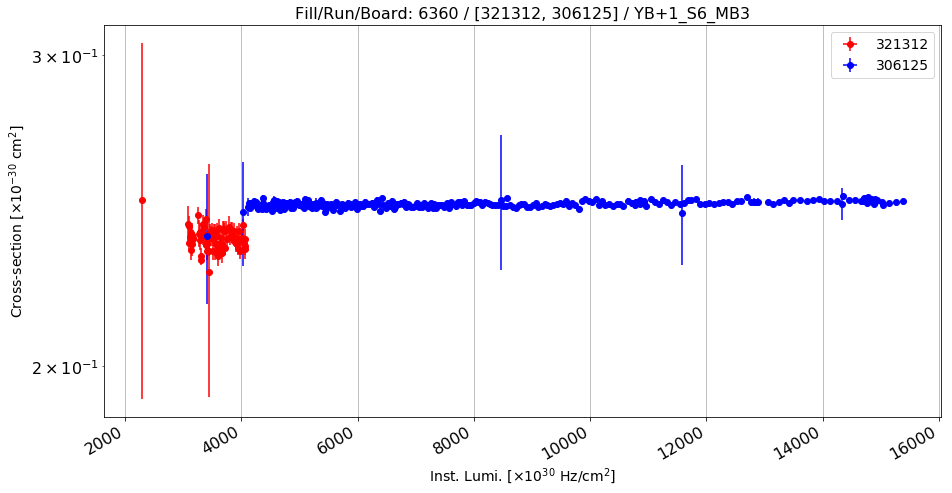

Anomalous CS: 0.23646544328 , Normal CS: 0.247433081336 , Ratio: 0.0443256738228


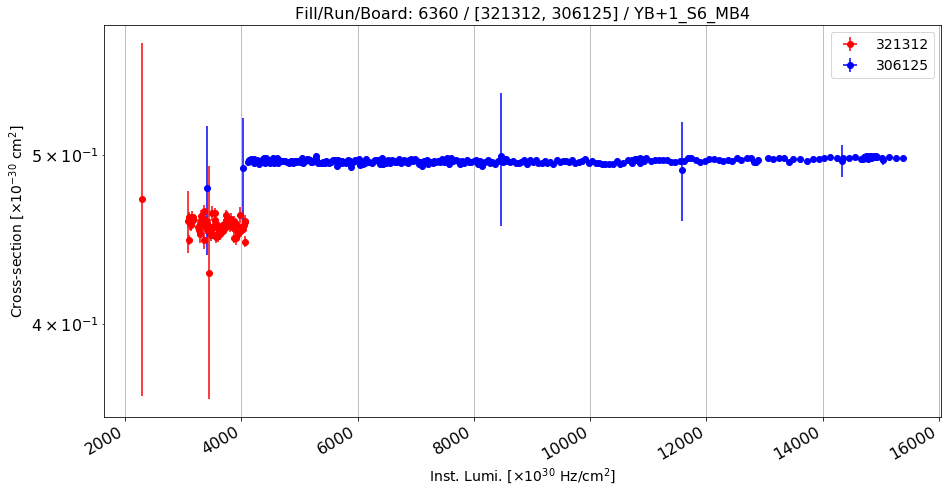

Anomalous CS: 0.455270299903 , Normal CS: 0.496548980052 , Ratio: 0.0831311347068


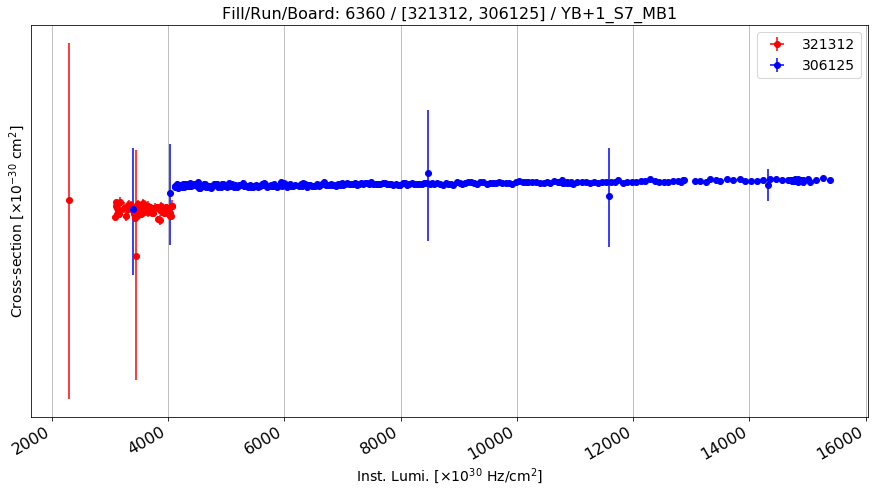

Anomalous CS: 1.50873560111 , Normal CS: 1.56562736501 , Ratio: 0.0363379978962


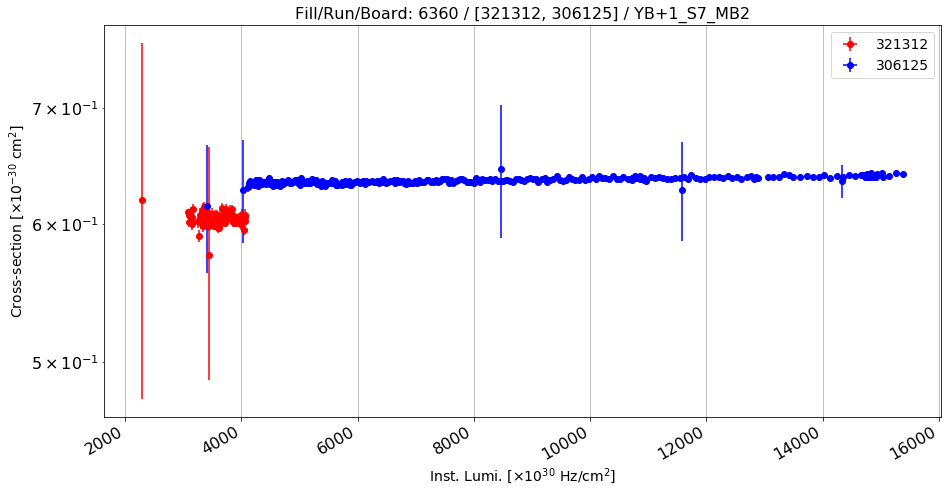

Anomalous CS: 0.604372271752 , Normal CS: 0.636914447366 , Ratio: 0.0510934800564


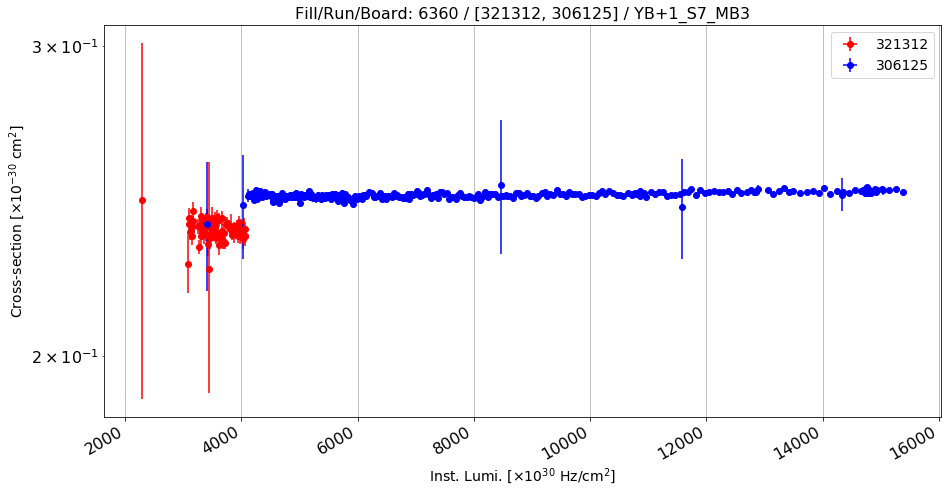

Anomalous CS: 0.23582948432 , Normal CS: 0.247282593366 , Ratio: 0.0463158724194


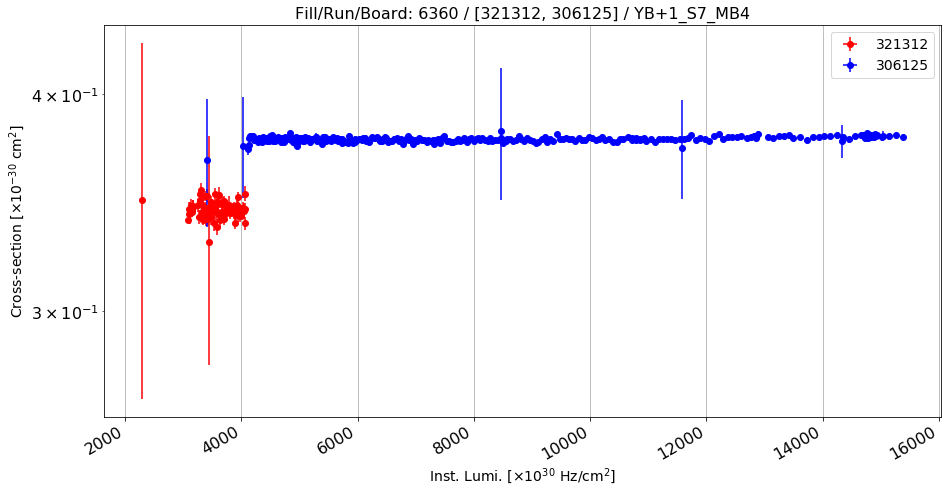

Anomalous CS: 0.343240386719 , Normal CS: 0.377238138521 , Ratio: 0.0901227853972


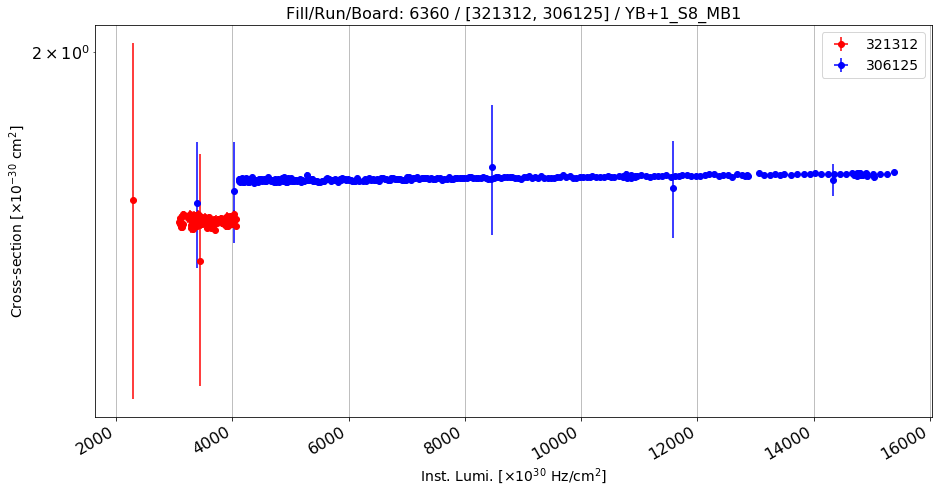

Anomalous CS: 1.59166891348 , Normal CS: 1.69051522874 , Ratio: 0.05847111791


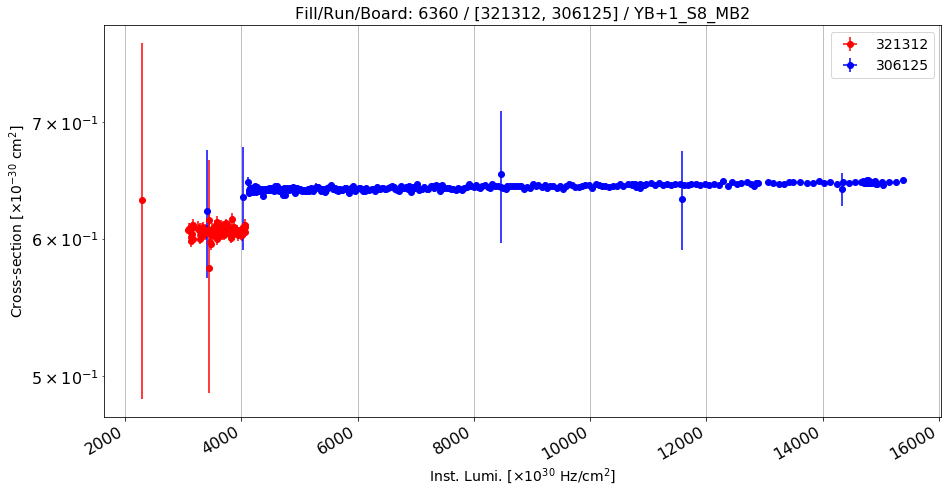

Anomalous CS: 0.606172535421 , Normal CS: 0.64377928372 , Ratio: 0.0584155925022


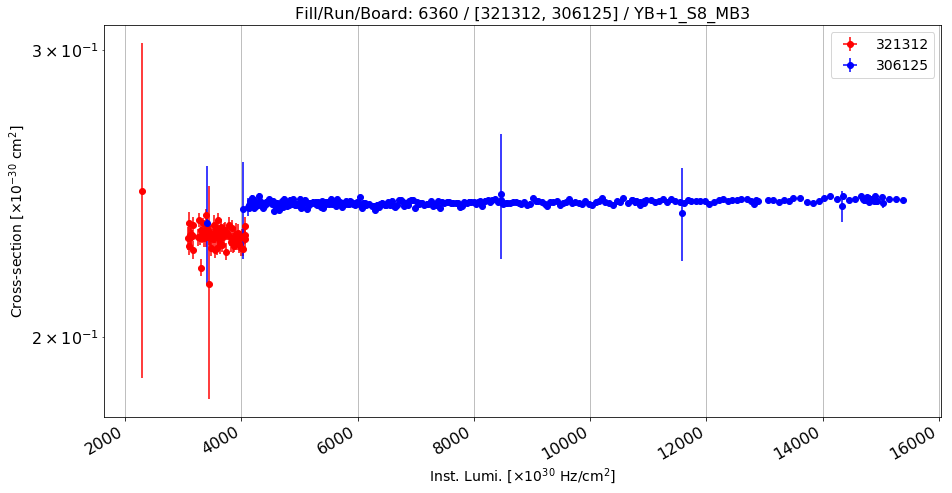

Anomalous CS: 0.230621449958 , Normal CS: 0.242018642409 , Ratio: 0.0470922088384


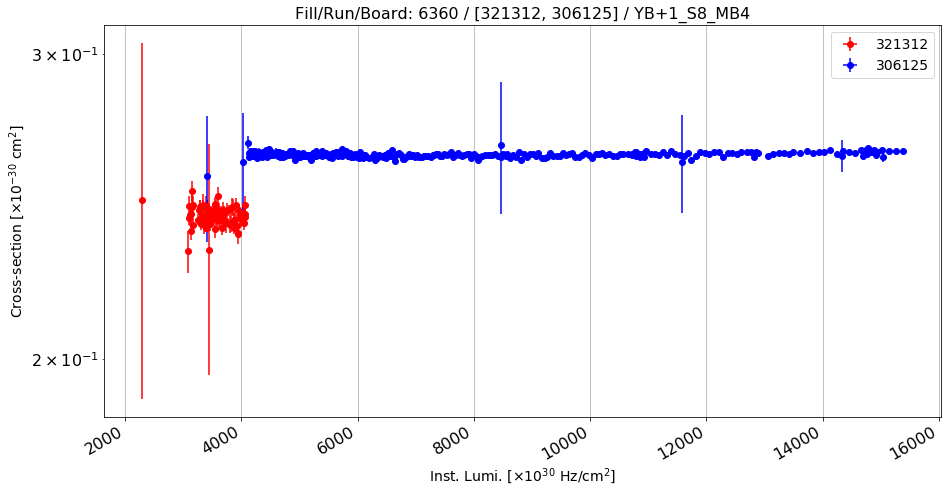

Anomalous CS: 0.241742711638 , Normal CS: 0.262491693895 , Ratio: 0.0790462431365


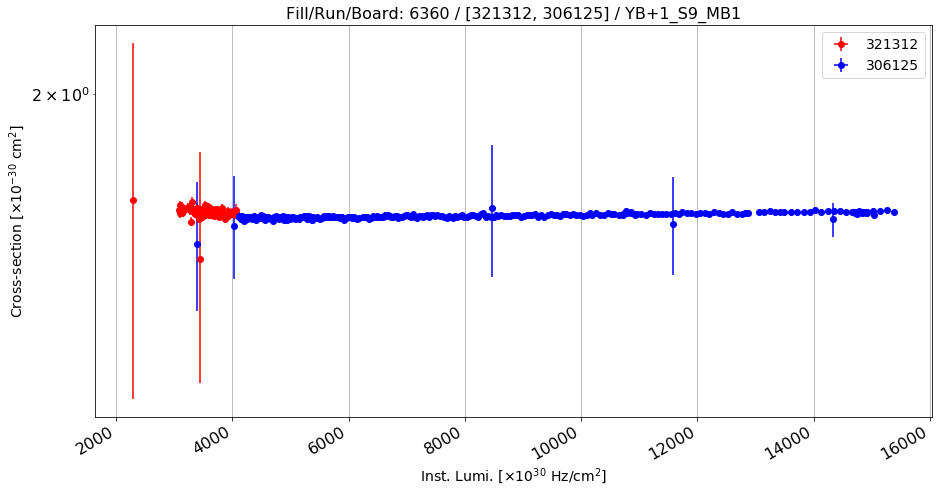

Anomalous CS: 1.7090346373 , Normal CS: 1.70373796636 , Ratio: -0.00310885303257


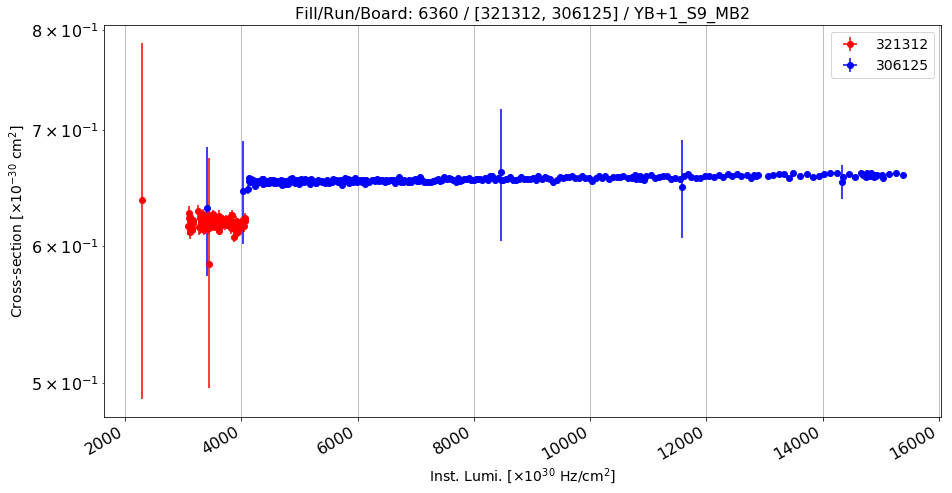

Anomalous CS: 0.618454225274 , Normal CS: 0.65685052904 , Ratio: 0.0584551615151


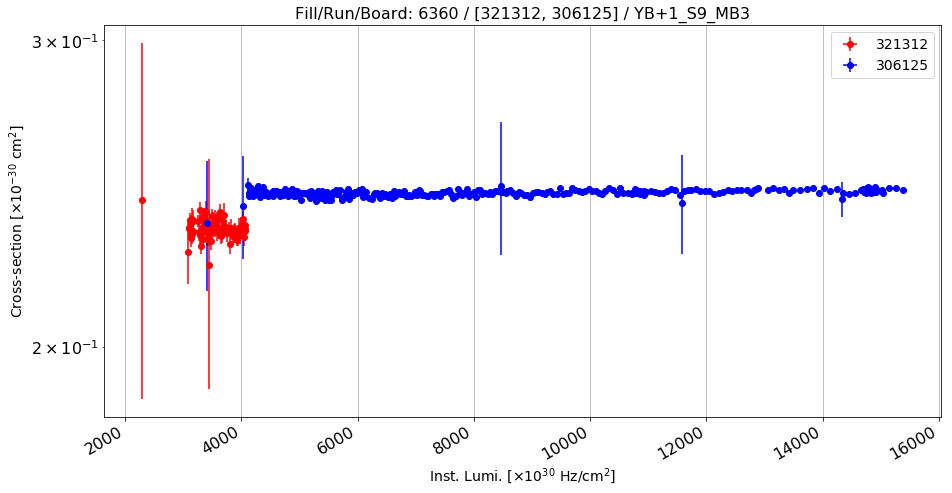

Anomalous CS: 0.233990296176 , Normal CS: 0.245487133991 , Ratio: 0.046832750981


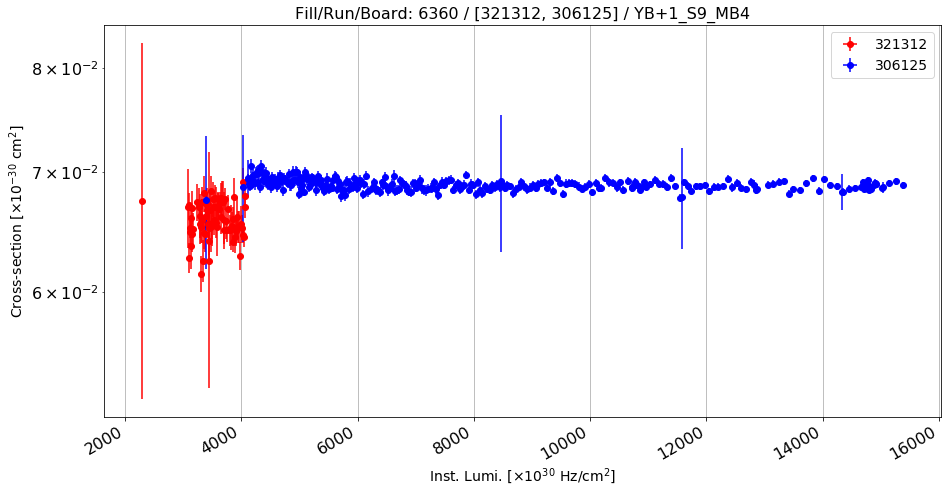

Anomalous CS: 0.0658529754164 , Normal CS: 0.0687673836777 , Ratio: 0.0423806767892


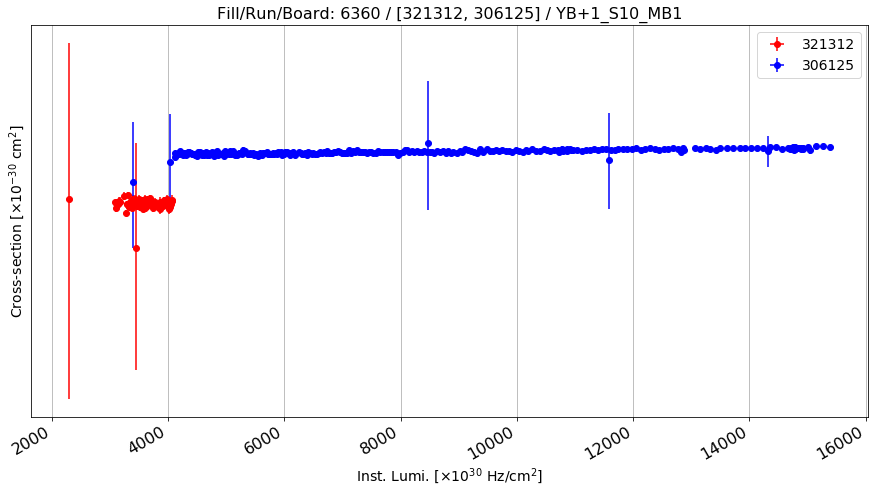

Anomalous CS: 1.54043968329 , Normal CS: 1.65652604423 , Ratio: 0.0700781984952


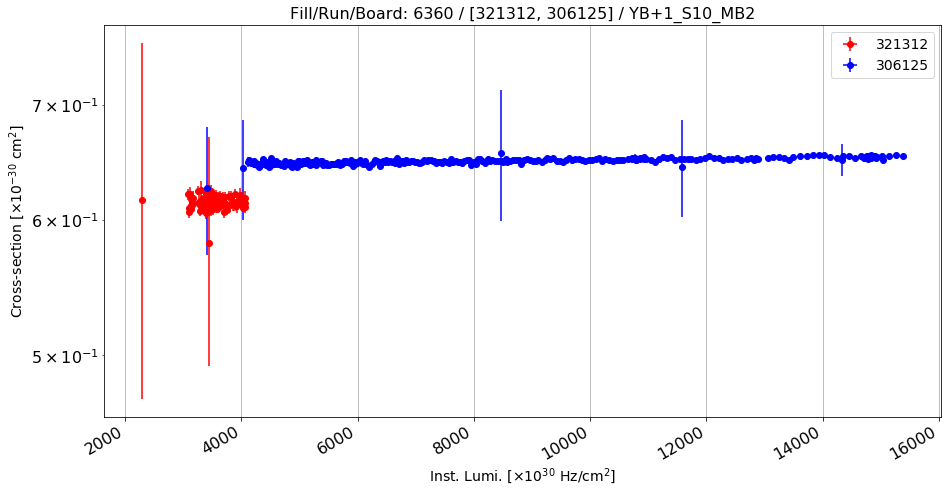

Anomalous CS: 0.614415098624 , Normal CS: 0.650629042473 , Ratio: 0.0556598944783


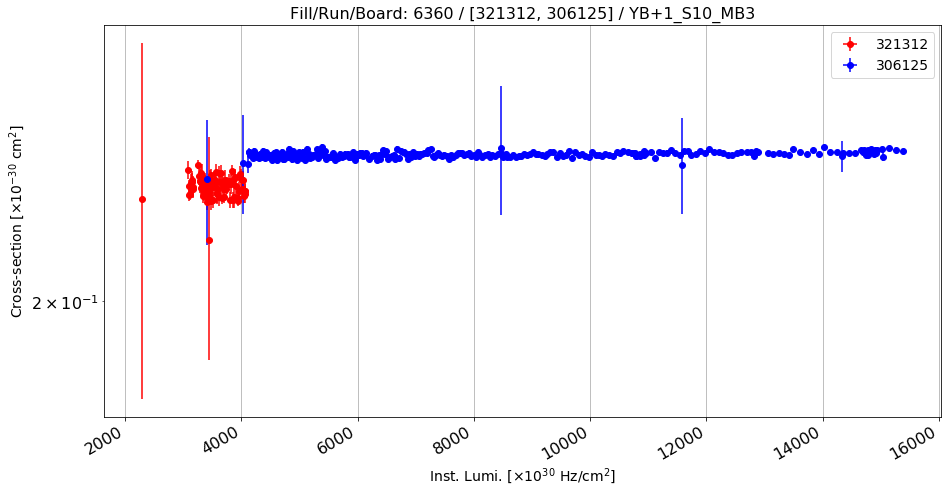

Anomalous CS: 0.23363045061 , Normal CS: 0.244502915233 , Ratio: 0.0444676277666


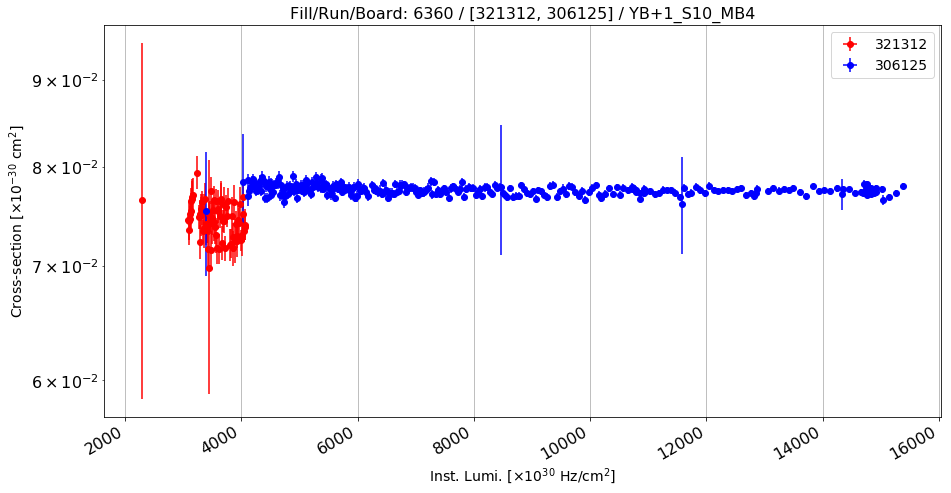

Anomalous CS: 0.0744740188322 , Normal CS: 0.0774693334196 , Ratio: 0.0386645199474


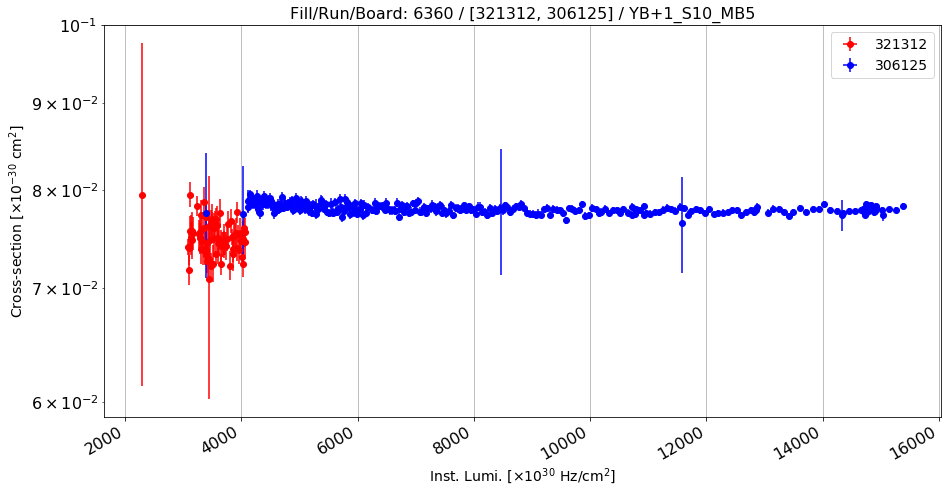

Anomalous CS: 0.0749274226751 , Normal CS: 0.0778271327225 , Ratio: 0.037258343537


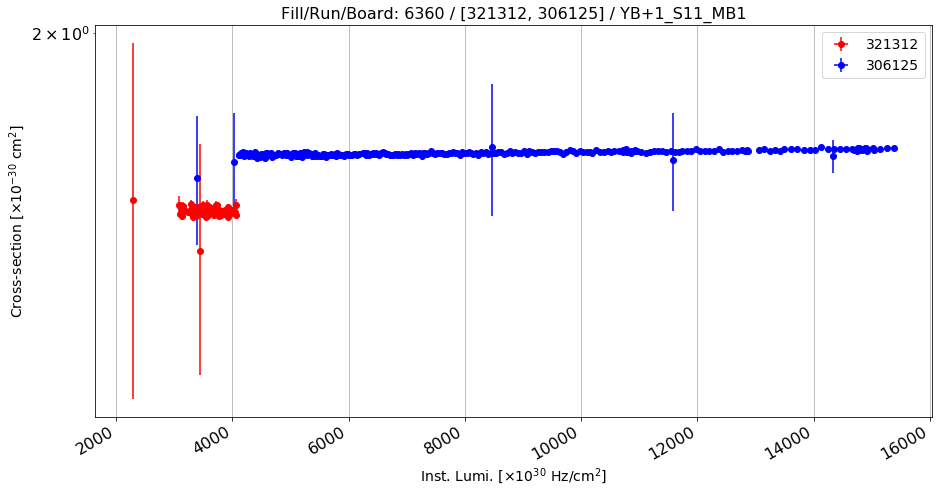

Anomalous CS: 1.57689915495 , Normal CS: 1.70676608845 , Ratio: 0.0760894737581


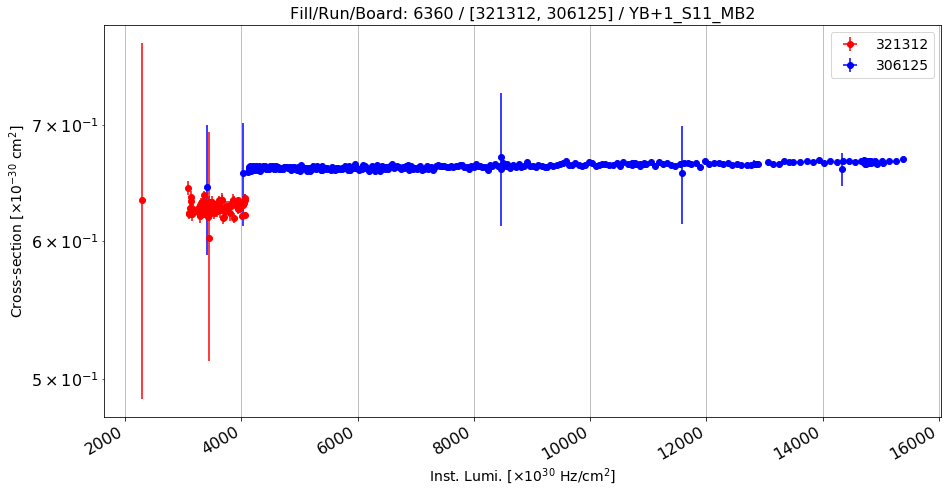

Anomalous CS: 0.627484486117 , Normal CS: 0.663940409746 , Ratio: 0.0549084271629


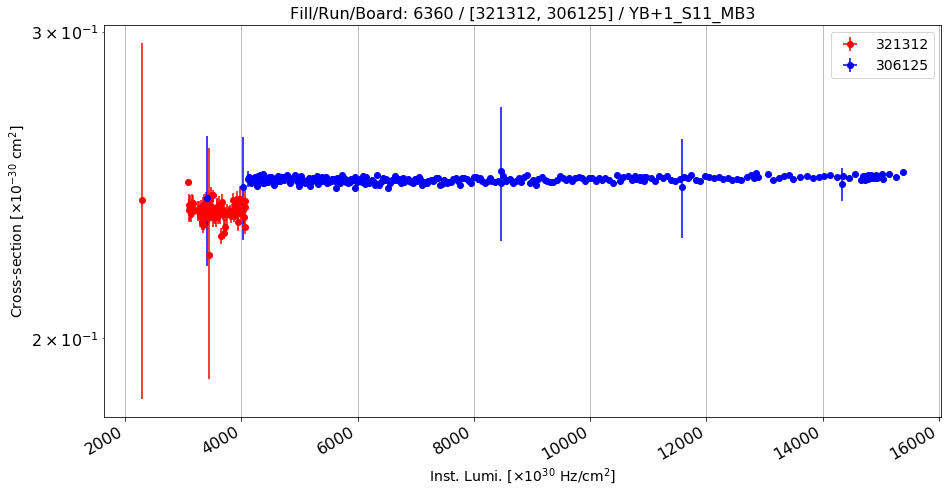

Anomalous CS: 0.236644316688 , Normal CS: 0.246897082512 , Ratio: 0.0415264762105


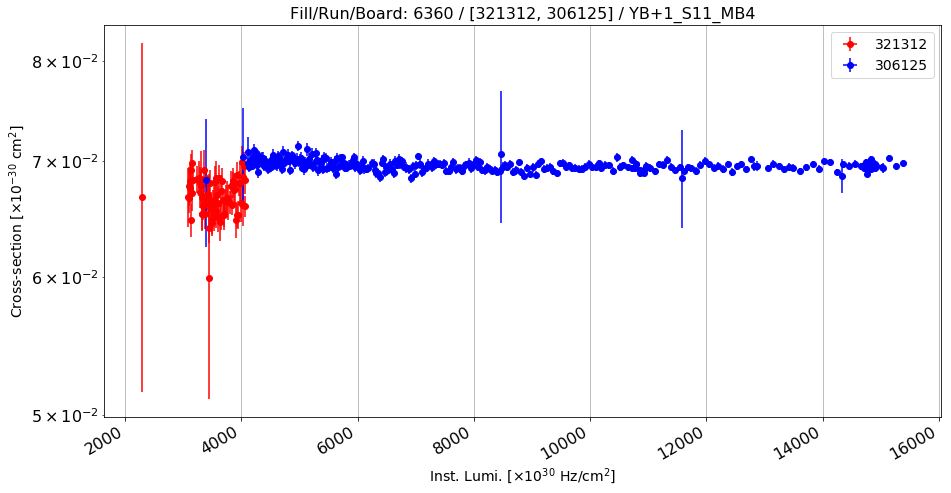

Anomalous CS: 0.0667903033891 , Normal CS: 0.0694873625981 , Ratio: 0.0388136649332


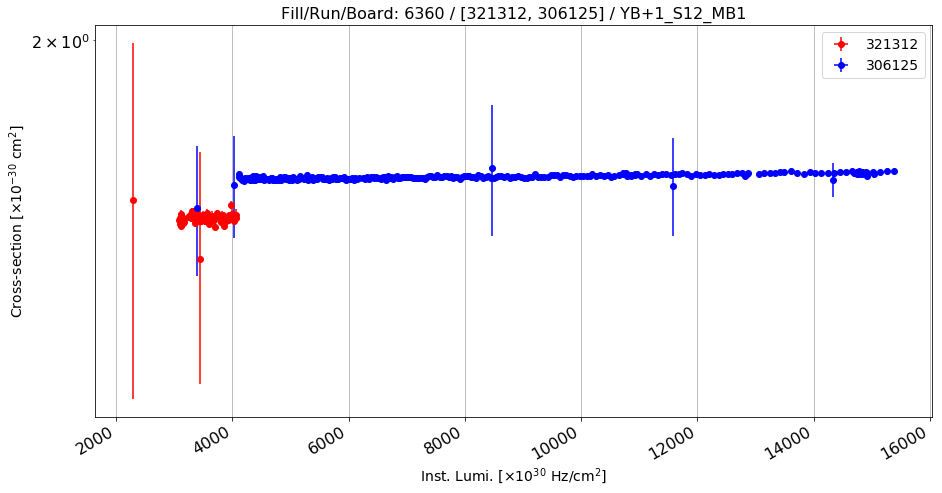

Anomalous CS: 1.57744308401 , Normal CS: 1.66978640789 , Ratio: 0.0553024766838


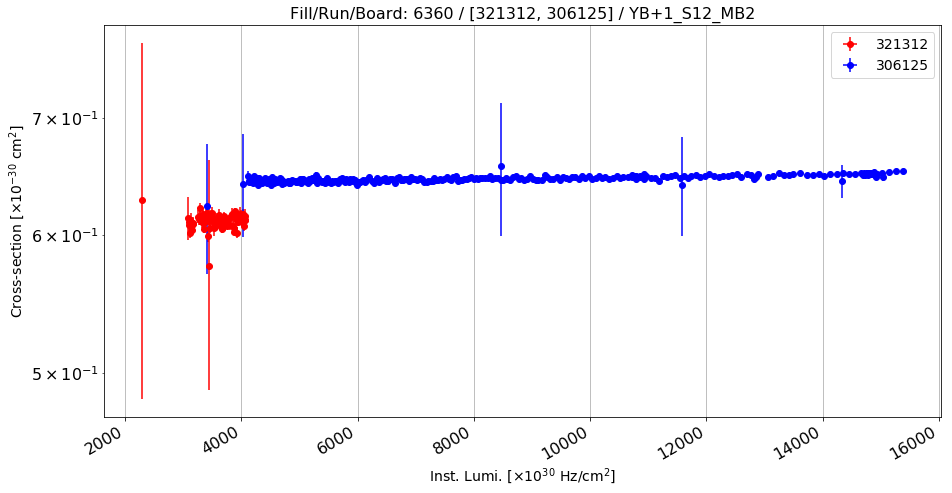

Anomalous CS: 0.610872058942 , Normal CS: 0.647190266614 , Ratio: 0.0561167396143


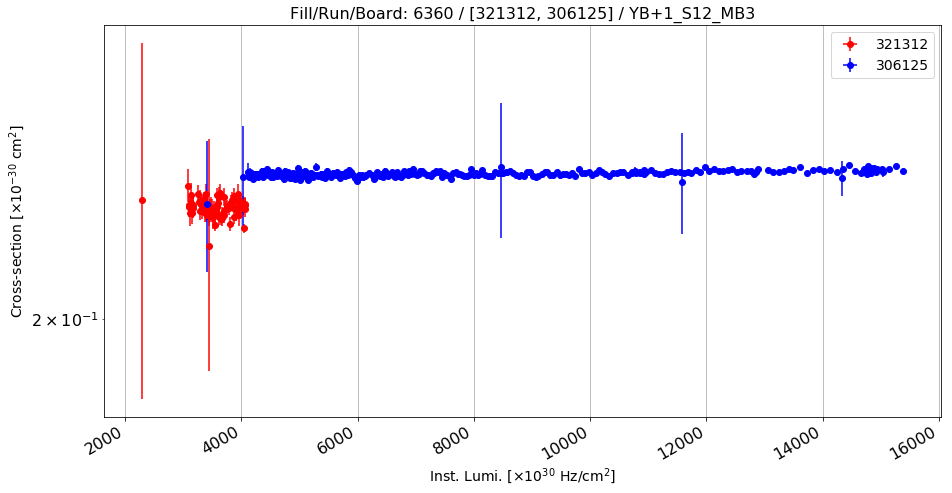

Anomalous CS: 0.231383217485 , Normal CS: 0.242235687831 , Ratio: 0.0448012860668


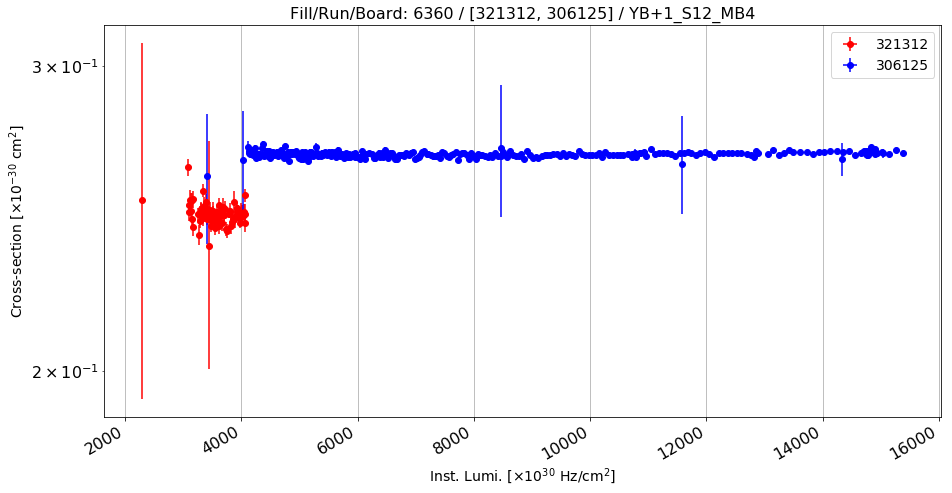

Anomalous CS: 0.246391289429 , Normal CS: 0.266737811667 , Ratio: 0.0762791076028


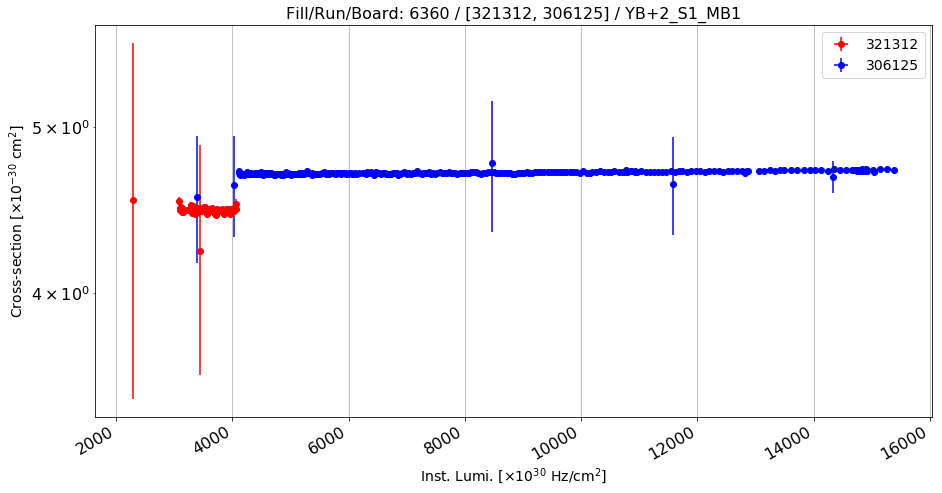

Anomalous CS: 4.47063264993 , Normal CS: 4.70548379802 , Ratio: 0.0499100960016


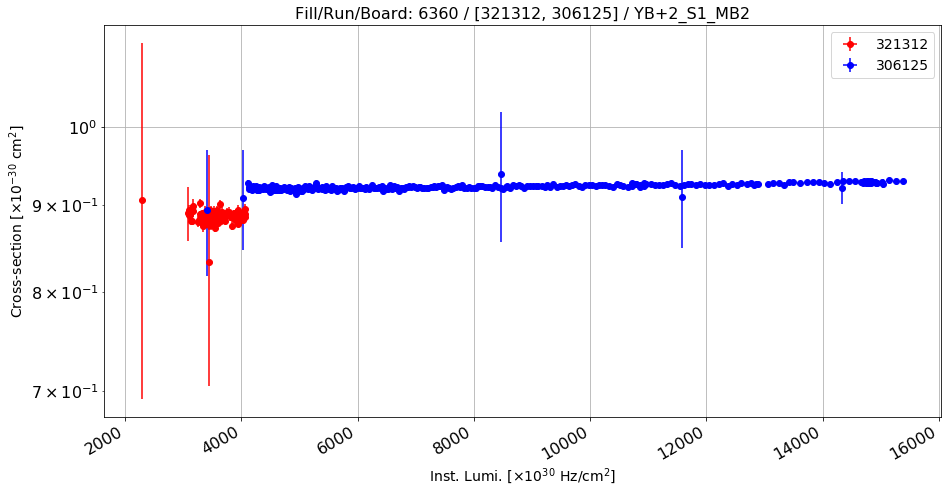

Anomalous CS: 0.885510599398 , Normal CS: 0.923776215719 , Ratio: 0.0414230369541


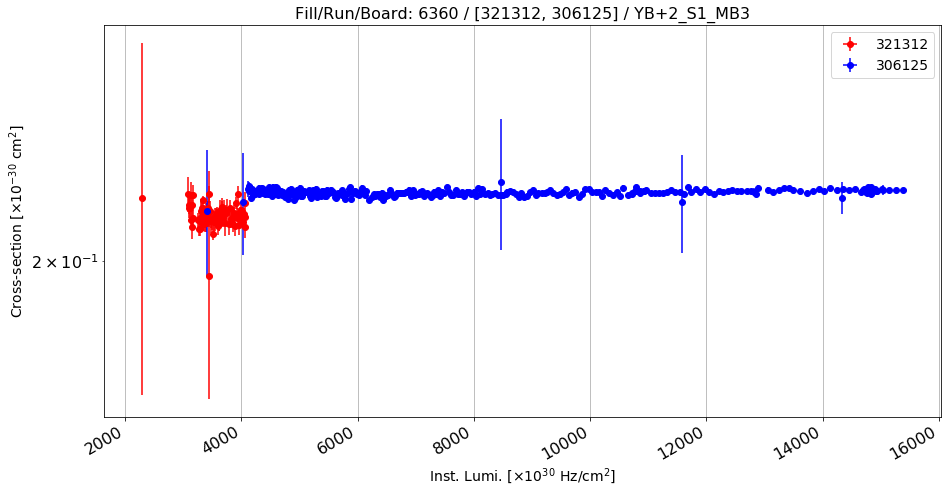

Anomalous CS: 0.212444819743 , Normal CS: 0.219205670802 , Ratio: 0.0308425007138


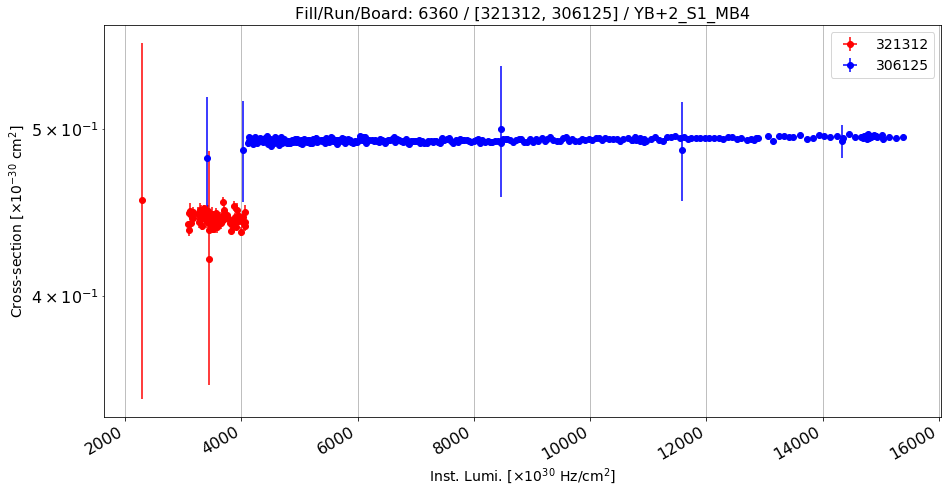

Anomalous CS: 0.443193439134 , Normal CS: 0.493266608182 , Ratio: 0.101513397052


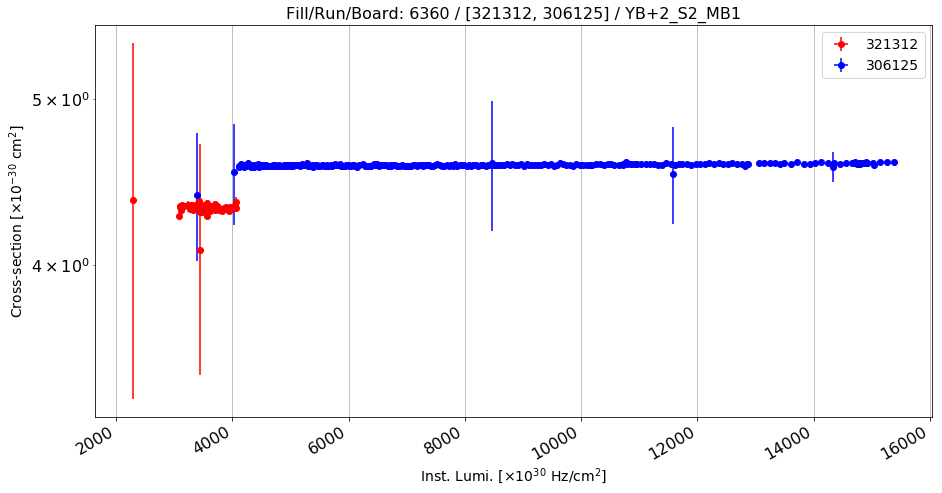

Anomalous CS: 4.31700371254 , Normal CS: 4.5783568986 , Ratio: 0.0570844938147


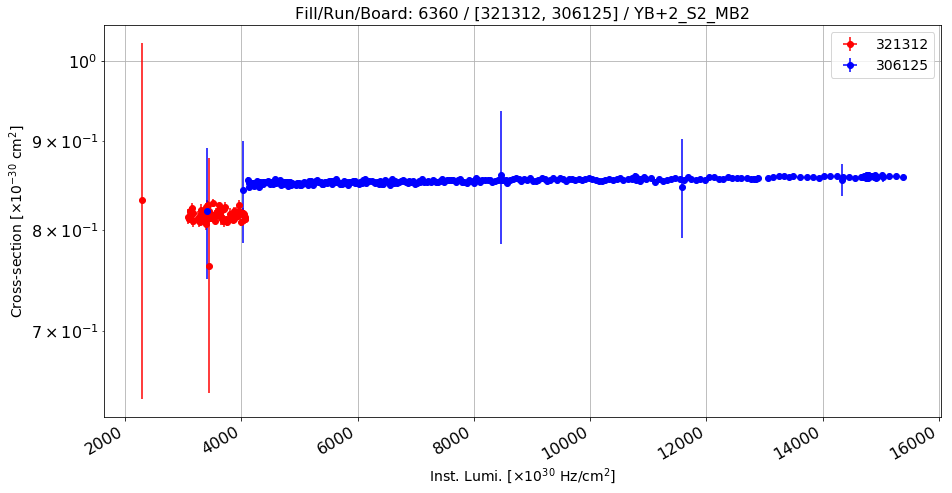

Anomalous CS: 0.815328277899 , Normal CS: 0.855115321569 , Ratio: 0.0465282783111


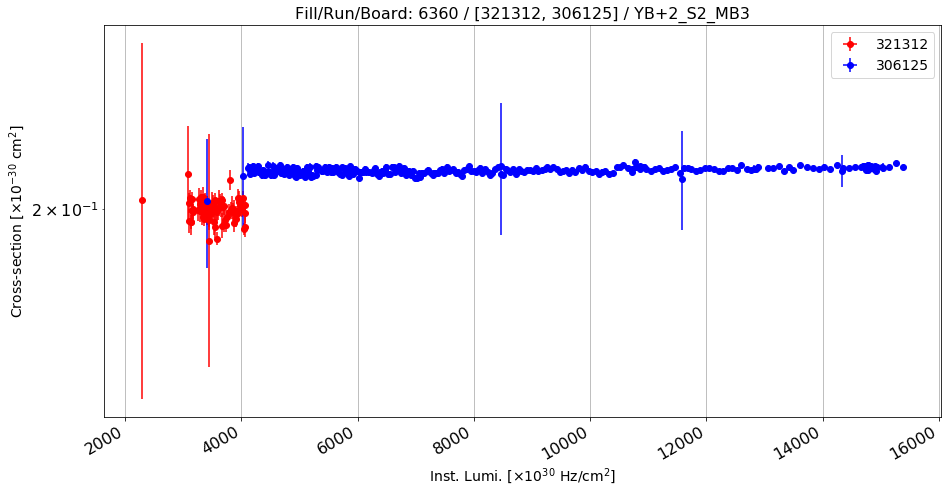

Anomalous CS: 0.199719813508 , Normal CS: 0.210706632499 , Ratio: 0.0521427297292


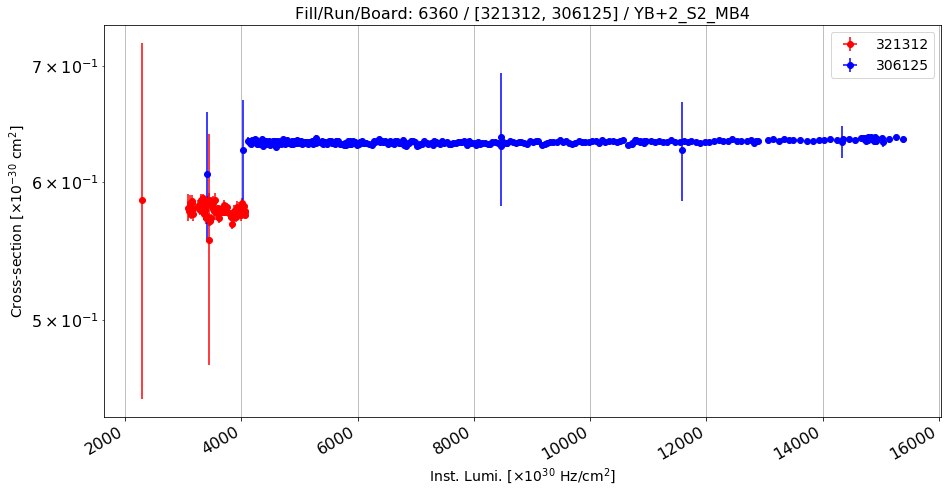

Anomalous CS: 0.578213258431 , Normal CS: 0.633094294746 , Ratio: 0.0866869860787


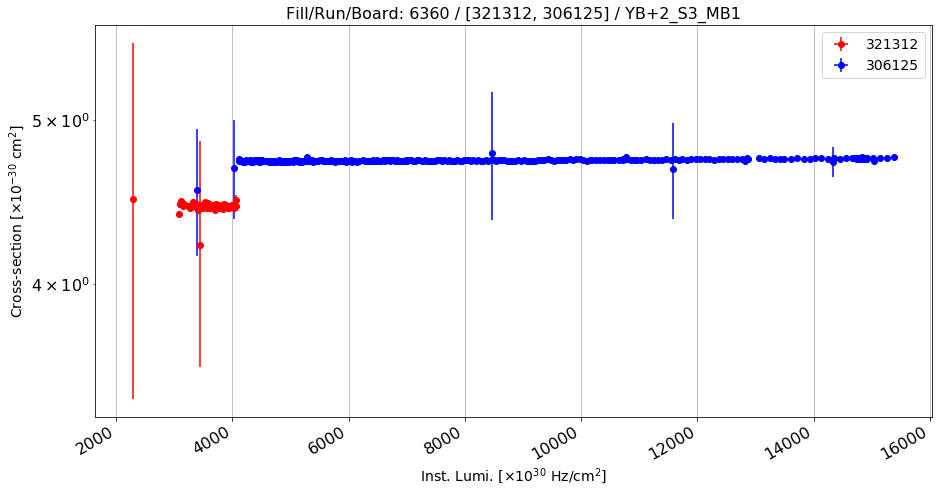

Anomalous CS: 4.44439390957 , Normal CS: 4.73507546549 , Ratio: 0.0613890017249


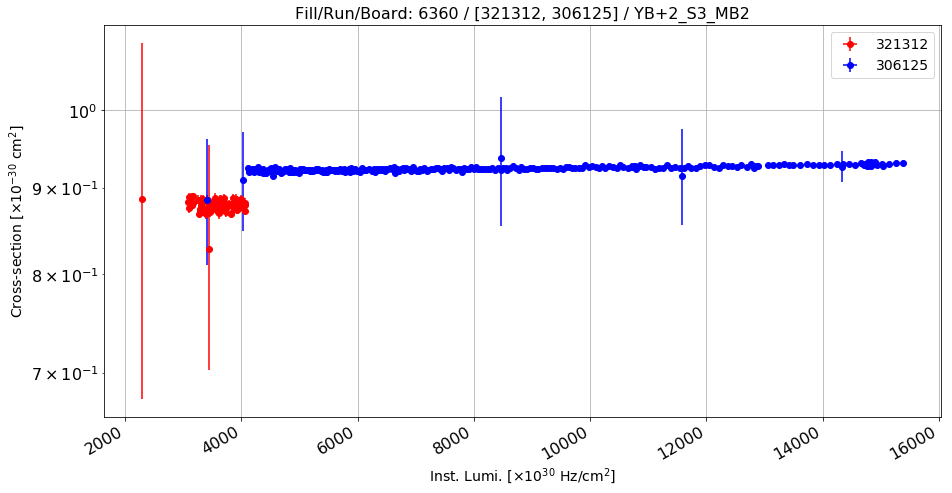

Anomalous CS: 0.878650153273 , Normal CS: 0.925529050497 , Ratio: 0.0506509192755


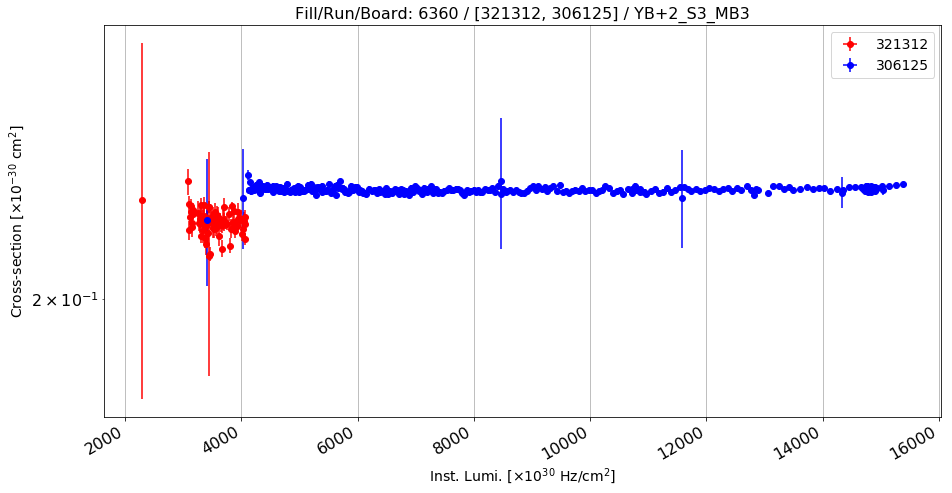

Anomalous CS: 0.221627121223 , Normal CS: 0.231160137342 , Ratio: 0.0412398791132


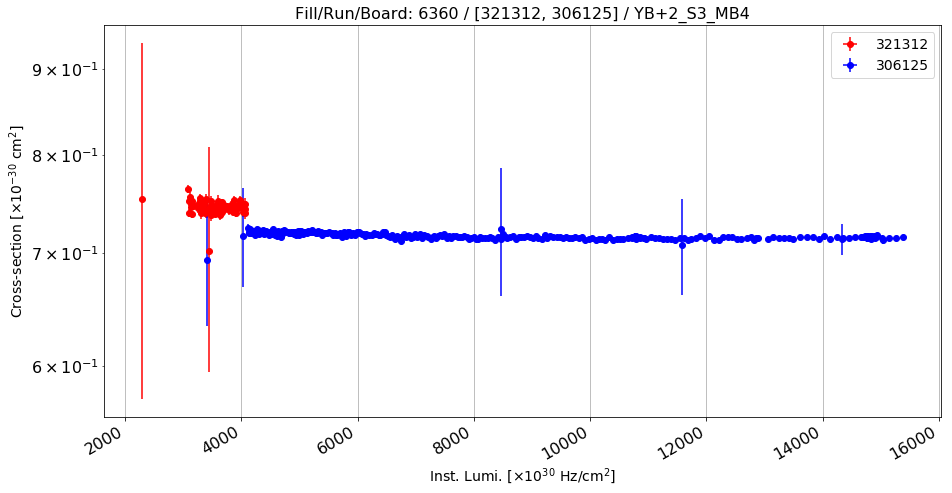

Anomalous CS: 0.745004218804 , Normal CS: 0.715365055708 , Ratio: -0.0414322210169


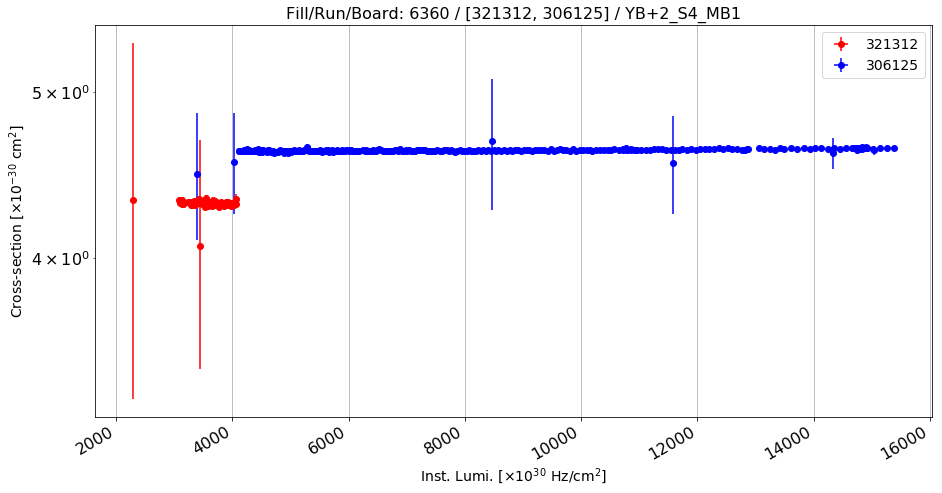

Anomalous CS: 4.30554860378 , Normal CS: 4.62800247396 , Ratio: 0.0696745241594


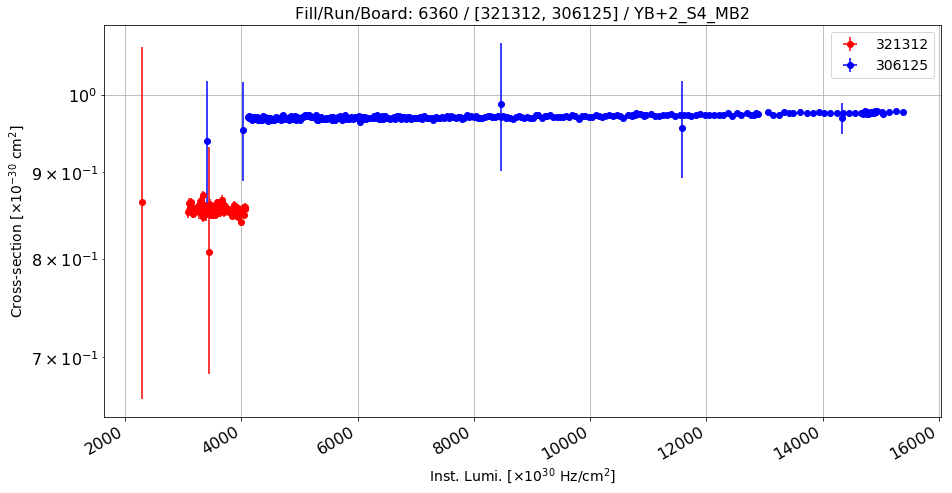

Anomalous CS: 0.855621241159 , Normal CS: 0.972030147554 , Ratio: 0.119758534946


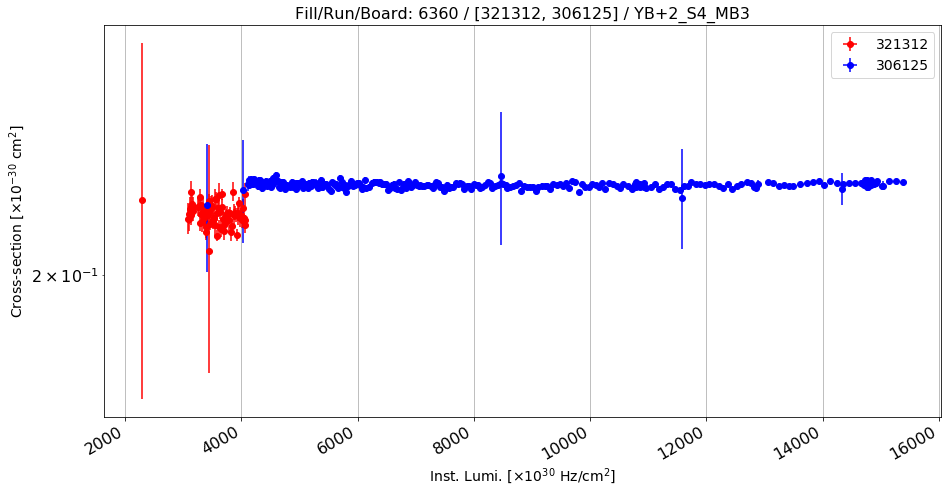

Anomalous CS: 0.216552879614 , Normal CS: 0.225002605654 , Ratio: 0.0375539030573


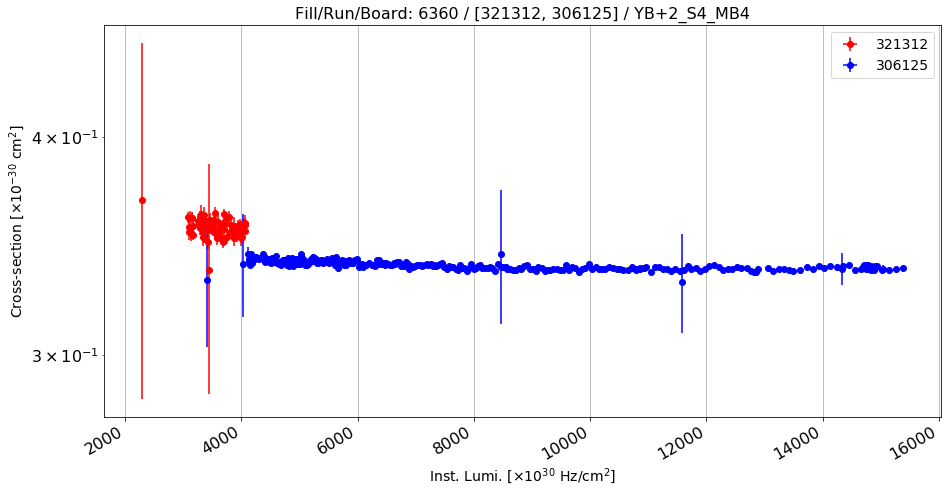

Anomalous CS: 0.354806447559 , Normal CS: 0.336761788024 , Ratio: -0.053582859389


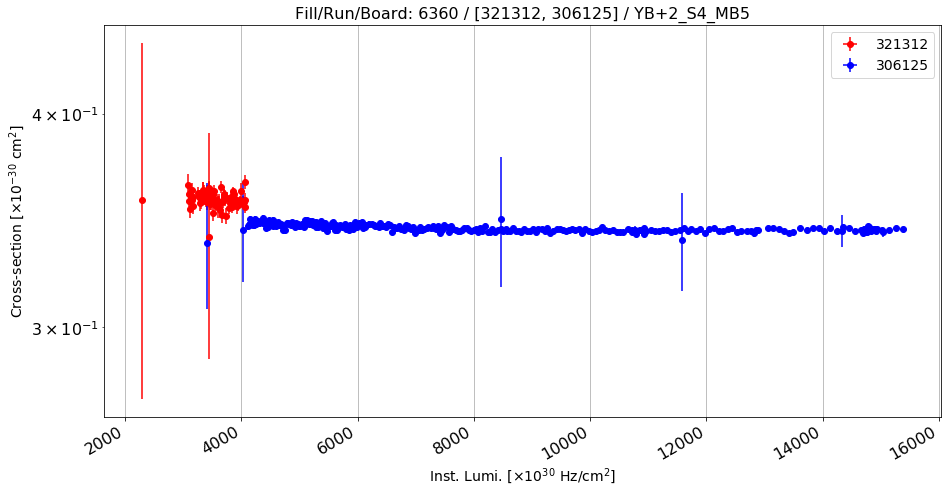

Anomalous CS: 0.356368702133 , Normal CS: 0.342405659431 , Ratio: -0.0407792404072


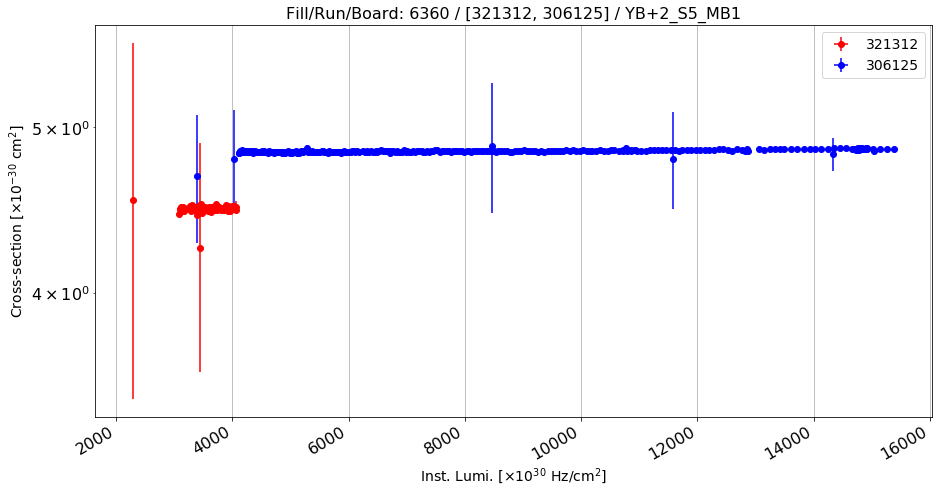

Anomalous CS: 4.48020667644 , Normal CS: 4.84733492702 , Ratio: 0.0757381646008


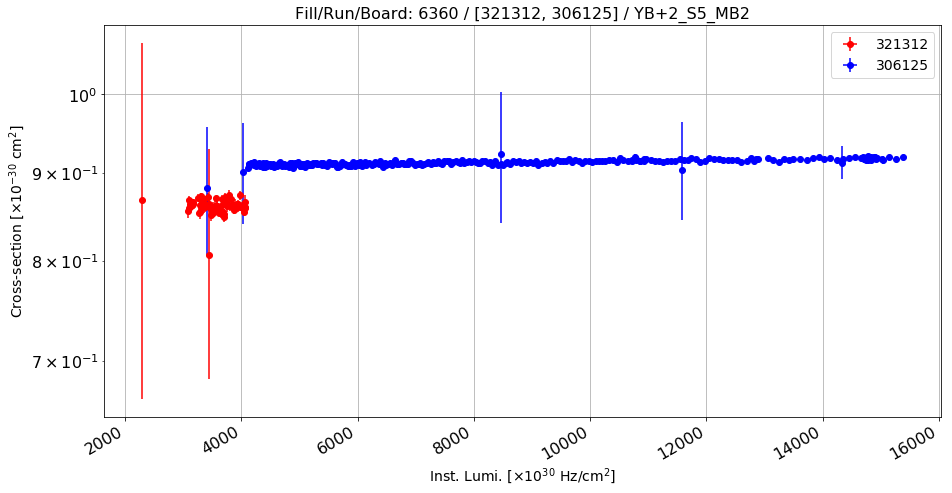

Anomalous CS: 0.860803294155 , Normal CS: 0.914566602395 , Ratio: 0.0587855582083


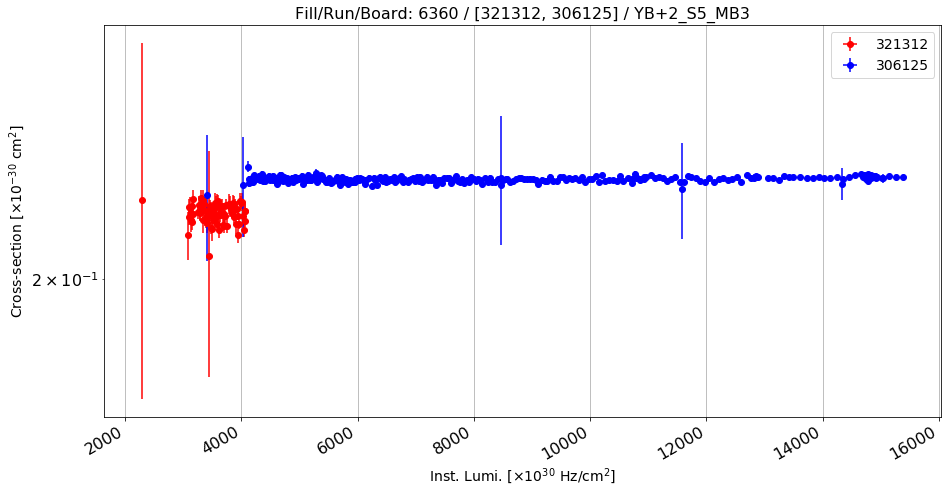

Anomalous CS: 0.218415642276 , Normal CS: 0.22888339801 , Ratio: 0.045734010527


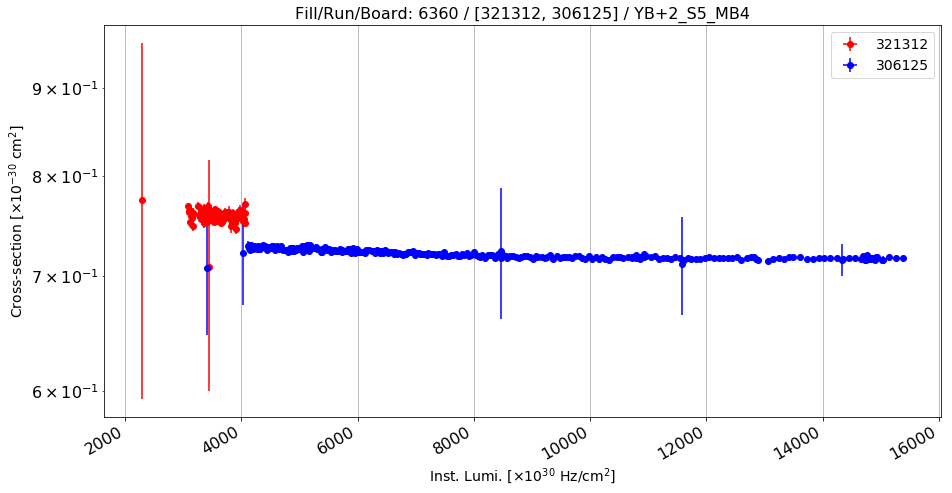

Anomalous CS: 0.757809998254 , Normal CS: 0.718453228512 , Ratio: -0.0547798634338


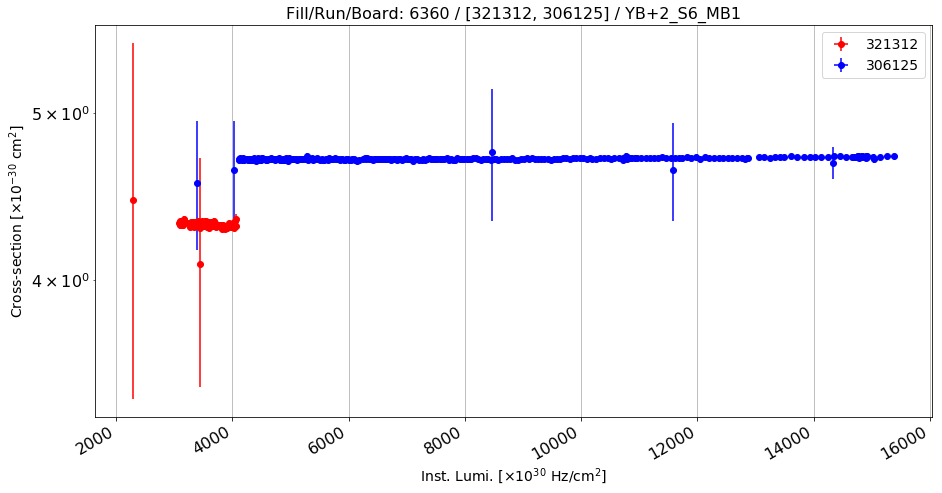

Anomalous CS: 4.30695887192 , Normal CS: 4.70519670203 , Ratio: 0.0846378707058


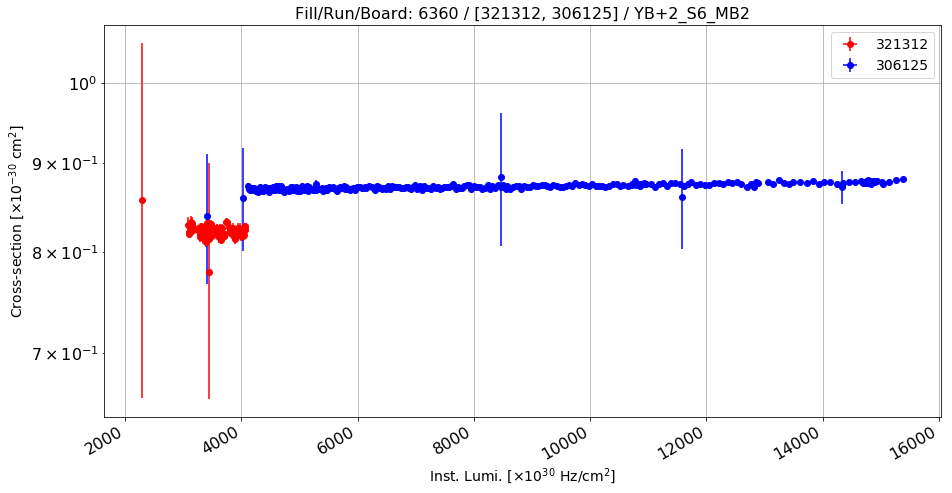

Anomalous CS: 0.82231258584 , Normal CS: 0.873885156193 , Ratio: 0.059015272187


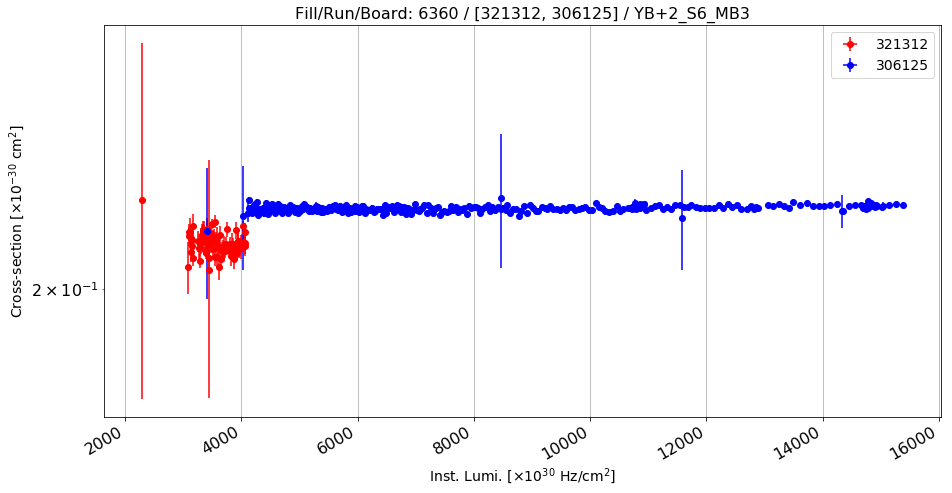

Anomalous CS: 0.212166991311 , Normal CS: 0.222243669044 , Ratio: 0.0453406739405


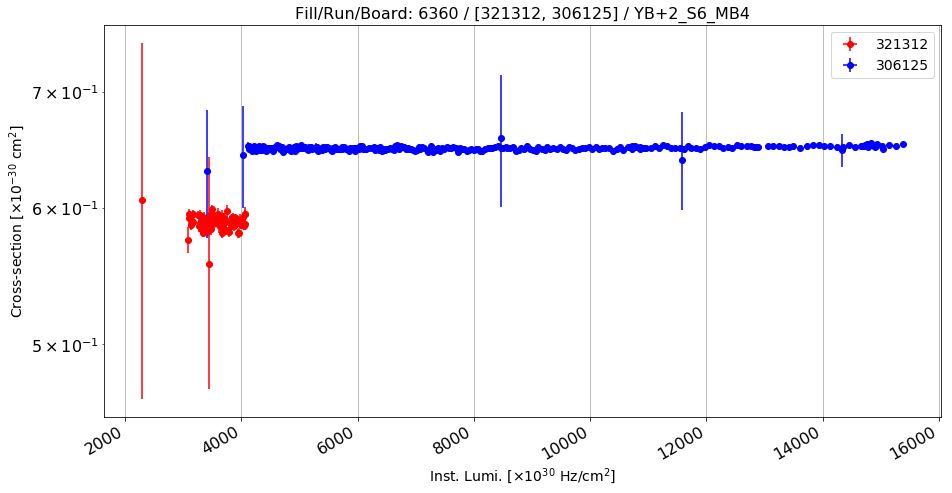

Anomalous CS: 0.588379051884 , Normal CS: 0.64982239733 , Ratio: 0.0945540592302


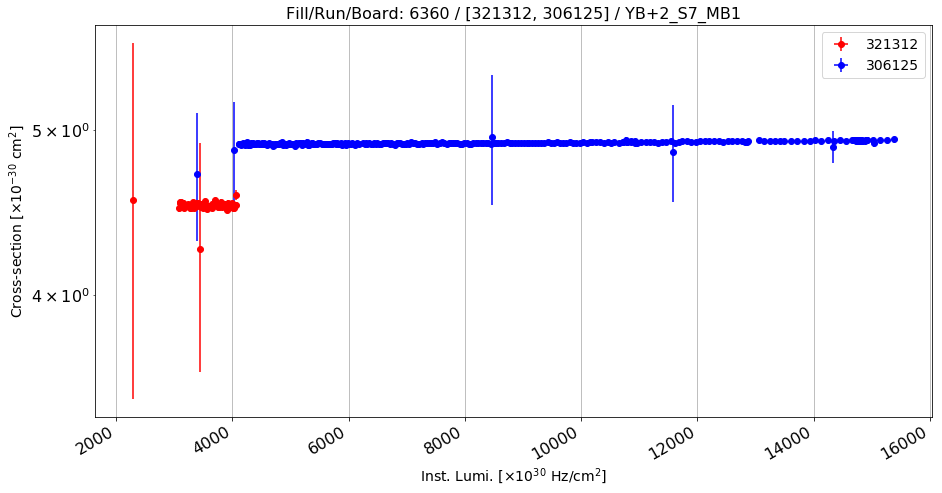

Anomalous CS: 4.51253424856 , Normal CS: 4.9148753575 , Ratio: 0.0818619150383


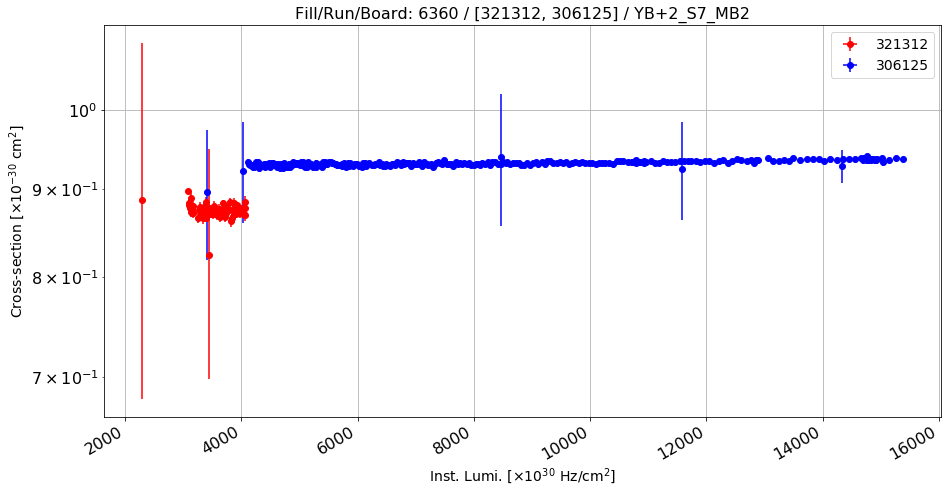

Anomalous CS: 0.873676650578 , Normal CS: 0.93221794137 , Ratio: 0.0627978589489


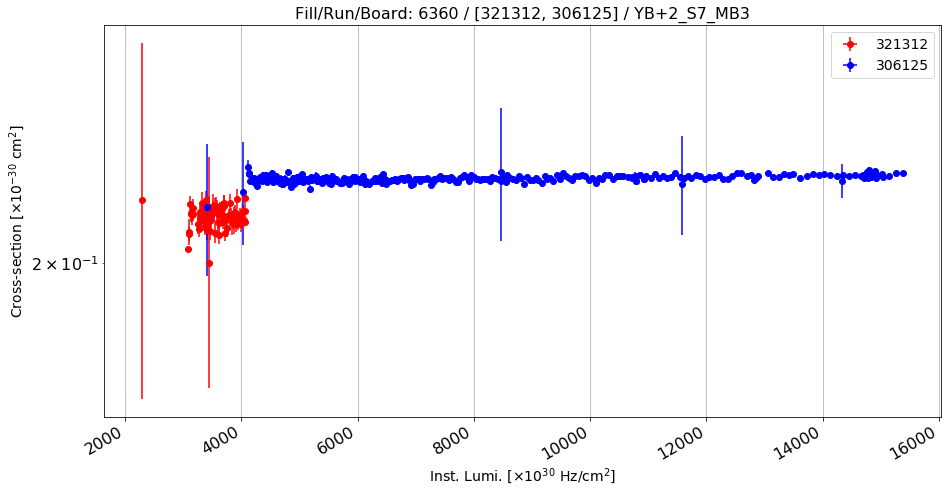

Anomalous CS: 0.212448953719 , Normal CS: 0.223794271009 , Ratio: 0.0506952981342


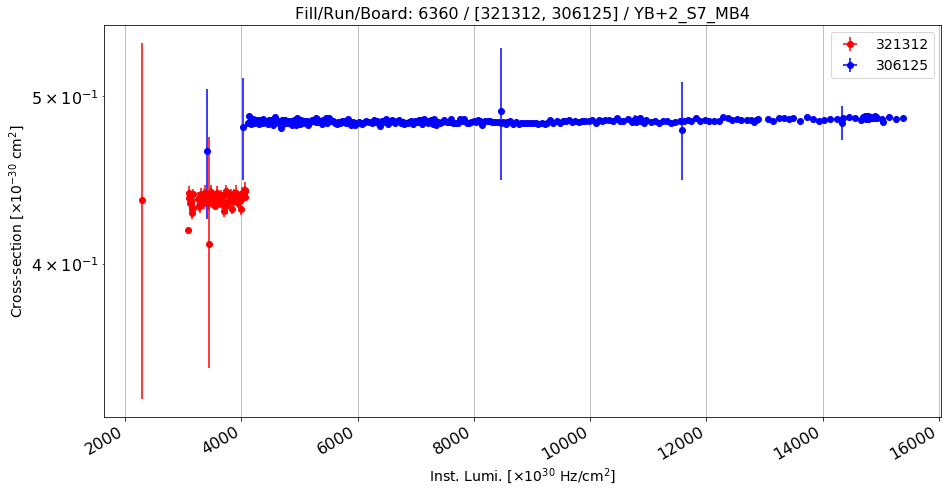

Anomalous CS: 0.435317108869 , Normal CS: 0.484050704834 , Ratio: 0.100678700554


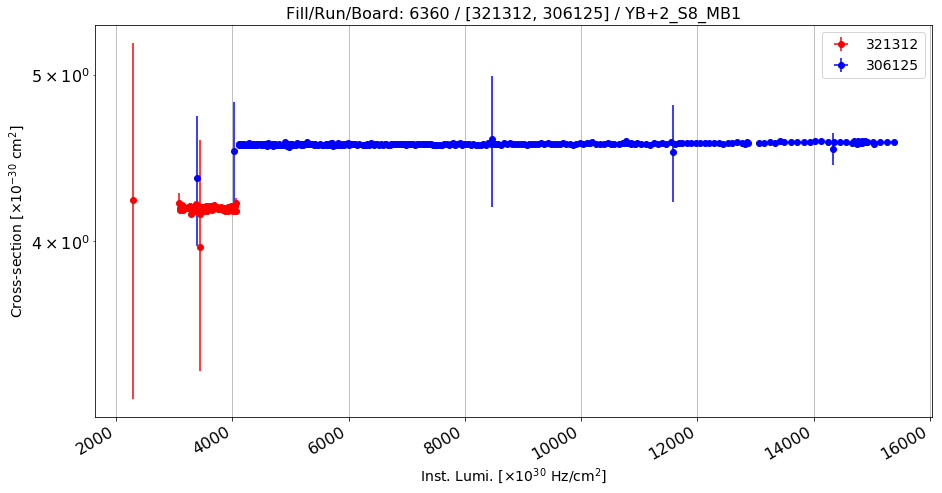

Anomalous CS: 4.17847486434 , Normal CS: 4.55961000843 , Ratio: 0.0835894173817


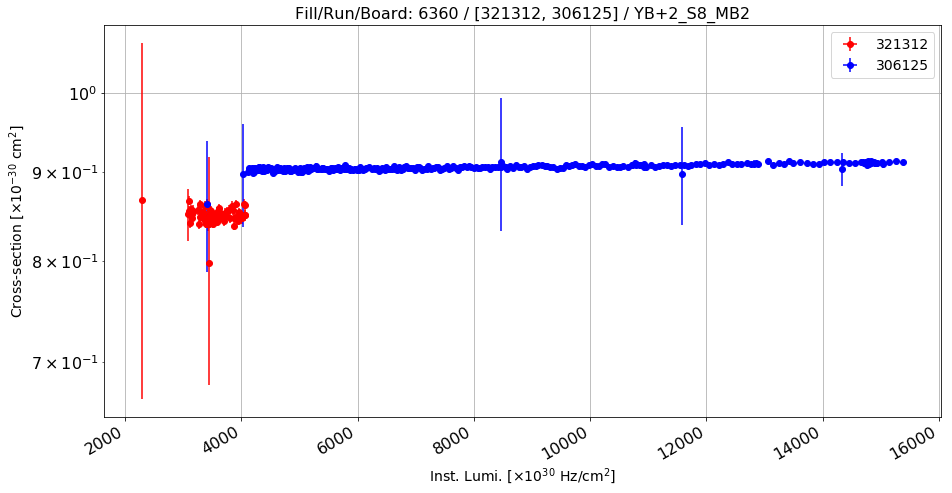

Anomalous CS: 0.850007942925 , Normal CS: 0.907546103416 , Ratio: 0.0633997107963


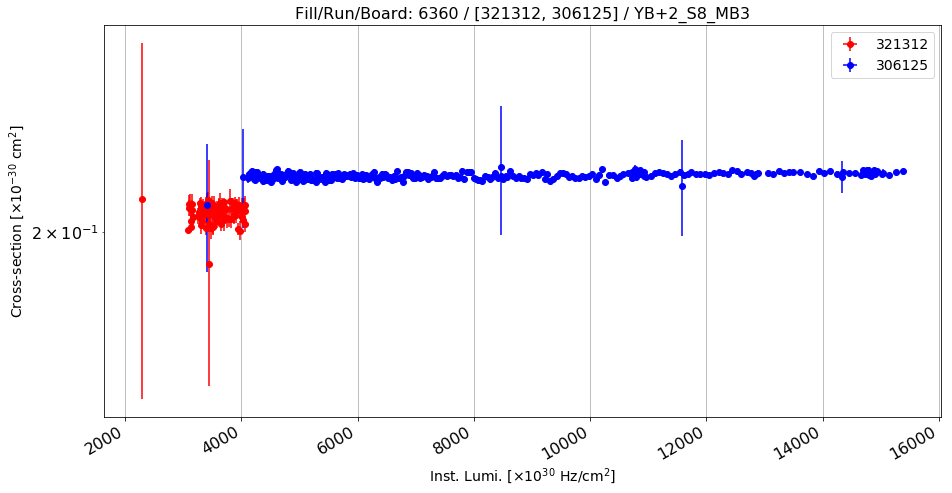

Anomalous CS: 0.205016815184 , Normal CS: 0.216122006576 , Ratio: 0.0513838991584


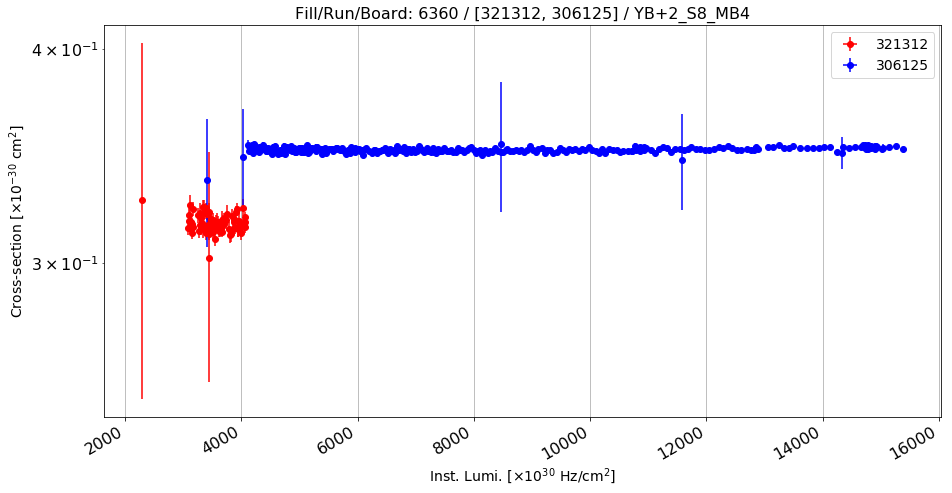

Anomalous CS: 0.316458713781 , Normal CS: 0.349377917759 , Ratio: 0.0942223372011


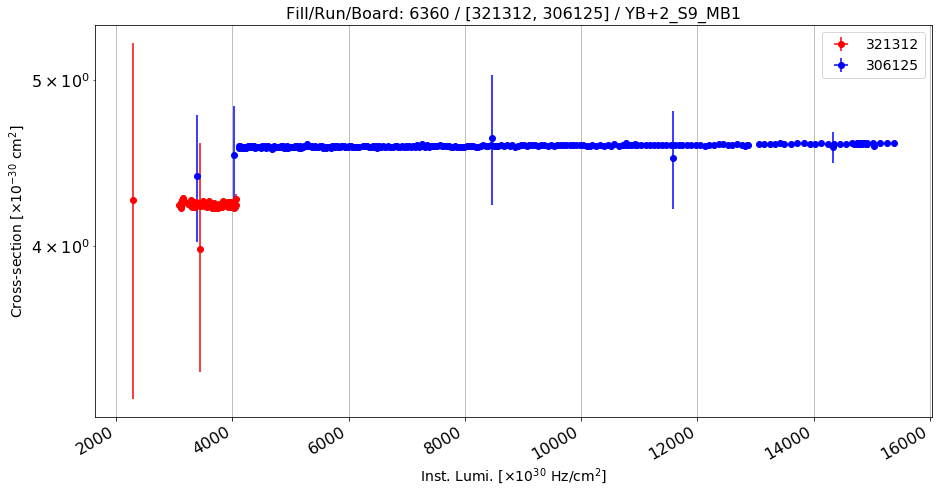

Anomalous CS: 4.22733340259 , Normal CS: 4.57994463279 , Ratio: 0.0769902823016


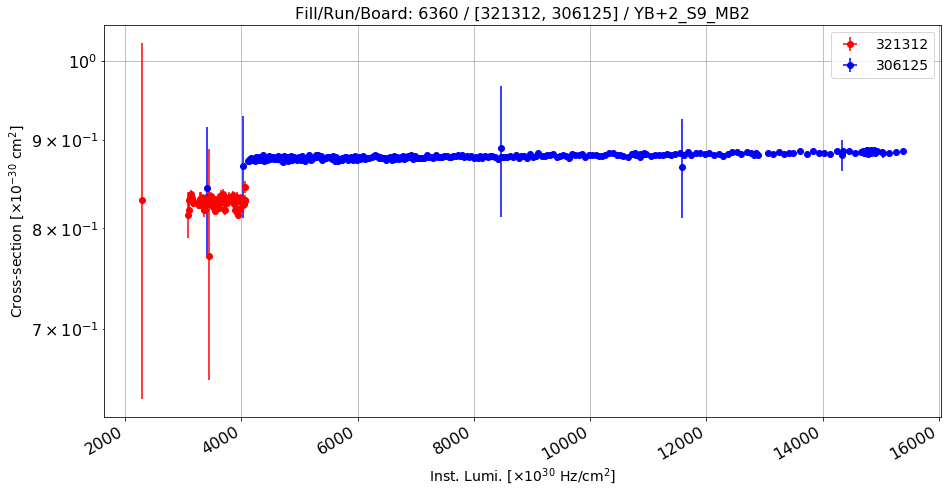

Anomalous CS: 0.828090373701 , Normal CS: 0.882189137319 , Ratio: 0.0613233164296


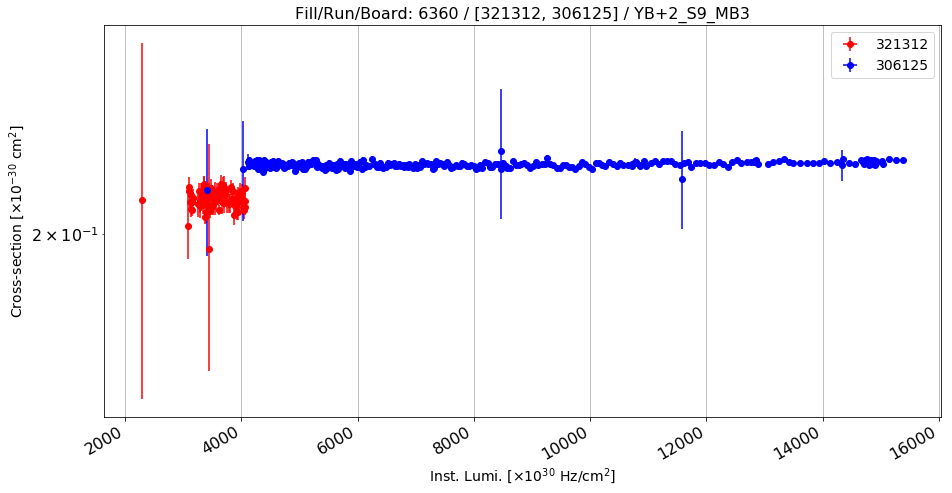

Anomalous CS: 0.209429181329 , Normal CS: 0.219766882107 , Ratio: 0.0470393931923


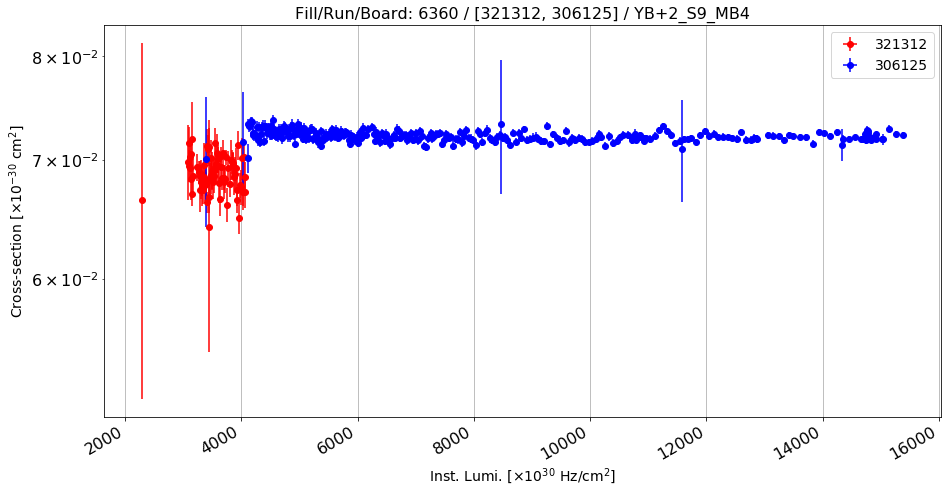

Anomalous CS: 0.0687355687575 , Normal CS: 0.0720903092621 , Ratio: 0.0465352491742


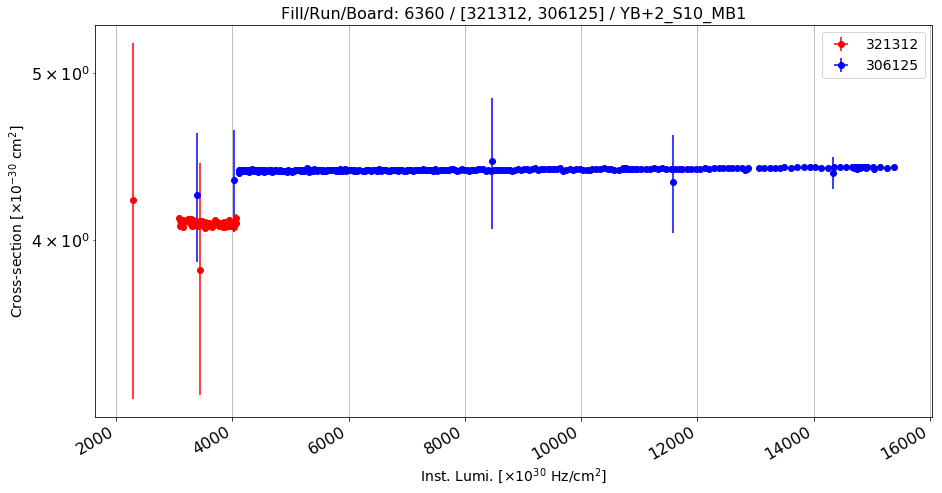

Anomalous CS: 4.08843468914 , Normal CS: 4.39726682402 , Ratio: 0.0702327484865


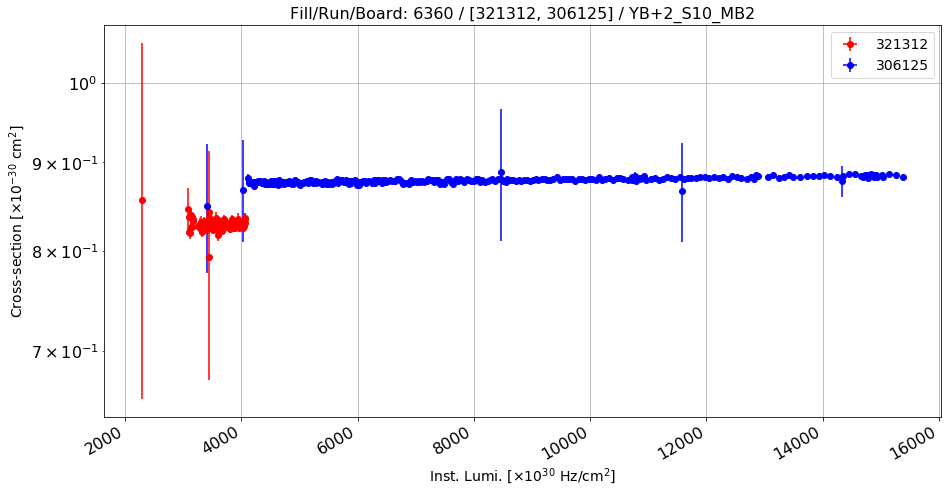

Anomalous CS: 0.82891006939 , Normal CS: 0.880270325911 , Ratio: 0.0583460046415


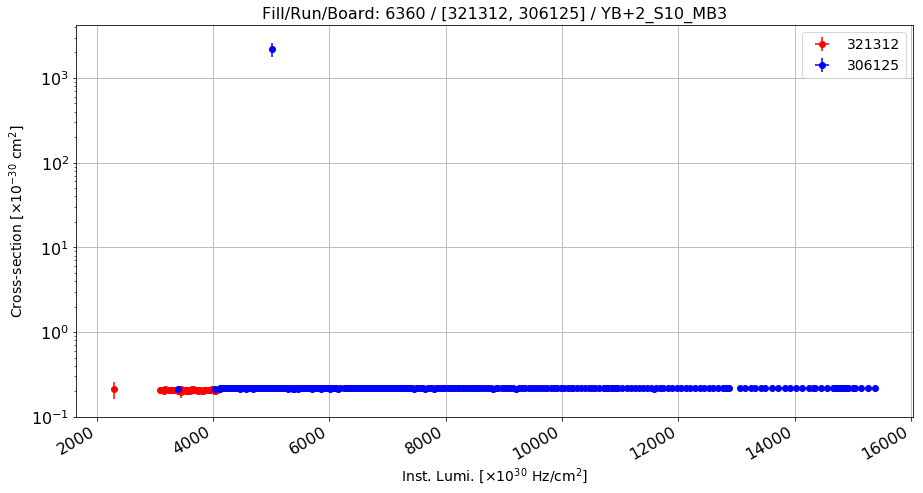

Anomalous CS: 0.205904638641 , Normal CS: 0.216723414143 , Ratio: 0.0499197354581


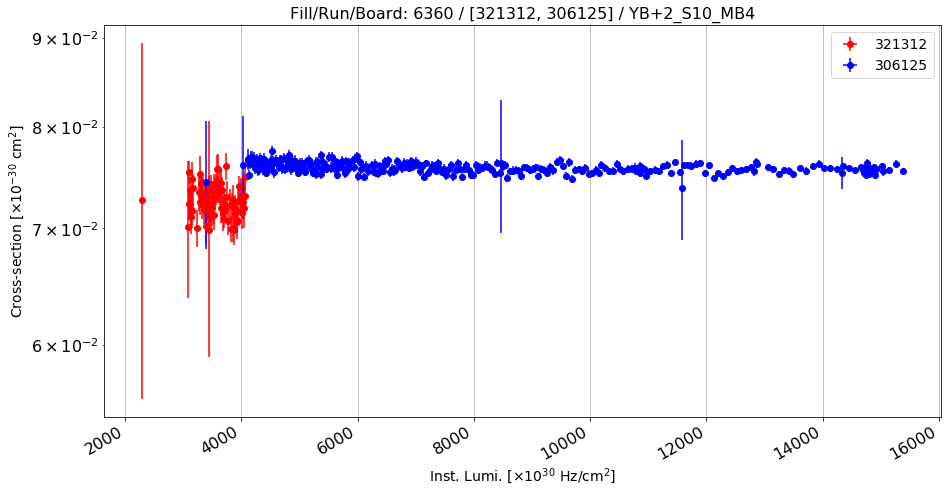

Anomalous CS: 0.0725643286476 , Normal CS: 0.0757163436594 , Ratio: 0.0416292554484


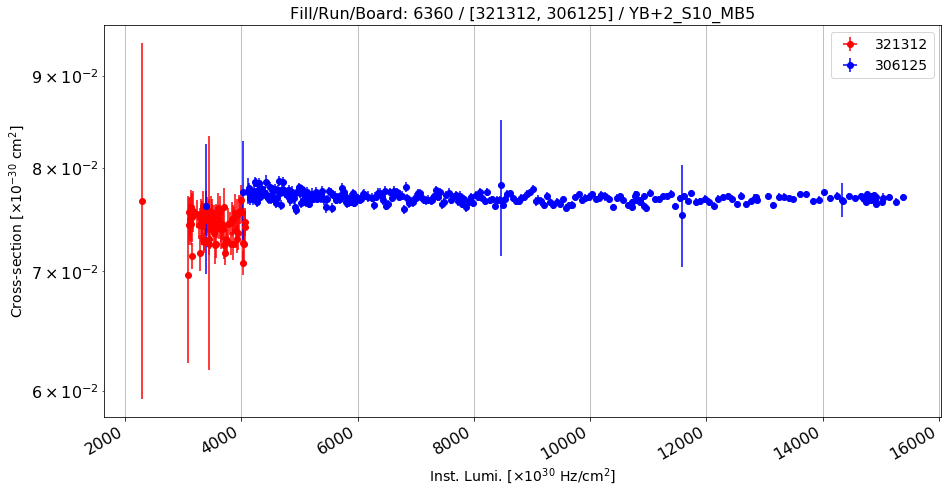

Anomalous CS: 0.0742705002706 , Normal CS: 0.0768748773922 , Ratio: 0.0338781304098


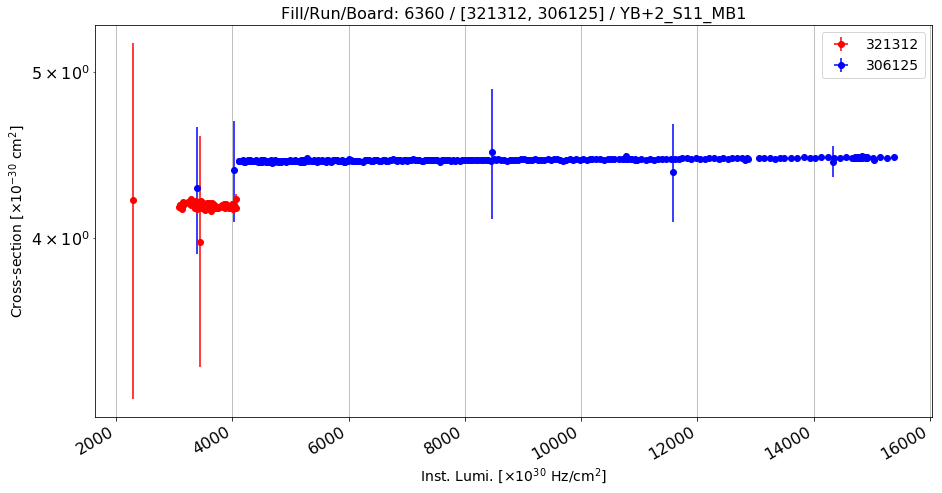

Anomalous CS: 4.17730682386 , Normal CS: 4.44720280029 , Ratio: 0.0606889293227


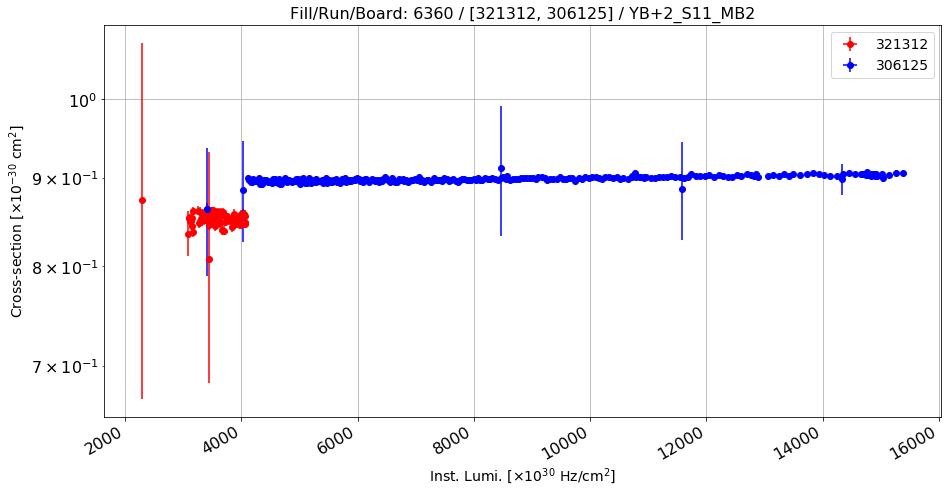

Anomalous CS: 0.852400071359 , Normal CS: 0.900667258971 , Ratio: 0.0535904765405


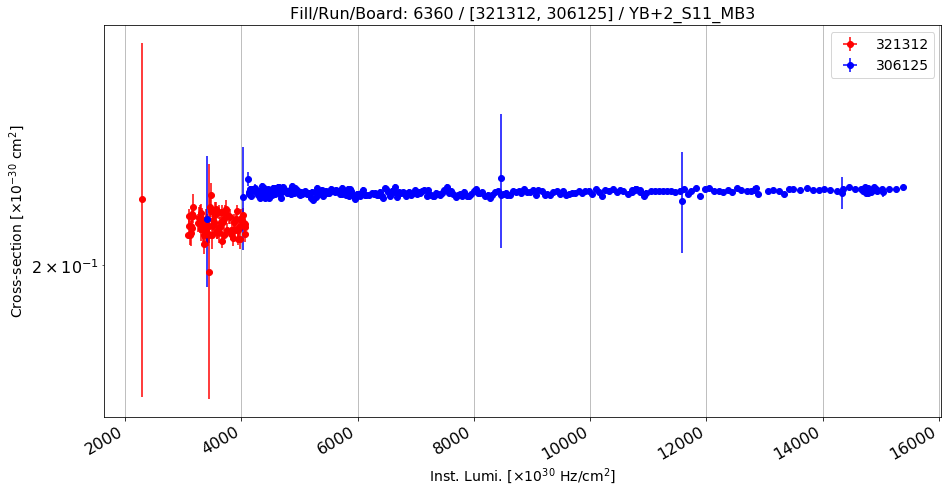

Anomalous CS: 0.211034352413 , Normal CS: 0.220186685068 , Ratio: 0.0415662402674


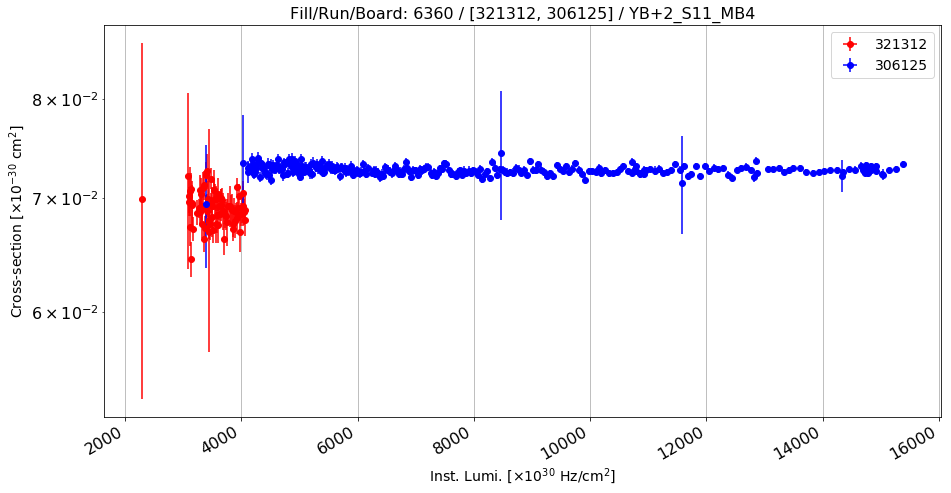

Anomalous CS: 0.0689723919213 , Normal CS: 0.0726080170761 , Ratio: 0.0500719521229


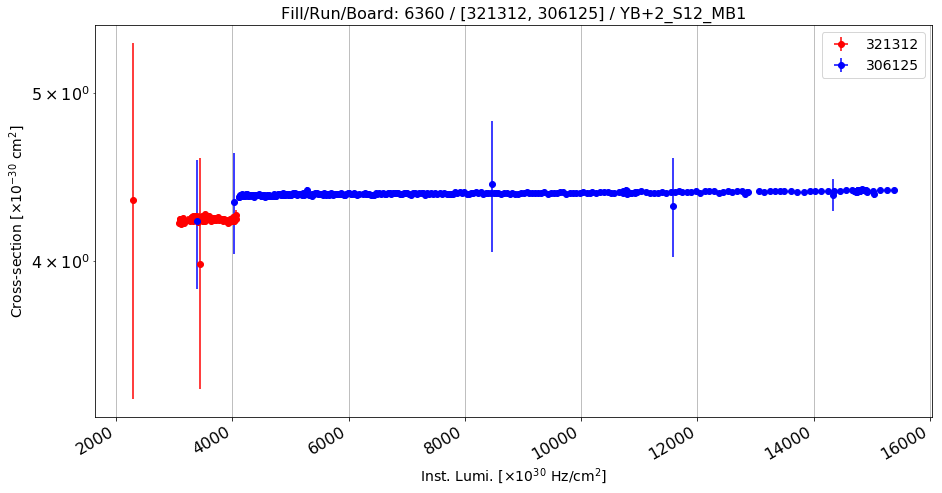

Anomalous CS: 4.22464789219 , Normal CS: 4.37992182254 , Ratio: 0.0354513017905


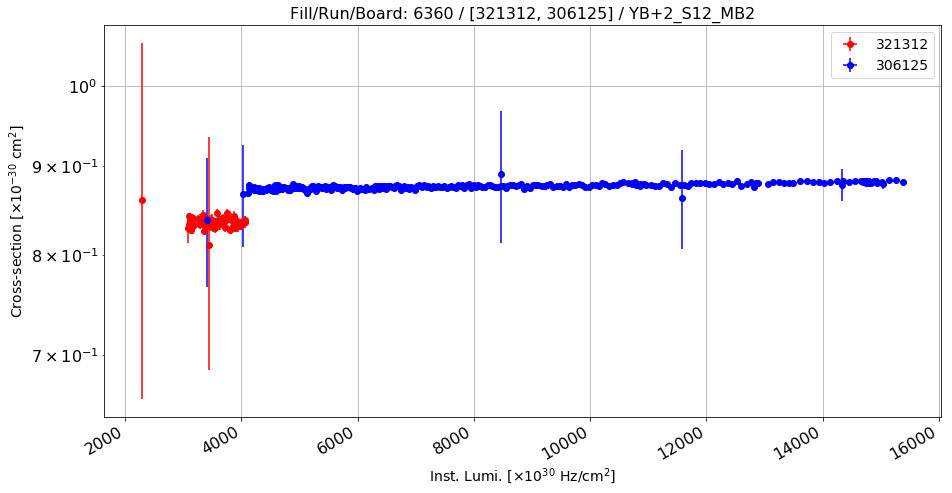

Anomalous CS: 0.834798820408 , Normal CS: 0.877438581855 , Ratio: 0.0485957220582


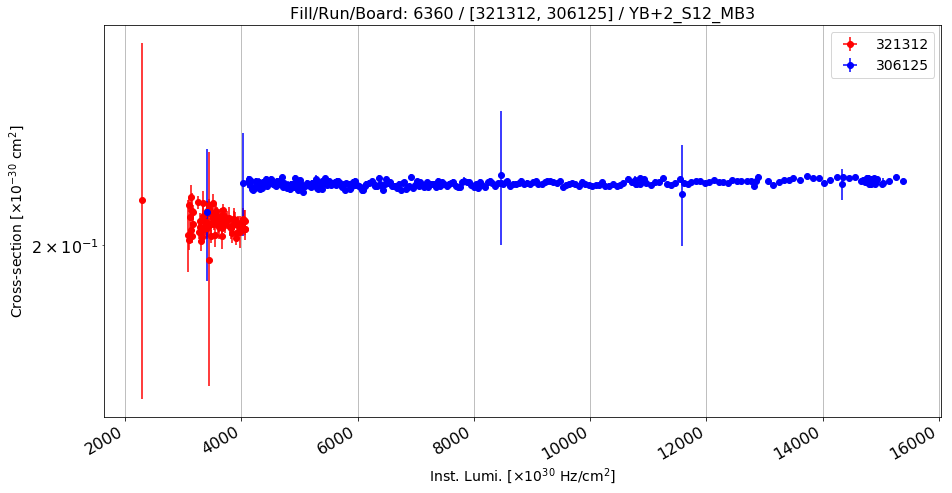

Anomalous CS: 0.206058586493 , Normal CS: 0.217010987889 , Ratio: 0.0504693402963


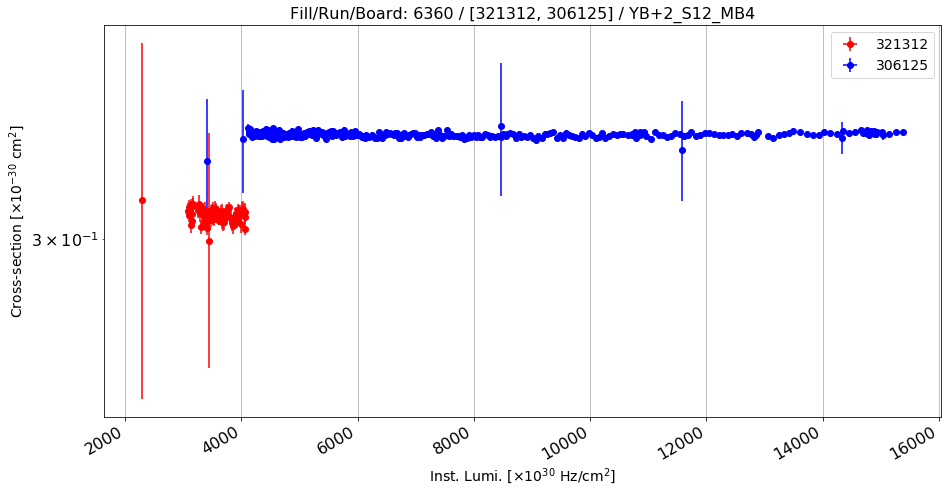

Anomalous CS: 0.309568576241 , Normal CS: 0.344085819336 , Ratio: 0.100315796686


In [209]:
ratio = pd.DataFrame(columns=["wheel", "sector", "station", "ratio", "ref", "anomal",\
                              "cs_norm", "cs_anomal"])
for i in [-2, -1, 0, +1, +2]:
#for i in [+2]:
    for j in range(1, 13):
    #for j in [10]:
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        else:
            range_ = range(1, 5)
        for k in range_:
        #for k in [3]:

            if (i > 0):
                board = "YB+" + str(i) + "_S" + str(j)
            else:
                board = "YB" + str(i) + "_S" + str(j)
            station = "DT" + str(k)
            
            error = "err"+station
            
            title = "Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / "+str("[321312, 306125]")+" / " + board + "_MB" + str(k)
                
            (a, b, c) = plot_ratio_vs_ls(df_rates, [321312, 306125], "lumi", station, board, 0,\
                            error, r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Cross-section [$\times10^{-30}$ cm$^{2}$]", title, ["ro", "bo"], True)

            ratio = ratio.append({"wheel": i, "sector": j, "station": k, "ratio": c, "ref": b,\
                                  "anomal": a, "cs_norm": 1/b, "cs_anomal": 1/a}, ignore_index = True)
            
            print "Anomalous CS:", a, ", Normal CS:", b, ", Ratio:", c
            

In [210]:
print ratio[(ratio.wheel == -1) & (ratio.sector == 10) & (ratio.station == 3)]

    wheel  sector  station         ratio       ref       anomal   cs_norm  \
89   -1.0    10.0      3.0 -46516.365517  0.244405  11369.09221  4.091564   

    cs_anomal  
89   0.000088  


Create a new dataframe with the input features already organized in a numpy array:

In [82]:
print len(df_rates)
algos = ['RPC1', 'RPC2', 'RPC3', 'RPC4', 'DT1', 'DT2', 'DT3', 'DT4', 'DT5']
df_rates_new = pd.DataFrame(columns=['run', 'group', 'board', 'wheel', 'sector', 'ls',\
                                     'lumi', 'errLumi', 'rate', 'err', 'system', 'station'])

for i in algos:
    list_a = ['run', 'group', 'board', 'wheel', 'sector', 'ls', 'lumi', 'errLumi', i, 'err'+i,]
    temp = df_rates.copy()
    temp = temp[list_a]
    temp["system"] = -1
    temp["station"] = -1
    j = i
    if (i.find("RPC") != -1):
        temp["system"] = 1
        num = i.replace("RPC", "")
        temp["station"] = int(num)
    else:
        temp["system"] = 2
        num = i.replace("DT", "")
        temp["station"] = int(num)
    temp = temp.rename(columns={j: 'rate', 'err'+j: 'err'})
    #print temp.columns
    df_rates_new = pd.concat([df_rates_new, temp], ignore_index=True)

print len(df_rates_new)

22680
204120


In [83]:
def plot_rate_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err,\
                     yerr=df_temp[rule][y_err], fmt=opt, ecolor='r')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

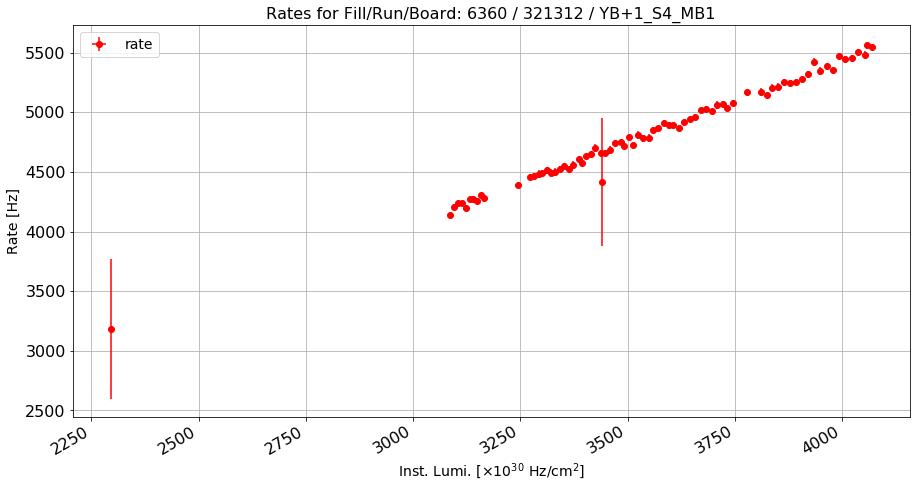

In [84]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 321312 / YB+1_S4_MB1"
plot_rate_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 1)], [321312],\
                "lumi", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [85]:
def plot_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err, yerr=df_temp[rule][y_err],\
                     fmt=opt, ecolor='r')
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["lumi"], xerr=x_err, yerr=df_temp[rule]["errLumi"],\
                     fmt='bo', ecolor='b')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

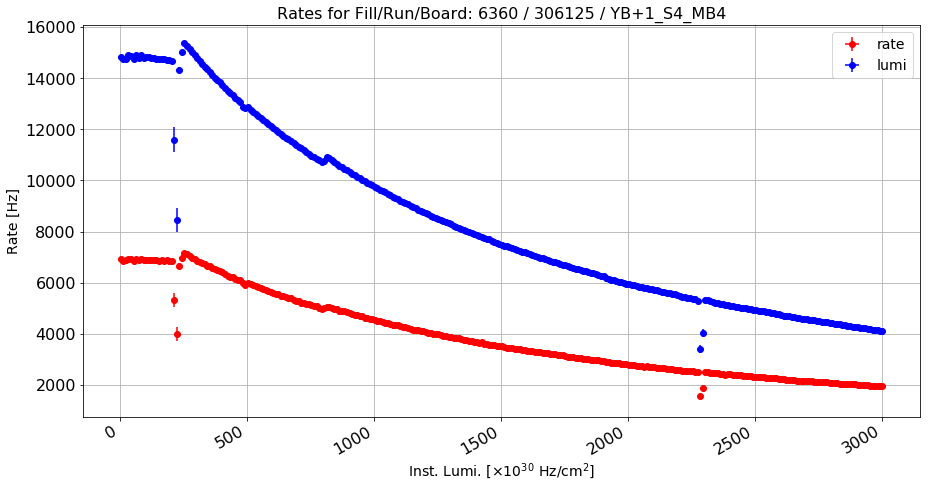

In [86]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 306125 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [306125],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

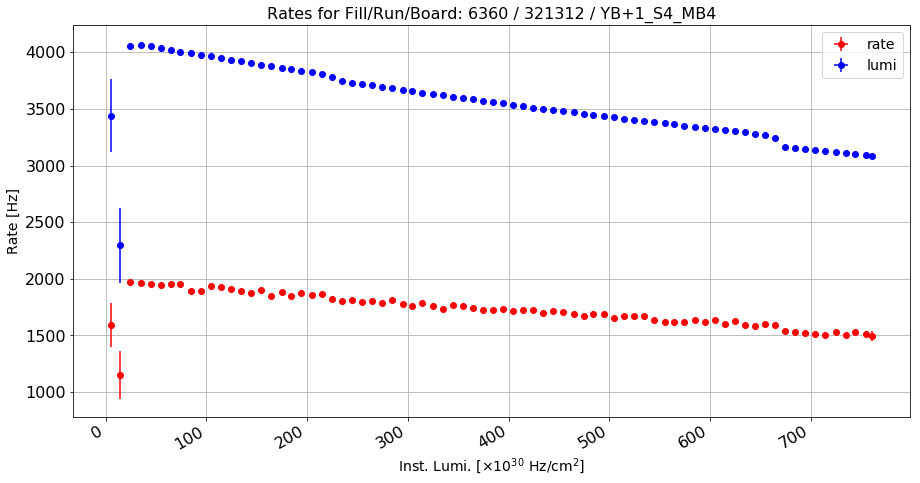

In [174]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 321312 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [321312],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [87]:
df_rates_new["CS"] = -1
df_rates_new["errCS"] = -1

df_rates_new["CS"] = df_rates_new["rate"]/df_rates_new["lumi"]
print "Number of NaN's in CS before:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS before:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["CS"] = df_rates_new["CS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["CS"] = df_rates_new["CS"].fillna(-1)

print "Number of NaN's in CS after:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS after:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["errCS"] = (1/df_rates_new["lumi"])*\
np.sqrt(df_rates_new["err"]**2 + df_rates_new["CS"]**2 * df_rates_new["errLumi"]**2)

print "Number of NaN's in errCS before:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS before:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

df_rates_new["errCS"] = df_rates_new["errCS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["errCS"] = df_rates_new["errCS"].fillna(-1)

print "Number of NaN's in errCS after:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS after:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

Number of NaN's in CS before:
0
Number of Inf's in CS before:
0
Number of NaN's in CS after:
0
Number of Inf's in CS after:
0
Number of NaN's in errCS before:
0
Number of Inf's in errCS before:
0
Number of NaN's in errCS after:
0
Number of Inf's in errCS after:
0


In [88]:
array = df_rates_new.as_matrix(columns=['system', 'wheel', 'sector', 'station',\
                                        'lumi', 'errLumi', 'rate', 'err',\
                                        'CS', 'errCS'])

/Users/cesarecalabria/Library/Python/2.7/lib/python/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [89]:
print len(array)
print len(df_rates_new)

204120
204120


In [90]:
df_rates_new["content"] = np.empty((len(df_rates_new), 0)).tolist()

In [91]:
for index, rows in df_rates_new.iterrows():
    #print index, array[index]
    df_rates_new.at[index, "content"] = array[index]
df_rates_new["score"] = -1

In [92]:
#print df_rates_new[(df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) &\
 #                                                    (df_rates_new["sector"] != 10))]["content"]

rule = ((df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) & (df_rates_new["sector"] != 10)))
df_rates_new = df_rates_new[rule == False]

In [93]:
df_rates_new["ratio"] = 0
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        range_ = range(1, 5)
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        for k in range_:
            rule = (df_rates_new.wheel == i) & (df_rates_new.sector == j) & (df_rates_new.station == k)
            rule_r = (ratio.wheel == i) & (ratio.sector == j) & (ratio.station == k)
            idx = df_rates_new[rule].index
            value = ratio[rule_r]["ratio"].item()
            #print idx, value
            for w in idx:
                df_rates_new.loc[w, "ratio"] = value

# Model inference section <a class="anchor" id="fourth-bullet"></a>

## Creating the train and test samples

In [94]:
df_rates_new_2 = df_rates_new.copy()
print df_rates_new["content"].iloc[1]

[1 1 10 1 14832.761313432853 5.083580794736273 267513.0447761194
 3691.9403703296766 18.03528278540113 0.24898119318883563]


In [95]:
#To be run just one time!!!!!!
df_rates_new["content_in"] = df_rates_new["content"].copy()
def change_data(data):
    temp = data.copy()
    temp[2] = temp[2] - 6
    temp[3] = temp[3] - 3
    return temp

df_rates_new["content"] = df_rates_new["content"].apply(change_data)

In [96]:
df_rates_new = df_rates_new[df_rates_new["system"] == 2]

In [97]:
print df_rates_new["content"].iloc[1]

[2 1 4 -2 14832.761313432853 5.083580794736273 24659.597014925374
 31.025762625525786 1.6625088541398652 0.0021679220980458445]


In [98]:
normalies = df_rates_new.copy()
anomalies = df_rates_new.copy()
print len(normalies), len(anomalies)

94500 94500


In [99]:
def deduceLS(data):
    if (bunch == 10):
        return data*10+5
anomalies["averageLS"] = anomalies["group"].apply(deduceLS)
#print anomalies.columns

In [100]:
rule = (normalies["wheel"] == -1) & (normalies["sector"] == 3) & (normalies["station"] == 3) 
print "Normal chimney:"
print normalies[rule]["content"].iloc[100]

rule = (normalies["wheel"] == 1) & (normalies["sector"] == 4) & (normalies["station"] == 3)
print "Anomalous chimney:"
print normalies[rule]["content"].iloc[100]

Normal chimney:
[2 -1 -3 0 9744.584855072457 1.8061767199476344 2131.521739130435
 5.884748761520032 0.218739101853158 0.0006052588318100501]
Anomalous chimney:
[2 1 -2 0 9744.584855072457 1.8061767199476344 1611.9130434782608
 5.309465687505742 0.16541628683536927 0.0005457251647561998]


In [101]:
def assignScore(df, score):
    temp = df.copy()
    rule = (temp["wheel"] == 1) & (temp["sector"] == 4) & (temp["station"] == 3)
    indexes = temp[rule].index
    #print indexes
    for i in indexes:
        temp.loc[i, "score"] = score
    return temp

temp = assignScore(anomalies, 1)
anomalies = temp

In [102]:
def change(data, red = 1):
    #print data
    temp = data.copy()
    temp[4] = temp[4]*red #Increase lumi by "red"
    temp[5] = temp[5]*red
    temp[8] = temp[8]*red #Increase CS by "red"
    temp[9] = temp[9]*red
    #print temp
    return temp

print anomalies["content"].iloc[0]
anomalies["content_2"] = anomalies["content"].copy()
anomalies["content_2"] = anomalies["content"].apply(change)
print anomalies["content_2"].iloc[0]

[2 1 -5 -2 14832.761313432853 5.083580794736273 23774.10447761194
 26.33308830584372 1.6028104258700384 0.0018583770810285621]
[2 1 -5 -2 14832.761313432853 5.083580794736273 23774.10447761194
 26.33308830584372 1.6028104258700384 0.0018583770810285621]


In [103]:
#Scale the data
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing.data import QuantileTransformer
def scale_data(data, scaler_type = 2):
    
    types = ["RobustScaler", "MaxAbsScaler", "QuantileTransformerUniform",\
             "QuantileTransformerNormal", "Normalizer", "MinMaxScaler"]
    #print "Scaling data using:", types[scaler_type-1]
    
    # Need to reshape since scaler works per column

    if (scaler_type == 0):
        return data
    if (scaler_type == 1):
        data = data.reshape(-1, 1)
        scaler = RobustScaler(quantile_range=(25, 75)).fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 2):
        data = data.reshape(-1, 1)
        scaler = MaxAbsScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 3):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='uniform').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 4):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='normal').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 5):
        data = data.reshape(1, -1)
        scaler = Normalizer(norm='l2').fit_transform(data)
        return scaler.reshape(1, -1)
    if (scaler_type == 6):
        data = data.reshape(-1, 1)
        scaler = MinMaxScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)

In [104]:
anomalies["content"] = anomalies["content"].apply(np.array)
anomalies["content_2"] = anomalies["content_2"].apply(np.array)
anomalies["content_scaled"] = anomalies["content"].apply(scale_data)
#anomalies["content_scaled"] = anomalies["content_2"].apply(scale_data)

Testing on 2018 data:

In [127]:
#layers_test = anomalies.copy()
layers_test = (anomalies[(anomalies.run == 321312) | (anomalies.run == 306125)]).copy()
print "Tot:", len(layers_test)
print "Normalies:", len(layers_test[layers_test.score == -1])
print "Anomalies", len(layers_test[layers_test.score == 1])

Tot: 94500
Normalies: 94122
Anomalies 378


In [128]:
def score_to_array(score):
    if score == -1:
        return np.asarray([1, 0]) #Normaly
    return np.asarray([0, 1]) #Anomaly

def nn_generate_input():  
    return np.array(np.concatenate(layers_test.content_scaled.values)).reshape(-1, 10)

test_x = nn_generate_input()

## Simple test

In [257]:
def simple_test(cross_sections, df, coeff):
    for i in df.index:
        wheel = df.wheel.loc[i]
        sector = df.sector.loc[i]
        station = df.station.loc[i]
        cs = df.CS.loc[i]
        #err_cs = df.errCS.loc[i]
        #print cs
        rule = ((cross_sections.wheel == wheel) & (cross_sections.sector == sector) &\
                (cross_sections.station == station))
        cs_norm = cross_sections[rule].CS.iloc[0]
        #err_cs_norm = cross_sections[rule].errCS.iloc[0]
        #low = cs_norm - coeff*err_cs_norm
        #hi = cs_norm + coeff*err_cs_norm
        #if ((wheel == 1) & (sector == 4) & (station == 3)):
        #    print cs, cs_norm
        low = cs_norm*(1 - coeff)
        hi = cs_norm*(1 + coeff)
        #print low, hi
        if ((cs > low) & (cs < hi)):
            res = 0
        else:
            res = +1
        df.loc[i, "st_score"] = res

In [258]:
layers_test["st_score"] = 0
layers_test.index = pd.RangeIndex(len(layers_test.index))
simple_test(factors, layers_test, 0.05)

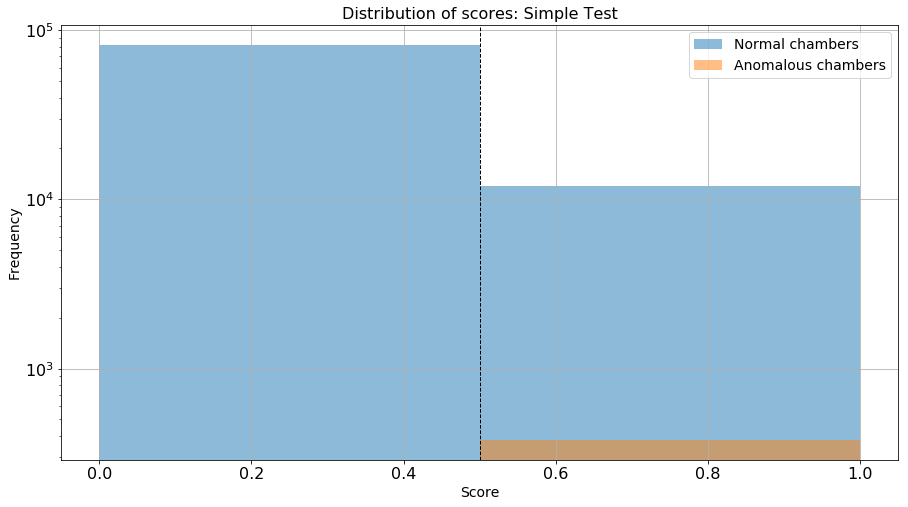

In [252]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, +1, 3)
plt.hist(layers_test[layers_test["score"] < 0]["st_score"], bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[layers_test["score"] > 0]["st_score"], bins=bins, alpha=0.5,\
         label="Anomalous chambers")
plt.title("Distribution of scores: Simple Test")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

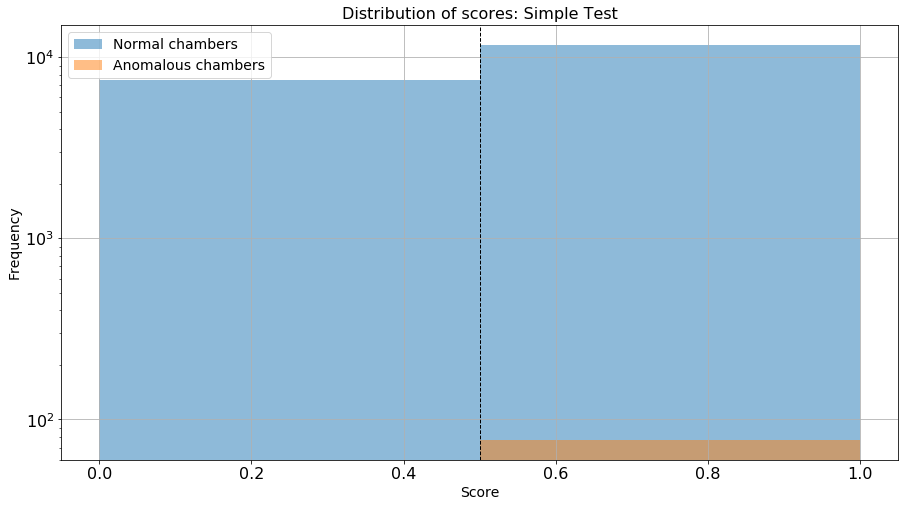

In [274]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, +1, 3)
plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test.run == 321312)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[(layers_test["score"] > 0) & (layers_test.run == 321312)]["st_score"],\
         bins=bins, alpha=0.5,\
         label="Anomalous chambers")
plt.title("Distribution of scores: Simple Test")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

In [253]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Normalized confusion matrix
[[ 0.87202779  0.12797221]
 [ 0.          1.        ]]


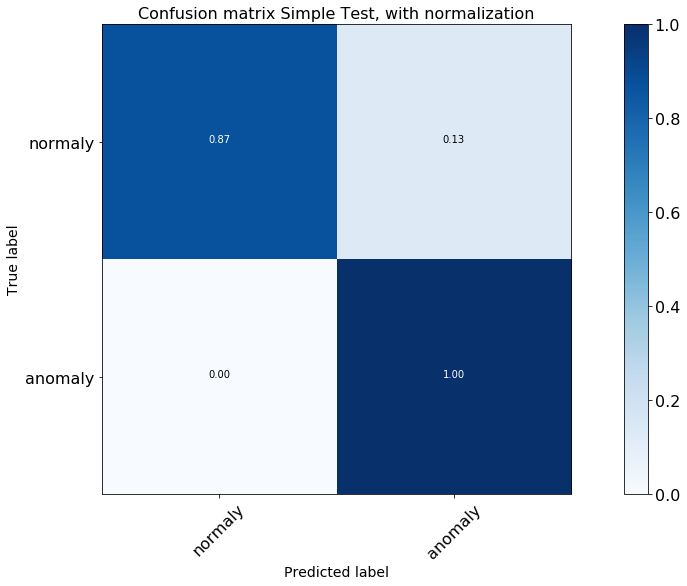

In [254]:
th_km = 0.0
y_pred = 2*(layers_test["st_score"] > th_km)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix Simple Test, with normalization')

In [255]:
def plotFpVsLs(run, wheel, sector, station, title, df, algo, threshold, log, bound):
    fig, ax = plt.subplots()
    if log:
        ax.set_yscale('log')
    bins = np.linspace(0, bound, int(bound/10)+10)
    (n, bins, patches) = plt.hist(df[(df["score"] == -1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="False positives")
    plt.hist(df[(df["score"] == 1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="True positives")
    plt.plot(df[(df["run"] == run)]["averageLS"],\
             df[(df["run"] == run)]["lumi"], "ro",\
             alpha=0.5, label="Inst. Lumi. $(x 10^{30} Hz/cm^2)$")
    plt.title(title+str(run))
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('LS')
    plt.grid(True)
    #plt.plot([bound, bound], [0, 100], color='r', linestyle='--', linewidth=2)
    plt.show()
    return n

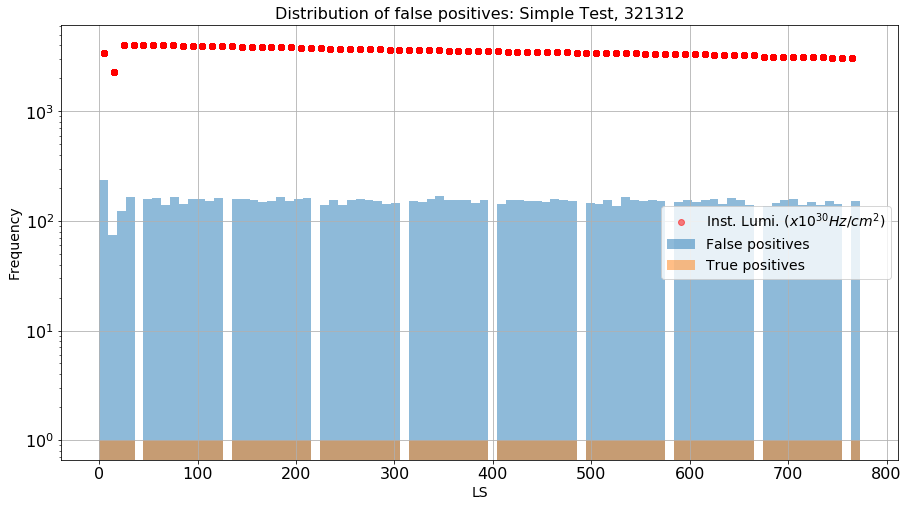

array([ 236.,   74.,  123.,  165.,    0.,  160.,  161.,  140.,  164.,
        142.,  158.,  158.,  153.,  162.,    0.,  158.,  159.,  155.,
        149.,  153.,  166.,  152.,  160.,  162.,    0.,  140.,  157.,
        141.,  155.,  160.,  155.,  152.,  144.,  146.,    0.,  153.,
        148.,  158.,  168.,  157.,  155.,  157.,  146.,  154.,    0.,
        142.,  156.,  156.,  153.,  153.,  148.,  159.,  157.,  152.,
          0.,  145.,  144.,  154.,  137.,  166.,  157.,  151.,  156.,
        153.,    0.,  148.,  157.,  148.,  155.,  160.,  142.,  161.,
        154.,  139.,    0.,  138.,  147.,  155.,  158.,  140.,  148.,
        139.,  153.,  143.,    0.,  151.])

In [256]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: Simple Test, ",\
           layers_test, "st_score",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])

## Inference

Making an inference using the model and the test sample:

In [112]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
K.set_session(sess)

In [113]:
ann_model_1 = load_model("./model_keras/ann_1.h5")
ann_model_2 = load_model("./model_keras/ann_2.h5")
ann_model_3 = load_model("./model_keras/ann_3.h5")
ann_model_4 = load_model("./model_keras/ann_4.h5")

In [134]:
layers_test["ann_score_1"] = ann_model_1.predict(np.array(test_x))[:, 1]
layers_test["ann_score_2"] = ann_model_2.predict(np.array(test_x))[:, 1]
layers_test["ann_score_3"] = ann_model_3.predict(np.array(test_x))[:, 1]
layers_test["ann_score_4"] = ann_model_4.predict(np.array(test_x))[:, 1]

In [135]:
cae_model = load_model("./model_keras/cae.h5")
layers_test["cae_score"] = np.sum(abs(test_x - cae_model.predict(np.array(test_x))), axis=1)

In [136]:
def benchmark(y_true, y_score, treshold):
    y_pred = 2*(y_score > treshold)-1
    y_true = 2*(y_true > treshold)-1
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = round(float(tp)/(tp+fn), 4)
    specificity = round(float(tn)/(tn+fp), 4)

    print("Model accuracy: %s" % round(accuracy_score(y_true, y_pred), 4))
    print("Model sensitivity: %s" % sensitivity)
    print("Model specificity: %s" % specificity)

    return specificity, sensitivity
    
print "DNN:"
specificity_ann, sensitivity_ann = benchmark(layers_test["score"], layers_test["ann_score_4"], 0.5)
print "AE:"
specificity_cae, sensitivity_cae = benchmark(layers_test["score"], layers_test["cae_score"], 0.055)

DNN:
Model accuracy: 0.9988
Model sensitivity: 1.0
Model specificity: 0.9988
AE:
Model accuracy: 0.9904
Model sensitivity: 0.0212
Model specificity: 0.9943


In [117]:
def get_roc_curve(test_df, models, working_point=None):
    """Generates ROC Curves for a given array"""
    fig, ax = plt.subplots()
    ax.grid()

    for legend_label, model_score in models:
        false_positive_rate, true_positive_rate, _ = roc_curve(test_df["score"],
                                                               test_df[model_score])
        #plt.xlim(0, 0.2)
        plt.plot(false_positive_rate, true_positive_rate, linewidth=2,
                 label=('%s, AUC: %s' % (legend_label,
                                         round(auc(false_positive_rate, true_positive_rate), 4))))
    if working_point:
        plt.plot(1-working_point[0],
                 working_point[1],
                 'o',
                 label="DNN working point")
    plt.title("ROC")
    plt.legend(loc='best')
    plt.ylabel('True positive rate')
    plt.xlabel('False positive rate')
    plt.show();

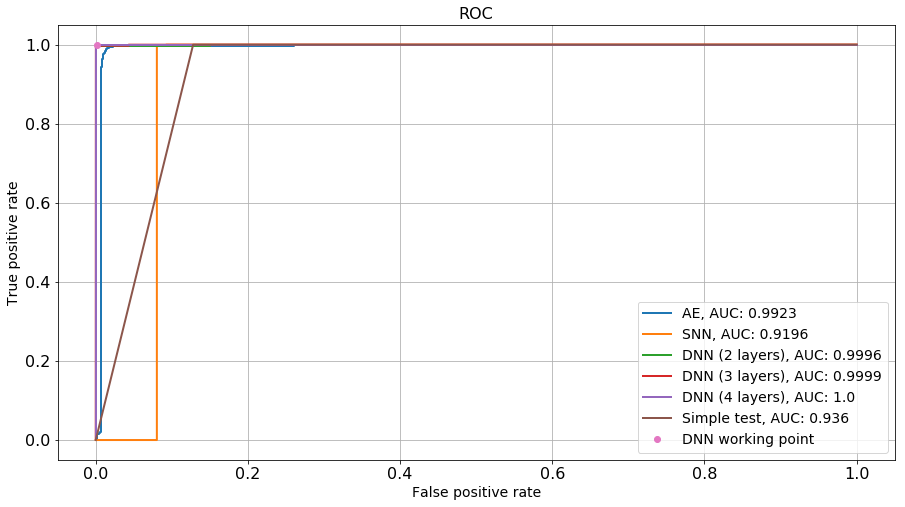

In [261]:
get_roc_curve(layers_test, 
              [
               ("AE", "cae_score"),
               ("SNN", "ann_score_1"),
               ("DNN (2 layers)", "ann_score_2"),
               ("DNN (3 layers)", "ann_score_3"),
               ("DNN (4 layers)", "ann_score_4"),
               ("Simple test", "st_score"),
               ], (specificity_ann, sensitivity_ann))

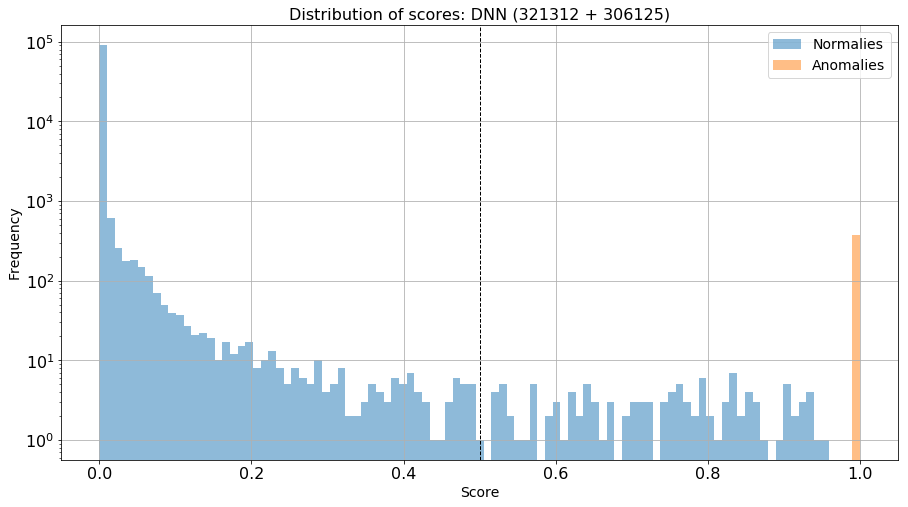

In [138]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 1, 100)
plt.hist(layers_test[layers_test["score"] < 0]["ann_score_4"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["ann_score_4"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: DNN (321312 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

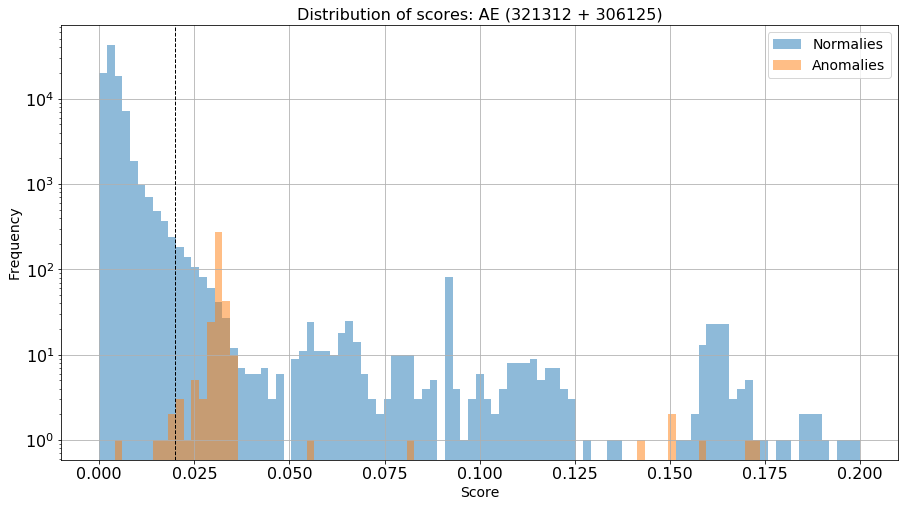

In [139]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 0.2, 100)
plt.hist(layers_test[layers_test["score"] < 0]["cae_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["cae_score"], bins=bins, alpha=0.5, label="Anomalies")
#for i in [-1, +1]:
#    plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test["wheel"] == int(i))]\
#             ["cae_score"], bins=bins, alpha=0.5, label="Normalies_Wheel_"+str(i))
plt.title("Distribution of scores: AE (321312 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
plt.show()

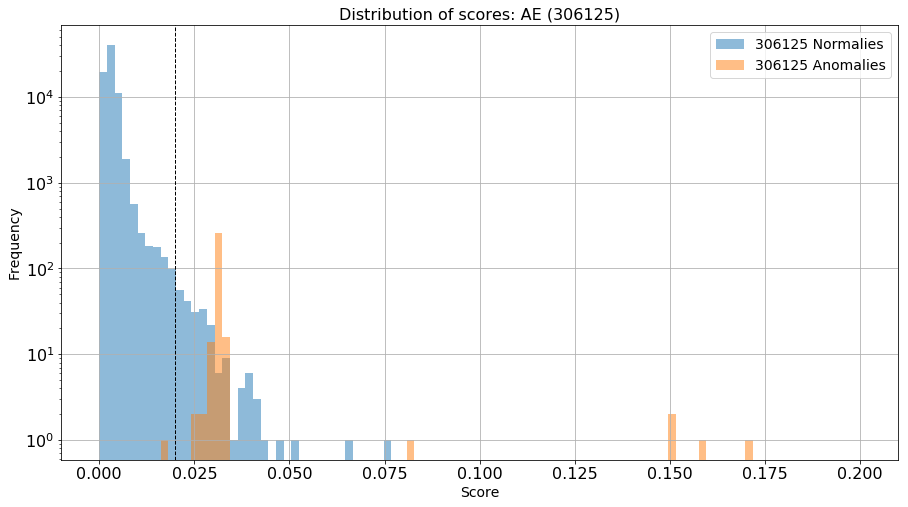

In [140]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 0.2, 100)
plt.hist(layers_test[(layers_test["run"] == 306125) & (layers_test["score"] < 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="306125 Normalies")
plt.hist(layers_test[(layers_test["run"] == 306125) & (layers_test["score"] > 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="306125 Anomalies")
plt.title("Distribution of scores: AE (306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
plt.show()

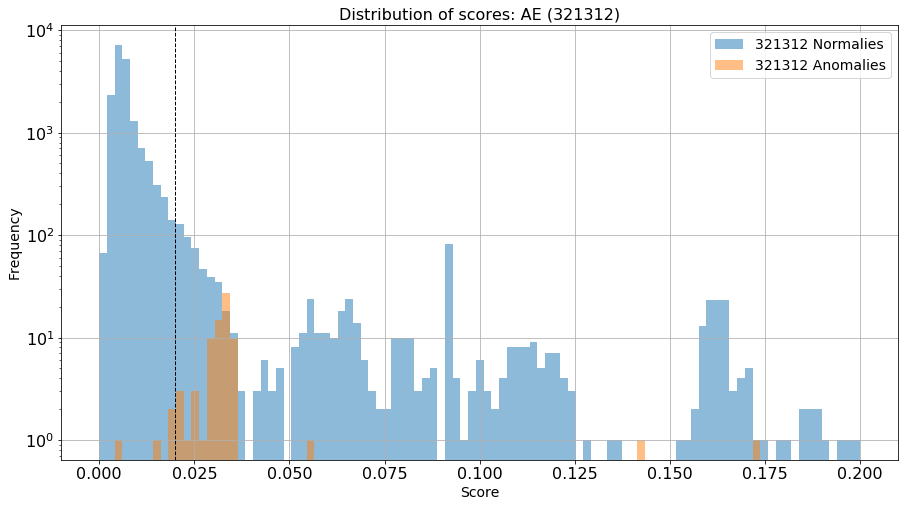

In [141]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 0.2, 100)
plt.hist(layers_test[(layers_test["run"] == 321312) & (layers_test["score"] < 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="321312 Normalies")
plt.hist(layers_test[(layers_test["run"] == 321312) & (layers_test["score"] > 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="321312 Anomalies")
#for i in [-1, +1]:
#    plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test["wheel"] == int(i))]\
#             ["cae_score"], bins=bins, alpha=0.5, label="Normalies_Wheel_"+str(i))
plt.title("Distribution of scores: AE (321312)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
plt.show()

Normalized confusion matrix
[[ 0.99498523  0.00501477]
 [ 0.          1.        ]]


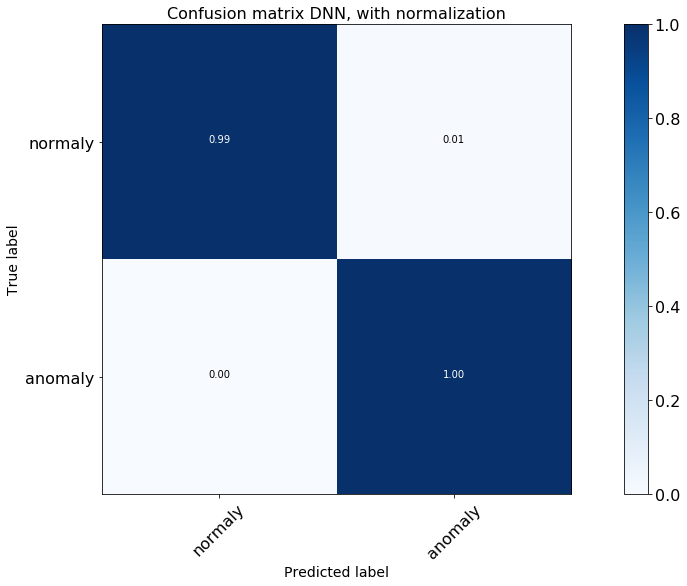

In [142]:
th_DNN = 0.1
y_pred = 2*(layers_test["ann_score_4"] > th_DNN)-1
layers_test["score"] = 2*(layers_test["score"] > th_DNN)-1

cnf_matrix = confusion_matrix(layers_test["score"], y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix DNN, with normalization')

Normalized confusion matrix
[[ 0.94565274  0.05434726]
 [ 0.05194805  0.94805195]]


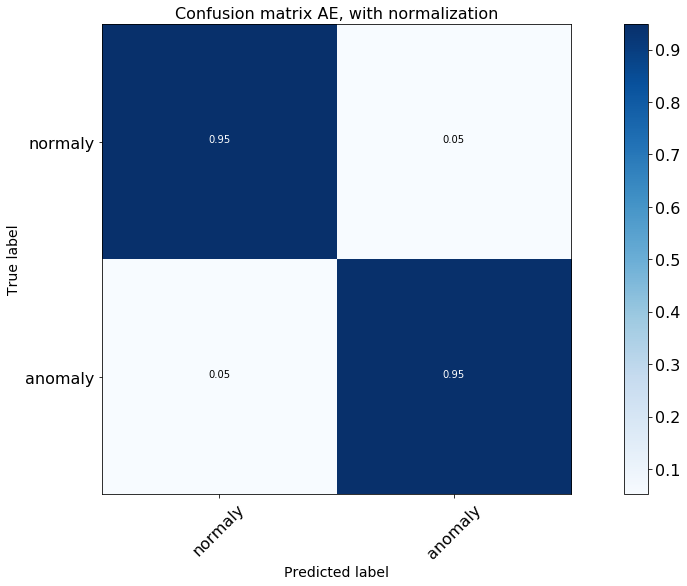

In [215]:
th_AE = 0.02
y_pred = 2*(layers_test[layers_test.run == 321312]["cae_score"] > th_AE)-1
cnf_matrix = confusion_matrix(layers_test[layers_test.run == 321312]["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix AE, with normalization')

In [144]:
def get_matrix(df):
    x = np.zeros((5,12),dtype=int)
    for i in range(len(df)):
        a = int(5-df["station"].iloc[i])
        b = int(df["sector"].iloc[i]-1)
        x[a,b] = x[a,b] + 1
    return x

In [145]:
def plot_scatter(df, run, wheel, ls_min, ls_max):
    run_s = "All"
    wheel_s = "All"
    ls_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    if run != -1:
        temp = temp[(temp["run"] == run)]
        run_s = str(run)
    if ((ls_min != -1) & (ls_max == -1)):
        temp = temp[(temp["averageLS"] >= ls_min)]
        ls_s = "> "+str(ls_min)
    elif ((ls_min == -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] <= ls_max)]
        ls_s = "< "+str(ls_max)
    elif ((ls_min != -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] >= ls_min) & (temp["averageLS"] <= ls_max)]
        ls_s = " ["+str(ls_min)+", "+str(ls_max)+"]"
    mat = get_matrix(temp)
    #print mat
    #print mat.sum()

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, mat[i, j],\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Run: "+run_s+", Wheel: "+wheel_s+", LS: "+ls_s
    plt.title(title, loc="right")   
    plt.show()

In [146]:
def plot_scatter_2(df, arg, wheel):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        vec = list(temp[rule][arg].values)
        if (i == 5):
            tmp = list(temp[rule][arg].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule]["ratio"].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

Decrease in rate per station and sector in each wheel:

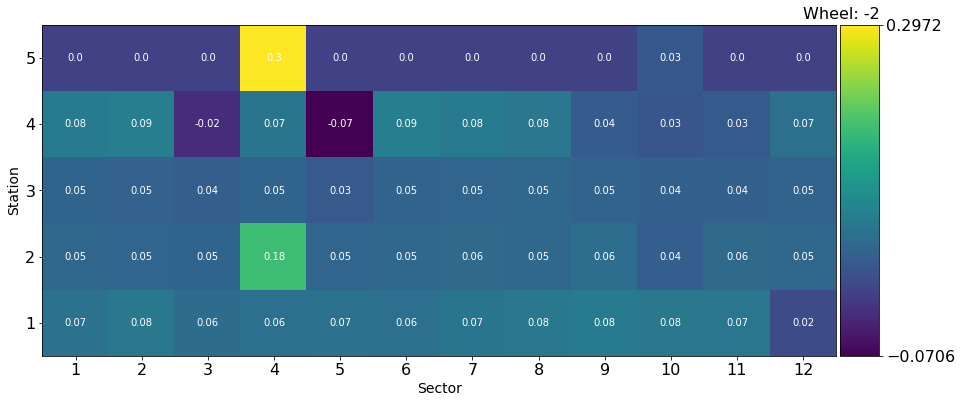

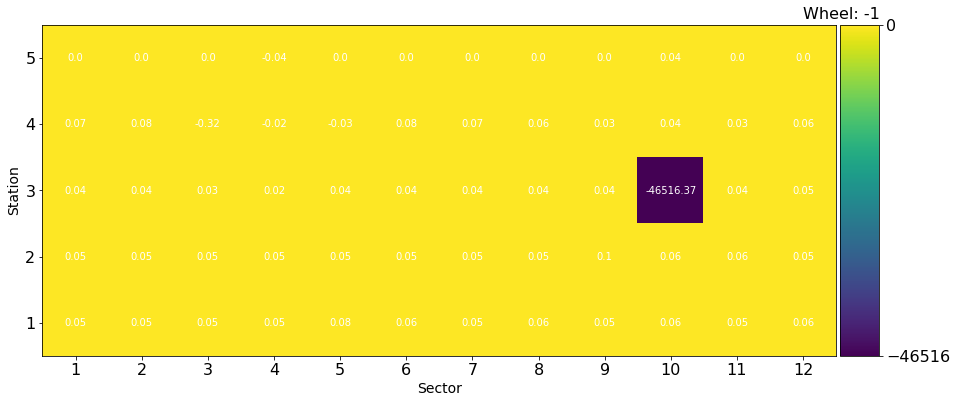

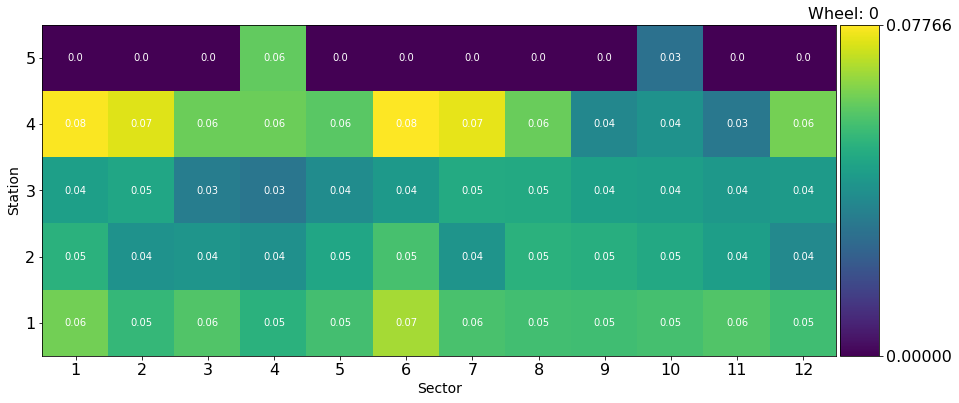

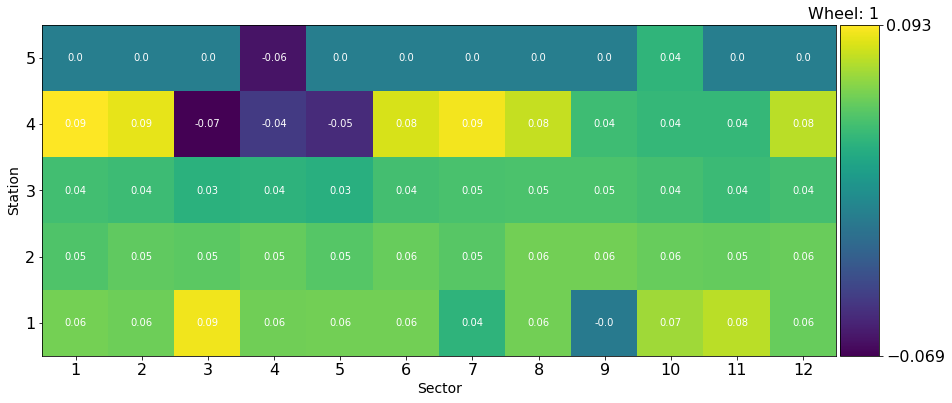

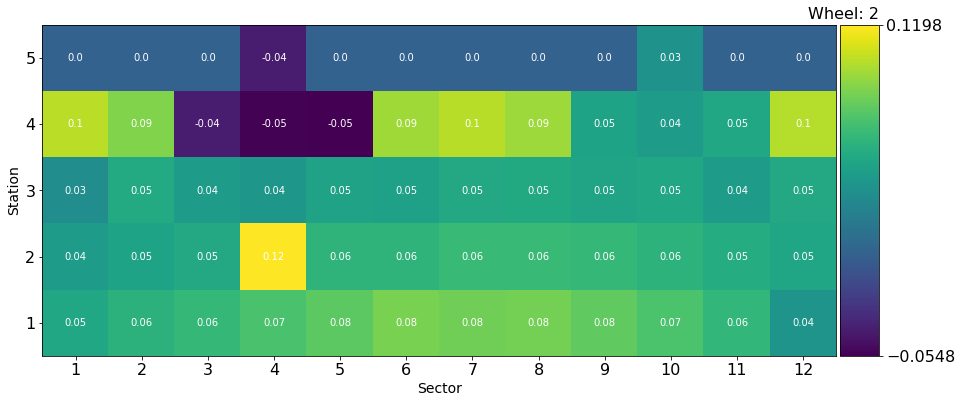

In [211]:
plot_scatter_2(ratio, "ratio", -2)
plot_scatter_2(ratio, "ratio", -1)
plot_scatter_2(ratio, "ratio", 0)
plot_scatter_2(ratio, "ratio", +1)
plot_scatter_2(ratio, "ratio", +2)

Cross-section per station and sector in each wheel for the reference run:

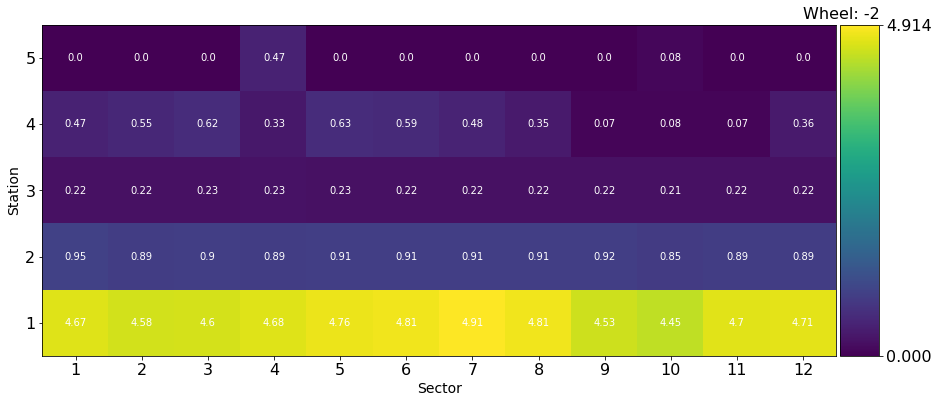

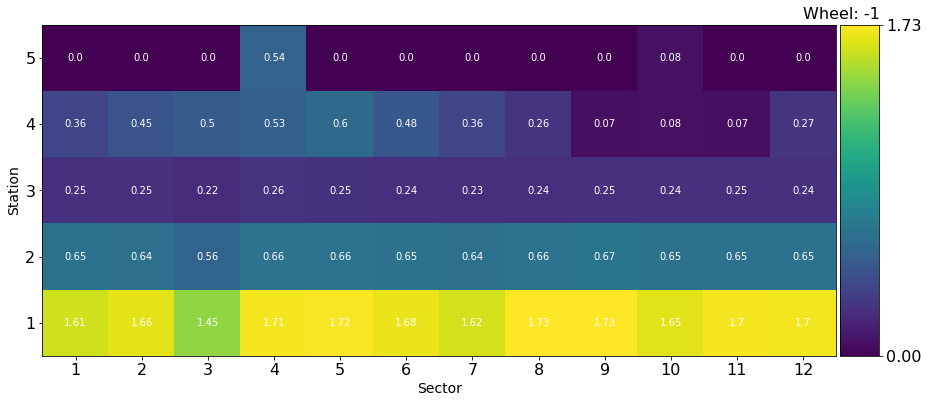

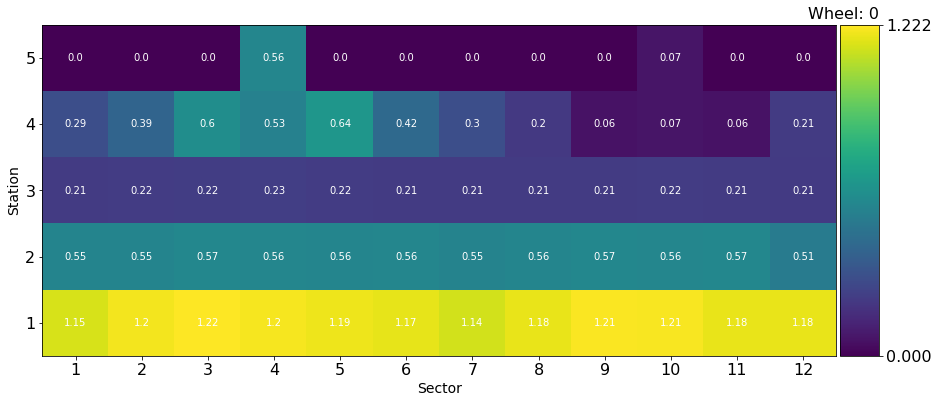

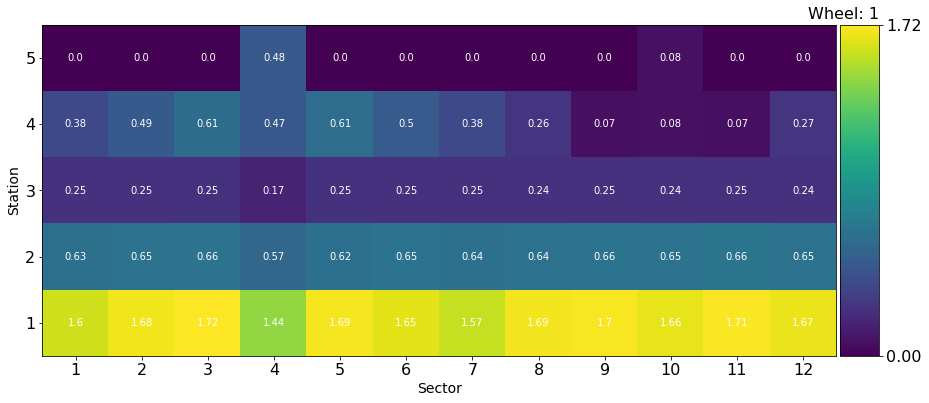

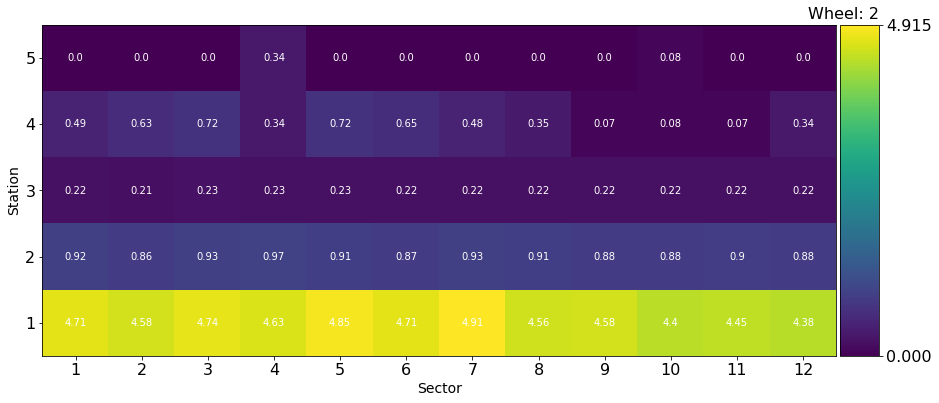

In [212]:
plot_scatter_2(ratio, "ref", -2)
plot_scatter_2(ratio, "ref", -1)
plot_scatter_2(ratio, "ref", 0)
plot_scatter_2(ratio, "ref", +1)
plot_scatter_2(ratio, "ref", +2)

Cross-section per station and sector in each wheel for the anomalous run:

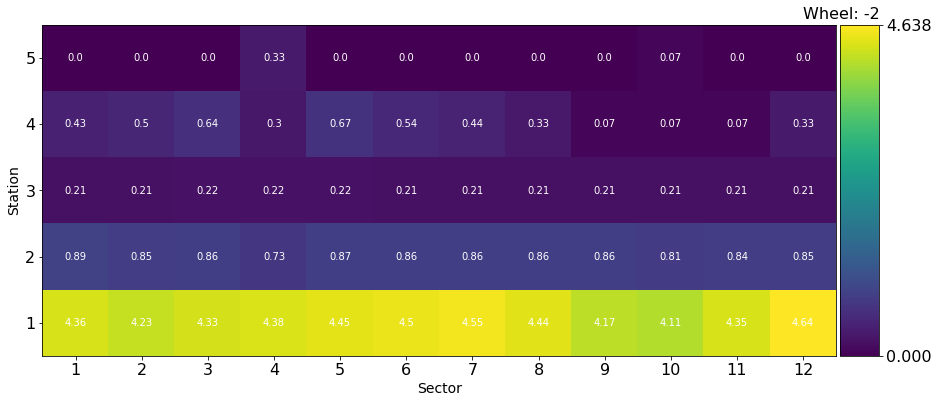

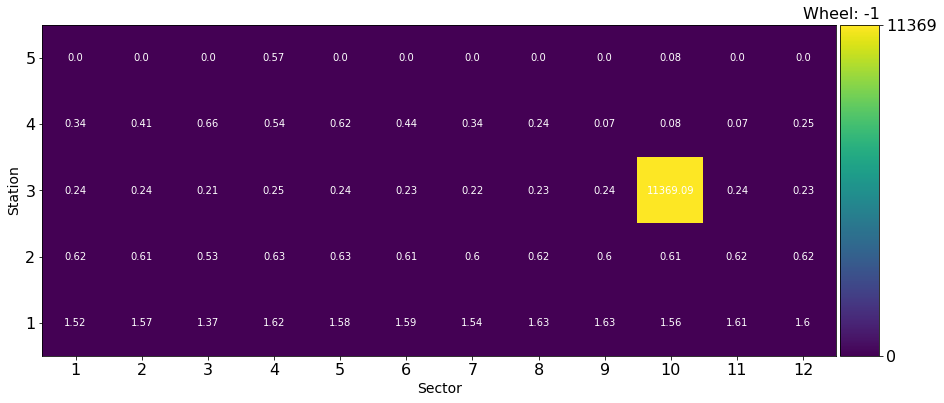

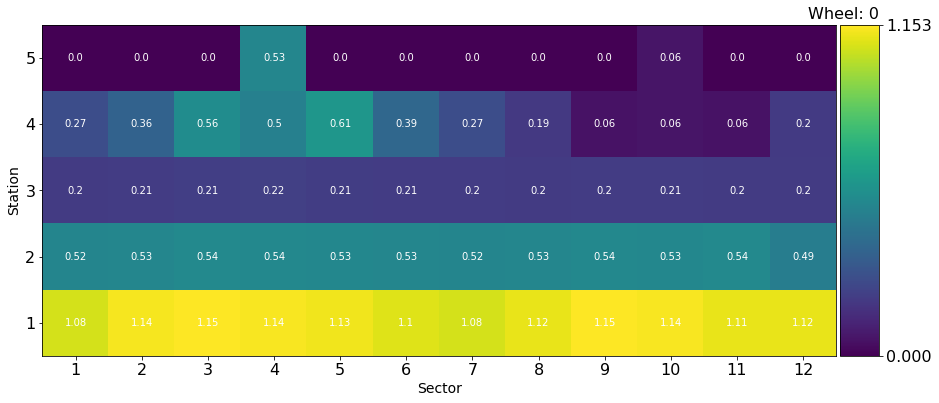

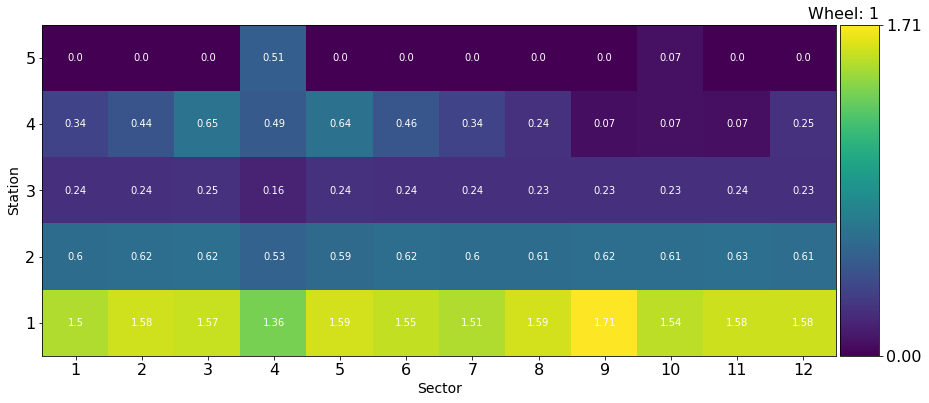

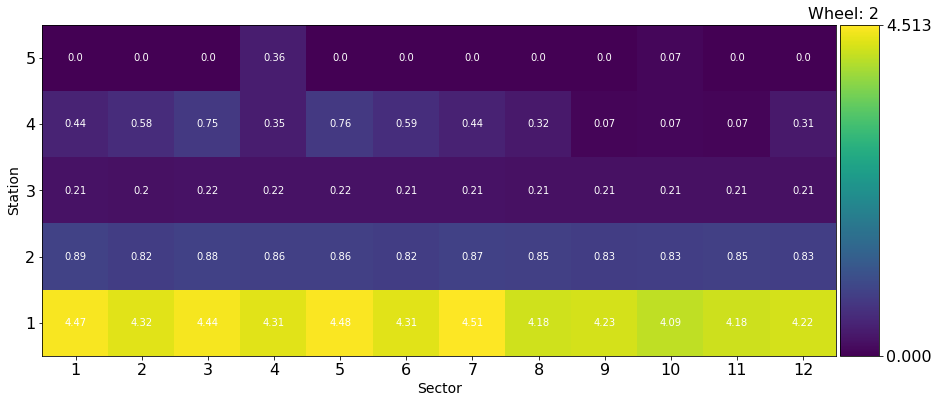

In [213]:
plot_scatter_2(ratio, "anomal", -2)
plot_scatter_2(ratio, "anomal", -1)
plot_scatter_2(ratio, "anomal", 0)
plot_scatter_2(ratio, "anomal", +1)
plot_scatter_2(ratio, "anomal", +2)

Where are the FPs located in time?

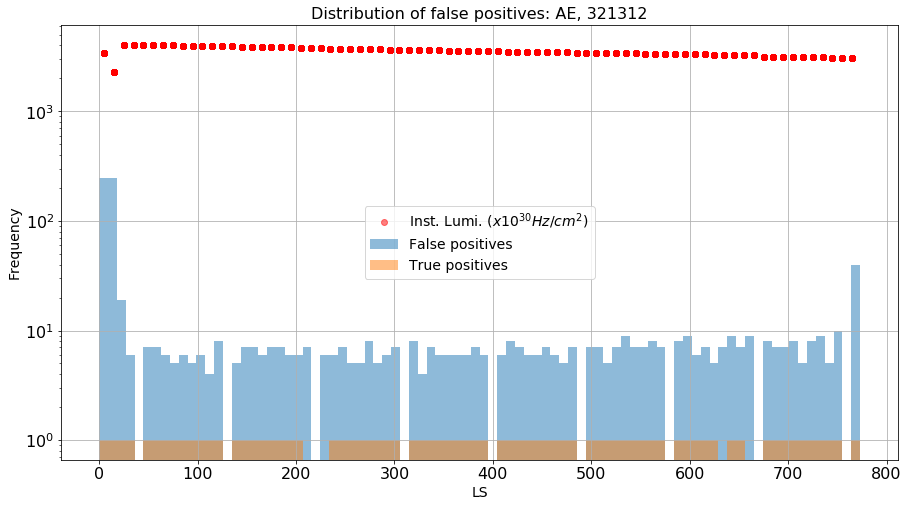

array([ 249.,  249.,   19.,    6.,    0.,    7.,    7.,    6.,    5.,
          6.,    5.,    6.,    4.,    8.,    0.,    5.,    7.,    7.,
          6.,    7.,    7.,    6.,    6.,    7.,    0.,    6.,    6.,
          7.,    5.,    5.,    8.,    5.,    6.,    7.,    0.,    8.,
          4.,    7.,    6.,    6.,    6.,    6.,    7.,    6.,    0.,
          6.,    8.,    7.,    6.,    6.,    7.,    6.,    5.,    7.,
          0.,    7.,    7.,    5.,    7.,    9.,    7.,    7.,    8.,
          7.,    0.,    8.,    9.,    6.,    7.,    5.,    7.,    9.,
          7.,    9.,    0.,    8.,    7.,    7.,    8.,    5.,    8.,
          9.,    5.,   10.,    0.,   40.])

In [155]:
threshold = th_AE
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
           #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

Trying unsupervised algorithms:

In [216]:
# fit the model
from sklearn.neighbors import LocalOutlierFactor
lofclf = LocalOutlierFactor(n_neighbors=1201,
                            contamination=0.2
                           )#It has to be a odd number
layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_scaled"].values))

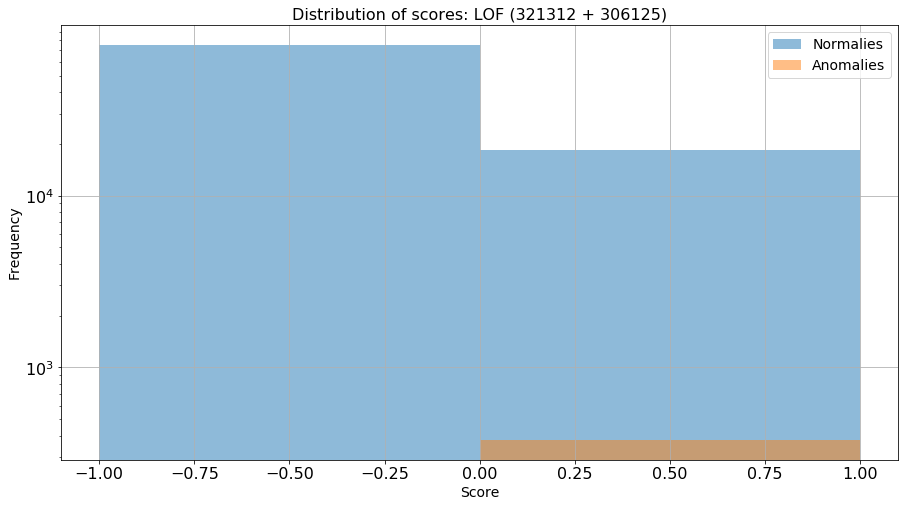

In [217]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(layers_test[layers_test["score"] < 0]["lof_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["lof_score"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: LOF (321312 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.show()

Normalized confusion matrix
[[ 0.80321285  0.19678715]
 [ 0.          1.        ]]


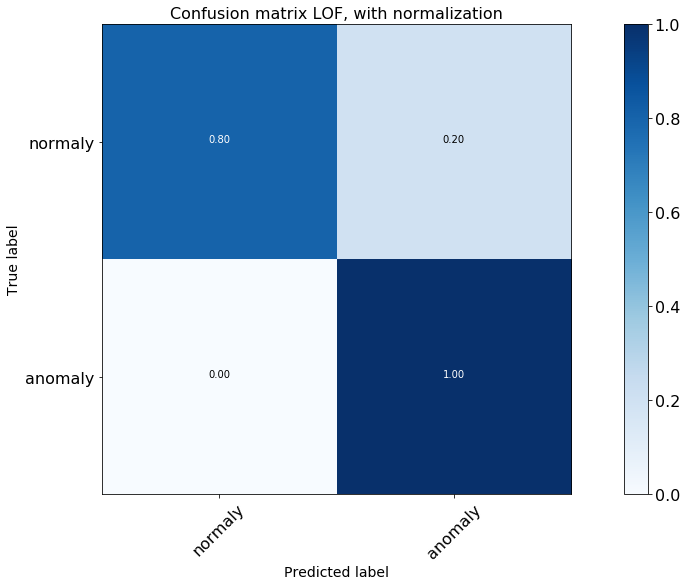

In [218]:
threshold = 0.0
y_pred = 2*(layers_test["lof_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

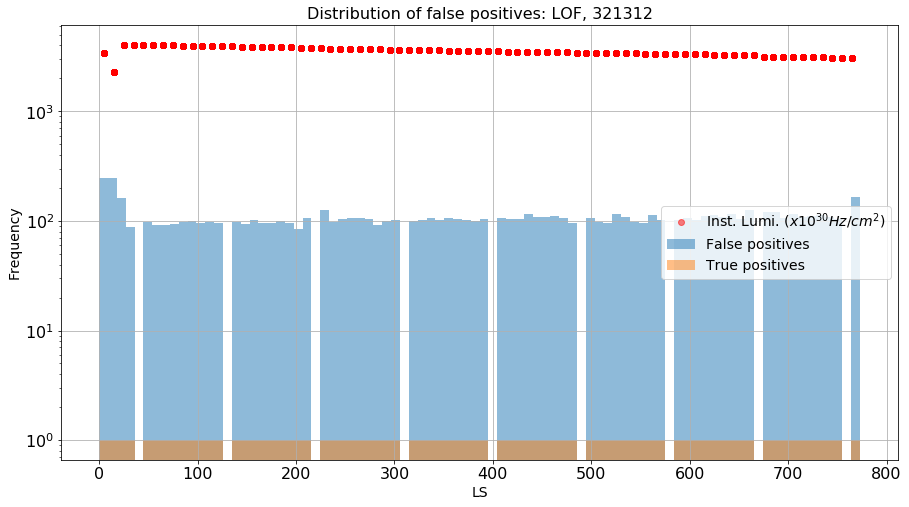

array([ 249.,  249.,  163.,   89.,    0.,   98.,   92.,   92.,   93.,
         98.,  100.,   96.,   98.,   95.,    0.,   98.,   94.,  103.,
         96.,   95.,  100.,   96.,   84.,  107.,    0.,  126.,   98.,
        105.,  107.,  106.,  105.,   91.,  100.,  101.,    0.,   99.,
        101.,  107.,  103.,  107.,  105.,  102.,  100.,  104.,    0.,
        107.,  104.,  104.,  115.,  108.,  109.,  110.,  107.,   95.,
          0.,  107.,   98.,   95.,  117.,  109.,   98.,   96.,  113.,
        103.,    0.,  102.,  106.,  103.,  111.,  114.,  109.,  115.,
        104.,  126.,    0.,  120.,  120.,  106.,  116.,  108.,  110.,
        113.,  108.,  104.,    0.,  165.])

In [219]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

## K-Means clustering reduced

In [164]:
factors = pd.DataFrame()

print("Loading SF")
path = "./factors.csv"
factors = factors.append(pd.read_csv(path,\
        names=["wheel", "sector", "station", "CS", "factor"]),\
        ignore_index=True)

print("Done.")

Loading SF
Done.


In [263]:
# 0.system, 1.wheel, 2.sector, 3.station, 4.lumi, 5.err, 6.rate, 7.err, 8.CS, 9.err
def removeItem(data):
    index = [0, 4, 5, 6, 7, 9] #leaving only position and CS
    #index = [0, 5, 7, 9] #removing system and errors
    temp = data.copy()
    temp = np.delete(temp, index)
    return temp

layers_test["content_red"] = layers_test["content"].apply(removeItem)
layers_test["content_red"] = layers_test["content_red"].apply(np.array)

In [264]:
#Reindex because otherwise anomalies and normalies have the same labels/indexes in W+3_S4_MB3
layers_test.index = pd.RangeIndex(len(layers_test.index))

def scale_cs(df, factors):
    for i in [-2, -1, 0, +1, +2]:
        for j in range(1, 13):
             for k in range(1, 6):
                rule = (df.wheel == i) & (df.sector == j) & (df.station == k)
                rule_f = (factors.wheel == i) & (factors.sector == j) & (factors.station == k)
                indexes = df[rule].index
                indexes_f = (factors[rule_f].index)
                if ((len(indexes) == 0) | (len(indexes_f) == 0)):
                    continue
                #print factors.loc[indexes_f[0], "factor"]
                for m in indexes:
                    #print i, j, k, m, df.loc[m, "content_red"]
                    content =  df.loc[m, "content_red"].copy()
                    #print i, j, k, m, df.loc[m, "content_red"], content
                    content[3] = content[3]*factors.loc[indexes_f[0], "factor"]
                    #print i, j, k, m, df.loc[m, "content_red"], content
                    df.at[m, "content_red"] = content

scale_cs(layers_test, factors)

In [265]:
#0.No rescaling
#1.RobustScaler
#2.MaxAbsScaler 
#3.QuantileTransformerUniform: NO
#4.QuantileTransformerNormal: NO
#5.Normalizer
#6.MinMaxScaler

scaler_type = 5
layers_test["content_red_scaled"] = layers_test["content_red"].apply(scale_data, args=[scaler_type])

In [168]:
print layers_test["content_red"].iloc[100]
print layers_test["content_red_scaled"].iloc[100]

[-2 -4 -2 5.0106742090913361]
[[-0.28540326 -0.57080652 -0.28540326  0.71503138]]


In [266]:
def extract_cs(data):
    #print data[0][3]
    return data[3]

layers_test["CS_red"] = layers_test["content_red"].apply(extract_cs)

In [225]:
def plot_scatter_3(df, arg, wheel, range_ = False):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    if (range_):
        temp = temp[temp.lumi > 6000]
    temp = temp.groupby(['run', 'board', 'wheel', 'sector', 'system', 'station'])\
    [[arg]].mean().reset_index()
    #print temp
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        temp2 = temp[rule].sort_values(["sector"], ascending=True)
        vec = list(temp2[arg].values)
        if (i == 5):
            tmp = list(temp2[arg].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule][arg].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

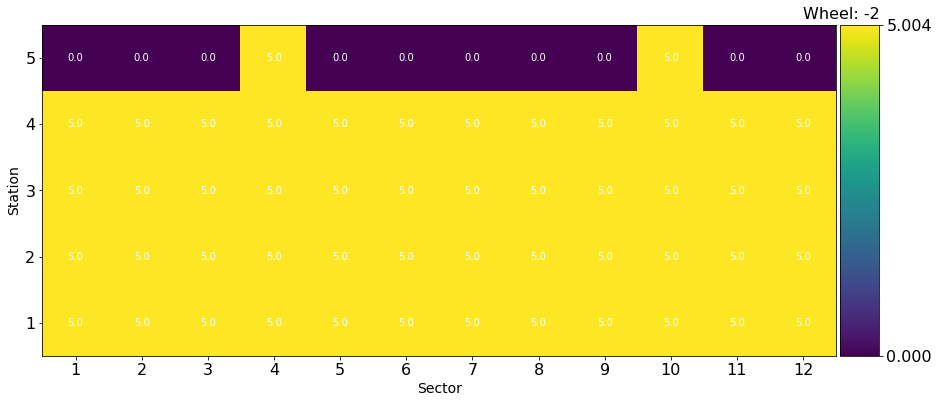

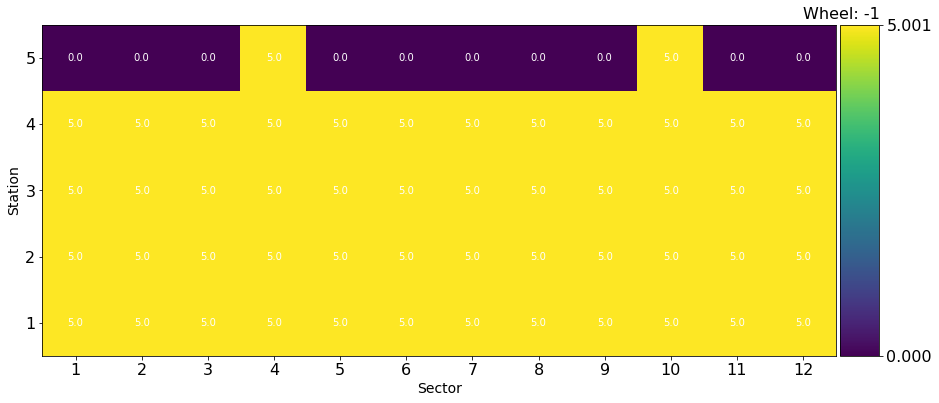

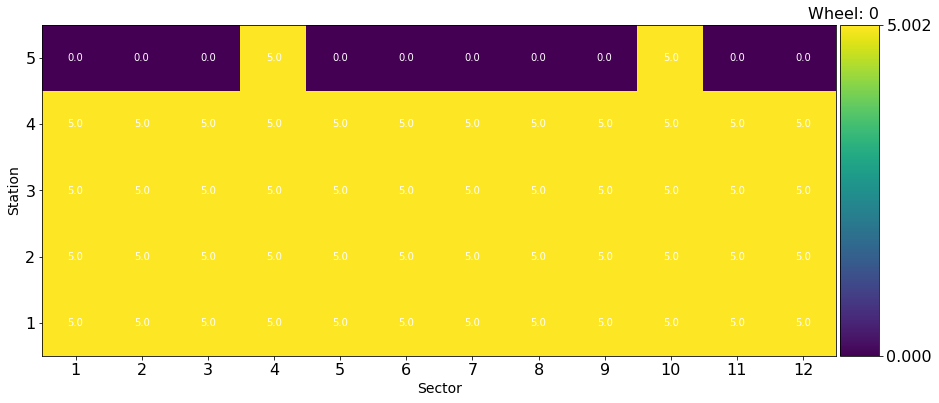

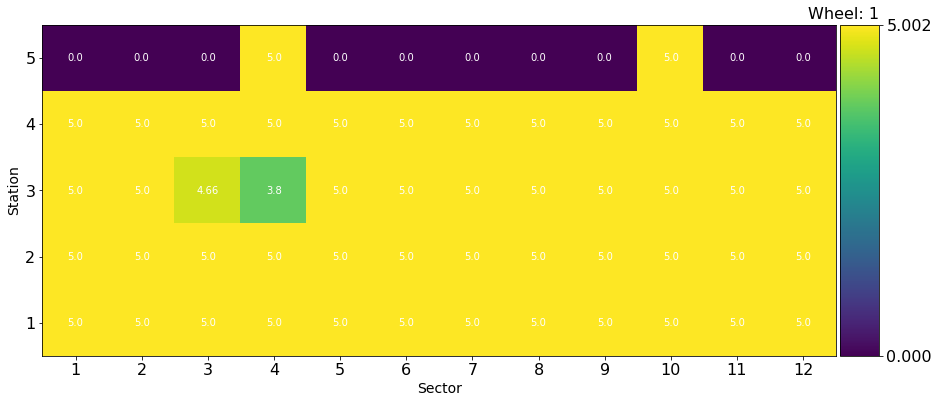

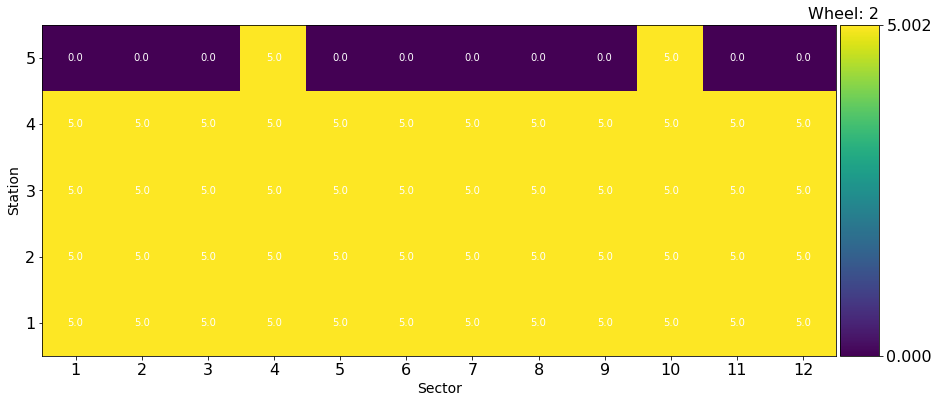

In [226]:
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", -2, True)
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", -1, True)
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", 0, True)
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", +1, True)
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", +2, True)

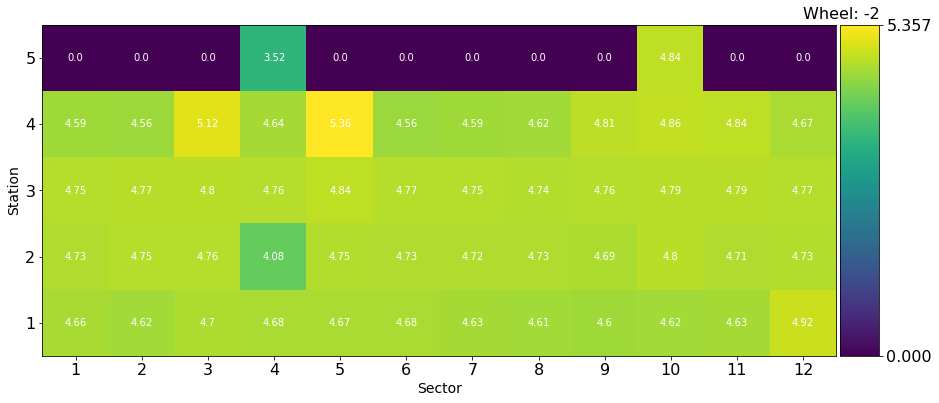

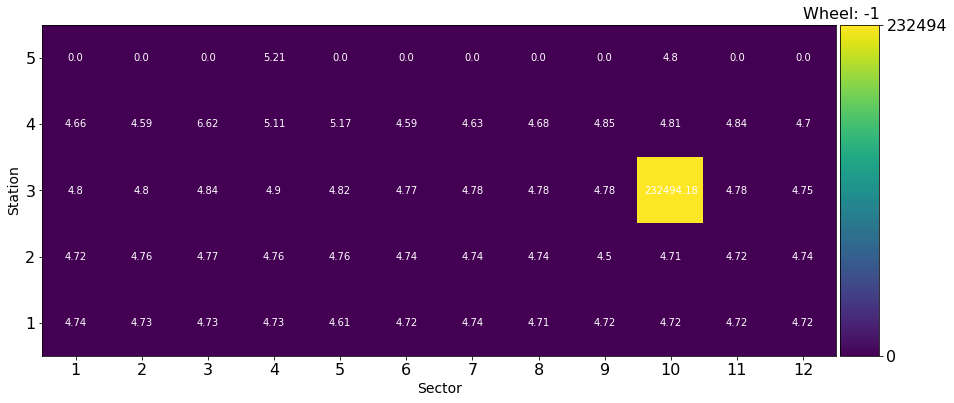

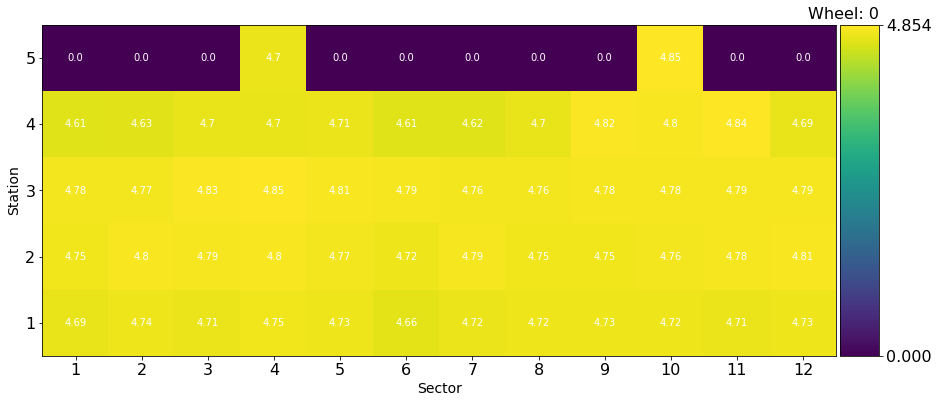

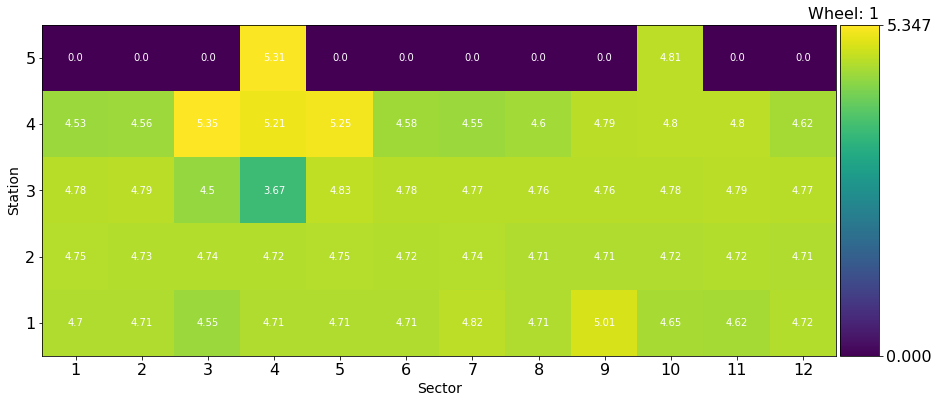

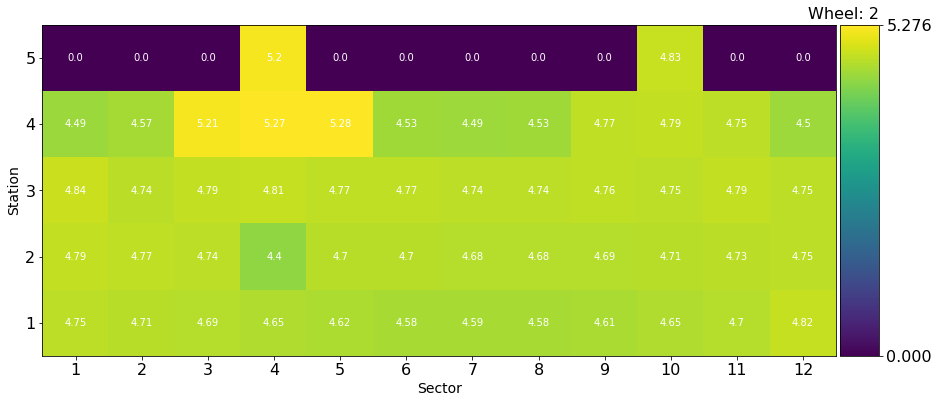

In [227]:
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", -2)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", -1)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", 0)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", +1)
plot_scatter_3(layers_test[layers_test.run == 321312], "CS_red", +2)

In [96]:
#n_cls = 150
#from sklearn import cluster, datasets
#k_means = cluster.KMeans(n_clusters=n_cls)
#distances = k_means.fit_transform(np.vstack(layers_test["content_red"].values))
#layers_test["kmeans_score"] = k_means.labels_

In [173]:
# load the model from disk
from sklearn.externals import joblib
filename = './model_sktlearn/kmeans_red.sav'
k_means = joblib.load(filename)

Removing the lumi oscillations:

In [278]:
rule = (layers_test.run == 321312) & (layers_test.ls > 70)\
#& (layers_test.score == 1)
reduced_anom = layers_test[rule].copy()

In [279]:
distances_test = k_means.transform(np.vstack(reduced_anom["content_red"].values))
minim = []
for i in range(0, len(distances_test)):
    #print  min(distances_test[i])
    minim.append(min(distances_test[i]))
reduced_anom["dist"] = minim

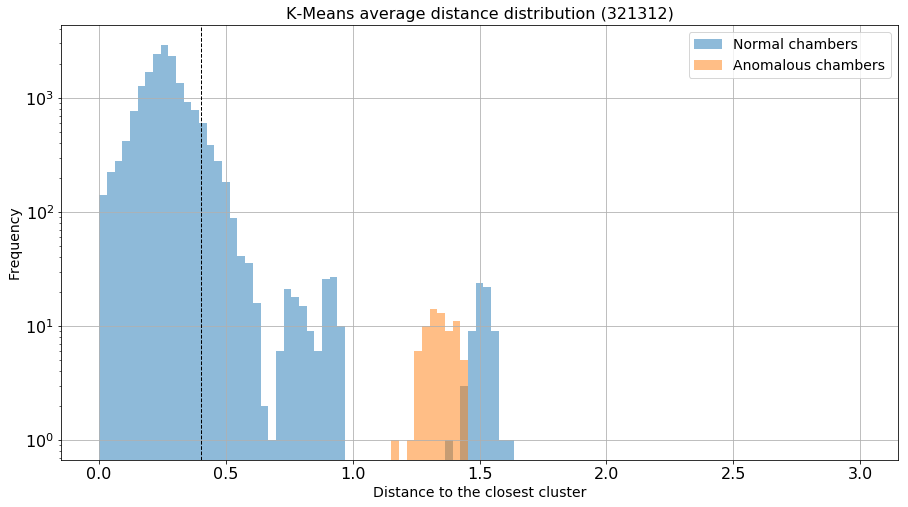

In [280]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 3.0, 100)
plt.hist(reduced_anom[reduced_anom["score"] < 0]["dist"], bins=bins,\
         alpha=0.5, label="Normal chambers")
plt.hist(reduced_anom[reduced_anom["score"] > 0]["dist"], bins=bins,\
         alpha=0.5, label="Anomalous chambers")
plt.axvline(0.4, color='k', linestyle='dashed', linewidth=1)
plt.title("K-Means average distance distribution (321312)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Distance to the closest cluster')
plt.show()

Normalized confusion matrix
[[ 0.89770511  0.10229489]
 [ 0.          1.        ]]


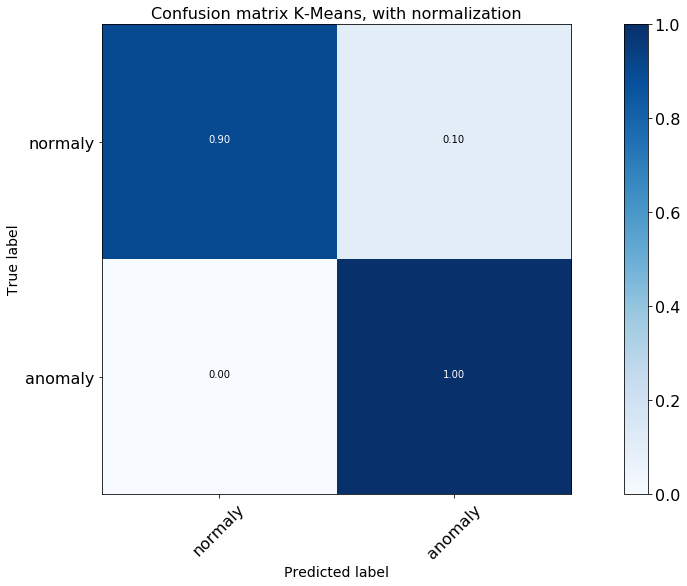

In [281]:
th_km = 0.4
y_pred = 2*(reduced_anom["dist"] > th_km)-1
cnf_matrix = confusion_matrix(reduced_anom["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix K-Means, with normalization')

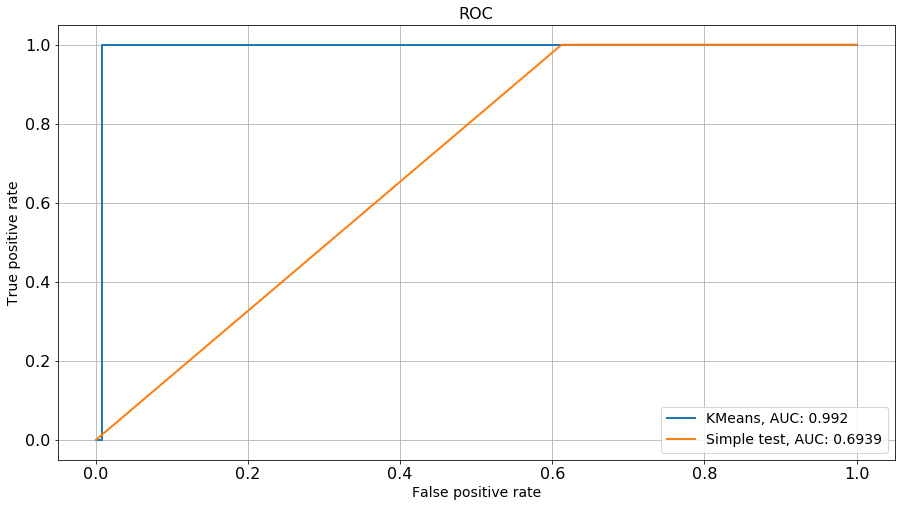

In [282]:
get_roc_curve(reduced_anom,[
                           #("Variance", "variance_score"),
                           #("IF", "if_score"),
                           #("SVM", "svm_score"),
                           #("AE", "cae_score"),
                           ("KMeans", "dist"),
                           #("DNN", "ann_score_4"),
                           ("Simple test", "st_score"),
                          ]
             )

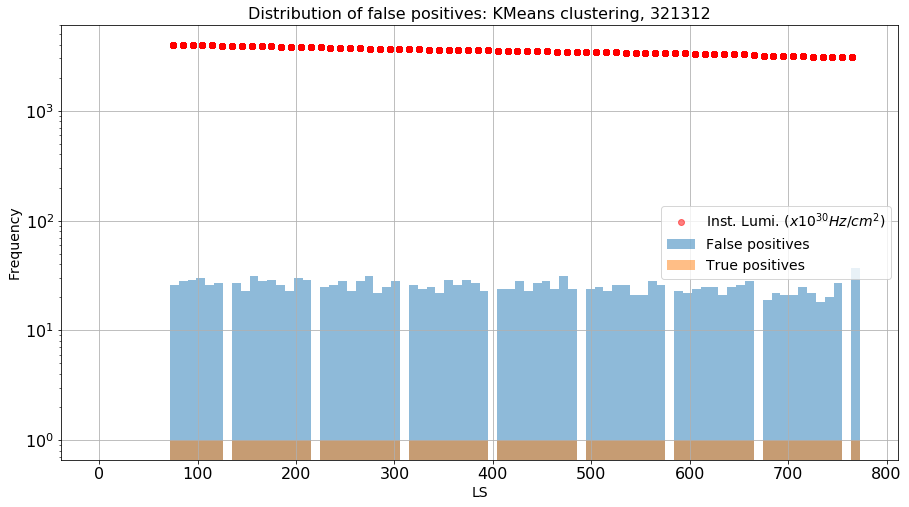

array([  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  26.,  28.,  29.,
        30.,  26.,  27.,   0.,  27.,  23.,  31.,  28.,  29.,  26.,  23.,
        30.,  29.,   0.,  25.,  26.,  28.,  23.,  28.,  31.,  22.,  25.,
        28.,   0.,  26.,  24.,  25.,  22.,  29.,  26.,  29.,  27.,  23.,
         0.,  24.,  24.,  28.,  23.,  27.,  28.,  24.,  31.,  24.,   0.,
        24.,  25.,  23.,  26.,  26.,  21.,  21.,  28.,  26.,   0.,  23.,
        22.,  24.,  25.,  25.,  21.,  25.,  26.,  28.,   0.,  19.,  22.,
        21.,  21.,  25.,  22.,  18.,  20.,  27.,   0.,  37.])

In [283]:
threshold = th_km
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: KMeans clustering, ", reduced_anom, "dist",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

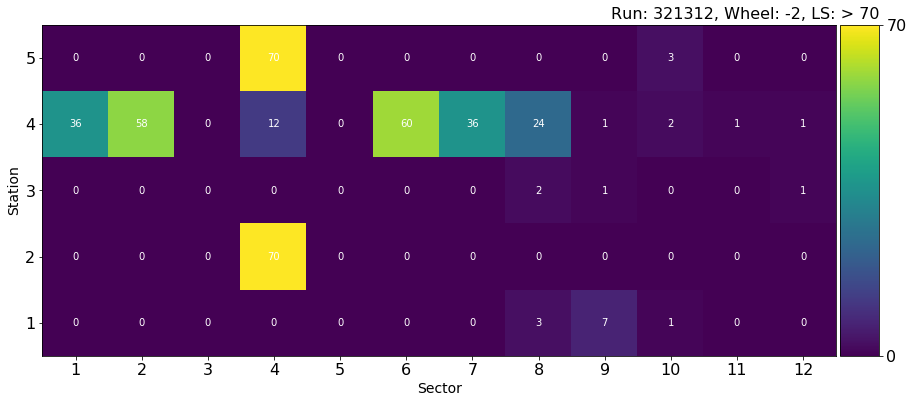

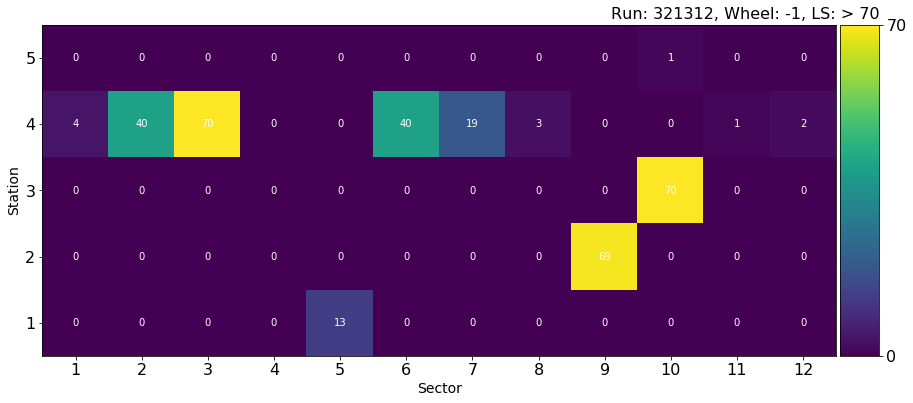

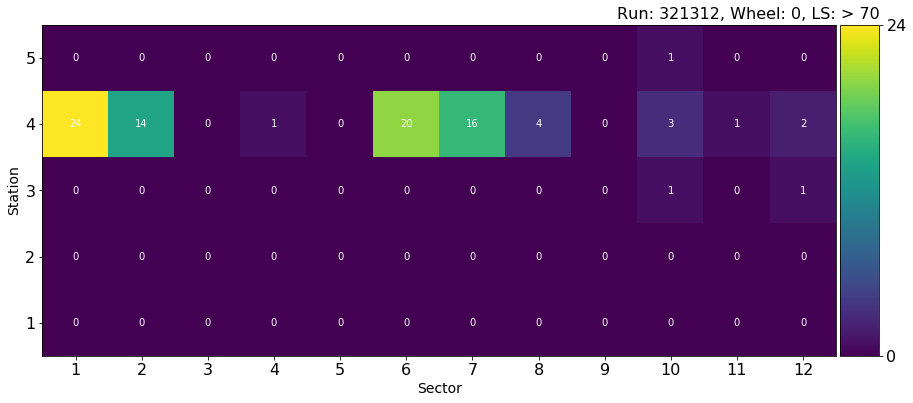

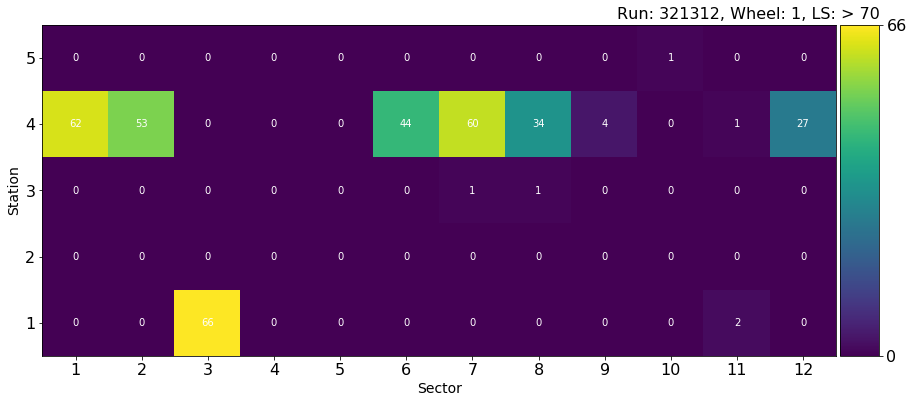

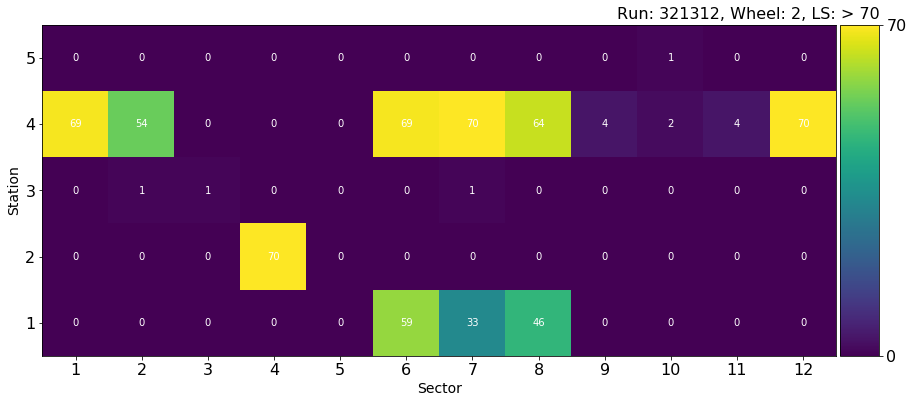

In [284]:
dis_nn = "dist"
rule = (reduced_anom["score"] == -1) & (reduced_anom[dis_nn] > th_km)

plot_scatter(reduced_anom[rule], 321312, -2, 70, -1)
plot_scatter(reduced_anom[rule], 321312, -1, 70, -1)
plot_scatter(reduced_anom[rule], 321312, 0, 70, -1)
plot_scatter(reduced_anom[rule], 321312, +1, 70, -1)
plot_scatter(reduced_anom[rule], 321312, +2, 70, -1)

## LOF reduced

Removing the lumi oscillations:

In [235]:
rule1 = (layers_test.run == 321312) & ((layers_test.ls < 0) | (layers_test.ls > 30))
rule2 = (layers_test.run == 306125) & ((layers_test.ls < 200) | (layers_test.ls > 255)) &\
((layers_test.ls < 2265) | (layers_test.ls > 2315))
reduced_anom_2 = layers_test[rule1 | rule2].copy()

In [236]:
# fit the model
lofclf = LocalOutlierFactor(n_neighbors=1201, contamination=0.2)#It has to be a odd number
reduced_anom_2["lof_score_red"] = -lofclf.fit_predict(np.vstack(reduced_anom_2["content_red"].values))

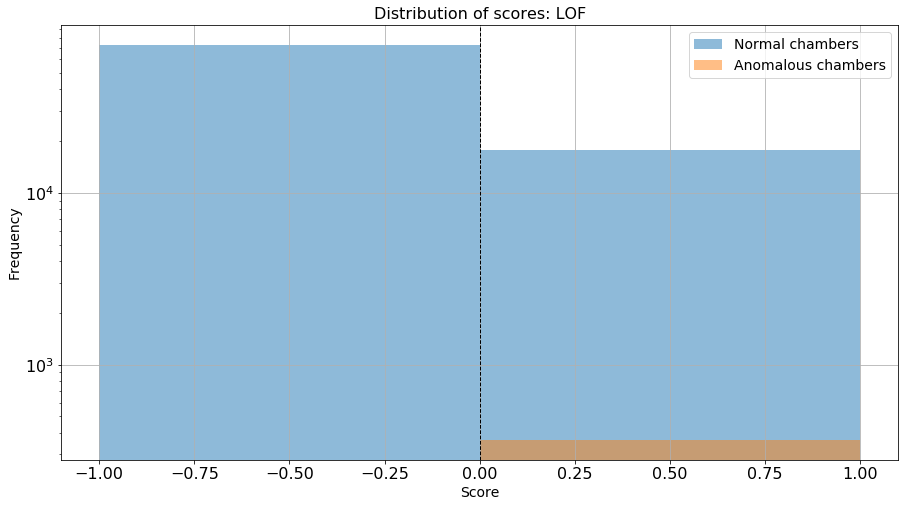

In [237]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(reduced_anom_2[reduced_anom_2["score"] < 0]["lof_score_red"],\
         bins=bins, alpha=0.5, label="Normal chambers")
plt.hist(reduced_anom_2[reduced_anom_2["score"] > 0]["lof_score_red"],\
         bins=bins, alpha=0.5, label="Anomalous chambers")
plt.title("Distribution of scores: LOF")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.0, color='k', linestyle='dashed', linewidth=1)
plt.show()

Normalized confusion matrix
[[ 0.80321285  0.19678715]
 [ 0.          1.        ]]


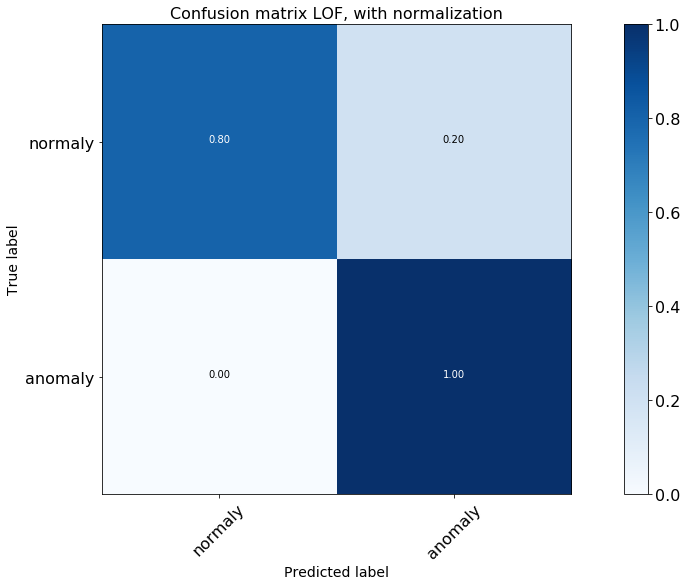

In [238]:
threshold = 0.0
y_pred = 2*(reduced_anom_2["lof_score_red"] > threshold)-1
cnf_matrix = confusion_matrix(reduced_anom_2["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

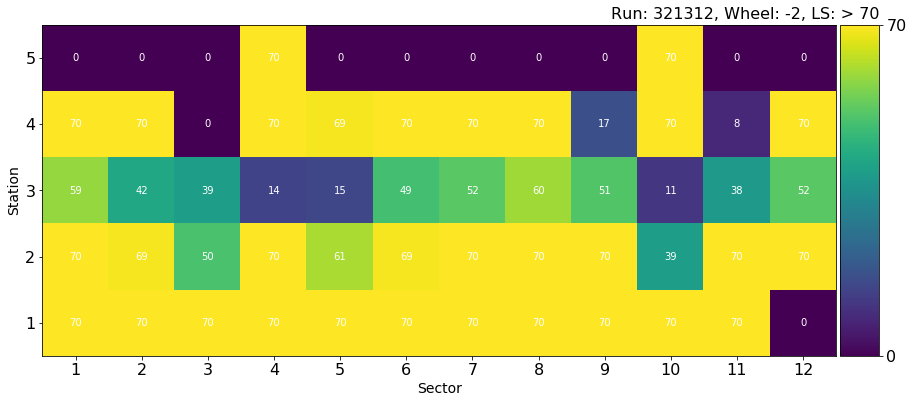

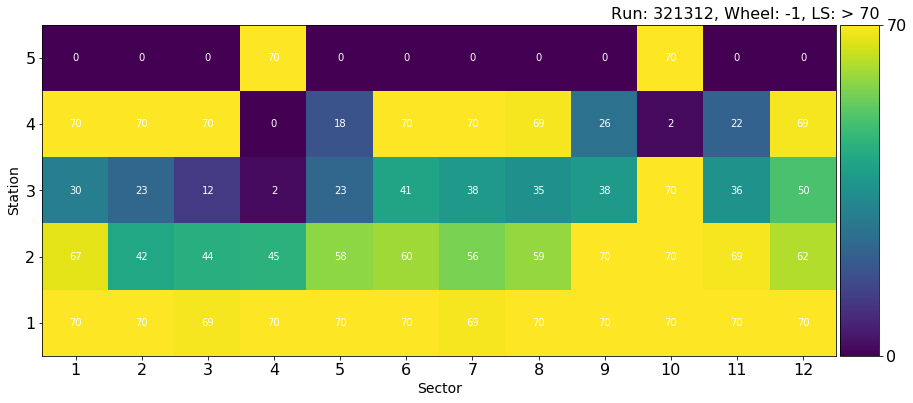

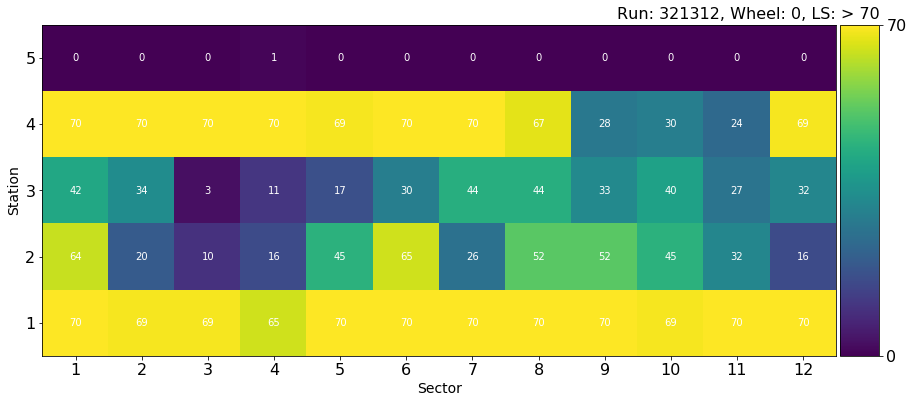

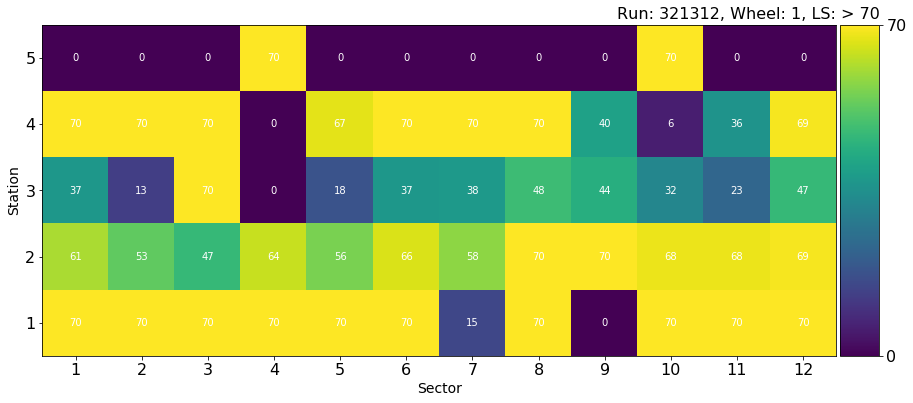

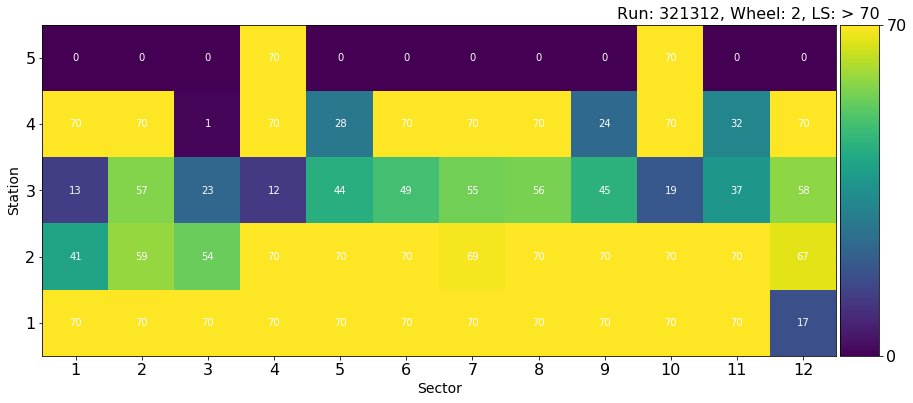

In [239]:
dis_nn = "lof_score_red"
rule = (reduced_anom_2["score"] == -1) & (reduced_anom_2[dis_nn] > th_km)

plot_scatter(reduced_anom_2[rule], 321312, -2, 70, -1)
plot_scatter(reduced_anom_2[rule], 321312, -1, 70, -1)
plot_scatter(reduced_anom_2[rule], 321312, 0, 70, -1)
plot_scatter(reduced_anom_2[rule], 321312, +1, 70, -1)
plot_scatter(reduced_anom_2[rule], 321312, +2, 70, -1)

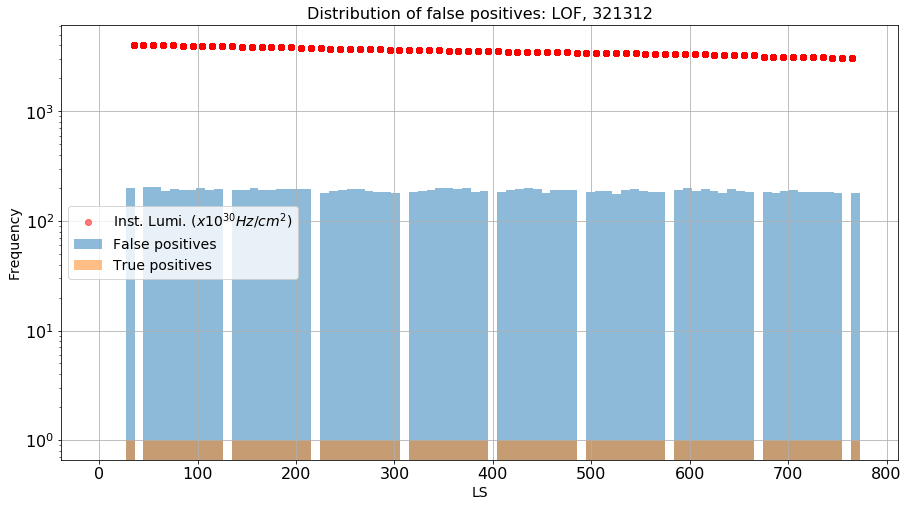

array([   0.,    0.,    0.,  200.,    0.,  206.,  205.,  186.,  196.,
        190.,  192.,  198.,  192.,  197.,    0.,  193.,  192.,  202.,
        191.,  193.,  194.,  194.,  197.,  197.,    0.,  181.,  189.,
        192.,  195.,  194.,  188.,  184.,  183.,  179.,    0.,  185.,
        186.,  191.,  202.,  198.,  196.,  199.,  183.,  186.,    0.,
        183.,  191.,  194.,  200.,  197.,  180.,  192.,  191.,  191.,
          0.,  184.,  186.,  188.,  178.,  192.,  195.,  189.,  183.,
        185.,    0.,  191.,  200.,  186.,  197.,  188.,  180.,  194.,
        187.,  183.,    0.,  182.,  180.,  187.,  192.,  183.,  184.,
        182.,  185.,  179.,    0.,  180.])

In [240]:
reduced_anom_2["averageLS"] = reduced_anom_2["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(321312, 0, 0, 0, "Distribution of false positives: LOF, ", reduced_anom_2, "lof_score_red",\
           threshold, True, boundaries[boundaries["run"] == 321312]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])